<a href="https://colab.research.google.com/github/gracekrahm/antennae-dense-gas/blob/main/antennae_dense_gas_analysis.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Imports and Loading Data

In [452]:
from google.colab import drive
drive.mount('/content/drive')
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from io import BytesIO
import requests
from scipy.optimize import curve_fit

c_13co = 'turquoise'
c_hco32 = 'violet'
c_hcn32 = 'gold'
c_12co = 'cornflowerblue'

m_13co = 'o'
m_hco32 = 'v'
m_hcn32 = '*'
m_12co = 's'


m_13co_30dor = '^'
m_12co_30dor = 'X'

m_henize = '*'
m_253 = 's'


c_co='seagreen'
m_co='X'

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [453]:
import astropy.units as u
freq = 5*u.GHz
equiv = u.brightness_temperature(freq)
(1*u.Jy/(u.arcsec**2)).to(u.K,equivalencies=equiv)

<Quantity 55390.89534546 K>

In [454]:
stype = 'clump' #'dendro
if stype == 'clump':
  anturl = 'https://github.com/gracekrahm/antennae-dense-gas/blob/b94899ed4f638534c2fc45439a2a875897fb109a/clump_props.csv?raw=True'
elif stype == 'dendro':
  anturl = 'https://github.com/gracekrahm/antennae-dense-gas/blob/c31403d2abcdde428a54bd05585113e66d27fd87/dendro_props.csv?raw=True'

#anturl = 'https://github.com/gracekrahm/antennae-dense-gas/blob/475f4375bec17c20f8d0125ac2adb3dad2ed61d7/clump_co_3sig8pkmin_props.csv?raw=True'
anturl = 'https://github.com/gracekrahm/antennae-dense-gas/blob/main/clump_co_6sig8pkmin_props_all_lines.csv?raw=True'
#anturl = 'https://github.com/gracekrahm/antennae-dense-gas/blob/main/clump_13co_6sig8pkmin_props.csv?raw=True'
ext = '/content/drive/MyDrive/Antennae Dense Gas/'
antdf = pd.read_csv(anturl)
#antdf=antdf.dropna()
'''antdf = antdf[antdf['LHCN'] >= 0]
antdf = antdf[antdf['LCO'] >= 0]
antdf.dropna(thresh=2)'''
'''antdf['LHCN'] = antdf['LHCN'].apply(lambda x: x if x>0 else 0)
antdf['LHCNerr'] = antdf['LHCNerr'].apply(lambda x: x if x>0 else 0)'''
#antdf['LHCN']=antdf['LHCN'][antdf['LHCN'] < 0] = 0
#num = antdf._get_numeric_data()
#num[num < 0] = 0

henizedf = pd.read_csv(ext+'johnson_2018_henize.csv')
ngc253df = pd.read_csv('/content/drive/MyDrive/Antennae Dense Gas/meier_2015_ngc253.csv')
psdf = pd.read_csv(ext+'french_2018_poststarburst.csv')
mrdf = pd.read_csv(ext+'junko_2021_merger_remnants.csv')
m82df = pd.read_csv(ext+'kepley_2014_m82_from_kelsey_plot.csv')
ngc253leroydf = pd.read_csv(ext+'leroy_2015_ngcc253_fromkelseypaper.csv')
m31df = pd.read_csv(ext + 'brouillet_2005_m31.csv') #https://www.aanda.org/articles/aa/pdf/2005/01/aa0354-03.pdf
m31df = m31df.dropna(thresh=4, axis=1)
m31df = m31df.dropna()
henizedf['Mass'] = np.array([3.5,5.5,5.8,6.5,4.1,1.9,4.6,5.9,4.3,5.7,6.8,4.3,4.6,6.5,3.4,6.1,8.8,8.2,5.4,5.3,3.5])*10**6
#henizedf
henizedf


,ID,R.A.,Decl.,LCO,LCOerr,LHCO,LHCOerr,LHCN,LHCNerr,LHNC,...,LCCH,LCCHerr,mass,vel_dispCO,vel_dispCOerr,vel_dispHCN,vel_dispHCNerr,vel_dispHCO,vel+dispHCOerr,Mass
0,A,8^h36^m14.s99,-26^d24^m34.s4,87.6,17.5,9.0,1.8,4.8,1.0,$\lt 1.2$,...,2.9,0.7,3500000,17.1,3.4,14.4,2.9,18.5,3.7,3500000.0
1,B,8^h36^m15.s02,-26^d24^m33.s5,137.3,27.5,10.3,2.1,4.2,0.8,1.4,...,3.4,1.0,5500000,15.6,3.1,15.6,3.1,16.6,3.3,5500000.0
2,C,8^h36^m15.s10,-26^d24^m34.s2,142.9,28.6,12.5,2.5,4.2,0.8,2.1,...,5.5,1.1,5800000,20.4,4.1,19.2,3.8,20.5,4.1,5800000.0
3,D,8^h36^m15.s12,-26^d24^m37.s4,157.9,31.6,6.8,1.4,3.9,0.8,1.5,...,2.3,0.5,6500000,15.0,3.0,17.7,3.5,14.4,2.9,6500000.0
4,E,8^h36^m15.s22,-26^d24^m34.s4,102.4,20.5,12.3,2.5,3.6,0.7,2.8,...,1.4,0.6,4100000,17.4,3.5,13.3,2.7,17.1,3.4,4100000.0
5,F,8^h36^m15.s22,-26^d24^m33.s1,114.4,22.9,10.1,2.0,4.6,0.9,2,...,1.4,0.3,1900000,15.7,3.1,14.8,3.0,15.8,3.2,1900000.0
6,G,8^h36^m15.s27,-26^d24^m36.s9,106.7,21.3,5.6,1.1,2.0,0.4,1.3,...,1.3,0.4,4600000,21.8,4.4,NaN,NaN,NaN,NaN,4600000.0
7,H,8^h36^m15.s27,-26^d24^m32.s0,148.3,29.7,11.8,2.4,3.1,0.6,1.9,...,1.1,0.3,5900000,16.3,3.3,17.4,3.5,24.7,4.9,5900000.0
8,I,8^h36^m15.s30,-26^d24^m30.s7,107.1,21.4,4.8,1.0,1.8,0.4,$\lt 1.2$,...,1.5,0.3,4300000,12.3,2.5,NaN,NaN,14.8,3.0,4300000.0
9,J,8^h36^m15.s32,-26^d24^m33.s7,141.3,28.3,7.9,1.6,2.4,0.5,2.4,...,3.8,1.0,5700000,18.3,3.7,13.4,2.7,14.8,3.0,5700000.0


ask kelsey how she got the LCO from leroy 2015 (published table only has hcn and hco+)

would love to use https://iopscience.iop.org/article/10.3847/2041-8205/822/2/L26 for m51 but no table


possible post starburst data sets from https://arxiv.org/pdf/2204.07465.pdf

need to make table for galactic centers https://arxiv.org/pdf/2212.00814.pdf
no MRT available


apex survey https://arxiv.org/pdf/2207.13724.pdf


In [455]:
!pip install error_propagation
from error_propagation import Complex


In [456]:
def make_complex(df, line):
  linelist = [x for x in df[line]]
  errlist = [x for x in df[line+'err']]
  complexlist = []
  for i in range(len(linelist)):
    complexlist.append(Complex(linelist[i],errlist[i]))
  return complexlist
def div_error_prop(df, line1, line2):
  tempdf = df
  tempdf['line1_complex'] = make_complex(df, line1)
  tempdf['line2_complex'] = make_complex(df, line2)
  div = tempdf.line1_complex/tempdf.line2_complex
  t = [str(x) for x in div]
  x = 1
  y = 2
  df[[line1+'/'+line2,line1+'/'+line2+'err']] = pd.DataFrame([x.split(' ± ') for x in t])
  df[line1+'/'+line2] = df[line1+'/'+line2].apply(lambda x: float(x))
  df[line1+'/'+line2+'err'] = df[line1+'/'+line2+'err'].apply(lambda x: float(x))
div_error_prop(antdf, 'LCO', 'LHCO')
div_error_prop(antdf, 'LHCN', 'LHCO')
div_error_prop(henizedf, 'LCO', 'LHCO')
div_error_prop(henizedf, 'LHCN', 'LHCO')
del henizedf['line1_complex']
del henizedf['line2_complex']
del antdf['line1_complex']
del antdf['line2_complex']


# Line Strength Ratios

In [457]:
co21_to_co10 = [1/1.06, 1/1.04, 1/1.1]
lr = np.nanmean(co21_to_co10)
R21 = .65

In [458]:

CO_HCO = []
HCN_HCO = []
for i in [antdf, henizedf, ngc253df, ngc253leroydf, m82df,m31df]:
  i = i.dropna()
  cols = i.columns
  for j in cols:
    if '/' in j and 'CO' in j:
      individ = False
      try:
        CO_HCO_v = i['LCO/LHCO']
        HCN_HCO_v = i['LHCN/LHCO']
      except:
        CO_HCO_v=i['CO/HCO+']
        CO_HCO_v=i['HCN/HCO+']
  lhcn = [x for x in HCN_HCO_v]
  lco = [x for x in CO_HCO_v]
  lco = lco[:len(lhcn)]
  tdf = pd.DataFrame({'CO/HCO':lco, 'HCN/HCO':lhcn})
  tdf = tdf.dropna()
  CO_HCO.append([x for x in lco])
  HCN_HCO.append([x for x in lhcn])

CO_HCO = [item for sublist in CO_HCO for item in sublist]
HCN_HCO = [item for sublist in HCN_HCO for item in sublist]


fitdf = pd.DataFrame({'LCO/LHCO':CO_HCO, 'LHCN/LHCO':HCN_HCO})
#sol, cov = curve_fit(exponential_fit, fitdf['LCO/LHCO'], fitdf['LHCN/LHCO'])

In [459]:
antdf

,ncl,cltype,LCO,LCOerr,LHCO,LHCOerr,LHCN,LHCNerr,vel_dispCO,vel_dispCOerr,...,vel_dispHCN43,vel_dispHCN43err,L13CO,L13COerr,vel_disp13CO,vel_disp13COerr,LCO/LHCO,LCO/LHCOerr,LHCN/LHCO,LHCN/LHCOerr
0,1,2,1174000.0,117900.0,51940.0,5704.0,18110.0,2943.0,22.130,0.27090,...,0.1511,89.76000,149100.0,15090.0,20.930,0.22410,22.603003,3.363641,0.348672,0.068386
1,2,2,1092000.0,109700.0,61860.0,6591.0,27280.0,3579.0,17.820,0.22670,...,NaN,NaN,194200.0,19550.0,16.800,0.18230,17.652764,2.585034,0.440996,0.074533
2,3,2,957700.0,96180.0,39270.0,4420.0,15290.0,2542.0,19.610,0.25980,...,NaN,NaN,156000.0,15730.0,18.920,0.19110,24.387573,3.678745,0.389356,0.078171
3,4,2,949700.0,95530.0,40150.0,4618.0,24280.0,3340.0,24.700,0.41570,...,NaN,NaN,187700.0,18910.0,23.250,0.29570,23.653798,3.614280,0.604732,0.108435
4,5,2,648700.0,65320.0,23640.0,2938.0,9728.0,1992.0,15.850,0.21970,...,NaN,NaN,104700.0,10610.0,15.410,0.20160,27.440778,4.389234,0.411506,0.098570
5,6,2,242200.0,24790.0,9549.0,1537.0,NaN,NaN,15.380,0.21920,...,NaN,NaN,35530.0,3749.0,14.730,0.19360,25.363912,4.838070,NaN,NaN
6,7,2,93550.0,10530.0,4248.0,1045.0,3648.0,1059.0,10.190,0.15130,...,NaN,NaN,28130.0,3015.0,9.867,0.12630,22.022128,5.957580,0.858757,0.326765
7,8,2,324700.0,33330.0,NaN,NaN,NaN,NaN,16.820,0.23830,...,NaN,NaN,48660.0,5149.0,16.750,0.23030,NaN,NaN,NaN,NaN
8,9,2,135900.0,14530.0,NaN,NaN,NaN,NaN,9.332,0.13020,...,NaN,NaN,26190.0,2863.0,9.210,0.12120,NaN,NaN,NaN,NaN
9,10,2,253900.0,26160.0,8816.0,1505.0,3752.0,1264.0,11.720,0.17100,...,NaN,NaN,73590.0,7495.0,11.120,0.13340,28.799909,5.742563,0.425590,0.160733


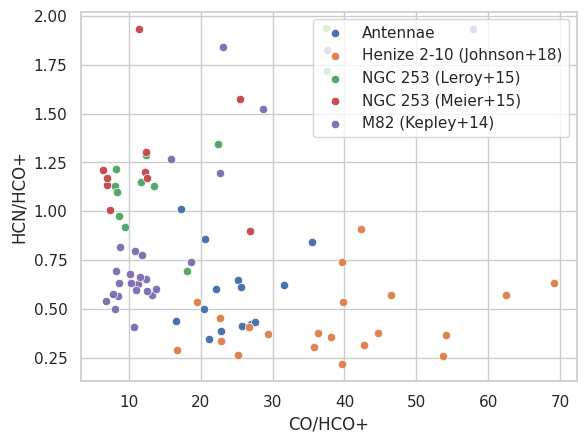

In [460]:
antdf = antdf[antdf['LCO/LHCO'] >= 1]
fig, ax = plt.subplots()
sns.scatterplot(data=antdf, x=lr*antdf['LCO/LHCO'], y=antdf['LHCN/LHCO'], label='Antennae')
#sns.scatterplot(data=antdf, x=lr*antdf.LCO/antdf.LHCO, y=antdf.LHCN/antdf.LHCO, label='Antennae')
sns.scatterplot(data=henizedf, x=2*henizedf.LCO/henizedf.LHCO, y=henizedf.LHCN/henizedf.LHCO, label='Henize 2-10 (Johnson+18)')
sns.scatterplot(data=ngc253leroydf, x=ngc253leroydf['CO/HCO+'], y=ngc253leroydf['HCN/HCO+'], label='NGC 253 (Leroy+15)')
sns.scatterplot(data=ngc253df, x=ngc253df['CO(1-0)']/ngc253df['HCO+(1-0)'], y=ngc253df['HCN(1-0)']/ngc253df['HCO+(1-0)'], label='NGC 253 (Meier+15)')
#sns.scatterplot(data=psdf, x=psdf.LCO/psdf['LHCO+'], y=psdf.LHCN/psdf['LHCO+'], label='Post-Starburst')
#sns.scatterplot(data=mrdf, x=mrdf.LCO/mrdf.LHCO, y=mrdf.LHCN/mrdf.LHCO, label='Merger Remnants (Junko+21)')
sns.scatterplot(data=m82df, x=m82df['CO/HCO+'], y=m82df['HCN/HCO+'], label='M82 (Kepley+14)')
#plt.errorbar(x=lr*antdf.LCO/antdf.LHCO, y=antdf.LHCN/antdf.LHCO, yerr=antdf.LHCNerr/antdf.LHCOerr, xerr=antdf.LCOerr/antdf.LHCOerr, ls='none', elinewidth=.25)
#####plt.errorbar(x=lr*antdf['LCO/LHCO'], y=antdf['LHCN/LHCO'], yerr=antdf['LHCN/LHCOerr'], xerr=lr*antdf['LCO/LHCOerr'], ls='none', elinewidth=1)
#plt.errorbar(x=henizedf['LCO/LHCO'], y=henizedf['LHCN/LHCO'], yerr=henizedf['LHCN/LHCOerr'], xerr=henizedf['LCO/LHCOerr'], ls='none', elinewidth=1)
#sns.scatterplot(data=m31df, x=m31df['CO']/m31df['HCO+'], y=m31df['HCN']/m31df['HCO+'], label='M31 (Brouillet+05)')
plt.xlabel('CO/HCO+')
plt.ylabel('HCN/HCO+')
plt.legend(loc='upper right')
#ax.set_xscale('log', basex=2)
#ax.set_xscale('symlog', basex=2)
#ax.set_xlim([5,100])
#model = list(np.arange(20))
#sns.lineplot(x=model, y=[sol[0]*np.exp(-x*sol[1])+sol[2] for x in model])
#plt.legend()
#the firecracker is ncl 23

just ask amanda kepley for m82 table

graph digitize it

In [461]:
#problem ncls for hcn clumps
#71, 89,116
'''for i in antdf['LCO']/antdf['LHCO']:
  print(i)'''

"for i in antdf['LCO']/antdf['LHCO']:\n  print(i)"

In [462]:
'''antdf['LCO/LHCO'][antdf['LCO/LHCO']<1]
antdf.loc[106]'''
#ncl 108 not good either

"antdf['LCO/LHCO'][antdf['LCO/LHCO']<1]\nantdf.loc[106]"

In [463]:
ngc253leroydf

,CO/HCO+,HCN/HCO+
0,8.022835,1.130702
1,8.181098,1.217962
2,8.391901,1.099618
3,8.600641,0.977803
4,9.519929,0.920537
5,11.681926,1.149913
6,12.368231,1.289380
7,13.542403,1.129945
8,18.085278,0.694561
9,22.433455,1.345948


# velocity dispersion

In [464]:
def fit_line(vdx, slope):
  return slope*vdx

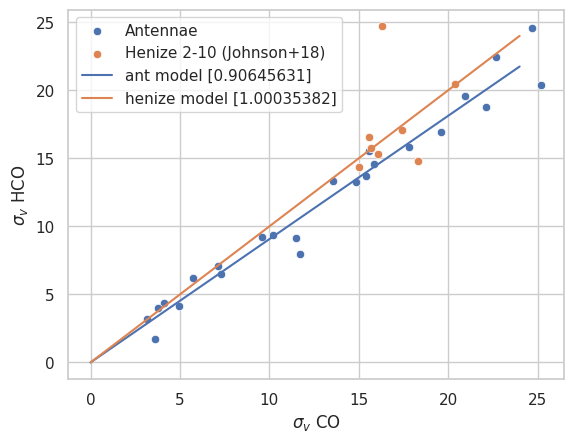

In [465]:
antsol, antcov = curve_fit(fit_line, antdf['vel_dispCO'], antdf['vel_dispHCO'])
henizedf = henizedf.dropna()
henizesol, henizecov = curve_fit(fit_line, henizedf['vel_dispCO'], henizedf['vel_dispHCO'])
model = np.arange(25)
antymodel = antsol*model
henizeymodel = henizesol*model
fig, ax = plt.subplots()
sns.scatterplot(data=antdf, x='vel_dispCO', y='vel_dispHCO', label='Antennae')
sns.scatterplot(data=henizedf, x='vel_dispCO', y='vel_dispHCO', label='Henize 2-10 (Johnson+18)')
sns.lineplot(x=model, y=antymodel, label='ant model '+str(antsol))
sns.lineplot(x=model, y=henizeymodel, label='henize model '+str(henizesol))
plt.xlabel('$\sigma_{v}$ CO')
plt.ylabel('$\sigma_{v}$ HCO')
plt.legend(loc='upper left')

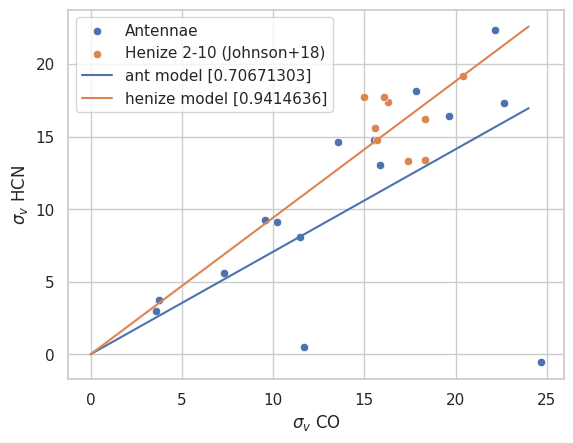

In [466]:
#antdf=antdf.dropna()
fitantdf = antdf.dropna(subset=['vel_dispHCN'])
antsol, antcov = curve_fit(fit_line, fitantdf['vel_dispCO'], fitantdf['vel_dispHCN'])
henizedf = henizedf.dropna()
henizesol, henizecov = curve_fit(fit_line, henizedf['vel_dispCO'], henizedf['vel_dispHCN'])
antymodel = antsol*model
henizeymodel = henizesol*model
fig, ax = plt.subplots()
sns.scatterplot(data=antdf, x='vel_dispCO', y='vel_dispHCN', label='Antennae')
sns.scatterplot(data=henizedf, x='vel_dispCO', y='vel_dispHCN', label='Henize 2-10 (Johnson+18)')
sns.lineplot(x=model, y=antymodel, label='ant model '+str(antsol))
sns.lineplot(x=model, y=henizeymodel, label='henize model '+str(henizesol))
plt.xlabel('$\sigma_{v}$ CO')
plt.ylabel('$\sigma_{v}$ HCN')
plt.legend(loc='upper left')

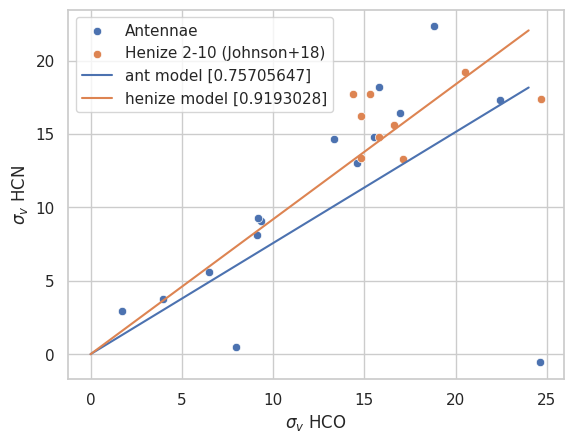

In [467]:
fitantdf = antdf.dropna(subset=['vel_dispHCO', 'vel_dispHCN'])
antsol, antcov = curve_fit(fit_line, fitantdf['vel_dispHCO'], fitantdf['vel_dispHCN'])
henizedf = henizedf.dropna()
henizesol, henizecov = curve_fit(fit_line, henizedf['vel_dispHCO'], henizedf['vel_dispHCN'])
antymodel = antsol*model
henizeymodel = henizesol*model
fig, ax = plt.subplots()
sns.scatterplot(data=antdf, x='vel_dispHCO', y='vel_dispHCN', label='Antennae')
sns.scatterplot(data=henizedf, x='vel_dispHCO', y='vel_dispHCN', label='Henize 2-10 (Johnson+18)')
sns.lineplot(x=model, y=antymodel, label='ant model '+str(antsol))
sns.lineplot(x=model, y=henizeymodel, label='henize model '+str(henizesol))
plt.xlabel('$\sigma_{v}$ HCO')
plt.ylabel('$\sigma_{v}$ HCN')
plt.legend(loc='upper left')

# All lines with respect to 12CO

Luminosity

In [468]:
# manage data and fit
import pandas as pd
import numpy as np

# scipy ODR : orthogonal distance regression
from scipy.odr import ODR, Model, Data, RealData

# style and notebook integration of the plots
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline
sns.set(style="whitegrid")
#odr


def func(beta, x):
    beta[1] = 1
    y = beta[0]*x**beta[1]
    return y

modelrange = np.arange(0,10**8,1000)
def try_fitline_odr(df,col,model,xaxis):
  holddf = antdf.dropna(subset=[col])
  #data=RealData(x=holddf.LCO, y=holddf[col], sx=holddf.LCOerr, sy=holddf[col+'err'])
  data=RealData(x=holddf[xaxis], y=holddf[col], sx=holddf[xaxis+'err'], sy=holddf[col+'err'])
  model = Model(func)
  odr = ODR(data, model, beta0=[1.0, 0.0])
  out=odr.run()
  #out.pprint()
  print('a=',out.beta[0], 'b=', out.beta[1])
  return [out.beta[0]*x**out.beta[1] for x in modelrange]

a= 0.16404236966487482 b= 1.0
a= 0.036859505845663415 b= 1.0
a= 0.019772003887819904 b= 1.0


Text(0.5, 1.0, 'Line Strength Ratios ODR')

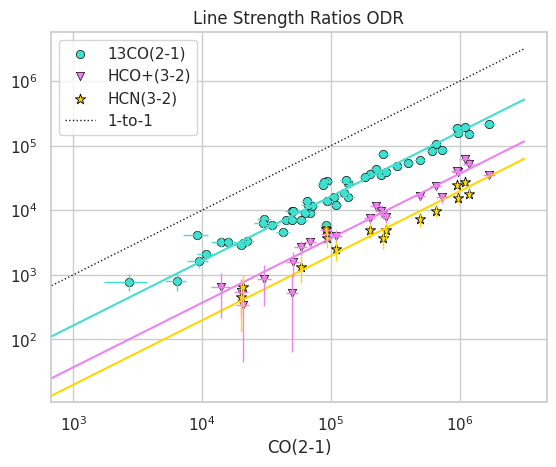

In [469]:
modelrange = np.arange(0,10**6.5,1000)
antdf = pd.read_csv(anturl)
fig, ax = plt.subplots()
sns.scatterplot(data=antdf, x='LCO', y='L13CO', label='13CO(2-1)', color=c_13co,edgecolor="black", marker=m_13co)
sns.scatterplot(data=antdf, x='LCO', y='LHCO', label='HCO+(3-2)', color=c_hco32,edgecolor="black", marker=m_hco32)
sns.scatterplot(data=antdf, x='LCO', y='LHCN', label='HCN(3-2)', color=c_hcn32,edgecolor="black", marker=m_hcn32, s=60)
#sns.scatterplot(data=antdf, x='LCO', y='LHCO43', label='HCO+(4-3)')
#sns.scatterplot(data=antdf, x='LCO', y='LHCN43', label='HCN(4-3)')
sns.lineplot(x=modelrange,y=try_fitline_odr(antdf,col='L13CO',model=modelrange,xaxis='LCO'),color=c_13co)
sns.lineplot(x=modelrange,y=try_fitline_odr(antdf,col='LHCO',model=modelrange,xaxis='LCO'),color=c_hco32)
sns.lineplot(x=modelrange,y=try_fitline_odr(antdf,col='LHCN',model=modelrange,xaxis='LCO'),color=c_hcn32)
sns.lineplot(x=modelrange,y=modelrange,linewidth=1, color='k', label='1-to-1', linestyle='dotted')

plt.errorbar(x=antdf['LCO'], y=antdf['LHCO'], yerr=antdf['LHCOerr'], xerr=antdf['LCOerr'], ls='none', elinewidth=1,color=c_hco32)
plt.errorbar(x=antdf['LCO'], y=antdf['L13CO'], yerr=antdf['L13COerr'], xerr=antdf['LCOerr'], ls='none', elinewidth=1,color=c_13co)
plt.errorbar(x=antdf['LCO'], y=antdf['LHCN'], yerr=antdf['LHCNerr'], xerr=antdf['LHCNerr'], ls='none', elinewidth=1,color=c_hcn32)
'''ax.errorbar(antdf['LCO'], antdf['LHCO'], xerr=antdf['LCO']*.1, yerr=antdf['LHCO']*.1, color='black',linewidth=.5, capsize=1, ls='none')
ax.errorbar(antdf['LCO'], antdf['L13CO'], xerr=antdf['LCO']*.1, yerr=antdf['L13CO']*.1, color='black',linewidth=.5, capsize=1, ls='none')
ax.errorbar(antdf['LCO'], antdf['LHCN'], xerr=antdf['LCO']*.1, yerr=antdf['LHCN']*.1, color='black',linewidth=.5, capsize=1, ls='none')'''
#sns.lineplot(x=modelrange, y=[1*x**1 for x in modelrange], label='test')

#100*np.nanmean(antdf['L13COerr']/antdf['L13CO'])*antdf['L13CO']

'''plt.errorbar(x=antdf['LCO'], y=antdf['LHCO'], yerr=100*np.nanmean(antdf['LHCOerr']/antdf['LHCO'])*antdf['LHCO'], xerr=100*np.nanmean(antdf['LCOerr']/antdf['LCO'])*antdf['LCO'], ls='none', elinewidth=1)
plt.errorbar(x=antdf['LCO'], y=antdf['L13CO'], yerr=100*np.nanmean(antdf['L13COerr']/antdf['L13CO'])*antdf['L13CO'], xerr=100*np.nanmean(antdf['LCOerr']/antdf['LCO'])*antdf['LCO'], ls='none', elinewidth=1)
plt.errorbar(x=antdf['LCO'], y=antdf['LHCN'], yerr=100*np.nanmean(antdf['LHCNerr']/antdf['LHCN'])*antdf['LHCN'], xerr=100*np.nanmean(antdf['LCOerr']/antdf['LCO'])*antdf['LCO'], ls='none', elinewidth=1)'''
ax.set_xscale('log')
ax.set_yscale('log')
plt.xlabel('CO(2-1)')
plt.ylabel('')
plt.title('Line Strength Ratios ODR')

vel disp

In [470]:
def func(beta, x):
    #beta[1] = 1
    beta[0] = 1
    y = beta[0]*x + beta[1]
    return y
#antdf['vel_dispHCNerr']
modelrange = np.arange(0,26,.5)
def try_fitline_odr(df,col,model,xaxis):
  holddf = antdf.dropna(subset=[col])
  #holddf = holddf[holddf[col]>1]
  #data=RealData(x=holddf.LCO, y=holddf[col], sx=holddf.LCOerr, sy=holddf[col+'err'])
  data=RealData(x=holddf[xaxis], y=holddf[col], sx=holddf[xaxis+'err'], sy=holddf[col+'err'])
  model = Model(func)
  odr = ODR(data, model, beta0=[1.0, 0.0])
  out=odr.run()
  #out.pprint()
  print('a=',out.beta[0], 'b=', out.beta[1])
  return [out.beta[0]*x+out.beta[1] for x in modelrange]

a= 1.0 b= -0.10244493622407407
a= 1.0 b= -0.6569622771033065
a= 1.0 b= -2.3519677433628745


Text(0.5, 1.0, 'Velocity Dispersion Ratios')

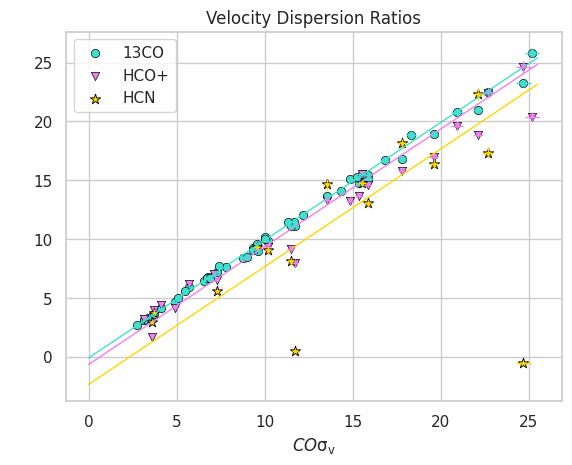

In [471]:
antdf = pd.read_csv(anturl)
modelrange = np.arange(0,26,.5)
#modelrange = np.arange(0,1,1)
fig, ax = plt.subplots()
sns.scatterplot(data=antdf, x='vel_dispCO', y='vel_disp13CO', label='13CO', color=c_13co,edgecolor="black", marker=m_13co)
sns.scatterplot(data=antdf, x='vel_dispCO', y='vel_dispHCO', label='HCO+',color=c_hco32, edgecolor="black",marker=m_hco32)
sns.scatterplot(data=antdf, x='vel_dispCO', y='vel_dispHCN', label='HCN', color=c_hcn32, edgecolor="black",marker=m_hcn32, s=60)
'''sns.scatterplot(data=antdf, x='vel_dispCO', y='vel_dispHCO43', label='HCO+(4-3)')
sns.scatterplot(data=antdf, x='vel_dispCO', y='vel_dispHCN43', label='HCN(4-3)')'''
sns.lineplot(x=modelrange,y=try_fitline_odr(antdf,col='vel_disp13CO',model=modelrange,xaxis='vel_dispCO'), linewidth=1, color=c_13co)
sns.lineplot(x=modelrange,y=try_fitline_odr(antdf,col='vel_dispHCO',model=modelrange,xaxis='vel_dispCO'),linewidth=1, color=c_hco32)
sns.lineplot(x=modelrange,y=try_fitline_odr(antdf,col='vel_dispHCN',model=modelrange,xaxis='vel_dispCO'),linewidth=1, color=c_hcn32)

'''plt.errorbar(x=antdf['vel_dispCO'], y=antdf['vel_dispHCO'], yerr=antdf['vel_dispHCOerr'], xerr=antdf['vel_dispCOerr'], ls='none', elinewidth=1.5,color='black')
plt.errorbar(x=antdf['vel_dispCO'], y=antdf['vel_disp13CO'], yerr=antdf['vel_disp13COerr'], xerr=antdf['vel_dispCOerr'], ls='none', elinewidth=1.5,color='black')
plt.errorbar(x=antdf['vel_dispCO'], y=antdf['vel_dispHCN'], yerr=antdf['vel_dispHCNerr'], xerr=antdf['vel_dispCOerr'], ls='none', elinewidth=1.5,color='black')'''

plt.errorbar(x=antdf['vel_dispCO'], y=antdf['vel_dispHCO'], yerr=antdf['vel_dispHCOerr'], xerr=antdf['vel_dispCOerr'], ls='none', elinewidth=1,color=c_hco32)
plt.errorbar(x=antdf['vel_dispCO'], y=antdf['vel_disp13CO'], yerr=antdf['vel_disp13COerr'], xerr=antdf['vel_dispCOerr'], ls='none', elinewidth=1,color=c_13co)
plt.errorbar(x=antdf['vel_dispCO'], y=antdf['vel_dispHCN'], yerr=antdf['vel_dispHCNerr'], xerr=antdf['vel_dispCOerr'], ls='none', elinewidth=1,color=c_hcn32)
#sns.lineplot(x=modelrange, y=[x for x in modelrange], label='test')
#ax.set_xscale('log')
#ax.set_yscale('log')
plt.xlabel('$CO \mathrm{\sigma_{v}}$')
plt.ylabel(' ')
plt.title('Velocity Dispersion Ratios')

# New vel disp

In [472]:
co_lr = 1/0.781
co_lr = 1/.65
hcn_lr = 1/.528
hco_lr = 1/.484

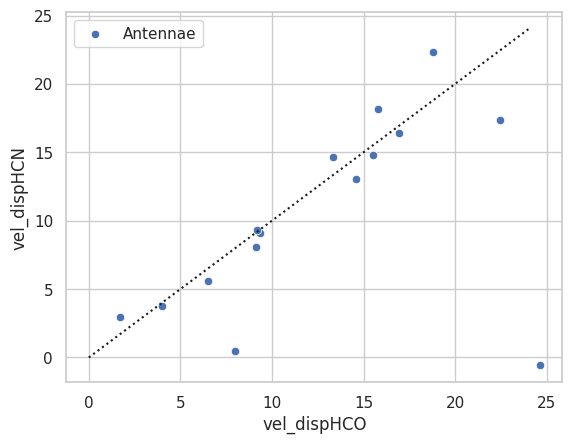

In [473]:
sns.scatterplot(data=antdf, x='vel_dispHCO', y='vel_dispHCN', label='Antennae')
plt.plot(np.arange(25),np.arange(25),color='k',linestyle='dotted')



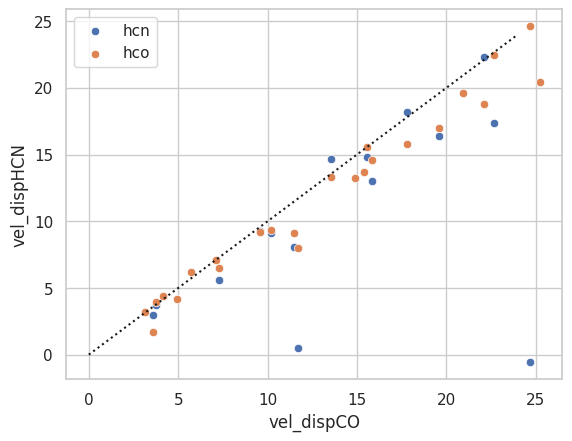

In [474]:
sns.scatterplot(data=antdf, x='vel_dispCO', y='vel_dispHCN', label='hcn')
sns.scatterplot(data=antdf, x='vel_dispCO', y='vel_dispHCO', label='hco')
plt.plot(np.arange(25),np.arange(25),color='k',linestyle='dotted')



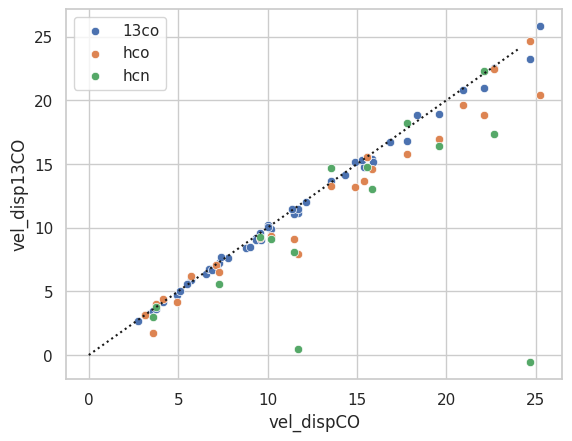

In [475]:
sns.scatterplot(data=antdf, x='vel_dispCO', y='vel_disp13CO', label='13co')
sns.scatterplot(data=antdf, x='vel_dispCO', y='vel_dispHCO', label='hco')
sns.scatterplot(data=antdf, x='vel_dispCO', y='vel_dispHCN', label='hcn')

plt.plot(np.arange(25),np.arange(25),color='k',linestyle='dotted')


In [476]:
c_hcn32='mediumblue'
c_hco32 = c_12co

a= 1.0 b= -0.18211326145618645
a= 1.0 b= -1.1369999895678808
a= 1.0 b= -0.8853916642581038


Text(0.5, 1.0, 'Velocity Dispersion Ratios')

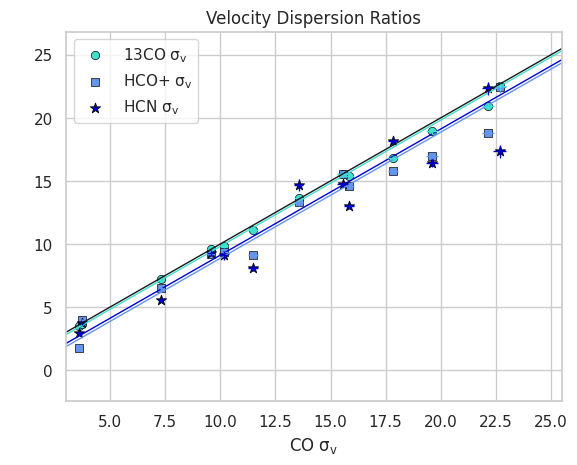

In [477]:
antdf = pd.read_csv(anturl)
antdf = antdf[antdf['vel_dispHCN']>1]
modelrange = np.arange(0,26,.5)
#modelrange = np.arange(0,1,1)



fig, ax = plt.subplots()
sns.scatterplot(data=antdf, x='vel_dispCO', y='vel_disp13CO', label='13CO $\mathrm{\sigma_{v}}$', color=c_13co,edgecolor="black", marker=m_13co)
sns.scatterplot(data=antdf, x='vel_dispCO', y='vel_dispHCO', label='HCO+ $\mathrm{\sigma_{v}}$',color=c_12co, edgecolor="black",marker=m_12co)
sns.scatterplot(data=antdf, x='vel_dispCO', y='vel_dispHCN', label='HCN $\mathrm{\sigma_{v}}$', color=c_hcn32, edgecolor="black",marker=m_hcn32, s=60)
'''sns.scatterplot(data=antdf, x='vel_dispCO', y='vel_dispHCO43', label='HCO+(4-3)')
sns.scatterplot(data=antdf, x='vel_dispCO', y='vel_dispHCN43', label='HCN(4-3)')'''
sns.lineplot(x=modelrange,y=try_fitline_odr(antdf,col='vel_disp13CO',model=modelrange,xaxis='vel_dispCO'), linewidth=1, color=c_13co)
sns.lineplot(x=modelrange,y=try_fitline_odr(antdf,col='vel_dispHCO',model=modelrange,xaxis='vel_dispCO'),linewidth=1, color=c_12co)
sns.lineplot(x=modelrange,y=try_fitline_odr(antdf,col='vel_dispHCN',model=modelrange,xaxis='vel_dispCO'),linewidth=1, color=c_hcn32)

'''plt.errorbar(x=antdf['vel_dispCO'], y=antdf['vel_dispHCO'], yerr=antdf['vel_dispHCOerr'], xerr=antdf['vel_dispCOerr'], ls='none', elinewidth=1.5,color='black')
plt.errorbar(x=antdf['vel_dispCO'], y=antdf['vel_disp13CO'], yerr=antdf['vel_disp13COerr'], xerr=antdf['vel_dispCOerr'], ls='none', elinewidth=1.5,color='black')
plt.errorbar(x=antdf['vel_dispCO'], y=antdf['vel_dispHCN'], yerr=antdf['vel_dispHCNerr'], xerr=antdf['vel_dispCOerr'], ls='none', elinewidth=1.5,color='black')'''

plt.errorbar(x=antdf['vel_dispCO'], y=antdf['vel_dispHCO'], yerr=antdf['vel_dispHCOerr'], xerr=antdf['vel_dispCOerr'], ls='none', elinewidth=1,color=c_hco32)
plt.errorbar(x=antdf['vel_dispCO'], y=antdf['vel_disp13CO'], yerr=antdf['vel_disp13COerr'], xerr=antdf['vel_dispCOerr'], ls='none', elinewidth=1,color=c_13co)
plt.errorbar(x=antdf['vel_dispCO'], y=antdf['vel_dispHCN'], yerr=antdf['vel_dispHCNerr'], xerr=antdf['vel_dispCOerr'], ls='none', elinewidth=1,color=c_hcn32)
sns.lineplot(x=modelrange,y=modelrange,linewidth=1, color='k')
#sns.lineplot(x=modelrange, y=[x for x in modelrange], label='test')
#ax.set_xscale('log')
#ax.set_yscale('log')
plt.xlabel('CO $\mathrm{\sigma_{v}}$')
plt.ylabel(' ')
plt.xlim([3,25.5])
plt.title('Velocity Dispersion Ratios')

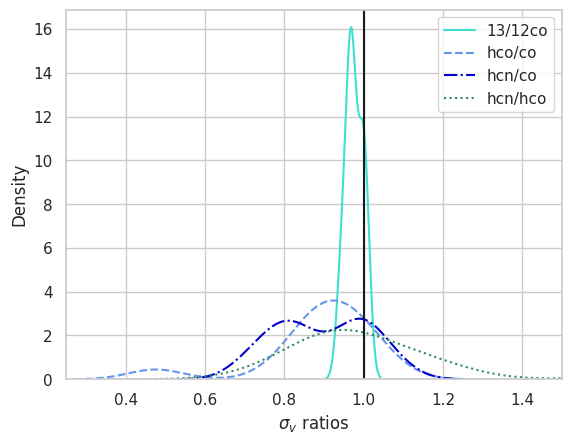

In [478]:
sns.kdeplot(antdf['vel_disp13CO']/antdf['vel_dispCO'],label='13/12co',color=c_13co,linestyle='solid')
sns.kdeplot(antdf['vel_dispHCO']/antdf['vel_dispCO'],label='hco/co',bw_adjust=.8,color=c_12co,linestyle='dashed')
sns.kdeplot(antdf['vel_dispHCN']/antdf['vel_dispCO'],label='hcn/co',bw_adjust=.8,color='mediumblue',linestyle='dashdot')
sns.kdeplot(antdf['vel_dispHCN']/antdf['vel_dispHCO'],label='hcn/hco',bw_adjust=.8,color=c_co,linestyle='dotted')
'''sns.distplot(antdf['vel_disp13CO']/antdf['vel_dispCO'], rug=True, kde=True, norm_hist=True,label='13/12co',hist=False)
sns.distplot(antdf['vel_dispHCO']/antdf['vel_dispCO'], rug=True, kde=True, norm_hist=True,label='hco/co',hist=False)
sns.distplot(antdf['vel_dispHCN']/antdf['vel_dispCO'], rug=True, kde=True, norm_hist=True,label='hcn/co',hist=False)
sns.distplot(antdf['vel_dispHCN']/antdf['vel_dispHCO'], rug=True, kde=True, norm_hist=True,label='hcn/hco',hist=False)'''


plt.axvline(x=1,color='k',linestyle='solid')
plt.xlim([.25,1.5])
plt.xlabel('$\sigma_{v}$ ratios')
plt.legend()


In [479]:
b = 3 #5 for solomon
def fit_line(vdx, slope):
  return slope*vdx**b

def graph(vd,l,color):
  newdf = antdf[[vd,l]].dropna()
  newdf = newdf[newdf[vd]>1]
  vd = newdf[vd]
  l = newdf[l]
  sol, cov = curve_fit(fit_line, vd, l)
  print(sol)
  sns.lineplot(x=np.arange(26),y=sol*np.arange(26)**b,color=color)

def fit_both(vdx,aa,bb):
  return aa*vdx**bb

'''def graph(vd,l):
  newdf = antdf[[vd,l]].dropna()
  newdf = newdf[newdf[vd]>1]
  vd = newdf[vd]
  l = newdf[l]
  sol, cov = curve_fit(fit_both, vd, l)
  print(sol)
  sns.lineplot(x=np.arange(26),y=sol[0]*np.arange(26)**[1])'''

'def graph(vd,l):\n  newdf = antdf[[vd,l]].dropna()\n  newdf = newdf[newdf[vd]>1]\n  vd = newdf[vd]\n  l = newdf[l]\n  sol, cov = curve_fit(fit_both, vd, l)\n  print(sol)\n  sns.lineplot(x=np.arange(26),y=sol[0]*np.arange(26)**[1])'

[93.89247167]
[14.42777165]
[4.51282841]
[2.27599833]


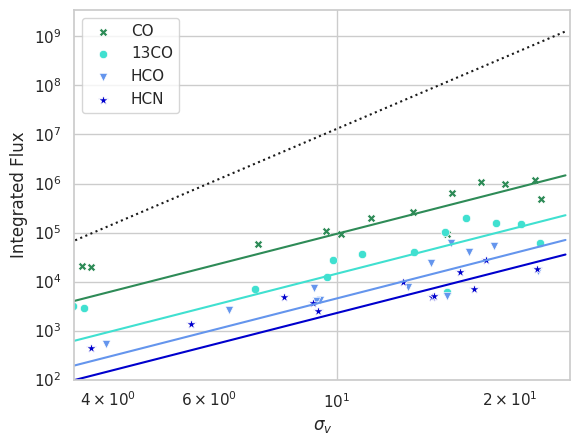

In [480]:
sns.scatterplot(data=antdf, x='vel_dispCO', y='LCO', label='CO',color='seagreen',marker='X')
sns.scatterplot(data=antdf, x='vel_disp13CO', y='L13CO', label='13CO',color=c_13co,marker=m_13co)
sns.scatterplot(data=antdf, x='vel_dispHCO', y='LHCO', label='HCO',color=c_12co,marker=m_hco32)
sns.scatterplot(data=antdf, x='vel_dispHCN', y='LHCN', label='HCN',color='mediumblue',marker=m_hcn32,s=60)
graph('vel_dispCO','LCO','seagreen')
graph('vel_disp13CO','L13CO',c_13co)
graph('vel_dispHCO','LHCO',c_12co)
graph('vel_dispHCN','LHCN','mediumblue')
sns.lineplot(x=np.arange(26),y=130*np.arange(26)**5,color='k', linestyle='dotted')

'''sns.lineplot(x=np.arange(np.nanmax(antdf['vel_dispCO'])),y=)
antsol, antcov = curve_fit(fit_line, fitantdf['vel_dispHCO'], fitantdf['vel_dispHCN'])
antymodel = antsol*model
sns.lineplot(x=model, y=antymodel, label='ant model '+str(antsol))'''
plt.xscale('log')
plt.yscale('log')
plt.xlim([3.5,25.5])
plt.ylim(bottom=10**2)
plt.xlabel('$\sigma_{v}$')
plt.ylabel('Integrated Flux')
plt.legend()
#plt.plot(np.arange(25),np.arange(25),color='k',linestyle='dotted')


In [481]:
np.nanmean(np.arange(26)/(130*np.arange(26)**5))

<ipython-input-481-6963a50d1bac>:1: RuntimeWarning: invalid value encountered in divide
  np.nanmean(np.arange(26)/(130*np.arange(26)**5))


0.00033301635269899083

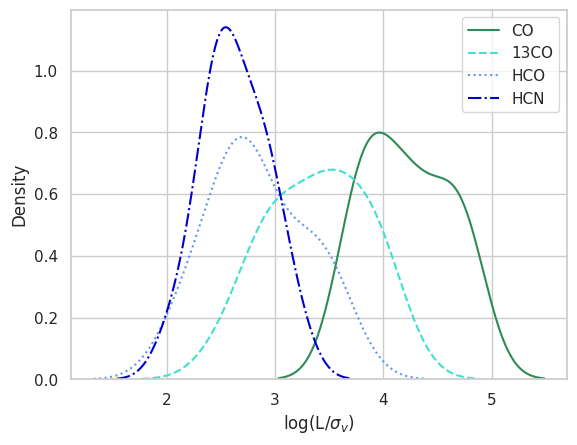

In [482]:
sns.kdeplot(np.log10(antdf['LCO']/antdf['vel_dispCO']),label='CO',color='seagreen',linestyle='solid')
sns.kdeplot(np.log10(antdf['L13CO']/antdf['vel_disp13CO']),label='13CO',color=c_13co,linestyle='dashed')
sns.kdeplot(np.log10(antdf['LHCO']/antdf['vel_dispHCO']),label='HCO',color=c_12co,linestyle='dotted')
sns.kdeplot(np.log10(antdf['LHCN']/antdf['vel_dispHCN']),label='HCN',color='mediumblue',linestyle='dashdot')
#sns.kdeplot(np.log10(np.arange(26)/(130*np.arange(26)**5)),label='solomon')
#plt.axvline(np.log10(.00033301635269899083))
#plt.axvline(np.log10((130*2**5)/2))
plt.xlabel('log(L/$\sigma_{v}$)')
plt.legend()

In [483]:
np.nanmedian(antdf['LHCN']/antdf['vel_dispHCN'])

400.8791208791209

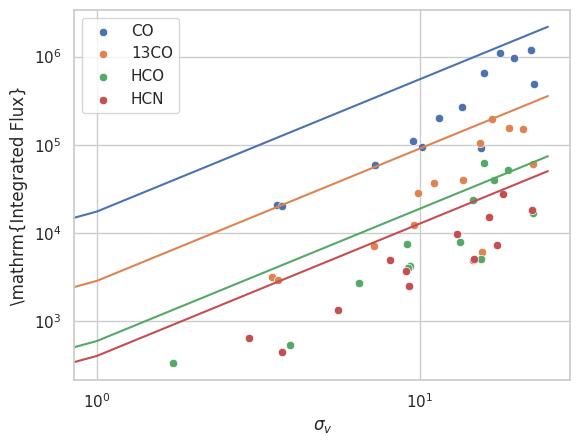

In [484]:
sns.scatterplot(data=antdf, x='vel_dispCO', y='LCO', label='CO')
sns.scatterplot(data=antdf, x='vel_disp13CO', y='L13CO', label='13CO')
sns.scatterplot(data=antdf, x='vel_dispHCO', y='LHCO', label='HCO')
sns.scatterplot(data=antdf, x='vel_dispHCN', y='LHCN', label='HCN')

b = 1.5

sns.lineplot(x=np.arange(26), y=np.nanmedian(antdf['LCO']/antdf['vel_dispCO'])*np.arange(26)**b)
sns.lineplot(x=np.arange(26), y=np.nanmedian(antdf['L13CO']/antdf['vel_disp13CO'])*np.arange(26)**b)
sns.lineplot(x=np.arange(26), y=np.nanmedian(antdf['LHCO']/antdf['vel_dispHCO'])*np.arange(26)**b)
sns.lineplot(x=np.arange(26), y=np.nanmedian(antdf['LHCN']/antdf['vel_dispHCN'])*np.arange(26)**b)

plt.xscale('log')
plt.yscale('log')
#plt.xlim(left=2.5)
plt.xlabel('$\sigma_{v}$')
plt.ylabel('\mathrm{Integrated Flux}')
plt.legend()

In [485]:
modelrange=np.arange(26)
def try_fitline_odr(df,col,model,xaxis):
  holddf = antdf.dropna(subset=[col])
  #data=RealData(x=holddf.LCO, y=holddf[col], sx=holddf.LCOerr, sy=holddf[col+'err'])
  data=RealData(x=holddf[xaxis], y=holddf[col], sx=holddf[xaxis+'err'], sy=holddf[col+'err'])
  model = Model(func)
  odr = ODR(data, model, beta0=[1., 0.0])
  out=odr.run()
  #out.pprint()
  print('a=',out.beta[0], 'b=', out.beta[1])
  #return [out.beta[0]*x**out.beta[1] for x in modelrange]
  return [out.beta[0]*x**2 for x in modelrange]

a= 1.0 b= 32074.406488874414
a= 1.0 b= 4827.918524218798
a= 1.0 b= 1729.7603630601002
a= 1.0 b= 1671.3467280489579


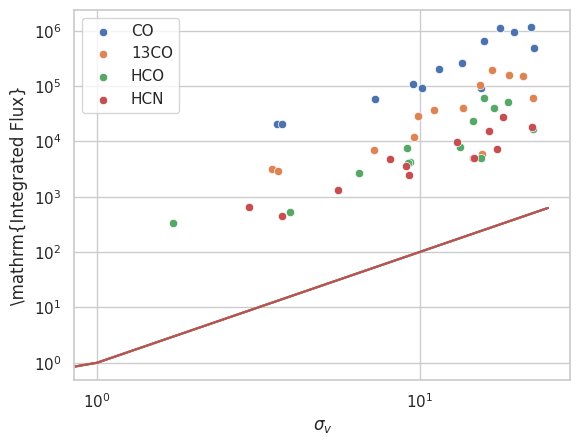

In [486]:
#sns.lineplot(x=modelrange,y=try_fitline_odr(antdf,col='L13CO',model=modelrange,xaxis='LCO'),color=c_13co)
sns.scatterplot(data=antdf, x='vel_dispCO', y='LCO', label='CO')
sns.scatterplot(data=antdf, x='vel_disp13CO', y='L13CO', label='13CO')
sns.scatterplot(data=antdf, x='vel_dispHCO', y='LHCO', label='HCO')
sns.scatterplot(data=antdf, x='vel_dispHCN', y='LHCN', label='HCN')

sns.lineplot(x=modelrange,y=try_fitline_odr(antdf,col='LCO',model=modelrange,xaxis='vel_dispCO'))
sns.lineplot(x=modelrange,y=try_fitline_odr(antdf,col='L13CO',model=modelrange,xaxis='vel_disp13CO'))
sns.lineplot(x=modelrange,y=try_fitline_odr(antdf,col='LHCO',model=modelrange,xaxis='vel_dispHCO'))
sns.lineplot(x=modelrange,y=try_fitline_odr(antdf,col='LHCN',model=modelrange,xaxis='vel_dispHCN'))


plt.xscale('log')
plt.yscale('log')
#plt.xlim(left=2.5)
plt.xlabel('$\sigma_{v}$')
plt.ylabel('\mathrm{Integrated Flux}')
plt.legend()
#plt.plot(np.arange(25),np.arange(25),color='k',linestyle='dotted')


# with respect to HCO+

In [487]:
def func(beta, x):
    beta[1] = 1
    y = beta[0]*x**beta[1]
    return y

modelrange = np.arange(0,10**6.5,1000)
def try_fitline_odr(df,col,model,xaxis):
  holddf = antdf.dropna(subset=[col])
  sol, cov = curve_fit(func,xdata=holddf[xaxis], ydata = holddf[col])
  print('sol ',col,sol)
  #data=RealData(x=holddf.LCO, y=holddf[col], sx=holddf.LCOerr, sy=holddf[col+'err'])
  data=RealData(x=holddf[xaxis], y=holddf[col], sx=holddf[xaxis+'err'], sy=holddf[col+'err'])
  model = Model(func)
  odr = ODR(data, model, beta0=[float(sol),1.0])
  #odr = ODR(data, model, beta0=[0,0])
  out=odr.run()
  #out.pprint()
  print('a=',out.beta[0], 'b=', out.beta[1])
  return [out.beta[0]*x**out.beta[1] for x in modelrange]

In [488]:
'''antdf = pd.read_csv(anturl)
fig, ax = plt.subplots()
sns.scatterplot(data=antdf, x='LHCO', y='LCO', label='12CO(2-1)', color=c_12co, edgecolor="black", marker=m_12co)
sns.scatterplot(data=antdf, x='LHCO', y='L13CO', label='13CO(2-1)', color=c_13co, edgecolor="black",marker=m_13co)
sns.scatterplot(data=antdf, x='LHCO', y='LHCN', label='HCN(3-2)', color=c_hcn32, edgecolor="black",marker=m_hcn32, s=60)
df30dor = pd.read_csv('/content/Default Dataset (1).csv')
sns.scatterplot(data=df30dor, x='HCO(13CO) new', y='13CO new', label='30Dor 13CO', color='magenta', edgecolor="black", marker=m_13co_30dor)
sns.scatterplot(data=df30dor, x='HCO(12CO) new', y='12CO new', label='30Dor 12CO', color='pink', edgecolor="black", marker=m_12co_30dor)

mr = np.arange(1,10**5, 10)
sns.lineplot(x=mr,y=mr,linewidth=1, color='k', label='1-to-1', linestyle='dotted')
#sns.scatterplot(data=antdf, x='LCO', y='LHCO43', label='HCO+(4-3)')
#sns.scatterplot(data=antdf, x='LCO', y='LHCN43', label='HCN(4-3)')
modelrange = np.arange(0,10**5, 1000)'''
'''sns.lineplot(x=modelrange,y=try_fitline_odr(antdf,col='L13CO',model=modelrange,xaxis='LHCO'),color=c_13co)
sns.lineplot(x=modelrange,y=try_fitline_odr(antdf,col='LCO',model=modelrange,xaxis='LHCO'),color=c_12co)
sns.lineplot(x=modelrange,y=try_fitline_odr(antdf,col='LHCN',model=modelrange,xaxis='LHCO'),color=c_hcn32)'''
'''sol, cov = curve_fit(func, df30dor['HCO(13CO) new'], df30dor['13CO new'])
sns.lineplot(x=modelrange,y=[x*float(sol) for x in modelrange],color='pink')
sol, cov = curve_fit(func, df30dor['HCO(12CO) new'].dropna(), df30dor['12CO new'].dropna())
sns.lineplot(x=modelrange,y=[x*float(sol) for x in modelrange],color='magenta')
ax.set_xscale('log')
ax.set_yscale('log')
plt.xlabel('HCO+(3-2)')
plt.ylabel('')
plt.title('Line Strength Ratios')'''

"sol, cov = curve_fit(func, df30dor['HCO(13CO) new'], df30dor['13CO new'])\nsns.lineplot(x=modelrange,y=[x*float(sol) for x in modelrange],color='pink')\nsol, cov = curve_fit(func, df30dor['HCO(12CO) new'].dropna(), df30dor['12CO new'].dropna())\nsns.lineplot(x=modelrange,y=[x*float(sol) for x in modelrange],color='magenta')\nax.set_xscale('log')\nax.set_yscale('log')\nplt.xlabel('HCO+(3-2)')\nplt.ylabel('')\nplt.title('Line Strength Ratios')"

# My 30Dor Clumps

In [489]:
df30dor_m = pd.read_csv('https://github.com/gracekrahm/30Dor_dense_gas/blob/6198b6da623aea9d185302da274a7dd3df9206a8/clump_props.txt?raw=True')
df30dor_m

,ncl,cltype,LCO,LCOerr,L13CO,L13COerr,LHCO,LHCOerr,LHCN,LHCNerr,...,vel_dispHCN,vel_dispHCNerr,vel_dispCS,vel_dispCSerr,maj,min,R,Rerr,area,perim]
0,1,2,76.610,7.6620,12.2600,1.22700,2.13500,0.213800,0.39040,0.039680,...,1.7690,0.16480,1.3210,0.047720,0.3704,0.3193,0.29040,0.06638,1.6130,8.436
1,2,2,47.160,4.7160,11.2500,1.12500,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,0.2728,0.4094,0.25870,0.15410,0.7087,3.927
2,3,2,290.300,29.0300,60.1000,6.01000,10.89000,1.089000,2.69200,0.269800,...,3.9830,0.28150,2.3040,0.092930,0.4632,0.9552,0.97000,0.28600,4.6120,12.510
3,4,2,145.000,14.5000,22.4300,2.24400,4.64000,0.464300,0.81850,0.082430,...,1.3060,0.04892,1.2710,0.054620,0.3283,1.1840,0.89410,0.88760,4.3580,13.820
4,5,2,51.300,5.1300,6.8960,0.69040,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,0.6205,0.2988,0.51160,0.30140,1.4650,5.963
5,6,2,121.100,12.1100,19.6300,1.96300,3.76100,0.376400,0.63810,0.064430,...,1.6410,0.07106,1.8800,0.067100,0.6460,0.5175,0.80940,0.17620,2.7870,7.854
6,7,2,57.840,5.7840,10.1000,1.01000,2.16700,0.217000,0.55000,0.055590,...,2.9490,0.39330,1.2440,0.024700,0.5513,0.3037,0.46290,0.02662,1.0470,4.945
7,8,2,30.160,3.0160,4.0490,0.40570,0.91970,0.092320,0.11500,0.012180,...,1.0030,0.06822,1.8480,0.111700,0.5605,0.2682,0.41110,0.05584,0.8990,4.945
8,9,2,38.080,3.8080,4.8090,0.48170,0.98810,0.099190,0.20930,0.021580,...,1.6150,0.05891,1.1130,0.083410,0.3450,0.3929,0.36050,0.08105,0.8990,4.945
9,10,2,125.200,12.5200,32.5300,3.25400,2.33400,0.233900,0.88710,0.089510,...,3.5380,0.31850,2.0190,0.077750,0.5830,0.4936,0.72960,0.11880,2.5490,8.581


In [490]:
'''antdf = pd.read_csv(anturl)
fig, ax = plt.subplots()
sns.scatterplot(data=antdf, x='LHCO', y='LCO', label='12CO(2-1)', color=c_12co, edgecolor="black", marker=m_12co)
sns.scatterplot(data=antdf, x='LHCO', y='L13CO', label='13CO(2-1)', color=c_13co, edgecolor="black",marker=m_13co)
sns.scatterplot(data=antdf, x='LHCO', y='LHCN', label='HCN(3-2)', color=c_hcn32, edgecolor="black",marker=m_hcn32, s=60)
df30dor = pd.read_csv('/content/Default Dataset (1).csv')
sns.scatterplot(data=df30dor, x='HCO(13CO) new', y='13CO new', label='30Dor 13CO', color='magenta', edgecolor="black", marker=m_13co_30dor)
sns.scatterplot(data=df30dor, x='HCO(12CO) new', y='12CO new', label='30Dor 12CO', color='pink', edgecolor="black", marker=m_12co_30dor)

#my clumps
sns.scatterplot(data=df30dor_m, x='LHCO', y='LCO', label='12CO 30dor mc', color='r',edgecolor="black", marker=m_12co)
sns.scatterplot(data=df30dor_m, x='LHCO', y='L13CO', label='13CO 30dor mc', color='r',edgecolor="black", marker=m_13co)
sns.scatterplot(data=df30dor_m, x='LHCO', y='LHCN', label='HCN 30dor mc', color='r',edgecolor="black", marker=m_hcn32)

mr = np.arange(1,10**5, 10)
sns.lineplot(x=mr,y=mr,linewidth=1, color='k', label='1-to-1', linestyle='dotted')
#sns.scatterplot(data=antdf, x='LCO', y='LHCO43', label='HCO+(4-3)')
#sns.scatterplot(data=antdf, x='LCO', y='LHCN43', label='HCN(4-3)')
modelrange = np.arange(0,10**5, 1000)'''
'''sns.lineplot(x=modelrange,y=try_fitline_odr(antdf,col='L13CO',model=modelrange,xaxis='LHCO'),color=c_13co)
sns.lineplot(x=modelrange,y=try_fitline_odr(antdf,col='LCO',model=modelrange,xaxis='LHCO'),color=c_12co)
sns.lineplot(x=modelrange,y=try_fitline_odr(antdf,col='LHCN',model=modelrange,xaxis='LHCO'),color=c_hcn32)'''
'''sol, cov = curve_fit(func, df30dor['HCO(13CO) new'], df30dor['13CO new'])
sns.lineplot(x=modelrange,y=[x*float(sol) for x in modelrange],color='pink')
sol, cov = curve_fit(func, df30dor['HCO(12CO) new'].dropna(), df30dor['12CO new'].dropna())
sns.lineplot(x=modelrange,y=[x*float(sol) for x in modelrange],color='magenta')
ax.set_xscale('log')
ax.set_yscale('log')
plt.xlabel('HCO+(3-2)')
plt.ylabel('')
plt.title('Line Strength Ratios')'''

"sol, cov = curve_fit(func, df30dor['HCO(13CO) new'], df30dor['13CO new'])\nsns.lineplot(x=modelrange,y=[x*float(sol) for x in modelrange],color='pink')\nsol, cov = curve_fit(func, df30dor['HCO(12CO) new'].dropna(), df30dor['12CO new'].dropna())\nsns.lineplot(x=modelrange,y=[x*float(sol) for x in modelrange],color='magenta')\nax.set_xscale('log')\nax.set_yscale('log')\nplt.xlabel('HCO+(3-2)')\nplt.ylabel('')\nplt.title('Line Strength Ratios')"

<ipython-input-487-917ac3c0081d>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  beta[1] = 1
<ipython-input-487-917ac3c0081d>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  beta[1] = 1
<ipython-input-487-917ac3c0081d>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  beta[1] = 1
<ipython-input-487-917ac3c0081d>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docume

Text(0.5, 1.0, 'Line Strength Ratios')

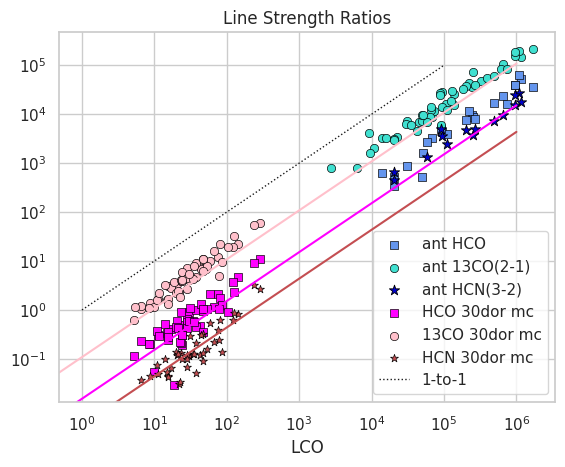

In [491]:
fig, ax = plt.subplots()
antdf = pd.read_csv(anturl)
sns.scatterplot(data=antdf, x='LCO', y='LHCO', label='ant HCO', color=c_12co, edgecolor="black", marker=m_12co)
sns.scatterplot(data=antdf, x='LCO', y='L13CO', label='ant 13CO(2-1)', color=c_13co, edgecolor="black",marker=m_13co)
sns.scatterplot(data=antdf, x='LCO', y='LHCN', label='ant HCN(3-2)', color=c_hcn32, edgecolor="black",marker=m_hcn32, s=60)

#my clumps
sns.scatterplot(data=df30dor_m, x='LCO', y='LHCO', label='HCO 30dor mc', color='magenta',edgecolor="black", marker=m_12co)
sns.scatterplot(data=df30dor_m, x='LCO', y='L13CO', label='13CO 30dor mc', color='pink',edgecolor="black", marker=m_13co)
sns.scatterplot(data=df30dor_m, x='LCO', y='LHCN', label='HCN 30dor mc', color='r',edgecolor="black", marker=m_hcn32)

mr = np.arange(1,10**5, 10)
sns.lineplot(x=mr,y=mr,linewidth=1, color='k', label='1-to-1', linestyle='dotted')
#sns.scatterplot(data=antdf, x='LCO', y='LHCO43', label='HCO+(4-3)')
#sns.scatterplot(data=antdf, x='LCO', y='LHCN43', label='HCN(4-3)')
modelrange = np.arange(0,10**6, 1000)
'''sns.lineplot(x=modelrange,y=try_fitline_odr(antdf,col='L13CO',model=modelrange,xaxis='LHCO'),color=c_13co)
sns.lineplot(x=modelrange,y=try_fitline_odr(antdf,col='LCO',model=modelrange,xaxis='LHCO'),color=c_12co)
sns.lineplot(x=modelrange,y=try_fitline_odr(antdf,col='LHCN',model=modelrange,xaxis='LHCO'),color=c_hcn32)'''
sol, cov = curve_fit(func, df30dor_m['LCO'], df30dor_m['L13CO'])
sns.lineplot(x=modelrange,y=[x*float(sol) for x in modelrange],color='pink')
sol, cov = curve_fit(func, df30dor_m['LCO'].dropna(), df30dor_m['LHCO'].dropna())
sns.lineplot(x=modelrange,y=[x*float(sol) for x in modelrange],color='magenta')
sol, cov = curve_fit(func, df30dor_m['LCO'].dropna(), df30dor_m['LHCN'].dropna())
sns.lineplot(x=modelrange,y=[x*float(sol) for x in modelrange],color='r')
ax.set_xscale('log')
ax.set_yscale('log')
plt.xlabel('LCO')
plt.ylabel('')
plt.title('Line Strength Ratios')

<ipython-input-487-917ac3c0081d>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  beta[1] = 1
<ipython-input-487-917ac3c0081d>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  beta[1] = 1
<ipython-input-487-917ac3c0081d>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  beta[1] = 1
<ipython-input-487-917ac3c0081d>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docume

Text(0.5, 1.0, 'Line Strength Ratios')

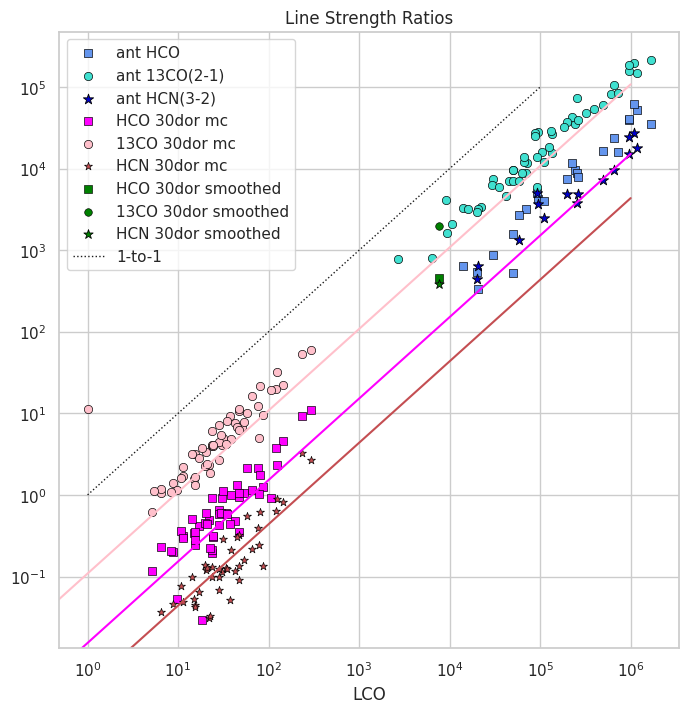

In [492]:
fig, ax = plt.subplots(figsize=(8,8))

smoothdf = pd.read_csv('https://github.com/gracekrahm/30Dor_dense_gas/blob/main/onecloud30dor.txt?raw=True')
antdf = pd.read_csv(anturl)
sns.scatterplot(data=antdf, x='LCO', y='LHCO', label='ant HCO', color=c_12co, edgecolor="black", marker=m_12co)
sns.scatterplot(data=antdf, x='LCO', y='L13CO', label='ant 13CO(2-1)', color=c_13co, edgecolor="black",marker=m_13co)
sns.scatterplot(data=antdf, x='LCO', y='LHCN', label='ant HCN(3-2)', color=c_hcn32, edgecolor="black",marker=m_hcn32, s=60)

#my clumps
sns.scatterplot(data=df30dor_m, x='LCO', y='LHCO', label='HCO 30dor mc', color='magenta',edgecolor="black", marker=m_12co)
sns.scatterplot(data=df30dor_m, x='LCO', y='L13CO', label='13CO 30dor mc', color='pink',edgecolor="black", marker=m_13co)
sns.scatterplot(data=df30dor_m, x='LCO', y='LHCN', label='HCN 30dor mc', color='r',edgecolor="black", marker=m_hcn32)

sns.scatterplot(data=smoothdf, x='LCO', y='LHCO', label='HCO 30dor smoothed', color='green',edgecolor="black", marker=m_12co, s=30)
sns.scatterplot(data=smoothdf, x='LCO', y='L13CO', label='13CO 30dor smoothed', color='green',edgecolor="black", marker=m_13co, s=30)
sns.scatterplot(data=smoothdf, x='LCO', y='LHCN', label='HCN 30dor smoothed', color='green',edgecolor="black", marker=m_hcn32, s=50)

mr = np.arange(1,10**5, 10)
sns.lineplot(x=mr,y=mr,linewidth=1, color='k', label='1-to-1', linestyle='dotted')
#sns.scatterplot(data=antdf, x='LCO', y='LHCO43', label='HCO+(4-3)')
#sns.scatterplot(data=antdf, x='LCO', y='LHCN43', label='HCN(4-3)')
modelrange = np.arange(0,10**6, 1000)
'''sns.lineplot(x=modelrange,y=try_fitline_odr(antdf,col='L13CO',model=modelrange,xaxis='LHCO'),color=c_13co)
sns.lineplot(x=modelrange,y=try_fitline_odr(antdf,col='LCO',model=modelrange,xaxis='LHCO'),color=c_12co)
sns.lineplot(x=modelrange,y=try_fitline_odr(antdf,col='LHCN',model=modelrange,xaxis='LHCO'),color=c_hcn32)'''
sol, cov = curve_fit(func, df30dor_m['LCO'], df30dor_m['L13CO'])
sns.lineplot(x=modelrange,y=[x*float(sol) for x in modelrange],color='pink')
sol, cov = curve_fit(func, df30dor_m['LCO'].dropna(), df30dor_m['LHCO'].dropna())
sns.lineplot(x=modelrange,y=[x*float(sol) for x in modelrange],color='magenta')
sol, cov = curve_fit(func, df30dor_m['LCO'].dropna(), df30dor_m['LHCN'].dropna())
sns.lineplot(x=modelrange,y=[x*float(sol) for x in modelrange],color='r')
ax.set_xscale('log')
ax.set_yscale('log')
plt.xlabel('LCO')
plt.ylabel('')
plt.title('Line Strength Ratios')

In [493]:
smoothdf.iloc[0]

,0
ncl,1.0000
cltype,2.0000
LCO,7621.0000
LCOerr,762.1000
L13CO,1966.0000
L13COerr,196.6000
LHCO,457.9000
LHCOerr,45.7900
LHCN,379.6000
LHCNerr,37.9600


In [494]:
7621.0000/(np.pi*8.5200**2)

33.41818811587578

In [495]:
ant_30 = antdf[antdf['R']<20]
#ant_30 = ant_30[ant_30['LCO']>7000]
#ant_30 = ant_30[ant_30['LCO']<9000]
ant_30 = ant_30[['ncl','LCO', 'R']]
ant_30['density'] = ant_30['LCO']/(np.pi*ant_30['R']**2)
ant_30

,ncl,LCO,R,density
10,11,224000.0,12.170,481.412086
17,18,14090.0,18.600,12.963887
20,21,30370.0,17.520,31.493920
21,22,68880.0,16.440,81.122185
30,31,9093.0,8.712,38.134810
31,32,65920.0,10.610,186.395987
33,34,63210.0,3.601,1551.635384
34,35,49910.0,17.640,51.055265
36,37,58260.0,1.568,7542.728766
37,38,109500.0,8.022,541.625286


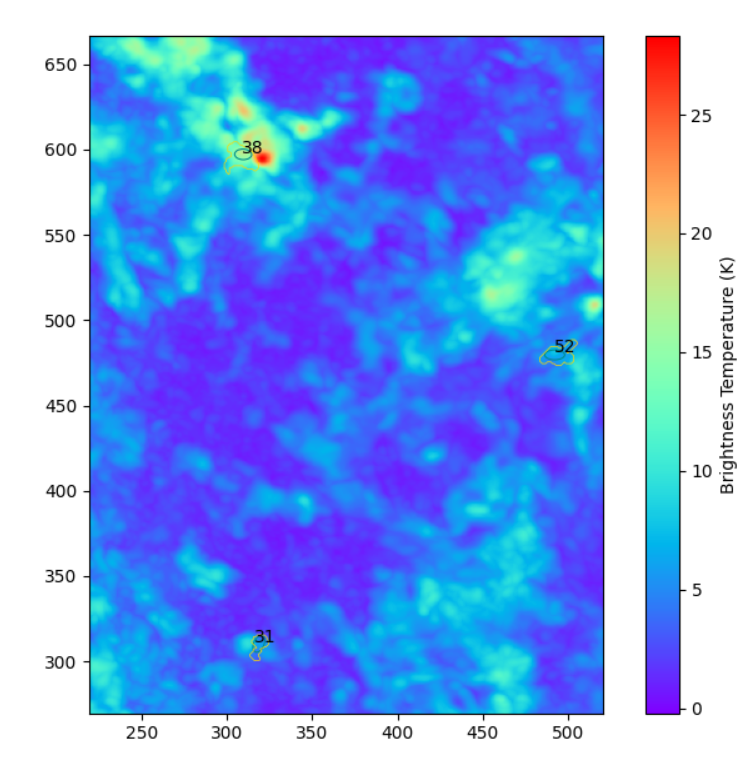

In [496]:
antdf_dor = antdf.iloc[[20,30,37]]
comp = antdf_dor.merge(smoothdf, how='outer')
comp['lco density'] = comp.LCO/(np.pi*comp.R**2)
comp['lhco density'] = comp.LHCO/(np.pi*comp.R**2)
comp['lhcn density'] = comp.LHCN/(np.pi*comp.R**2)
comp['l13co density'] = comp.L13CO/(np.pi*comp.R**2)
comp


,ncl,cltype,LCO,LCOerr,LHCO,LHCOerr,LHCN,LHCNerr,vel_dispCO,vel_dispCOerr,...,vel_disp13CO,vel_disp13COerr,LCS,LCSerr,vel_dispCS,vel_dispCSerr,lco density,lhco density,lhcn density,l13co density
0,1,2,7621.0,762.1,457.9,45.79,379.6,37.96,6.574,0.22270,...,14.450,0.99940,340.1,34.01,49.64,4.902,33.418188,2.007898,1.664551,8.620937
1,21,2,30370.0,3945.0,866.5,535.80,NaN,NaN,4.133,0.06049,...,4.149,0.06020,NaN,NaN,NaN,NaN,31.493920,0.898567,NaN,7.676967
2,31,2,9093.0,1967.0,NaN,NaN,NaN,NaN,5.105,0.08849,...,4.992,0.07777,NaN,NaN,NaN,NaN,38.134810,NaN,NaN,17.236783
3,38,2,109500.0,11450.0,4007.0,863.80,2460.0,829.10,9.572,0.15350,...,9.613,0.14800,NaN,NaN,NaN,NaN,541.625286,19.820023,12.168020,60.246539


In [497]:
antdf['density'] = antdf['LCO']/(np.pi*antdf['R']**2)

antdf['lhco density'] = antdf['LHCO']/(np.pi*antdf['R']**2)
antdf['lhcn density'] = antdf['LHCN']/(np.pi*antdf['R']**2)
antdf['l13co density'] = antdf['L13CO']/(np.pi*antdf['R']**2)
ad = antdf[antdf['density']<100]
ad = ad[ad['density']>20]
ad = ad[['ncl', 'LCO', 'LHCO', 'LHCN', 'L13CO','R', 'density','lhco density', 'lhcn density', 'l13co density']]
ad

,ncl,LCO,LHCO,LHCN,L13CO,R,density,lhco density,lhcn density,l13co density
1,2,1092000.0,61860.0,27280.0,194200.0,65.550,80.896061,4.582628,2.020920,14.386461
3,4,949700.0,40150.0,24280.0,187700.0,83.460,43.399008,1.834759,1.109538,8.577439
4,5,648700.0,23640.0,9728.0,104700.0,47.070,93.197793,3.396325,1.397608,15.042098
5,6,242200.0,9549.0,NaN,35530.0,28.460,95.181923,3.752651,NaN,13.962897
6,7,93550.0,4248.0,3648.0,28130.0,36.960,21.798670,0.989853,0.850043,6.554747
7,8,324700.0,NaN,NaN,48660.0,45.230,50.521849,NaN,NaN,7.571276
8,9,135900.0,NaN,NaN,26190.0,36.610,32.275288,NaN,NaN,6.219940
11,12,610200.0,NaN,NaN,82480.0,85.090,26.826578,NaN,NaN,3.626116
13,14,395900.0,NaN,NaN,53630.0,58.200,37.204002,NaN,NaN,5.039784
15,16,1686000.0,35650.0,NaN,217100.0,98.540,55.269124,1.168650,NaN,7.116801


In [498]:
antdf.iloc[[3,4,6,20,27,28, 30, 41,43]]


,ncl,cltype,LCO,LCOerr,LHCO,LHCOerr,LHCN,LHCNerr,vel_dispCO,vel_dispCOerr,...,vel_dispHCN43,vel_dispHCN43err,L13CO,L13COerr,vel_disp13CO,vel_disp13COerr,density,lhco density,lhcn density,l13co density
3,4,2,949700.0,95530.0,40150.0,4618.0,24280.0,3340.0,24.700,0.41570,...,NaN,NaN,187700.0,18910.0,23.250,0.29570,43.399008,1.834759,1.109538,8.577439
4,5,2,648700.0,65320.0,23640.0,2938.0,9728.0,1992.0,15.850,0.21970,...,NaN,NaN,104700.0,10610.0,15.410,0.20160,93.197793,3.396325,1.397608,15.042098
6,7,2,93550.0,10530.0,4248.0,1045.0,3648.0,1059.0,10.190,0.15130,...,NaN,NaN,28130.0,3015.0,9.867,0.12630,21.798670,0.989853,0.850043,6.554747
20,21,2,30370.0,3945.0,866.5,535.8,NaN,NaN,4.133,0.06049,...,NaN,NaN,7403.0,931.1,4.149,0.06020,31.493920,0.898567,NaN,7.676967
27,28,2,49760.0,5479.0,526.8,463.5,NaN,NaN,4.929,0.08326,...,NaN,NaN,7120.0,878.4,4.678,0.06465,36.645573,0.387960,NaN,5.243498
28,29,2,92770.0,9857.0,NaN,NaN,NaN,NaN,7.167,0.12540,...,NaN,NaN,13740.0,1564.0,6.987,0.11280,46.500391,NaN,NaN,6.887090
30,31,2,9093.0,1967.0,NaN,NaN,NaN,NaN,5.105,0.08849,...,NaN,NaN,4110.0,567.3,4.992,0.07777,38.134810,NaN,NaN,17.236783
41,42,2,135600.0,14350.0,NaN,NaN,NaN,NaN,18.330,0.28460,...,NaN,NaN,15720.0,1893.0,18.850,0.30240,27.692077,NaN,NaN,3.210320
43,44,2,125900.0,13170.0,NaN,NaN,NaN,NaN,10.030,0.15590,...,NaN,NaN,18260.0,2021.0,10.050,0.15730,34.123035,NaN,NaN,4.949060


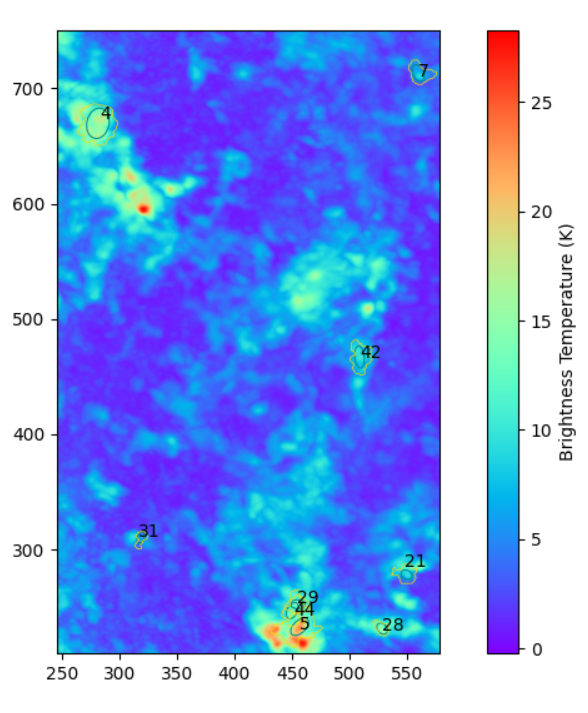

mass of ngc 2070 (star cluster at center of 30 dor) between 6.8E4  and 5E5 solar masses. avg together get 2.84E5 msol

total mass:

In [499]:
co = 7621.0000
h2_mass = 2 * co * 1.3 * 1.1
print(h2_mass)
stellar_mass = 2.84E5
print(stellar_mass)
total_mass = h2_mass + stellar_mass
print(total_mass)
density = total_mass / (3.14 * 8.52**2)
print(density)

21796.060000000005
284000.0
305796.06
1341.5999946931975


# Combined

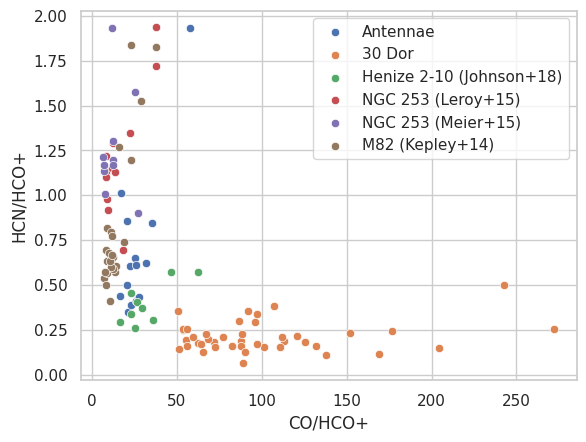

In [500]:
fig, ax = plt.subplots()
sns.scatterplot(data=antdf, x=lr*antdf['LCO']/antdf['LHCO'], y=antdf['LHCN']/antdf['LHCO'], label='Antennae')
sns.scatterplot(data=df30dor_m, x=(2*df30dor_m['LCO'])/df30dor_m['LHCO'], y=df30dor_m['LHCN']/df30dor_m['LHCO'], label='30 Dor')
#sns.scatterplot(data=smoothdf, x=smoothdf['LCO']/smoothdf['LHCO'], y=smoothdf['LHCN']/smoothdf['LHCO'], label='30 Dor 1 cloud')
#sns.scatterplot(data=smoothdf, x=smoothdf['LCO']/smoothdf['LHCO'], y=smoothdf['LHCN']/smoothdf['LHCO'], label='30 Dor 1 cloud')
#sns.scatterplot(data=antdf, x=lr*antdf.LCO/antdf.LHCO, y=antdf.LHCN/antdf.LHCO, label='Antennae')
sns.scatterplot(data=henizedf, x=2*henizedf.LCO/henizedf.LHCO, y=henizedf.LHCN/henizedf.LHCO, label='Henize 2-10 (Johnson+18)')
sns.scatterplot(data=ngc253leroydf, x=ngc253leroydf['CO/HCO+'], y=ngc253leroydf['HCN/HCO+'], label='NGC 253 (Leroy+15)')
sns.scatterplot(data=ngc253df, x=ngc253df['CO(1-0)']/ngc253df['HCO+(1-0)'], y=ngc253df['HCN(1-0)']/ngc253df['HCO+(1-0)'], label='NGC 253 (Meier+15)')
#sns.scatterplot(data=psdf, x=psdf.LCO/psdf['LHCO+'], y=psdf.LHCN/psdf['LHCO+'], label='Post-Starburst')
#sns.scatterplot(data=mrdf, x=mrdf.LCO/mrdf.LHCO, y=mrdf.LHCN/mrdf.LHCO, label='Merger Remnants (Junko+21)')
sns.scatterplot(data=m82df, x=m82df['CO/HCO+'], y=m82df['HCN/HCO+'], label='M82 (Kepley+14)')
#plt.errorbar(x=lr*antdf.LCO/antdf.LHCO, y=antdf.LHCN/antdf.LHCO, yerr=antdf.LHCNerr/antdf.LHCOerr, xerr=antdf.LCOerr/antdf.LHCOerr, ls='none', elinewidth=.25)
#####plt.errorbar(x=lr*antdf['LCO/LHCO'], y=antdf['LHCN/LHCO'], yerr=antdf['LHCN/LHCOerr'], xerr=lr*antdf['LCO/LHCOerr'], ls='none', elinewidth=1)
#plt.errorbar(x=henizedf['LCO/LHCO'], y=henizedf['LHCN/LHCO'], yerr=henizedf['LHCN/LHCOerr'], xerr=henizedf['LCO/LHCOerr'], ls='none', elinewidth=1)
#sns.scatterplot(data=m31df, x=m31df['CO']/m31df['HCO+'], y=m31df['HCN']/m31df['HCO+'], label='M31 (Brouillet+05)')
plt.xlabel('CO/HCO+')
plt.ylabel('HCN/HCO+')
plt.legend(loc='upper right')
#ax.set_xscale('log', basex=2)
#ax.set_xscale('symlog', basex=2)
#ax.set_xlim([5,100])
#model = list(np.arange(20))
#sns.lineplot(x=model, y=[sol[0]*np.exp(-x*sol[1])+sol[2] for x in model])
#plt.legend()
#the firecracker is ncl 23

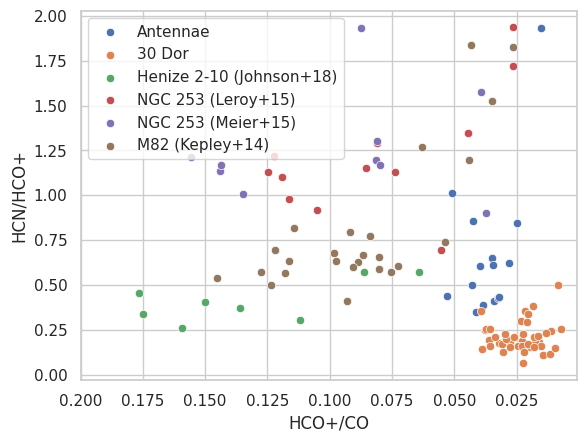

In [501]:
fig, ax = plt.subplots()
sns.scatterplot(data=antdf, x=lr*antdf['LHCO']/antdf['LCO'], y=antdf['LHCN']/antdf['LHCO'], label='Antennae')
sns.scatterplot(data=df30dor_m, x=df30dor_m['LHCO']/df30dor_m['LCO'], y=df30dor_m['LHCN']/df30dor_m['LHCO'], label='30 Dor')
#sns.scatterplot(data=smoothdf, x=smoothdf['LCO']/smoothdf['LHCO'], y=smoothdf['LHCN']/smoothdf['LHCO'], label='30 Dor 1 cloud')
#sns.scatterplot(data=antdf, x=lr*antdf.LCO/antdf.LHCO, y=antdf.LHCN/antdf.LHCO, label='Antennae')
sns.scatterplot(data=henizedf, x=2*henizedf.LHCO/henizedf.LCO, y=henizedf.LHCN/henizedf.LHCO, label='Henize 2-10 (Johnson+18)')
sns.scatterplot(data=ngc253leroydf, x=1/ngc253leroydf['CO/HCO+'], y=ngc253leroydf['HCN/HCO+'], label='NGC 253 (Leroy+15)')
sns.scatterplot(data=ngc253df, x=ngc253df['HCO+(1-0)']/ngc253df['CO(1-0)'], y=ngc253df['HCN(1-0)']/ngc253df['HCO+(1-0)'], label='NGC 253 (Meier+15)')
#sns.scatterplot(data=psdf, x=psdf.LCO/psdf['LHCO+'], y=psdf.LHCN/psdf['LHCO+'], label='Post-Starburst')
#sns.scatterplot(data=mrdf, x=mrdf.LCO/mrdf.LHCO, y=mrdf.LHCN/mrdf.LHCO, label='Merger Remnants (Junko+21)')
sns.scatterplot(data=m82df, x=1/m82df['CO/HCO+'], y=m82df['HCN/HCO+'], label='M82 (Kepley+14)')
#plt.errorbar(x=lr*antdf.LCO/antdf.LHCO, y=antdf.LHCN/antdf.LHCO, yerr=antdf.LHCNerr/antdf.LHCOerr, xerr=antdf.LCOerr/antdf.LHCOerr, ls='none', elinewidth=.25)
#####plt.errorbar(x=lr*antdf['LCO/LHCO'], y=antdf['LHCN/LHCO'], yerr=antdf['LHCN/LHCOerr'], xerr=lr*antdf['LCO/LHCOerr'], ls='none', elinewidth=1)
#plt.errorbar(x=henizedf['LCO/LHCO'], y=henizedf['LHCN/LHCO'], yerr=henizedf['LHCN/LHCOerr'], xerr=henizedf['LCO/LHCOerr'], ls='none', elinewidth=1)
#sns.scatterplot(data=m31df, x=m31df['CO']/m31df['HCO+'], y=m31df['HCN']/m31df['HCO+'], label='M31 (Brouillet+05)')
plt.xlabel('HCO+/CO')
plt.ylabel('HCN/HCO+')
plt.legend(loc='upper left')
#ax.set_xscale('log', basex=2)
#ax.set_xscale('symlog', basex=2)
ax.set_xlim([.001,.2])
#model = list(np.arange(20))
#sns.lineplot(x=model, y=[sol[0]*np.exp(-x*sol[1])+sol[2] for x in model])
#plt.legend()
#the firecracker is ncl 23
ax.invert_xaxis()


(0.0, 0.175)

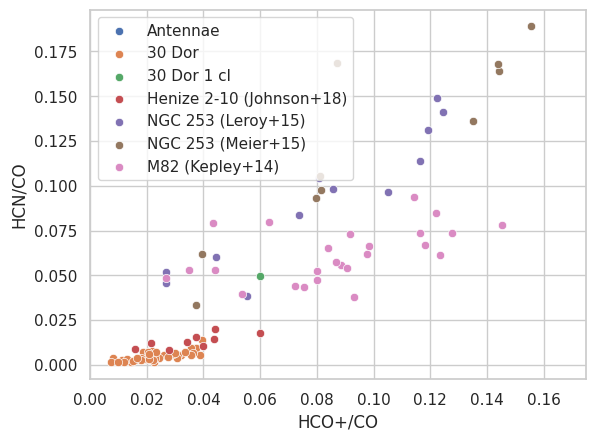

In [502]:
fig, ax = plt.subplots()
sns.scatterplot(data=antdf, x=antdf['LHCO']/lr*antdf['LCO'], y=antdf['LHCN']/antdf['LCO'], label='Antennae')
sns.scatterplot(data=df30dor_m, x=df30dor_m['LHCO']/df30dor_m['LCO'], y=df30dor_m['LHCN']/df30dor_m['LCO'], label='30 Dor')
sns.scatterplot(data=smoothdf, x=smoothdf['LHCO']/smoothdf['LCO'], y=smoothdf['LHCN']/smoothdf['LCO'], label='30 Dor 1 cl')
#sns.scatterplot(data=smoothdf, x=smoothdf['LCO']/smoothdf['LHCO'], y=smoothdf['LHCN']/smoothdf['LHCO'], label='30 Dor 1 cloud')
#sns.scatterplot(data=antdf, x=lr*antdf.LCO/antdf.LHCO, y=antdf.LHCN/antdf.LHCO, label='Antennae')
sns.scatterplot(data=henizedf, x=henizedf.LHCO/(2*henizedf.LCO), y=henizedf.LHCN/(2*henizedf.LCO), label='Henize 2-10 (Johnson+18)')
sns.scatterplot(data=ngc253leroydf, x=1/ngc253leroydf['CO/HCO+'], y=ngc253leroydf['HCN/HCO+']/ngc253leroydf['CO/HCO+'], label='NGC 253 (Leroy+15)')
sns.scatterplot(data=ngc253df, x=ngc253df['HCO+(1-0)']/ngc253df['CO(1-0)'], y=ngc253df['HCN(1-0)']/ngc253df['CO(1-0)'], label='NGC 253 (Meier+15)')
#sns.scatterplot(data=psdf, x=psdf.LCO/psdf['LHCO+'], y=psdf.LHCN/psdf['LHCO+'], label='Post-Starburst')
#sns.scatterplot(data=mrdf, x=mrdf.LCO/mrdf.LHCO, y=mrdf.LHCN/mrdf.LHCO, label='Merger Remnants (Junko+21)')
sns.scatterplot(data=m82df, x=1/m82df['CO/HCO+'], y=m82df['HCN/HCO+']/m82df['CO/HCO+'], label='M82 (Kepley+14)')
#plt.errorbar(x=lr*antdf.LCO/antdf.LHCO, y=antdf.LHCN/antdf.LHCO, yerr=antdf.LHCNerr/antdf.LHCOerr, xerr=antdf.LCOerr/antdf.LHCOerr, ls='none', elinewidth=.25)
#####plt.errorbar(x=lr*antdf['LCO/LHCO'], y=antdf['LHCN/LHCO'], yerr=antdf['LHCN/LHCOerr'], xerr=lr*antdf['LCO/LHCOerr'], ls='none', elinewidth=1)
#plt.errorbar(x=henizedf['LCO/LHCO'], y=henizedf['LHCN/LHCO'], yerr=henizedf['LHCN/LHCOerr'], xerr=henizedf['LCO/LHCOerr'], ls='none', elinewidth=1)
#sns.scatterplot(data=m31df, x=m31df['CO']/m31df['HCO+'], y=m31df['HCN']/m31df['HCO+'], label='M31 (Brouillet+05)')
plt.xlabel('HCO+/CO')
plt.ylabel('HCN/CO')
#plt.legend(loc='upper right')
#ax.set_xscale('log', basex=2)
#ax.set_xscale('symlog', basex=2)
ax.set_xlim([0,.175])
#model = list(np.arange(20))
#sns.lineplot(x=model, y=[sol[0]*np.exp(-x*sol[1])+sol[2] for x in model])
#plt.legend()
#the firecracker is ncl 23

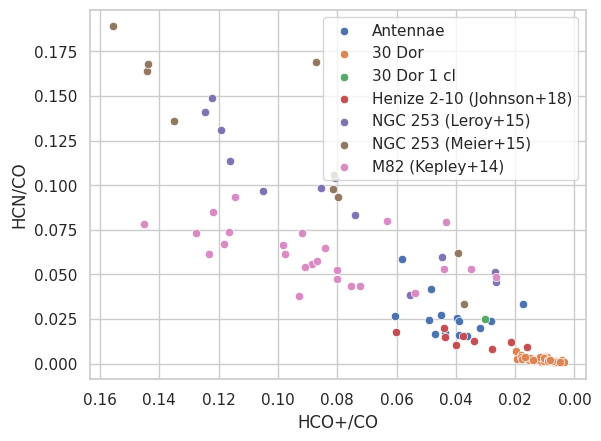

In [503]:
fig, ax = plt.subplots()
sns.scatterplot(data=antdf, x=antdf['LHCO']/(lr*antdf['LCO']), y=antdf['LHCN']/(lr*antdf['LCO']), label='Antennae')
sns.scatterplot(data=df30dor_m, x=df30dor_m['LHCO']/(2*df30dor_m['LCO']), y=df30dor_m['LHCN']/(2*df30dor_m['LCO']), label='30 Dor')
sns.scatterplot(data=smoothdf, x=smoothdf['LHCO']/(2*smoothdf['LCO']), y=smoothdf['LHCN']/(2*smoothdf['LCO']), label='30 Dor 1 cl')
#sns.scatterplot(data=smoothdf, x=smoothdf['LCO']/smoothdf['LHCO'], y=smoothdf['LHCN']/smoothdf['LHCO'], label='30 Dor 1 cloud')
#sns.scatterplot(data=antdf, x=lr*antdf.LCO/antdf.LHCO, y=antdf.LHCN/antdf.LHCO, label='Antennae')
sns.scatterplot(data=henizedf, x=henizedf.LHCO/(2*henizedf.LCO), y=henizedf.LHCN/(2*henizedf.LCO), label='Henize 2-10 (Johnson+18)')
sns.scatterplot(data=ngc253leroydf, x=1/ngc253leroydf['CO/HCO+'], y=ngc253leroydf['HCN/HCO+']/ngc253leroydf['CO/HCO+'], label='NGC 253 (Leroy+15)')
sns.scatterplot(data=ngc253df, x=ngc253df['HCO+(1-0)']/ngc253df['CO(1-0)'], y=ngc253df['HCN(1-0)']/ngc253df['CO(1-0)'], label='NGC 253 (Meier+15)')
#sns.scatterplot(data=psdf, x=psdf.LCO/psdf['LHCO+'], y=psdf.LHCN/psdf['LHCO+'], label='Post-Starburst')
#sns.scatterplot(data=mrdf, x=mrdf.LCO/mrdf.LHCO, y=mrdf.LHCN/mrdf.LHCO, label='Merger Remnants (Junko+21)')
sns.scatterplot(data=m82df, x=1/m82df['CO/HCO+'], y=m82df['HCN/HCO+']/m82df['CO/HCO+'], label='M82 (Kepley+14)')
#plt.errorbar(x=lr*antdf.LCO/antdf.LHCO, y=antdf.LHCN/antdf.LHCO, yerr=antdf.LHCNerr/antdf.LHCOerr, xerr=antdf.LCOerr/antdf.LHCOerr, ls='none', elinewidth=.25)
#####plt.errorbar(x=lr*antdf['LCO/LHCO'], y=antdf['LHCN/LHCO'], yerr=antdf['LHCN/LHCOerr'], xerr=lr*antdf['LCO/LHCOerr'], ls='none', elinewidth=1)
#plt.errorbar(x=henizedf['LCO/LHCO'], y=henizedf['LHCN/LHCO'], yerr=henizedf['LHCN/LHCOerr'], xerr=henizedf['LCO/LHCOerr'], ls='none', elinewidth=1)
#sns.scatterplot(data=m31df, x=m31df['CO']/m31df['HCO+'], y=m31df['HCN']/m31df['HCO+'], label='M31 (Brouillet+05)')
plt.xlabel('HCO+/CO')
plt.ylabel('HCN/CO')
#plt.legend(loc='upper right')
#ax.set_xscale('log', basex=2)
#ax.set_xscale('symlog', basex=2)
#ax.set_xlim([0.005,.17])
#ax.set_xlim([-.2,1])
#model = list(np.arange(20))
#sns.lineplot(x=model, y=[sol[0]*np.exp(-x*sol[1])+sol[2] for x in model])
#plt.legend()
ax.invert_xaxis()
#the firecracker is ncl 23

<ipython-input-504-c908ee9e0188>:13: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(smoothdf['collapsed'], label='30 dor 1 cl')


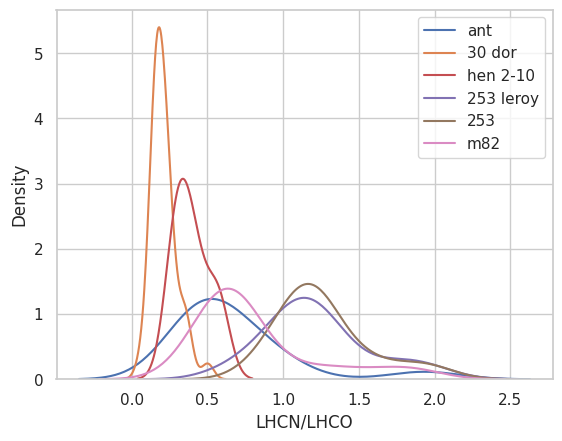

In [504]:
antdf['collapsed'] = (antdf['LHCN']/(lr*antdf['LCO']))/(antdf['LHCO']/(lr*antdf['LCO']))
antdf['test'] = antdf['LHCN']/antdf['LHCO']
df30dor_m['collapsed'] = df30dor_m['LHCN']/df30dor_m['LHCO']
smoothdf['collapsed'] = smoothdf['LHCN']/smoothdf['LHCO']
henizedf['collapsed'] = henizedf['LHCN']/henizedf['LHCO']
ngc253leroydf['collapsed'] = (ngc253leroydf['HCN/HCO+']/ngc253leroydf['CO/HCO+']) / (1/ngc253leroydf['CO/HCO+'])
ngc253df['collapsed'] = ngc253df['HCN(1-0)'] / ngc253df['HCO+(1-0)']
m82df['collapsed'] = (m82df['HCN/HCO+']/m82df['CO/HCO+']) / (1/m82df['CO/HCO+'])


sns.kdeplot(antdf['collapsed'], label='ant')
sns.kdeplot(df30dor_m['collapsed'], label='30 dor')
sns.kdeplot(smoothdf['collapsed'], label='30 dor 1 cl')
sns.kdeplot(henizedf['collapsed'], label='hen 2-10')
sns.kdeplot(ngc253leroydf['collapsed'], label='253 leroy')
sns.kdeplot(ngc253df['collapsed'], label='253')
sns.kdeplot(m82df['collapsed'], label='m82')
plt.xlabel('LHCN/LHCO')
plt.legend()

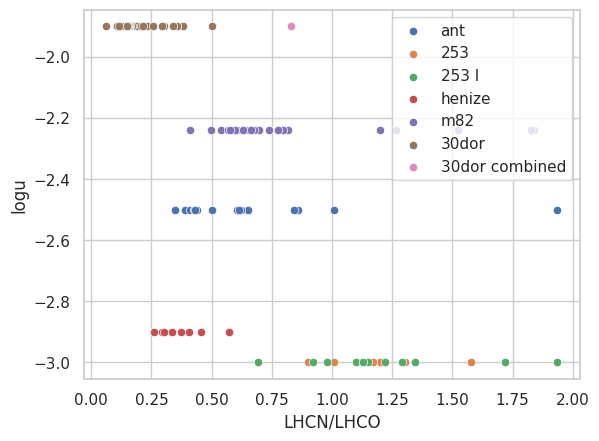

Text(0, 0.5, 'logu')

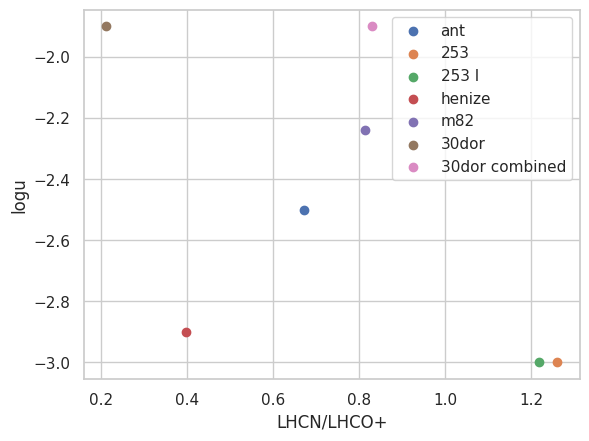

In [505]:
import numpy as np
ngc253df['logu'] = float(-3) #https://arxiv.org/pdf/2310.02584.pdf
ngc253leroydf['logu'] = float(-3) #https://arxiv.org/pdf/2310.02584.pdf
henizedf['logu'] = float(-2.90) #herschel
m82df['logu'] = float(-2.24) #Ionization parameter log U −2.24±0.18 https://articles.adsabs.harvard.edu/pdf/2006MNRAS.370..513S
antdf['logu'] = float(-2.5)
df30dor_m['logu'] = float(-1.9) #from remy
smoothdf['logu'] = float(-1.9) #from remy
#30 dor -3 to -1.5
# LMC-N 11 -2 to -3
# U≈91–7640 https://iopscience.iop.org/article/10.1088/0004-637X/731/2/91


#ant maybe -2.5 avg? https://ui.adsabs.harvard.edu/abs/2020MNRAS.497.3860G/abstract
#G0 = 500 https://articles.adsabs.harvard.edu/pdf/2005IAUS..231..141S
sns.scatterplot(x='collapsed', y='logu', data=antdf, label='ant')

sns.scatterplot(x='collapsed', y='logu', data=ngc253df, label='253')
sns.scatterplot(x='collapsed', y='logu', data=ngc253leroydf, label='253 l')
sns.scatterplot(x='collapsed', y='logu', data=henizedf, label='henize')
sns.scatterplot(x='collapsed', y='logu', data=m82df, label='m82')
sns.scatterplot(x='collapsed', y='logu', data=df30dor_m, label='30dor')
sns.scatterplot(x='collapsed', y='logu', data=smoothdf, label='30dor combined')
plt.xlabel('LHCN/LHCO')
plt.legend()
plt.show()

plt.scatter(x=np.nanmean(antdf['collapsed']), y=antdf['logu'][1], data=antdf, label='ant')

plt.scatter(x=np.nanmean(ngc253df['collapsed']), y=ngc253df['logu'][1], data=ngc253df, label='253')
plt.scatter(x=np.nanmean(ngc253leroydf['collapsed']), y=ngc253leroydf['logu'][1], data=ngc253df, label='253 l')
#sns.scatterplot(x='collapsed', y='logu', data=ngc253leroydf, label='253 l')
plt.scatter(x=np.nanmean(henizedf['collapsed']), y=henizedf['logu'][1], data=henizedf, label='henize')
plt.scatter(x=np.nanmean(m82df['collapsed']), y=m82df['logu'][1], data=m82df, label='m82')
plt.scatter(x=np.nanmean(df30dor_m['collapsed']), y=df30dor_m['logu'][1], data=df30dor_m, label='30dor')
plt.scatter(x=np.nanmean(smoothdf['collapsed']), y=smoothdf['logu'][0], data=smoothdf, label='30dor combined')
#plt.xlabel('LHCN/LHCO')
#plt.legend()
alr = np.nanmean(antdf['collapsed'])
hlr = np.nanmean(henizedf['collapsed'])
n253lr = np.nanmean(ngc253df['collapsed'])
n253Llr = np.nanmean(ngc253leroydf['collapsed'])
m82lr = np.nanmean(m82df['collapsed'])

au = -2.5
hu = -2.9
n253u = -3
m82u = -2

#sns.scatterplot(x=alr, y=au, label='ant', s=20)
plt.legend()
plt.xlabel('LHCN/LHCO+')
plt.ylabel('logu')


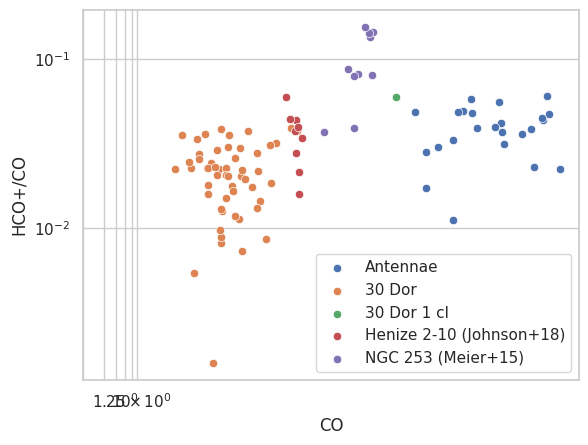

In [506]:
fig, ax = plt.subplots()
sns.scatterplot(data=antdf, y=antdf['LHCO']/(lr*antdf['LCO']), x=antdf['LCO'], label='Antennae')
sns.scatterplot(data=df30dor_m, y=df30dor_m['LHCO']/df30dor_m['LCO'], x=df30dor_m['LCO'], label='30 Dor')
sns.scatterplot(data=smoothdf, y=smoothdf['LHCO']/smoothdf['LCO'], x=smoothdf['LCO'], label='30 Dor 1 cl')
#sns.scatterplot(data=smoothdf, x=smoothdf['LCO']/smoothdf['LHCO'], y=smoothdf['LHCN']/smoothdf['LHCO'], label='30 Dor 1 cloud')
#sns.scatterplot(data=antdf, x=lr*antdf.LCO/antdf.LHCO, y=antdf.LHCN/antdf.LHCO, label='Antennae')
sns.scatterplot(data=henizedf, y=henizedf.LHCO/(2*henizedf.LCO), x=2*henizedf.LCO, label='Henize 2-10 (Johnson+18)')
sns.scatterplot(data=ngc253df, y=ngc253df['HCO+(1-0)']/ngc253df['CO(1-0)'], x=ngc253df['CO(1-0)'], label='NGC 253 (Meier+15)')
plt.ylabel('HCO+/CO')
plt.xlabel('CO')
ax.set_xscale('log')
ax.set_yscale('log')

ax.set_xticks([0.25,0.50,0.75,1.00,1.25,1.50])
#ax.set_yticks([-1.75, -1.5, -1.25, -1.0, -.75, -.5, -.25])


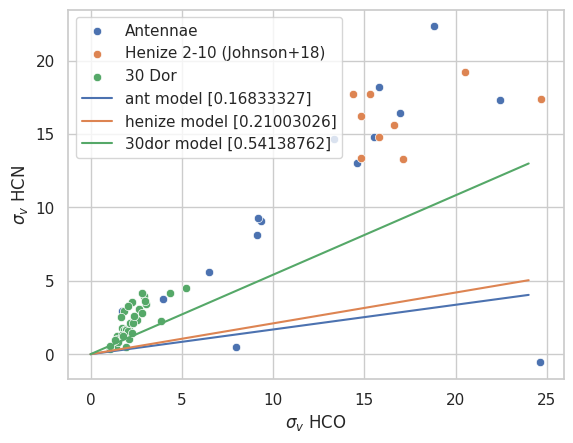

In [507]:
fitantdf = antdf.dropna(subset=['vel_dispHCO', 'vel_dispHCN'])
antsol, antcov = curve_fit(fit_line, fitantdf['vel_dispHCO'], fitantdf['vel_dispHCN'])
fitdf30dor_m = df30dor_m.dropna(subset=['vel_dispHCO', 'vel_dispHCN'])
dorsol, dorcov = curve_fit(fit_line, fitdf30dor_m['vel_dispHCO'], fitdf30dor_m['vel_dispHCN'])
henizedf = henizedf.dropna()
henizesol, henizecov = curve_fit(fit_line, henizedf['vel_dispHCO'], henizedf['vel_dispHCN'])
antymodel = antsol*model
henizeymodel = henizesol*model
fig, ax = plt.subplots()
sns.scatterplot(data=antdf, x='vel_dispHCO', y='vel_dispHCN', label='Antennae')
sns.scatterplot(data=henizedf, x='vel_dispHCO', y='vel_dispHCN', label='Henize 2-10 (Johnson+18)')
sns.scatterplot(data=fitdf30dor_m, x='vel_dispHCO', y='vel_dispHCN', label='30 Dor')
#sns.scatterplot(data=smoothdf, x='vel_dispHCO', y='vel_dispHCN', label='30 Dor 1 cloud')
sns.lineplot(x=model, y=antymodel, label='ant model '+str(antsol))
sns.lineplot(x=model, y=henizeymodel, label='henize model '+str(henizesol))
sns.lineplot(x=model, y=dorsol*model, label='30dor model '+str(dorsol))
plt.xlabel('$\sigma_{v}$ HCO')
plt.ylabel('$\sigma_{v}$ HCN')
plt.legend(loc='upper left')

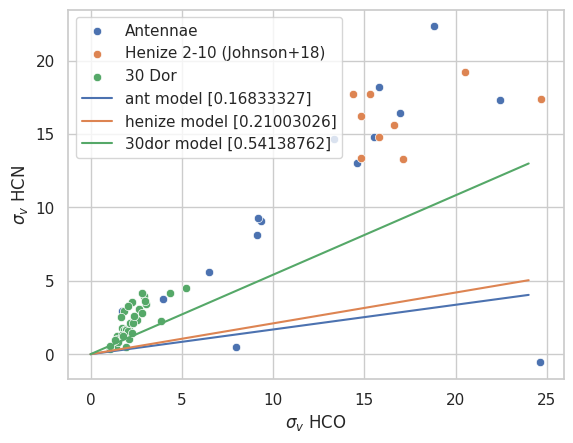

In [508]:
fitantdf = antdf.dropna(subset=['vel_dispHCO', 'vel_dispHCN'])
antsol, antcov = curve_fit(fit_line, fitantdf['vel_dispHCO'], fitantdf['vel_dispHCN'])
fitdf30dor_m = df30dor_m.dropna(subset=['vel_dispHCO', 'vel_dispHCN'])
dorsol, dorcov = curve_fit(fit_line, fitdf30dor_m['vel_dispHCO'], fitdf30dor_m['vel_dispHCN'])
henizedf = henizedf.dropna()
henizesol, henizecov = curve_fit(fit_line, henizedf['vel_dispHCO'], henizedf['vel_dispHCN'])
antymodel = antsol*model
henizeymodel = henizesol*model
fig, ax = plt.subplots()
sns.scatterplot(data=antdf, x='vel_dispHCO', y='vel_dispHCN', label='Antennae')
sns.scatterplot(data=henizedf, x='vel_dispHCO', y='vel_dispHCN', label='Henize 2-10 (Johnson+18)')
sns.scatterplot(data=df30dor_m, x='vel_dispHCO', y='vel_dispHCN', label='30 Dor')
#sns.scatterplot(data=smoothdf, x='vel_dispHCO', y='vel_dispHCN', label='30 Dor 1 cloud')
sns.lineplot(x=model, y=antymodel, label='ant model '+str(antsol))
sns.lineplot(x=model, y=henizeymodel, label='henize model '+str(henizesol))
sns.lineplot(x=model, y=dorsol*model, label='30dor model '+str(dorsol))
plt.xlabel('$\sigma_{v}$ HCO')
plt.ylabel('$\sigma_{v}$ HCN')
plt.legend(loc='upper left')

firecracker 40 and 46
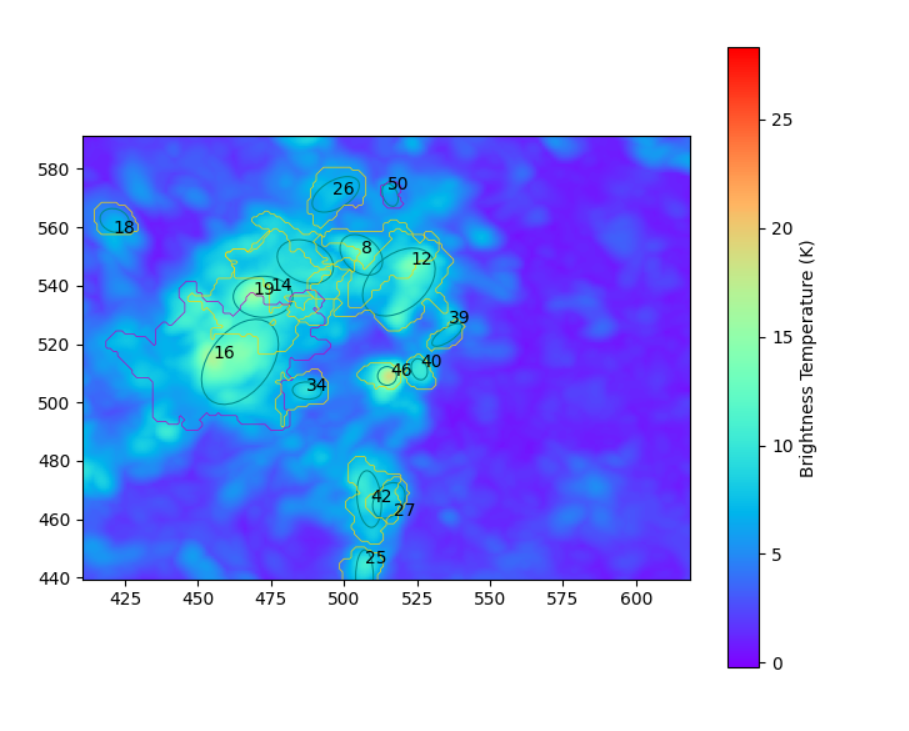

# Pretty Plots

Text(0.5, 0, 'HCO+/CO')

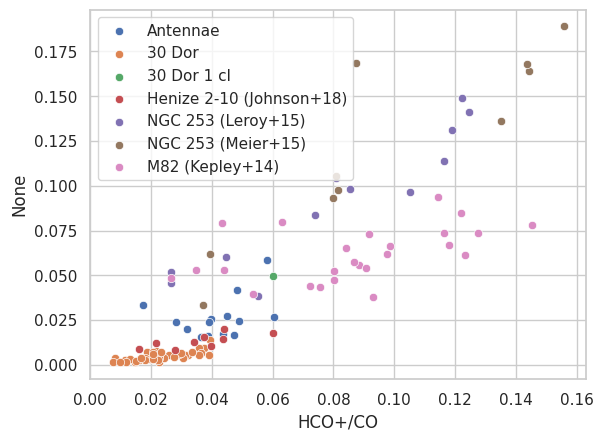

In [509]:
sns.scatterplot(data=antdf, x=antdf['LHCO']/(lr*antdf['LCO']), y=antdf['LHCN']/(lr*antdf['LCO']), label='Antennae')
sns.scatterplot(data=df30dor_m, x=df30dor_m['LHCO']/df30dor_m['LCO'], y=df30dor_m['LHCN']/df30dor_m['LCO'], label='30 Dor')
sns.scatterplot(data=smoothdf, x=smoothdf['LHCO']/smoothdf['LCO'], y=smoothdf['LHCN']/smoothdf['LCO'], label='30 Dor 1 cl')
#sns.scatterplot(data=smoothdf, x=smoothdf['LCO']/smoothdf['LHCO'], y=smoothdf['LHCN']/smoothdf['LHCO'], label='30 Dor 1 cloud')
#sns.scatterplot(data=antdf, x=lr*antdf.LCO/antdf.LHCO, y=antdf.LHCN/antdf.LHCO, label='Antennae')
sns.scatterplot(data=henizedf, x=henizedf.LHCO/(2*henizedf.LCO), y=henizedf.LHCN/(2*henizedf.LCO), label='Henize 2-10 (Johnson+18)')
sns.scatterplot(data=ngc253leroydf, x=1/ngc253leroydf['CO/HCO+'], y=ngc253leroydf['HCN/HCO+']/ngc253leroydf['CO/HCO+'], label='NGC 253 (Leroy+15)')
sns.scatterplot(data=ngc253df, x=ngc253df['HCO+(1-0)']/ngc253df['CO(1-0)'], y=ngc253df['HCN(1-0)']/ngc253df['CO(1-0)'], label='NGC 253 (Meier+15)')
#sns.scatterplot(data=psdf, x=psdf.LCO/psdf['LHCO+'], y=psdf.LHCN/psdf['LHCO+'], label='Post-Starburst')
#sns.scatterplot(data=mrdf, x=mrdf.LCO/mrdf.LHCO, y=mrdf.LHCN/mrdf.LHCO, label='Merger Remnants (Junko+21)')
sns.scatterplot(data=m82df, x=1/m82df['CO/HCO+'], y=m82df['HCN/HCO+']/m82df['CO/HCO+'], label='M82 (Kepley+14)')
#plt.errorbar(x=lr*antdf.LCO/antdf.LHCO, y=antdf.LHCN/antdf.LHCO, yerr=antdf.LHCNerr/antdf.LHCOerr, xerr=antdf.LCOerr/antdf.LHCOerr, ls='none', elinewidth=.25)
#####plt.errorbar(x=lr*antdf['LCO/LHCO'], y=antdf['LHCN/LHCO'], yerr=antdf['LHCN/LHCOerr'], xerr=lr*antdf['LCO/LHCOerr'], ls='none', elinewidth=1)
#plt.errorbar(x=henizedf['LCO/LHCO'], y=henizedf['LHCN/LHCO'], yerr=henizedf['LHCN/LHCOerr'], xerr=henizedf['LCO/LHCOerr'], ls='none', elinewidth=1)
#sns.scatterplot(data=m31df, x=m31df['CO']/m31df['HCO+'], y=m31df['HCN']/m31df['HCO+'], label='M31 (Brouillet+05)')
plt.xlabel('HCO+/CO')

<ipython-input-487-917ac3c0081d>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  beta[1] = 1
<ipython-input-487-917ac3c0081d>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  beta[1] = 1
<ipython-input-487-917ac3c0081d>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  beta[1] = 1
<ipython-input-487-917ac3c0081d>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docume

sol  L13CO [0.03214601]
a= 0.16619481583581655 b= 1.0
sol  LHCN [0.00732445]
a= 0.020211101448075645 b= 1.0
sol  LHCO [0.01256454]
a= 0.036926106101092857 b= 1.0


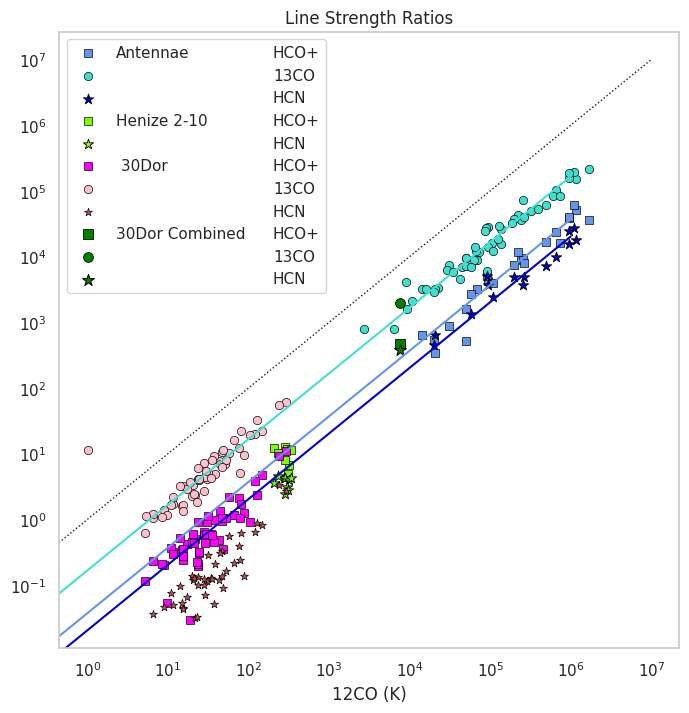

In [510]:
fig, ax = plt.subplots(figsize=(8,8))

#sns.scatterplot(data=ngc253df, x='CO(1-0)', y='HCO+(1-0)', color='orange', edgecolor='black', marker=m_12co)
#sns.scatterplot(data=ngc253df, x='CO(1-0)', y='HCN(1-0)', color='orange', edgecolor='black', marker=m_hcn32)

smoothdf = pd.read_csv('https://github.com/gracekrahm/30Dor_dense_gas/blob/main/onecloud30dor.txt?raw=True')
antdf = pd.read_csv(anturl)
sns.scatterplot(data=antdf, x='LCO', y='LHCO', color=c_12co, edgecolor="black", marker=m_12co)
sns.scatterplot(data=antdf, x='LCO', y='L13CO',  color=c_13co, edgecolor="black",marker=m_13co)
sns.scatterplot(data=antdf, x='LCO', y='LHCN', color='mediumblue', edgecolor="black",marker=m_hcn32, s=60)


sns.scatterplot(data=henizedf, x=2*henizedf['LCO'], y='LHCO', color='lawngreen', edgecolor="black", marker=m_12co)
sns.scatterplot(data=henizedf, x=2*henizedf['LCO'], y='LHCN', color='lawngreen', edgecolor="black",marker=m_hcn32, s=60)


#my clumps
sns.scatterplot(data=df30dor_m, x='LCO', y='LHCO', color='magenta',edgecolor="black", marker=m_12co)
sns.scatterplot(data=df30dor_m, x='LCO', y='L13CO', color='pink',edgecolor="black", marker=m_13co)
sns.scatterplot(data=df30dor_m, x='LCO', y='LHCN',  color='r',edgecolor="black", marker=m_hcn32)

sns.scatterplot(data=smoothdf, x='LCO', y='LHCO',  color='green',edgecolor="black", marker=m_12co, s=50)
sns.scatterplot(data=smoothdf, x='LCO', y='L13CO',  color='green',edgecolor="black", marker=m_13co, s=50)
sns.scatterplot(data=smoothdf, x='LCO', y='LHCN', color='green',edgecolor="black", marker=m_hcn32, s=80)


#sns.scatterplot(data=ngc253leroydf, x='LCO', y='LHCO',  color='green',edgecolor="black", marker=m_12co, s=50)

#sns.scatterplot(data=ngc253leroydf, x=ngc253leroydf['CO/HCO+'], y=ngc253leroydf['HCN/HCO+'], label='NGC 253 (Leroy+15)')
#sns.scatterplot(data=ngc253df, x=ngc253df['CO(1-0)']/ngc253df['HCO+(1-0)'], y=ngc253df['HCN(1-0)']/ngc253df['HCO+(1-0)'], label='NGC 253 (Meier+15)')


#plot invisible lines
plt.plot(np.nan, np.nan, '.', ms=0)
plt.plot(np.nan, np.nan, '.', ms=0)
plt.plot(np.nan, np.nan, '.', ms=0)
plt.plot(np.nan, np.nan, '.', ms=0)
plt.plot(np.nan, np.nan, '.', ms=0)
plt.plot(np.nan, np.nan, '.', ms=0)
plt.plot(np.nan, np.nan, '.', ms=0)
plt.plot(np.nan, np.nan, '.', ms=0)
plt.plot(np.nan, np.nan, '.', ms=0)
plt.plot(np.nan, np.nan, '.', ms=0)
plt.plot(np.nan, np.nan, '.', ms=0)

plt.grid()


mr = np.arange(1,10**5, 10)
modelrange = np.arange(0,10**7, 1000)
sns.lineplot(x=modelrange,y=modelrange,linewidth=1, color='k', label='1-to-1', linestyle='dotted')
#sns.scatterplot(data=antdf, x='LCO', y='LHCO43', label='HCO+(4-3)')
#sns.scatterplot(data=antdf, x='LCO', y='LHCN43', label='HCN(4-3)')
modelrange = np.arange(0,10**6, 1000)
sns.lineplot(x=modelrange,y=try_fitline_odr(antdf,col='L13CO',model=modelrange,xaxis='LCO'),color=c_13co)
sns.lineplot(x=modelrange,y=try_fitline_odr(antdf,col='LHCN',model=modelrange,xaxis='LCO'),color='mediumblue')
sns.lineplot(x=modelrange,y=try_fitline_odr(antdf,col='LHCO',model=modelrange,xaxis='LCO'),color=c_12co)





ax.set_xscale('log')
ax.set_yscale('log')
plt.xlabel('12CO (K)')
plt.ylabel('')
plt.title('Line Strength Ratios')

# Plot non-visible lines


plt.legend(['Antennae', '        ', '        ',
            'Henize 2-10',' ', ' '
            '30Dor', '     ','     ',
            '30Dor Combined', '           ', '           ',
            'HCO+', '13CO', 'HCN',
            'HCO+', 'HCN',
            'HCO+', '13CO', 'HCN',
            'HCO+', '13CO', 'HCN'], ncol=2, columnspacing=-1)
plt.show()

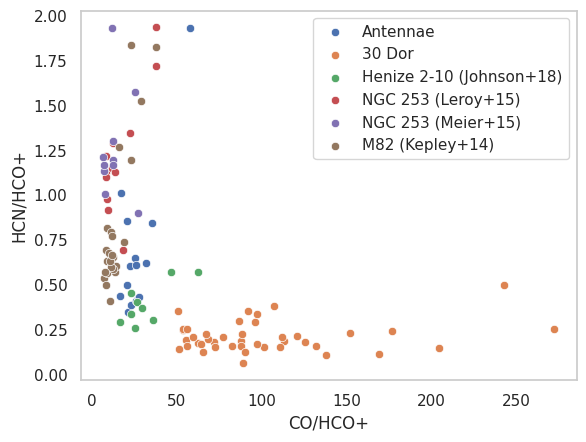

In [511]:
fig, ax = plt.subplots()
sns.scatterplot(data=antdf, x=lr*antdf['LCO']/antdf['LHCO'], y=antdf['LHCN']/antdf['LHCO'], label='Antennae')
sns.scatterplot(data=df30dor_m, x=(2*df30dor_m['LCO'])/df30dor_m['LHCO'], y=df30dor_m['LHCN']/df30dor_m['LHCO'], label='30 Dor')
sns.scatterplot(data=henizedf, x=2*henizedf.LCO/henizedf.LHCO, y=henizedf.LHCN/henizedf.LHCO, label='Henize 2-10 (Johnson+18)')
sns.scatterplot(data=ngc253leroydf, x=ngc253leroydf['CO/HCO+'], y=ngc253leroydf['HCN/HCO+'], label='NGC 253 (Leroy+15)')
sns.scatterplot(data=ngc253df, x=ngc253df['CO(1-0)']/ngc253df['HCO+(1-0)'], y=ngc253df['HCN(1-0)']/ngc253df['HCO+(1-0)'], label='NGC 253 (Meier+15)')
sns.scatterplot(data=m82df, x=m82df['CO/HCO+'], y=m82df['HCN/HCO+'], label='M82 (Kepley+14)')
plt.xlabel('CO/HCO+')
plt.ylabel('HCN/HCO+')
plt.legend(loc='upper right')
plt.grid()
plt.show()

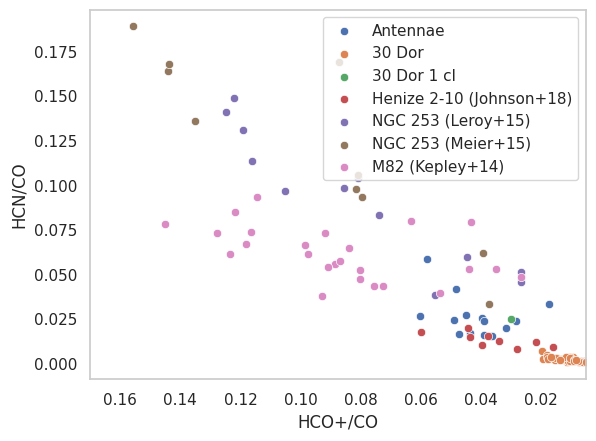

In [512]:
fig, ax = plt.subplots()
sns.scatterplot(data=antdf, x=antdf['LHCO']/(lr*antdf['LCO']), y=antdf['LHCN']/(lr*antdf['LCO']), label='Antennae')
sns.scatterplot(data=df30dor_m, x=df30dor_m['LHCO']/(2*df30dor_m['LCO']), y=df30dor_m['LHCN']/(2*df30dor_m['LCO']), label='30 Dor')
sns.scatterplot(data=smoothdf, x=smoothdf['LHCO']/(2*smoothdf['LCO']), y=smoothdf['LHCN']/(2*smoothdf['LCO']), label='30 Dor 1 cl')
sns.scatterplot(data=henizedf, x=henizedf.LHCO/(2*henizedf.LCO), y=henizedf.LHCN/(2*henizedf.LCO), label='Henize 2-10 (Johnson+18)')
sns.scatterplot(data=ngc253leroydf, x=1/ngc253leroydf['CO/HCO+'], y=ngc253leroydf['HCN/HCO+']/ngc253leroydf['CO/HCO+'], label='NGC 253 (Leroy+15)')
sns.scatterplot(data=ngc253df, x=ngc253df['HCO+(1-0)']/ngc253df['CO(1-0)'], y=ngc253df['HCN(1-0)']/ngc253df['CO(1-0)'], label='NGC 253 (Meier+15)')
sns.scatterplot(data=m82df, x=1/m82df['CO/HCO+'], y=m82df['HCN/HCO+']/m82df['CO/HCO+'], label='M82 (Kepley+14)')
plt.xlabel('HCO+/CO')
plt.ylabel('HCN/CO')
ax.set_xlim([0.005,.17])
ax.invert_xaxis()
plt.grid()
plt.show()


with https://ui.adsabs.harvard.edu/abs/2023A%26A...672A..96G/abstract line ratios

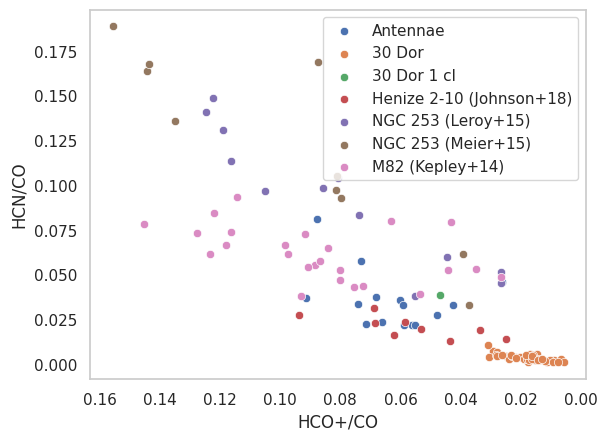

In [513]:
co_lr = 1/0.781
hcn_lr = 1/.528
hco_lr = 1/.484


fig, ax = plt.subplots()

sns.scatterplot(data=antdf, x=(hco_lr*antdf['LHCO'])/(co_lr*antdf['LCO']), y=(hcn_lr*antdf['LHCN'])/(co_lr*antdf['LCO']), label='Antennae')
sns.scatterplot(data=df30dor_m, x=df30dor_m['LHCO']/(co_lr*df30dor_m['LCO']), y=df30dor_m['LHCN']/(co_lr*df30dor_m['LCO']), label='30 Dor')
sns.scatterplot(data=smoothdf, x=smoothdf['LHCO']/(co_lr*smoothdf['LCO']), y=smoothdf['LHCN']/(co_lr*smoothdf['LCO']), label='30 Dor 1 cl')
sns.scatterplot(data=henizedf, x=henizedf.LHCO/(co_lr*henizedf.LCO), y=henizedf.LHCN/(co_lr*henizedf.LCO), label='Henize 2-10 (Johnson+18)')
sns.scatterplot(data=ngc253leroydf, x=1/ngc253leroydf['CO/HCO+'], y=ngc253leroydf['HCN/HCO+']/ngc253leroydf['CO/HCO+'], label='NGC 253 (Leroy+15)')
sns.scatterplot(data=ngc253df, x=ngc253df['HCO+(1-0)']/ngc253df['CO(1-0)'], y=ngc253df['HCN(1-0)']/ngc253df['CO(1-0)'], label='NGC 253 (Meier+15)')
sns.scatterplot(data=m82df, x=1/m82df['CO/HCO+'], y=m82df['HCN/HCO+']/m82df['CO/HCO+'], label='M82 (Kepley+14)')
plt.xlabel('HCO+/CO')
plt.ylabel('HCN/CO')
ax.invert_xaxis()
plt.grid()
plt.show()

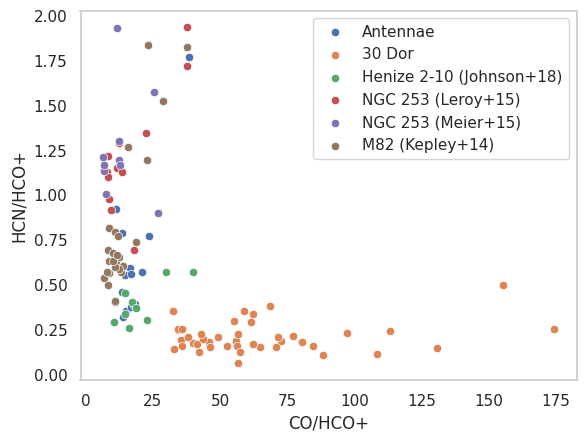

In [514]:
fig, ax = plt.subplots()
sns.scatterplot(data=antdf, x=co_lr*antdf['LCO']/(hco_lr*antdf['LHCO']), y=(hcn_lr*antdf['LHCN'])/(hco_lr*antdf['LHCO']), label='Antennae')
sns.scatterplot(data=df30dor_m, x=(co_lr*df30dor_m['LCO'])/df30dor_m['LHCO'], y=df30dor_m['LHCN']/df30dor_m['LHCO'], label='30 Dor')
sns.scatterplot(data=henizedf, x=co_lr*henizedf.LCO/henizedf.LHCO, y=henizedf.LHCN/henizedf.LHCO, label='Henize 2-10 (Johnson+18)')
sns.scatterplot(data=ngc253leroydf, x=ngc253leroydf['CO/HCO+'], y=ngc253leroydf['HCN/HCO+'], label='NGC 253 (Leroy+15)')
sns.scatterplot(data=ngc253df, x=ngc253df['CO(1-0)']/ngc253df['HCO+(1-0)'], y=ngc253df['HCN(1-0)']/ngc253df['HCO+(1-0)'], label='NGC 253 (Meier+15)')
sns.scatterplot(data=m82df, x=m82df['CO/HCO+'], y=m82df['HCN/HCO+'], label='M82 (Kepley+14)')
plt.xlabel('CO/HCO+')
plt.ylabel('HCN/HCO+')
plt.legend(loc='upper right')
plt.grid()
plt.show()

<ipython-input-487-917ac3c0081d>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  beta[1] = 1
<ipython-input-487-917ac3c0081d>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  beta[1] = 1
<ipython-input-487-917ac3c0081d>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  beta[1] = 1
<ipython-input-487-917ac3c0081d>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docume

sol  L13CO [0.03214601]
a= 0.16619481583581655 b= 1.0
sol  LHCN [0.00732445]
a= 0.020211101448075645 b= 1.0
sol  LHCO [0.01256454]
a= 0.036926106101092857 b= 1.0


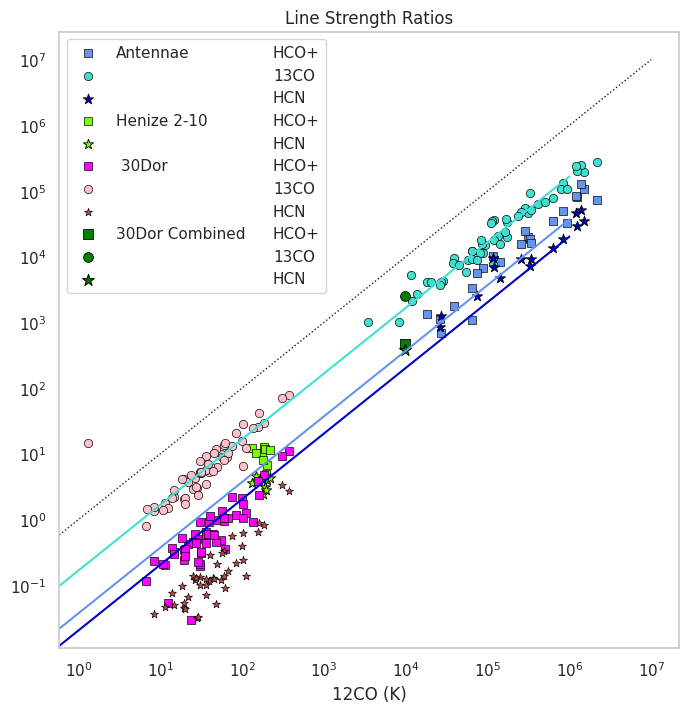

In [515]:
fig, ax = plt.subplots(figsize=(8,8))

#sns.scatterplot(data=ngc253df, x='CO(1-0)', y='HCO+(1-0)', color='orange', edgecolor='black', marker=m_12co)
#sns.scatterplot(data=ngc253df, x='CO(1-0)', y='HCN(1-0)', color='orange', edgecolor='black', marker=m_hcn32)

smoothdf = pd.read_csv('https://github.com/gracekrahm/30Dor_dense_gas/blob/main/onecloud30dor.txt?raw=True')
antdf = pd.read_csv(anturl)
sns.scatterplot(data=antdf, x=co_lr*antdf['LCO'], y=hco_lr*antdf['LHCO'], color=c_12co, edgecolor="black", marker=m_12co)
sns.scatterplot(data=antdf, x=co_lr*antdf['LCO'], y=co_lr*antdf['L13CO'],  color=c_13co, edgecolor="black",marker=m_13co)
sns.scatterplot(data=antdf, x=co_lr*antdf['LCO'], y=hcn_lr*antdf['LHCN'], color='mediumblue', edgecolor="black",marker=m_hcn32, s=60)


sns.scatterplot(data=henizedf, x=co_lr*henizedf['LCO'], y='LHCO', color='lawngreen', edgecolor="black", marker=m_12co)
sns.scatterplot(data=henizedf, x=co_lr*henizedf['LCO'], y='LHCN', color='lawngreen', edgecolor="black",marker=m_hcn32, s=60)


#my clumps
sns.scatterplot(data=df30dor_m, x=co_lr*df30dor_m['LCO'], y='LHCO', color='magenta',edgecolor="black", marker=m_12co)
sns.scatterplot(data=df30dor_m, x=co_lr*df30dor_m['LCO'], y=co_lr*df30dor_m['L13CO'], color='pink',edgecolor="black", marker=m_13co)
sns.scatterplot(data=df30dor_m, x=co_lr*df30dor_m['LCO'], y='LHCN',  color='r',edgecolor="black", marker=m_hcn32)

sns.scatterplot(data=smoothdf, x=co_lr*smoothdf['LCO'], y='LHCO',  color='green',edgecolor="black", marker=m_12co, s=50)
sns.scatterplot(data=smoothdf, x=co_lr*smoothdf['LCO'], y=co_lr*smoothdf['L13CO'],  color='green',edgecolor="black", marker=m_13co, s=50)
sns.scatterplot(data=smoothdf, x=co_lr*smoothdf['LCO'], y='LHCN', color='green',edgecolor="black", marker=m_hcn32, s=80)





#plot invisible lines
plt.plot(np.nan, np.nan, '.', ms=0)
plt.plot(np.nan, np.nan, '.', ms=0)
plt.plot(np.nan, np.nan, '.', ms=0)
plt.plot(np.nan, np.nan, '.', ms=0)
plt.plot(np.nan, np.nan, '.', ms=0)
plt.plot(np.nan, np.nan, '.', ms=0)
plt.plot(np.nan, np.nan, '.', ms=0)
plt.plot(np.nan, np.nan, '.', ms=0)
plt.plot(np.nan, np.nan, '.', ms=0)
plt.plot(np.nan, np.nan, '.', ms=0)
plt.plot(np.nan, np.nan, '.', ms=0)

plt.grid()


mr = np.arange(1,10**5, 10)
modelrange = np.arange(0,10**7, 1000)
sns.lineplot(x=modelrange,y=modelrange,linewidth=1, color='k', label='1-to-1', linestyle='dotted')
#sns.scatterplot(data=antdf, x='LCO', y='LHCO43', label='HCO+(4-3)')
#sns.scatterplot(data=antdf, x='LCO', y='LHCN43', label='HCN(4-3)')
modelrange = np.arange(0,10**6, 1000)
sns.lineplot(x=modelrange,y=try_fitline_odr(antdf,col='L13CO',model=modelrange,xaxis='LCO'),color=c_13co)
sns.lineplot(x=modelrange,y=try_fitline_odr(antdf,col='LHCN',model=modelrange,xaxis='LCO'),color='mediumblue')
sns.lineplot(x=modelrange,y=try_fitline_odr(antdf,col='LHCO',model=modelrange,xaxis='LCO'),color=c_12co)





ax.set_xscale('log')
ax.set_yscale('log')
plt.xlabel('12CO (K)')
plt.ylabel('')
plt.title('Line Strength Ratios')

# Plot non-visible lines


plt.legend(['Antennae', '        ', '        ',
            'Henize 2-10',' ', ' '
            '30Dor', '     ','     ',
            '30Dor Combined', '           ', '           ',
            'HCO+', '13CO', 'HCN',
            'HCO+', 'HCN',
            'HCO+', '13CO', 'HCN',
            'HCO+', '13CO', 'HCN'], ncol=2, columnspacing=-1)
plt.show()

using https://ui.adsabs.harvard.edu/abs/2023A%26A...671A..59I/abstract lrs

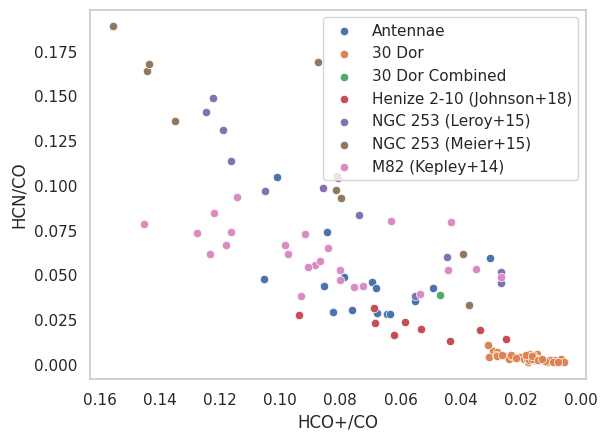

In [516]:
hcn_lr = 1/0.41
hco_lr = 1/.42
fig, ax = plt.subplots()

sns.scatterplot(data=antdf, x=(hco_lr*antdf['LHCO'])/(co_lr*antdf['LCO']), y=(hcn_lr*antdf['LHCN'])/(co_lr*antdf['LCO']), label='Antennae')
sns.scatterplot(data=df30dor_m, x=df30dor_m['LHCO']/(co_lr*df30dor_m['LCO']), y=df30dor_m['LHCN']/(co_lr*df30dor_m['LCO']), label='30 Dor')
sns.scatterplot(data=smoothdf, x=smoothdf['LHCO']/(co_lr*smoothdf['LCO']), y=smoothdf['LHCN']/(co_lr*smoothdf['LCO']), label='30 Dor Combined')
sns.scatterplot(data=henizedf, x=henizedf.LHCO/(co_lr*henizedf.LCO), y=henizedf.LHCN/(co_lr*henizedf.LCO), label='Henize 2-10 (Johnson+18)')
sns.scatterplot(data=ngc253leroydf, x=1/ngc253leroydf['CO/HCO+'], y=ngc253leroydf['HCN/HCO+']/ngc253leroydf['CO/HCO+'], label='NGC 253 (Leroy+15)')
sns.scatterplot(data=ngc253df, x=ngc253df['HCO+(1-0)']/ngc253df['CO(1-0)'], y=ngc253df['HCN(1-0)']/ngc253df['CO(1-0)'], label='NGC 253 (Meier+15)')
sns.scatterplot(data=m82df, x=1/m82df['CO/HCO+'], y=m82df['HCN/HCO+']/m82df['CO/HCO+'], label='M82 (Kepley+14)')
plt.xlabel('HCO+/CO')
plt.ylabel('HCN/CO')
ax.invert_xaxis()
plt.grid()
plt.show()

<ipython-input-487-917ac3c0081d>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  beta[1] = 1
<ipython-input-487-917ac3c0081d>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  beta[1] = 1
<ipython-input-487-917ac3c0081d>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  beta[1] = 1
<ipython-input-487-917ac3c0081d>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docume

sol  L13CO [0.03214601]
a= 0.16619481583581655 b= 1.0
sol  LHCN [0.00732445]
a= 0.020211101448075645 b= 1.0
sol  LHCO [0.01256454]
a= 0.036926106101092857 b= 1.0


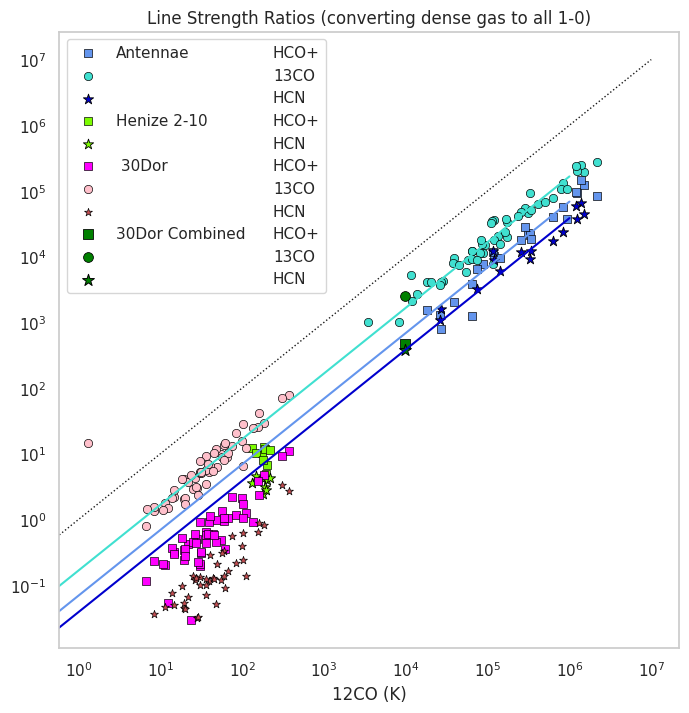

In [517]:
sns.set_style("whitegrid")
fig, ax = plt.subplots(figsize=(8,8))

#sns.scatterplot(data=ngc253df, x='CO(1-0)', y='HCO+(1-0)', color='orange', edgecolor='black', marker=m_12co)
#sns.scatterplot(data=ngc253df, x='CO(1-0)', y='HCN(1-0)', color='orange', edgecolor='black', marker=m_hcn32)

smoothdf = pd.read_csv('https://github.com/gracekrahm/30Dor_dense_gas/blob/main/onecloud30dor.txt?raw=True')
antdf = pd.read_csv(anturl)
sns.scatterplot(data=antdf, x=co_lr*antdf['LCO'], y=hco_lr*antdf['LHCO'], color=c_12co, edgecolor="black", marker=m_12co)
sns.scatterplot(data=antdf, x=co_lr*antdf['LCO'], y=co_lr*antdf['L13CO'],  color=c_13co, edgecolor="black",marker=m_13co)
sns.scatterplot(data=antdf, x=co_lr*antdf['LCO'], y=hcn_lr*antdf['LHCN'], color='mediumblue', edgecolor="black",marker=m_hcn32, s=60)


sns.scatterplot(data=henizedf, x=co_lr*henizedf['LCO'], y='LHCO', color='lawngreen', edgecolor="black", marker=m_12co)
sns.scatterplot(data=henizedf, x=co_lr*henizedf['LCO'], y='LHCN', color='lawngreen', edgecolor="black",marker=m_hcn32, s=60)


#my clumps
sns.scatterplot(data=df30dor_m, x=co_lr*df30dor_m['LCO'], y='LHCO', color='magenta',edgecolor="black", marker=m_12co)
sns.scatterplot(data=df30dor_m, x=co_lr*df30dor_m['LCO'], y=co_lr*df30dor_m['L13CO'], color='pink',edgecolor="black", marker=m_13co)
sns.scatterplot(data=df30dor_m, x=co_lr*df30dor_m['LCO'], y='LHCN',  color='r',edgecolor="black", marker=m_hcn32)

sns.scatterplot(data=smoothdf, x=co_lr*smoothdf['LCO'], y='LHCO',  color='green',edgecolor="black", marker=m_12co, s=50)
sns.scatterplot(data=smoothdf, x=co_lr*smoothdf['LCO'], y=co_lr*smoothdf['L13CO'],  color='green',edgecolor="black", marker=m_13co, s=50)
sns.scatterplot(data=smoothdf, x=co_lr*smoothdf['LCO'], y='LHCN', color='green',edgecolor="black", marker=m_hcn32, s=80)





#plot invisible lines
plt.plot(np.nan, np.nan, '.', ms=0)
plt.plot(np.nan, np.nan, '.', ms=0)
plt.plot(np.nan, np.nan, '.', ms=0)
plt.plot(np.nan, np.nan, '.', ms=0)
plt.plot(np.nan, np.nan, '.', ms=0)
plt.plot(np.nan, np.nan, '.', ms=0)
plt.plot(np.nan, np.nan, '.', ms=0)
plt.plot(np.nan, np.nan, '.', ms=0)
plt.plot(np.nan, np.nan, '.', ms=0)
plt.plot(np.nan, np.nan, '.', ms=0)
plt.plot(np.nan, np.nan, '.', ms=0)



mr = np.arange(1,10**5, 10)
modelrange = np.arange(0,10**7, 1000)
sns.lineplot(x=modelrange,y=modelrange,linewidth=1, color='k', label='1-to-1', linestyle='dotted')
#sns.scatterplot(data=antdf, x='LCO', y='LHCO43', label='HCO+(4-3)')
#sns.scatterplot(data=antdf, x='LCO', y='LHCN43', label='HCN(4-3)')
modelrange = np.arange(0,10**6, 1000)
sns.lineplot(x=modelrange,y=try_fitline_odr(antdf,col='L13CO',model=modelrange,xaxis='LCO'),color=c_13co)
sns.lineplot(x=modelrange,y=[(hcn_lr/co_lr)*x for x in try_fitline_odr(antdf,col='LHCN',model=modelrange,xaxis='LCO')],color='mediumblue')
sns.lineplot(x=modelrange,y=[(hco_lr/co_lr)*x for x in try_fitline_odr(antdf,col='LHCO',model=modelrange,xaxis='LCO')],color=c_12co)





ax.set_xscale('log')
ax.set_yscale('log')
plt.xlabel('12CO (K)')
plt.ylabel('')
plt.title('Line Strength Ratios (converting dense gas to all 1-0)')

# Plot non-visible lines


plt.legend(['Antennae', '        ', '        ',
            'Henize 2-10',' ', ' '
            '30Dor', '     ','     ',
            '30Dor Combined', '           ', '           ',
            'HCO+', '13CO', 'HCN',
            'HCO+', 'HCN',
            'HCO+', '13CO', 'HCN',
            'HCO+', '13CO', 'HCN'], ncol=2, columnspacing=-1)
plt.grid()

plt.show()

# adding normal galaxies https://ui.adsabs.harvard.edu/abs/2018ApJ...858...90G/abstract

In [518]:

'''gallagher = np.loadtxt('/content/suppmat.dat.txt', usecols=(0,2,4,8,10))
df = pd.DataFrame(gallagher, columns = ['galaxy', 'LCO','LHCN','LHCO','L13CO'])
#df.rename(columns={"0": "galaxy", "1": "LCO", "2":"LHCN","3":"LHCO", "4":"L13CO"})
df3351 = df[df['galaxy']==3351.0]

dfngc4321 = pd.read_csv('/content/ngc_4321_gallagher.csv')#, columns=['LHCN/LICO', 'LHCO/LICO'] )
dfngc3627 = pd.read_csv('/content/gallagher_ngc3627.txt')
dfngc4321[' LHCO/LCO']'''

'gallagher = np.loadtxt(\'/content/suppmat.dat.txt\', usecols=(0,2,4,8,10))\ndf = pd.DataFrame(gallagher, columns = [\'galaxy\', \'LCO\',\'LHCN\',\'LHCO\',\'L13CO\'])\n#df.rename(columns={"0": "galaxy", "1": "LCO", "2":"LHCN","3":"LHCO", "4":"L13CO"})\ndf3351 = df[df[\'galaxy\']==3351.0]\n\ndfngc4321 = pd.read_csv(\'/content/ngc_4321_gallagher.csv\')#, columns=[\'LHCN/LICO\', \'LHCO/LICO\'] )\ndfngc3627 = pd.read_csv(\'/content/gallagher_ngc3627.txt\')\ndfngc4321[\' LHCO/LCO\']'

In [519]:
hcn_lr = 1/.528
hco_lr = 1/.484
print(hcn_lr, hco_lr)

1.8939393939393938 2.066115702479339


In [520]:
'''hcn_lr = 1/.528
hco_lr = 1/.484
#hcn sum ratio mean 0.5283933281898499 for cut ratio off at 1.1
#hco sum ratio mean 0.48377329111099243 for cut ratio off at 1.1
fig, ax = plt.subplots()

sns.scatterplot(data=antdf, x=(hco_lr*antdf['LHCO'])/(co_lr*antdf['LCO']), y=(hcn_lr*antdf['LHCN'])/(co_lr*antdf['LCO']), label='Antennae')
sns.scatterplot(data=df30dor_m, x=df30dor_m['LHCO']/(co_lr*df30dor_m['LCO']), y=df30dor_m['LHCN']/(co_lr*df30dor_m['LCO']), label='30 Dor')
sns.scatterplot(data=smoothdf, x=smoothdf['LHCO']/(co_lr*smoothdf['LCO']), y=smoothdf['LHCN']/(co_lr*smoothdf['LCO']), label='30 Dor Combined')
sns.scatterplot(data=henizedf, x=henizedf.LHCO/(co_lr*henizedf.LCO), y=henizedf.LHCN/(co_lr*henizedf.LCO), label='Henize 2-10 (Johnson+18)')
sns.scatterplot(data=ngc253leroydf, x=1/ngc253leroydf['CO/HCO+'], y=ngc253leroydf['HCN/HCO+']/ngc253leroydf['CO/HCO+'], label='NGC 253 (Leroy+15)')
sns.scatterplot(data=ngc253df, x=ngc253df['HCO+(1-0)']/ngc253df['CO(1-0)'], y=ngc253df['HCN(1-0)']/ngc253df['CO(1-0)'], label='NGC 253 (Meier+15)')
sns.scatterplot(data=m82df, x=1/m82df['CO/HCO+'], y=m82df['HCN/HCO+']/m82df['CO/HCO+'], label='M82 (Kepley+14)')
sns.scatterplot(data=dfngc4321, x=10**dfngc4321['LHCN/LCO'], y=10**dfngc4321[" LHCO/LCO"], label='ngc 4321 gallagher')
sns.scatterplot(data=dfngc3627, x=10**dfngc3627['LHCN/LCO'], y=10**dfngc3627["LHCO/LCO"], label='ngc 3627 gallagher')

sns.scatterplot(data=df, x=(df['LHCO'])/(df['LCO']), y=(df['LHCN'])/(df['LCO']), label='gallagher')
plt.xlabel('HCO+/CO')
plt.ylabel('HCN/CO')
#ax.set_xscale('log')
#ax.set_yscale('log')
plt.legend(bbox_to_anchor=(1.1, 1.05))
ax.invert_xaxis()
plt.grid()
plt.show()'''

'hcn_lr = 1/.528\nhco_lr = 1/.484\n#hcn sum ratio mean 0.5283933281898499 for cut ratio off at 1.1\n#hco sum ratio mean 0.48377329111099243 for cut ratio off at 1.1\nfig, ax = plt.subplots()\n\nsns.scatterplot(data=antdf, x=(hco_lr*antdf[\'LHCO\'])/(co_lr*antdf[\'LCO\']), y=(hcn_lr*antdf[\'LHCN\'])/(co_lr*antdf[\'LCO\']), label=\'Antennae\')\nsns.scatterplot(data=df30dor_m, x=df30dor_m[\'LHCO\']/(co_lr*df30dor_m[\'LCO\']), y=df30dor_m[\'LHCN\']/(co_lr*df30dor_m[\'LCO\']), label=\'30 Dor\')\nsns.scatterplot(data=smoothdf, x=smoothdf[\'LHCO\']/(co_lr*smoothdf[\'LCO\']), y=smoothdf[\'LHCN\']/(co_lr*smoothdf[\'LCO\']), label=\'30 Dor Combined\')\nsns.scatterplot(data=henizedf, x=henizedf.LHCO/(co_lr*henizedf.LCO), y=henizedf.LHCN/(co_lr*henizedf.LCO), label=\'Henize 2-10 (Johnson+18)\')\nsns.scatterplot(data=ngc253leroydf, x=1/ngc253leroydf[\'CO/HCO+\'], y=ngc253leroydf[\'HCN/HCO+\']/ngc253leroydf[\'CO/HCO+\'], label=\'NGC 253 (Leroy+15)\')\nsns.scatterplot(data=ngc253df, x=ngc253df[\'HCO+

In [521]:
'''fig, ax = plt.subplots()
sns.scatterplot(data=antdf, x=(hco_lr*antdf['LHCO'])/(co_lr*antdf['LCO']), y=(hcn_lr*antdf['LHCN'])/(co_lr*antdf['LCO']), label='Antennae')
sns.scatterplot(data=df30dor_m, x=df30dor_m['LHCO']/(co_lr*df30dor_m['LCO']), y=df30dor_m['LHCN']/(co_lr*df30dor_m['LCO']), label='30 Dor')
sns.scatterplot(data=henizedf, x=henizedf.LHCO/(co_lr*henizedf.LCO), y=henizedf.LHCN/(co_lr*henizedf.LCO), label='Henize 2-10 (Johnson+18)')
sns.scatterplot(data=ngc253leroydf, x=1/ngc253leroydf['CO/HCO+'], y=ngc253leroydf['HCN/HCO+']/ngc253leroydf['CO/HCO+'], label='NGC 253 (Leroy+15)')
sns.scatterplot(data=ngc253df, x=ngc253df['HCO+(1-0)']/ngc253df['CO(1-0)'], y=ngc253df['HCN(1-0)']/ngc253df['CO(1-0)'], label='NGC 253 (Meier+15)')
sns.scatterplot(data=m82df, x=1/m82df['CO/HCO+'], y=m82df['HCN/HCO+']/m82df['CO/HCO+'], label='M82 (Kepley+14)')
#sns.scatterplot(data=dfngc4321, x=10**dfngc4321['LHCN/LCO'], y=10**dfngc4321[" LHCO/LCO"], label='ngc 4321 gallagher')
#sns.scatterplot(data=dfngc3627, x=10**dfngc3627['LHCN/LCO'], y=10**dfngc3627["LHCO/LCO"], label='ngc 3627 gallagher')
sns.scatterplot(data=df, x=(df['LHCO'])/(df['LCO']), y=(df['LHCN'])/(df['LCO']), label='gallagher')

plt.xlabel('HCO+/CO')
plt.ylabel('HCN/CO')
ax.set_xscale('log')
ax.set_yscale('log')
ax.set_xlim(left=10**-3)
#ax.invert_xaxis()
plt.grid()
plt.legend(loc='upper left')
plt.show()'''

'fig, ax = plt.subplots()\nsns.scatterplot(data=antdf, x=(hco_lr*antdf[\'LHCO\'])/(co_lr*antdf[\'LCO\']), y=(hcn_lr*antdf[\'LHCN\'])/(co_lr*antdf[\'LCO\']), label=\'Antennae\')\nsns.scatterplot(data=df30dor_m, x=df30dor_m[\'LHCO\']/(co_lr*df30dor_m[\'LCO\']), y=df30dor_m[\'LHCN\']/(co_lr*df30dor_m[\'LCO\']), label=\'30 Dor\')\nsns.scatterplot(data=henizedf, x=henizedf.LHCO/(co_lr*henizedf.LCO), y=henizedf.LHCN/(co_lr*henizedf.LCO), label=\'Henize 2-10 (Johnson+18)\')\nsns.scatterplot(data=ngc253leroydf, x=1/ngc253leroydf[\'CO/HCO+\'], y=ngc253leroydf[\'HCN/HCO+\']/ngc253leroydf[\'CO/HCO+\'], label=\'NGC 253 (Leroy+15)\')\nsns.scatterplot(data=ngc253df, x=ngc253df[\'HCO+(1-0)\']/ngc253df[\'CO(1-0)\'], y=ngc253df[\'HCN(1-0)\']/ngc253df[\'CO(1-0)\'], label=\'NGC 253 (Meier+15)\')\nsns.scatterplot(data=m82df, x=1/m82df[\'CO/HCO+\'], y=m82df[\'HCN/HCO+\']/m82df[\'CO/HCO+\'], label=\'M82 (Kepley+14)\')\n#sns.scatterplot(data=dfngc4321, x=10**dfngc4321[\'LHCN/LCO\'], y=10**dfngc4321[" LHCO/LC

empire https://ui.adsabs.harvard.edu/abs/2019ApJ...880..127J/abstract

In [522]:
'''#empiredf = pd.read_csv('/content/empire_table9_csv.txt')
empiredf = pd.read_csv('/content/empire_table9.dat', delimiter='\t').T
empiredf.T

#empire = np.loadtxt('/content/empire_table9.dat', usecols=(0,2,4,8,10))
#df = pd.DataFrame(gallagher, columns = ['galaxy', 'LCO','LHCN','LHCO','L13CO'])
#df.rename(columns={"0": "galaxy", "1": "LCO", "2":"LHCN","3":"LHCO", "4":"L13CO"})
#df3351 = df[df['galaxy']==3351.0]

#empiredf'''

'#empiredf = pd.read_csv(\'/content/empire_table9_csv.txt\')\nempiredf = pd.read_csv(\'/content/empire_table9.dat\', delimiter=\'\t\').T\nempiredf.T\n\n#empire = np.loadtxt(\'/content/empire_table9.dat\', usecols=(0,2,4,8,10))\n#df = pd.DataFrame(gallagher, columns = [\'galaxy\', \'LCO\',\'LHCN\',\'LHCO\',\'L13CO\'])\n#df.rename(columns={"0": "galaxy", "1": "LCO", "2":"LHCN","3":"LHCO", "4":"L13CO"})\n#df3351 = df[df[\'galaxy\']==3351.0]\n\n#empiredf'

In [523]:
'''fig, ax = plt.subplots()
sns.scatterplot(data=antdf, x=(hco_lr*antdf['LHCO'])/(co_lr*antdf['LCO']), y=(hcn_lr*antdf['LHCN'])/(co_lr*antdf['LCO']), label='Antennae')
sns.scatterplot(data=df30dor_m, x=df30dor_m['LHCO']/(co_lr*df30dor_m['LCO']), y=df30dor_m['LHCN']/(co_lr*df30dor_m['LCO']), label='30 Dor')
sns.scatterplot(data=henizedf, x=henizedf.LHCO/(co_lr*henizedf.LCO), y=henizedf.LHCN/(co_lr*henizedf.LCO), label='Henize 2-10 (Johnson+18)')
sns.scatterplot(data=ngc253leroydf, x=1/ngc253leroydf['CO/HCO+'], y=ngc253leroydf['HCN/HCO+']/ngc253leroydf['CO/HCO+'], label='NGC 253 (Leroy+15)')
sns.scatterplot(data=ngc253df, x=ngc253df['HCO+(1-0)']/ngc253df['CO(1-0)'], y=ngc253df['HCN(1-0)']/ngc253df['CO(1-0)'], label='NGC 253 (Meier+15)')
sns.scatterplot(data=m82df, x=1/m82df['CO/HCO+'], y=m82df['HCN/HCO+']/m82df['CO/HCO+'], label='M82 (Kepley+14)')
sns.scatterplot(data=dfngc4321, x=10**dfngc4321['LHCN/LCO'], y=10**dfngc4321[" LHCO/LCO"], label='ngc 4321 gallagher', marker='X', s=60)
sns.scatterplot(data=dfngc3627, x=10**dfngc3627['LHCN/LCO'], y=10**dfngc3627["LHCO/LCO"], label='ngc 3627 gallagher', marker='X', s=60)
sns.scatterplot(data=df, x=(df['LHCO'])/(df['LCO']), y=(df['LHCN'])/(df['LCO']), label='gallagher catalogs', marker='X', s=60)
sns.scatterplot(data=m31df, x=(m31df['HCO+'])/(m31df['CO']), y=(m31df['HCN'])/(m31df['CO']), label='m31 (brouillet 2005)', marker='X', s=60)

plt.xlabel('HCO+/CO')
plt.ylabel('HCN/CO')
ax.set_xscale('log')
ax.set_yscale('log')
ax.set_xlim(left=10**-3)
#ax.invert_xaxis()
plt.grid()
plt.legend(bbox_to_anchor=(1.1, 1.05))
plt.show()'''

'fig, ax = plt.subplots()\nsns.scatterplot(data=antdf, x=(hco_lr*antdf[\'LHCO\'])/(co_lr*antdf[\'LCO\']), y=(hcn_lr*antdf[\'LHCN\'])/(co_lr*antdf[\'LCO\']), label=\'Antennae\')\nsns.scatterplot(data=df30dor_m, x=df30dor_m[\'LHCO\']/(co_lr*df30dor_m[\'LCO\']), y=df30dor_m[\'LHCN\']/(co_lr*df30dor_m[\'LCO\']), label=\'30 Dor\')\nsns.scatterplot(data=henizedf, x=henizedf.LHCO/(co_lr*henizedf.LCO), y=henizedf.LHCN/(co_lr*henizedf.LCO), label=\'Henize 2-10 (Johnson+18)\')\nsns.scatterplot(data=ngc253leroydf, x=1/ngc253leroydf[\'CO/HCO+\'], y=ngc253leroydf[\'HCN/HCO+\']/ngc253leroydf[\'CO/HCO+\'], label=\'NGC 253 (Leroy+15)\')\nsns.scatterplot(data=ngc253df, x=ngc253df[\'HCO+(1-0)\']/ngc253df[\'CO(1-0)\'], y=ngc253df[\'HCN(1-0)\']/ngc253df[\'CO(1-0)\'], label=\'NGC 253 (Meier+15)\')\nsns.scatterplot(data=m82df, x=1/m82df[\'CO/HCO+\'], y=m82df[\'HCN/HCO+\']/m82df[\'CO/HCO+\'], label=\'M82 (Kepley+14)\')\nsns.scatterplot(data=dfngc4321, x=10**dfngc4321[\'LHCN/LCO\'], y=10**dfngc4321[" LHCO/LCO

# adding empire

In [524]:
'''#empiredf = pd.read_csv('/content/drive/MyDrive/Antennae Dense Gas/empire.gsheet')
empiredf = pd.read_csv('/content/empire - Sheet1.csv')

fig, ax = plt.subplots()
sns.scatterplot(data=empiredf, x=(empiredf['LHCO'])/(empiredf['LCO']), y=(empiredf['LHCN'])/(empiredf['LCO']), label='empire combined', marker='x', s=60)
sns.scatterplot(data=df, x=(df['LHCO'])/(df['LCO']), y=(df['LHCN'])/(df['LCO']), label='gallagher catalogs', marker='X', s=60)
sns.scatterplot(data=m31df, x=(m31df['HCO+'])/(m31df['CO']), y=(m31df['HCN'])/(m31df['CO']), label='m31 (brouillet 2005)', marker='X', s=60)

sns.scatterplot(data=antdf, x=(hco_lr*antdf['LHCO'])/(co_lr*antdf['LCO']), y=(hcn_lr*antdf['LHCN'])/(co_lr*antdf['LCO']), label='Antennae')
sns.scatterplot(data=df30dor_m, x=df30dor_m['LHCO']/(co_lr*df30dor_m['LCO']), y=df30dor_m['LHCN']/(co_lr*df30dor_m['LCO']), label='30 Dor')
sns.scatterplot(data=henizedf, x=henizedf.LHCO/(co_lr*henizedf.LCO), y=henizedf.LHCN/(co_lr*henizedf.LCO), label='Henize 2-10 (Johnson+18)')
sns.scatterplot(data=ngc253leroydf, x=1/ngc253leroydf['CO/HCO+'], y=ngc253leroydf['HCN/HCO+']/ngc253leroydf['CO/HCO+'], label='NGC 253 (Leroy+15)')
sns.scatterplot(data=ngc253df, x=ngc253df['HCO+(1-0)']/ngc253df['CO(1-0)'], y=ngc253df['HCN(1-0)']/ngc253df['CO(1-0)'], label='NGC 253 (Meier+15)')
sns.scatterplot(data=m82df, x=1/m82df['CO/HCO+'], y=m82df['HCN/HCO+']/m82df['CO/HCO+'], label='M82 (Kepley+14)')
#sns.scatterplot(data=dfngc4321, x=10**dfngc4321['LHCN/LCO'], y=10**dfngc4321[" LHCO/LCO"], label='ngc 4321 gallagher', marker='X', s=60)
#sns.scatterplot(data=dfngc3627, x=10**dfngc3627['LHCN/LCO'], y=10**dfngc3627["LHCO/LCO"], label='ngc 3627 gallagher', marker='X', s=60)


plt.xlabel('HCO+/CO')
plt.ylabel('HCN/CO')
ax.set_xscale('log')
ax.set_yscale('log')
ax.set_xlim(left=10**-3)
#ax.invert_xaxis()
plt.grid()
plt.legend(bbox_to_anchor=(1.1, 1.05))
plt.show()'''

'#empiredf = pd.read_csv(\'/content/drive/MyDrive/Antennae Dense Gas/empire.gsheet\')\nempiredf = pd.read_csv(\'/content/empire - Sheet1.csv\')\n\nfig, ax = plt.subplots()\nsns.scatterplot(data=empiredf, x=(empiredf[\'LHCO\'])/(empiredf[\'LCO\']), y=(empiredf[\'LHCN\'])/(empiredf[\'LCO\']), label=\'empire combined\', marker=\'x\', s=60)\nsns.scatterplot(data=df, x=(df[\'LHCO\'])/(df[\'LCO\']), y=(df[\'LHCN\'])/(df[\'LCO\']), label=\'gallagher catalogs\', marker=\'X\', s=60)\nsns.scatterplot(data=m31df, x=(m31df[\'HCO+\'])/(m31df[\'CO\']), y=(m31df[\'HCN\'])/(m31df[\'CO\']), label=\'m31 (brouillet 2005)\', marker=\'X\', s=60)\n\nsns.scatterplot(data=antdf, x=(hco_lr*antdf[\'LHCO\'])/(co_lr*antdf[\'LCO\']), y=(hcn_lr*antdf[\'LHCN\'])/(co_lr*antdf[\'LCO\']), label=\'Antennae\')\nsns.scatterplot(data=df30dor_m, x=df30dor_m[\'LHCO\']/(co_lr*df30dor_m[\'LCO\']), y=df30dor_m[\'LHCN\']/(co_lr*df30dor_m[\'LCO\']), label=\'30 Dor\')\nsns.scatterplot(data=henizedf, x=henizedf.LHCO/(co_lr*henizedf

In [525]:
'''empire_grouped = empiredf.groupby(["galaxy"]).sum()
empire_grouped'''

'empire_grouped = empiredf.groupby(["galaxy"]).sum()\nempire_grouped'

In [526]:
'''LCO_LHCO_starburst = (antdf['LHCO']/(antdf['LCO']*co_lr)).tolist() + (df30dor_m['LHCO']/(df30dor_m['LCO']*co_lr)).tolist() + (henizedf['LHCO']/(henizedf['LCO']*co_lr)).tolist() + (1/ngc253leroydf['CO/HCO+']).to_list() + (ngc253df['HCO+(1-0)']/ngc253df['CO(1-0)']).to_list() + (1/m82df['CO/HCO+']).to_list()
LCO_LHCN_starburst = (antdf['LHCN']/(antdf['LCO']*co_lr)).tolist() + (df30dor_m['LHCN']/(df30dor_m['LCO']*co_lr)).tolist() + (henizedf['LHCN']/(henizedf['LCO']*co_lr)).tolist() + (ngc253leroydf['HCN/HCO+']/ngc253leroydf['CO/HCO+']).to_list() + (ngc253df['HCN(1-0)']/ngc253df['CO(1-0)']).to_list() + (m82df['HCN/HCO+']/m82df['CO/HCO+']).to_list()

LCO_LHCO_normal = (empiredf['LHCO'])/(empiredf['LCO']).to_list() + (df['LHCO'])/(df['LCO']).to_list() + (m31df['HCO+'])/(m31df['CO']).to_list()
LCO_LHCN_normal = (empiredf['LHCN'])/(empiredf['LCO']).to_list() + (df['LHCN'])/(df['LCO']).to_list() + (m31df['HCN'])/(m31df['CO']).to_list()

starburst_ratios_df = pd.DataFrame({'LHCO/LCO':LCO_LHCO_starburst, 'LHCN/LCO':LCO_LHCN_starburst})#, 'LHCO/LCO normal':LCO_LHCO_normal, 'LHCN/LCO normal':LCO_LHCO_normal})
normal_ratios_df = pd.DataFrame({'LHCO/LCO':LCO_LHCO_normal, 'LHCN/LCO':LCO_LHCO_normal})

starburst_ratios_df = starburst_ratios_df.dropna()'''

"LCO_LHCO_starburst = (antdf['LHCO']/(antdf['LCO']*co_lr)).tolist() + (df30dor_m['LHCO']/(df30dor_m['LCO']*co_lr)).tolist() + (henizedf['LHCO']/(henizedf['LCO']*co_lr)).tolist() + (1/ngc253leroydf['CO/HCO+']).to_list() + (ngc253df['HCO+(1-0)']/ngc253df['CO(1-0)']).to_list() + (1/m82df['CO/HCO+']).to_list()\nLCO_LHCN_starburst = (antdf['LHCN']/(antdf['LCO']*co_lr)).tolist() + (df30dor_m['LHCN']/(df30dor_m['LCO']*co_lr)).tolist() + (henizedf['LHCN']/(henizedf['LCO']*co_lr)).tolist() + (ngc253leroydf['HCN/HCO+']/ngc253leroydf['CO/HCO+']).to_list() + (ngc253df['HCN(1-0)']/ngc253df['CO(1-0)']).to_list() + (m82df['HCN/HCO+']/m82df['CO/HCO+']).to_list()\n\nLCO_LHCO_normal = (empiredf['LHCO'])/(empiredf['LCO']).to_list() + (df['LHCO'])/(df['LCO']).to_list() + (m31df['HCO+'])/(m31df['CO']).to_list()\nLCO_LHCN_normal = (empiredf['LHCN'])/(empiredf['LCO']).to_list() + (df['LHCN'])/(df['LCO']).to_list() + (m31df['HCN'])/(m31df['CO']).to_list()\n\nstarburst_ratios_df = pd.DataFrame({'LHCO/LCO':LCO_

In [527]:
'''#empiredf = pd.read_csv('/content/drive/MyDrive/Antennae Dense Gas/empire.gsheet')
empiredf = pd.read_csv('/content/empire - Sheet1.csv')
fig, ax = plt.subplots()
sns.scatterplot(data=empiredf, x=(empiredf['LHCO'])/(empiredf['LCO']), y=(empiredf['LHCN'])/(empiredf['LCO']), label='empire combined', marker='x', s=60)
sns.scatterplot(data=df, x=(df['LHCO'])/(df['LCO']), y=(df['LHCN'])/(df['LCO']), label='gallagher catalogs', marker='X', s=60)
sns.scatterplot(data=m31df, x=(m31df['HCO+'])/(m31df['CO']), y=(m31df['HCN'])/(m31df['CO']), label='m31 (brouillet 2005)', marker='X', s=60)

sns.scatterplot(data=antdf, x=(hco_lr*antdf['LHCO'])/(co_lr*antdf['LCO']), y=(hcn_lr*antdf['LHCN'])/(co_lr*antdf['LCO']), label='Antennae')
sns.scatterplot(data=df30dor_m, x=df30dor_m['LHCO']/(co_lr*df30dor_m['LCO']), y=df30dor_m['LHCN']/(co_lr*df30dor_m['LCO']), label='30 Dor')
sns.scatterplot(data=henizedf, x=henizedf.LHCO/(co_lr*henizedf.LCO), y=henizedf.LHCN/(co_lr*henizedf.LCO), label='Henize 2-10 (Johnson+18)')
sns.scatterplot(data=ngc253leroydf, x=1/ngc253leroydf['CO/HCO+'], y=ngc253leroydf['HCN/HCO+']/ngc253leroydf['CO/HCO+'], label='NGC 253 (Leroy+15)')
sns.scatterplot(data=ngc253df, x=ngc253df['HCO+(1-0)']/ngc253df['CO(1-0)'], y=ngc253df['HCN(1-0)']/ngc253df['CO(1-0)'], label='NGC 253 (Meier+15)')
sns.scatterplot(data=m82df, x=1/m82df['CO/HCO+'], y=m82df['HCN/HCO+']/m82df['CO/HCO+'], label='M82 (Kepley+14)')
#sns.scatterplot(data=dfngc4321, x=10**dfngc4321['LHCN/LCO'], y=10**dfngc4321[" LHCO/LCO"], label='ngc 4321 gallagher', marker='X', s=60)
#sns.scatterplot(data=dfngc3627, x=10**dfngc3627['LHCN/LCO'], y=10**dfngc3627["LHCO/LCO"], label='ngc 3627 gallagher', marker='X', s=60)


plt.xlabel('HCO+/CO')
plt.ylabel('HCN/CO')
ax.set_xlim(right=.2)
ax.set_ylim(top=.3)
ax.invert_xaxis()
plt.grid()
plt.legend(bbox_to_anchor=(1.1, 1.05))
plt.show()'''

'#empiredf = pd.read_csv(\'/content/drive/MyDrive/Antennae Dense Gas/empire.gsheet\')\nempiredf = pd.read_csv(\'/content/empire - Sheet1.csv\')\nfig, ax = plt.subplots()\nsns.scatterplot(data=empiredf, x=(empiredf[\'LHCO\'])/(empiredf[\'LCO\']), y=(empiredf[\'LHCN\'])/(empiredf[\'LCO\']), label=\'empire combined\', marker=\'x\', s=60)\nsns.scatterplot(data=df, x=(df[\'LHCO\'])/(df[\'LCO\']), y=(df[\'LHCN\'])/(df[\'LCO\']), label=\'gallagher catalogs\', marker=\'X\', s=60)\nsns.scatterplot(data=m31df, x=(m31df[\'HCO+\'])/(m31df[\'CO\']), y=(m31df[\'HCN\'])/(m31df[\'CO\']), label=\'m31 (brouillet 2005)\', marker=\'X\', s=60)\n\nsns.scatterplot(data=antdf, x=(hco_lr*antdf[\'LHCO\'])/(co_lr*antdf[\'LCO\']), y=(hcn_lr*antdf[\'LHCN\'])/(co_lr*antdf[\'LCO\']), label=\'Antennae\')\nsns.scatterplot(data=df30dor_m, x=df30dor_m[\'LHCO\']/(co_lr*df30dor_m[\'LCO\']), y=df30dor_m[\'LHCN\']/(co_lr*df30dor_m[\'LCO\']), label=\'30 Dor\')\nsns.scatterplot(data=henizedf, x=henizedf.LHCO/(co_lr*henizedf.L

# old

In [528]:
'''sns.set_style("whitegrid")
fig, ax = plt.subplots(figsize=(8,8))

#sns.scatterplot(data=ngc253df, x='CO(1-0)', y='HCO+(1-0)', color='orange', edgecolor='black', marker=m_12co)
#sns.scatterplot(data=ngc253df, x='CO(1-0)', y='HCN(1-0)', color='orange', edgecolor='black', marker=m_hcn32)

smoothdf = pd.read_csv('https://github.com/gracekrahm/30Dor_dense_gas/blob/main/onecloud30dor.txt?raw=True')
antdf = pd.read_csv(anturl)
sns.scatterplot(data=antdf, x=co_lr*antdf['LCO'], y=hco_lr*antdf['LHCO'], color=c_12co, edgecolor="black", marker=m_12co)
sns.scatterplot(data=antdf, x=co_lr*antdf['LCO'], y=co_lr*antdf['L13CO'],  color=c_13co, edgecolor="black",marker=m_13co)
sns.scatterplot(data=antdf, x=co_lr*antdf['LCO'], y=hcn_lr*antdf['LHCN'], color='mediumblue', edgecolor="black",marker=m_hcn32, s=60)


sns.scatterplot(data=henizedf, x=co_lr*henizedf['LCO'], y='LHCO', color='lawngreen', edgecolor="black", marker=m_12co)
sns.scatterplot(data=henizedf, x=co_lr*henizedf['LCO'], y='LHCN', color='lawngreen', edgecolor="black",marker=m_hcn32, s=60)


#my clumps
sns.scatterplot(data=df30dor_m, x=co_lr*df30dor_m['LCO'], y='LHCO', color='magenta',edgecolor="black", marker=m_12co)
sns.scatterplot(data=df30dor_m, x=co_lr*df30dor_m['LCO'], y=co_lr*df30dor_m['L13CO'], color='pink',edgecolor="black", marker=m_13co)
sns.scatterplot(data=df30dor_m, x=co_lr*df30dor_m['LCO'], y='LHCN',  color='r',edgecolor="black", marker=m_hcn32)

sns.scatterplot(data=smoothdf, x=co_lr*smoothdf['LCO'], y='LHCO',  color='green',edgecolor="black", marker=m_12co, s=50)
sns.scatterplot(data=smoothdf, x=co_lr*smoothdf['LCO'], y=co_lr*smoothdf['L13CO'],  color='green',edgecolor="black", marker=m_13co, s=50)
sns.scatterplot(data=smoothdf, x=co_lr*smoothdf['LCO'], y='LHCN', color='green',edgecolor="black", marker=m_hcn32, s=80)





#plot invisible lines
plt.plot(np.nan, np.nan, '.', ms=0)
plt.plot(np.nan, np.nan, '.', ms=0)
plt.plot(np.nan, np.nan, '.', ms=0)
plt.plot(np.nan, np.nan, '.', ms=0)
plt.plot(np.nan, np.nan, '.', ms=0)
plt.plot(np.nan, np.nan, '.', ms=0)
plt.plot(np.nan, np.nan, '.', ms=0)
plt.plot(np.nan, np.nan, '.', ms=0)
plt.plot(np.nan, np.nan, '.', ms=0)
plt.plot(np.nan, np.nan, '.', ms=0)
plt.plot(np.nan, np.nan, '.', ms=0)



mr = np.arange(1,10**5, 10)
modelrange = np.arange(0,10**7, 1000)
sns.lineplot(x=modelrange,y=modelrange,linewidth=1, color='k', label='1-to-1', linestyle='dotted')
#sns.scatterplot(data=antdf, x='LCO', y='LHCO43', label='HCO+(4-3)')
#sns.scatterplot(data=antdf, x='LCO', y='LHCN43', label='HCN(4-3)')
modelrange = np.arange(0,10**6, 1000)
sns.lineplot(x=modelrange,y=try_fitline_odr(antdf,col='L13CO',model=modelrange,xaxis='LCO'),color=c_13co)
sns.lineplot(x=modelrange,y=[(hcn_lr/co_lr)*x for x in try_fitline_odr(antdf,col='LHCN',model=modelrange,xaxis='LCO')],color='mediumblue')
sns.lineplot(x=modelrange,y=[(hco_lr/co_lr)*x for x in try_fitline_odr(antdf,col='LHCO',model=modelrange,xaxis='LCO')],color=c_12co)





ax.set_xscale('log')
ax.set_yscale('log')
plt.xlabel('12CO (K)')
plt.ylabel('')
plt.title('Line Strength Ratios')

# Plot non-visible lines


plt.legend(['Antennae', '        ', '        ',
            'Henize 2-10',' ', ' '
            '30Dor', '     ','     ',
            '30Dor Combined', '           ', '           ',
            'HCO+', '13CO', 'HCN',
            'HCO+', 'HCN',
            'HCO+', '13CO', 'HCN',
            'HCO+', '13CO', 'HCN'], ncol=2, columnspacing=-1)
plt.grid()
ax.set_xlim([10**.5, 10**6.5])
plt.show()'''

'sns.set_style("whitegrid")\nfig, ax = plt.subplots(figsize=(8,8))\n\n#sns.scatterplot(data=ngc253df, x=\'CO(1-0)\', y=\'HCO+(1-0)\', color=\'orange\', edgecolor=\'black\', marker=m_12co)\n#sns.scatterplot(data=ngc253df, x=\'CO(1-0)\', y=\'HCN(1-0)\', color=\'orange\', edgecolor=\'black\', marker=m_hcn32)\n\nsmoothdf = pd.read_csv(\'https://github.com/gracekrahm/30Dor_dense_gas/blob/main/onecloud30dor.txt?raw=True\')\nantdf = pd.read_csv(anturl)\nsns.scatterplot(data=antdf, x=co_lr*antdf[\'LCO\'], y=hco_lr*antdf[\'LHCO\'], color=c_12co, edgecolor="black", marker=m_12co)\nsns.scatterplot(data=antdf, x=co_lr*antdf[\'LCO\'], y=co_lr*antdf[\'L13CO\'],  color=c_13co, edgecolor="black",marker=m_13co)\nsns.scatterplot(data=antdf, x=co_lr*antdf[\'LCO\'], y=hcn_lr*antdf[\'LHCN\'], color=\'mediumblue\', edgecolor="black",marker=m_hcn32, s=60)\n\n\nsns.scatterplot(data=henizedf, x=co_lr*henizedf[\'LCO\'], y=\'LHCO\', color=\'lawngreen\', edgecolor="black", marker=m_12co)\nsns.scatterplot(data=hen

In [529]:
'''empiredf = pd.read_csv('/content/empire - Sheet1.csv')
fig, ax = plt.subplots()
sns.scatterplot(data=empiredf, x=(empiredf['LHCO'])/(empiredf['LCO']), y=(empiredf['LHCN'])/(empiredf['LCO']), label='empire combined', marker='x', s=60)
sns.scatterplot(data=df, x=(df['LHCO'])/(df['LCO']), y=(df['LHCN'])/(df['LCO']), label='gallagher catalogs', marker='X', s=60)
sns.scatterplot(data=m31df, x=(m31df['HCO+'])/(m31df['CO']), y=(m31df['HCN'])/(m31df['CO']), label='m31 (brouillet 2005)', marker='X', s=60)

sns.scatterplot(data=antdf, x=(hco_lr*antdf['LHCO'])/(co_lr*antdf['LCO']), y=(hcn_lr*antdf['LHCN'])/(co_lr*antdf['LCO']), label='Antennae')
sns.scatterplot(data=df30dor_m, x=df30dor_m['LHCO']/(co_lr*df30dor_m['LCO']), y=df30dor_m['LHCN']/(co_lr*df30dor_m['LCO']), label='30 Dor')
sns.scatterplot(data=henizedf, x=henizedf.LHCO/(co_lr*henizedf.LCO), y=henizedf.LHCN/(co_lr*henizedf.LCO), label='Henize 2-10 (Johnson+18)')
sns.scatterplot(data=ngc253leroydf, x=1/ngc253leroydf['CO/HCO+'], y=ngc253leroydf['HCN/HCO+']/ngc253leroydf['CO/HCO+'], label='NGC 253 (Leroy+15)')
sns.scatterplot(data=ngc253df, x=ngc253df['HCO+(1-0)']/ngc253df['CO(1-0)'], y=ngc253df['HCN(1-0)']/ngc253df['CO(1-0)'], label='NGC 253 (Meier+15)')
sns.scatterplot(data=m82df, x=1/m82df['CO/HCO+'], y=m82df['HCN/HCO+']/m82df['CO/HCO+'], label='M82 (Kepley+14)')
#sns.scatterplot(data=dfngc4321, x=10**dfngc4321['LHCN/LCO'], y=10**dfngc4321[" LHCO/LCO"], label='ngc 4321 gallagher', marker='X', s=60)
#sns.scatterplot(data=dfngc3627, x=10**dfngc3627['LHCN/LCO'], y=10**dfngc3627["LHCO/LCO"], label='ngc 3627 gallagher', marker='X', s=60)


plt.xlabel('HCO+/CO')
plt.ylabel('HCN/CO')
ax.set_xlim([-.005,.2])
ax.set_ylim(top=.3)
ax.invert_xaxis()

plt.grid()
plt.legend(bbox_to_anchor=(1.1, 1.05))
plt.show()'''

'empiredf = pd.read_csv(\'/content/empire - Sheet1.csv\')\nfig, ax = plt.subplots()\nsns.scatterplot(data=empiredf, x=(empiredf[\'LHCO\'])/(empiredf[\'LCO\']), y=(empiredf[\'LHCN\'])/(empiredf[\'LCO\']), label=\'empire combined\', marker=\'x\', s=60)\nsns.scatterplot(data=df, x=(df[\'LHCO\'])/(df[\'LCO\']), y=(df[\'LHCN\'])/(df[\'LCO\']), label=\'gallagher catalogs\', marker=\'X\', s=60)\nsns.scatterplot(data=m31df, x=(m31df[\'HCO+\'])/(m31df[\'CO\']), y=(m31df[\'HCN\'])/(m31df[\'CO\']), label=\'m31 (brouillet 2005)\', marker=\'X\', s=60)\n\nsns.scatterplot(data=antdf, x=(hco_lr*antdf[\'LHCO\'])/(co_lr*antdf[\'LCO\']), y=(hcn_lr*antdf[\'LHCN\'])/(co_lr*antdf[\'LCO\']), label=\'Antennae\')\nsns.scatterplot(data=df30dor_m, x=df30dor_m[\'LHCO\']/(co_lr*df30dor_m[\'LCO\']), y=df30dor_m[\'LHCN\']/(co_lr*df30dor_m[\'LCO\']), label=\'30 Dor\')\nsns.scatterplot(data=henizedf, x=henizedf.LHCO/(co_lr*henizedf.LCO), y=henizedf.LHCN/(co_lr*henizedf.LCO), label=\'Henize 2-10 (Johnson+18)\')\nsns.sc

In [530]:
'''fig, ax = plt.subplots()
sns.scatterplot(data=empiredf, x=(empiredf['LHCO'])/(empiredf['LCO']), y=(empiredf['LHCN'])/(empiredf['LCO']), label='empire combined', marker='x', s=60)
sns.scatterplot(data=df, x=(df['LHCO'])/(df['LCO']), y=(df['LHCN'])/(df['LCO']), label='gallagher catalogs', marker='X', s=60)
sns.scatterplot(data=m31df, x=(m31df['HCO+'])/(m31df['CO']), y=(m31df['HCN'])/(m31df['CO']), label='m31 (brouillet 2005)', marker='X', s=60)

sns.scatterplot(data=antdf, x=(hco_lr*antdf['LHCO'])/(co_lr*antdf['LCO']), y=(hcn_lr*antdf['LHCN'])/(co_lr*antdf['LCO']), label='Antennae')
sns.scatterplot(data=df30dor_m, x=df30dor_m['LHCO']/(co_lr*df30dor_m['LCO']), y=df30dor_m['LHCN']/(co_lr*df30dor_m['LCO']), label='30 Dor')
sns.scatterplot(data=henizedf, x=henizedf.LHCO/(co_lr*henizedf.LCO), y=henizedf.LHCN/(co_lr*henizedf.LCO), label='Henize 2-10 (Johnson+18)')
sns.scatterplot(data=ngc253leroydf, x=1/ngc253leroydf['CO/HCO+'], y=ngc253leroydf['HCN/HCO+']/ngc253leroydf['CO/HCO+'], label='NGC 253 (Leroy+15)')
sns.scatterplot(data=ngc253df, x=ngc253df['HCO+(1-0)']/ngc253df['CO(1-0)'], y=ngc253df['HCN(1-0)']/ngc253df['CO(1-0)'], label='NGC 253 (Meier+15)')
sns.scatterplot(data=m82df, x=1/m82df['CO/HCO+'], y=m82df['HCN/HCO+']/m82df['CO/HCO+'], label='M82 (Kepley+14)')
#sns.scatterplot(data=dfngc4321, x=10**dfngc4321['LHCN/LCO'], y=10**dfngc4321[" LHCO/LCO"], label='ngc 4321 gallagher', marker='X', s=60)
#sns.scatterplot(data=dfngc3627, x=10**dfngc3627['LHCN/LCO'], y=10**dfngc3627["LHCO/LCO"], label='ngc 3627 gallagher', marker='X', s=60)


plt.xlabel('HCO+/CO')
plt.ylabel('HCN/CO')

ax.invert_xaxis()
ax.set_xscale('log')
ax.set_yscale('log')
ax.set_xlim(right=10**-3)
plt.grid()
plt.legend(bbox_to_anchor=(1.1, 1.05))
plt.show()'''

'fig, ax = plt.subplots()\nsns.scatterplot(data=empiredf, x=(empiredf[\'LHCO\'])/(empiredf[\'LCO\']), y=(empiredf[\'LHCN\'])/(empiredf[\'LCO\']), label=\'empire combined\', marker=\'x\', s=60)\nsns.scatterplot(data=df, x=(df[\'LHCO\'])/(df[\'LCO\']), y=(df[\'LHCN\'])/(df[\'LCO\']), label=\'gallagher catalogs\', marker=\'X\', s=60)\nsns.scatterplot(data=m31df, x=(m31df[\'HCO+\'])/(m31df[\'CO\']), y=(m31df[\'HCN\'])/(m31df[\'CO\']), label=\'m31 (brouillet 2005)\', marker=\'X\', s=60)\n\nsns.scatterplot(data=antdf, x=(hco_lr*antdf[\'LHCO\'])/(co_lr*antdf[\'LCO\']), y=(hcn_lr*antdf[\'LHCN\'])/(co_lr*antdf[\'LCO\']), label=\'Antennae\')\nsns.scatterplot(data=df30dor_m, x=df30dor_m[\'LHCO\']/(co_lr*df30dor_m[\'LCO\']), y=df30dor_m[\'LHCN\']/(co_lr*df30dor_m[\'LCO\']), label=\'30 Dor\')\nsns.scatterplot(data=henizedf, x=henizedf.LHCO/(co_lr*henizedf.LCO), y=henizedf.LHCN/(co_lr*henizedf.LCO), label=\'Henize 2-10 (Johnson+18)\')\nsns.scatterplot(data=ngc253leroydf, x=1/ngc253leroydf[\'CO/HCO+\

# Newest

In [531]:
bigieldf = pd.DataFrame({
    'LCO':[265.8,325.4,239.9],
    'LCO21':[142.6,114.7,88.6],
    'LHCN':[8.7,10.6,9],
    'LHCO':[14.5,16.9,17.3]
})

In [532]:
bigieldf['LCO21']/bigieldf['LCO']

,0
0,0.536494
1,0.352489
2,0.369321


In [533]:
co_lr = 1/0.781
co_lr = 1/.65
hcn_lr = 1/.528
hco_lr = 1/.484

In [534]:
df30dor_dendro1 = pd.read_csv('https://github.com/gracekrahm/30Dor_dense_gas/blob/main/dendro_co_13_1.15sig11pkmin_props_all_lines.csv?raw=True')
df30dor_dendro2 = pd.read_csv('https://github.com/gracekrahm/30Dor_dense_gas/blob/main/dendro_co_1sig10pkmin_props_all_lines.csv?raw=True')
df30dor_dendro3 = pd.read_csv('https://github.com/gracekrahm/30Dor_dense_gas/blob/main/dendro_co_0.5sig11pkmin_props_all_lines.csv?raw=True')
df30dor_dendro4 = pd.read_csv('https://github.com/gracekrahm/30Dor_dense_gas/blob/main/dendro_co_1.2sig9pkmin.csv?raw=True')
dfngc253_dense_gas = pd.read_csv('https://github.com/gracekrahm/30Dor_dense_gas/blob/main/ngc_253_dense_gas.csv?raw=True')
dfHeikkila = pd.DataFrame({'LCO':[25.4], 'L13CO':[0.99], 'LHCO':[3.01], 'LHCN':[1.12]})
multidf = pd.read_csv('https://github.com/gracekrahm/30Dor_dense_gas/blob/main/multiscale.csv?raw=True')
antmultidf = pd.read_csv('https://github.com/gracekrahm/antennae-dense-gas/blob/main/antennae_multiscale.csv?raw=True')
#df30dor_clump_sum = df30dor_m.sum()
df30dor_clump_sum = pd.DataFrame({'my_sum': df30dor_m.sum()}).T

In [535]:
dfngc253_dense_gas

,ncl,Mass,LHCO,LCS,vel_disp,LHCN,R
0,1,25100000.0,2900000.0,370000.0,25,650000.0,43
1,2,13300000.0,4700000.0,310000.0,17,640000.0,52
2,3,37200000.0,11600000.0,560000.0,24,1150000.0,34
3,4,55800000.0,12500000.0,550000.0,20,1380000.0,31
4,5,6300000.0,2400000.0,90000.0,20,220000.0,28
5,6,38500000.0,7200000.0,520000.0,27,830000.0,22
6,7,14700000.0,7400000.0,400000.0,31,890000.0,30
7,8,10800000.0,4300000.0,180000.0,24,500000.0,44
8,9,2000000.0,500000.0,30000.0,13,60000.0,11
9,10,3500000.0,500000.0,20000.0,9,30000.0,23


Text(0.5, 1.0, 'ant multi')

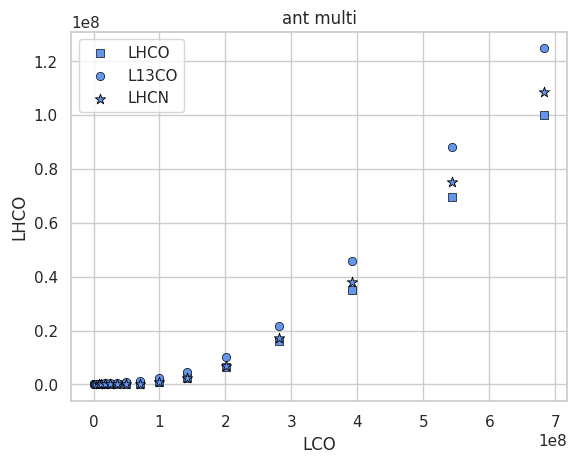

In [536]:
sns.scatterplot(data=antmultidf, x='LCO', y='LHCO',  color='cornflowerblue',edgecolor="black", marker=m_12co, label='LHCO')
sns.scatterplot(data=antmultidf, x='LCO', y='L13CO',  color='cornflowerblue',edgecolor="black", marker=m_13co, label='L13CO')
sns.scatterplot(data=antmultidf, x='LCO', y='LHCN', color='cornflowerblue',edgecolor="black", marker=m_hcn32, s=60, label='LHCN')
plt.title('ant multi')

<ipython-input-487-917ac3c0081d>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  beta[1] = 1
<ipython-input-487-917ac3c0081d>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  beta[1] = 1
<ipython-input-487-917ac3c0081d>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  beta[1] = 1
<ipython-input-487-917ac3c0081d>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docume

sol  L13CO [0.03214601]
a= 0.16619481583581655 b= 1.0
sol  LHCN [0.00732445]
a= 0.020211101448075645 b= 1.0
sol  LHCO [0.01256454]
a= 0.036926106101092857 b= 1.0


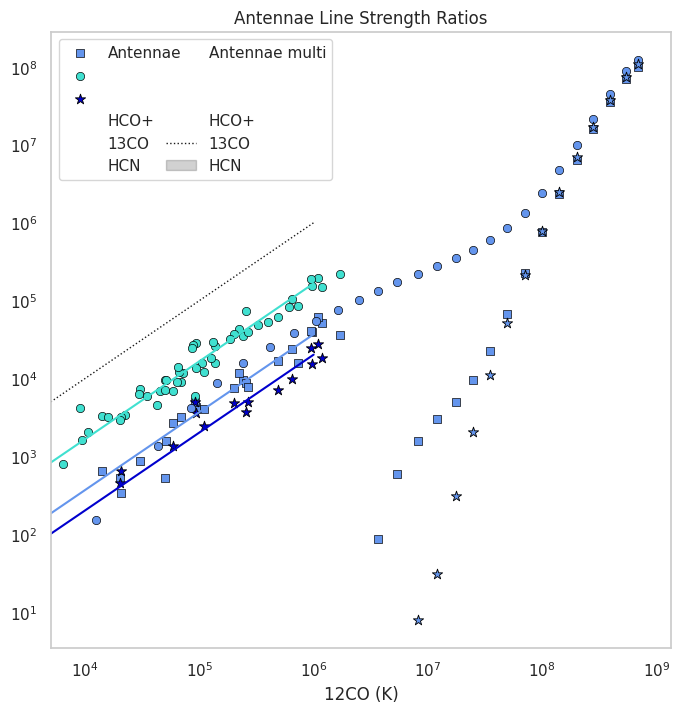

In [537]:
fig, ax = plt.subplots(figsize=(8,8))

#sns.scatterplot(data=ngc253df, x='CO(1-0)', y='HCO+(1-0)', color='orange', edgecolor='black', marker=m_12co)
#sns.scatterplot(data=ngc253df, x='CO(1-0)', y='HCN(1-0)', color='orange', edgecolor='black', marker=m_hcn32)

smoothdf = pd.read_csv('https://github.com/gracekrahm/30Dor_dense_gas/blob/main/onecloud30dor.txt?raw=True')
antdf = pd.read_csv(anturl)
sns.scatterplot(data=antdf, x='LCO', y='LHCO', color=c_12co, edgecolor="black", marker=m_12co)
sns.scatterplot(data=antdf, x='LCO', y='L13CO',  color=c_13co, edgecolor="black",marker=m_13co)
sns.scatterplot(data=antdf, x='LCO', y='LHCN', color='mediumblue', edgecolor="black",marker=m_hcn32, s=60)



#plot invisible lines
plt.plot(np.nan, np.nan, '.', ms=0)
plt.plot(np.nan, np.nan, '.', ms=0)
plt.plot(np.nan, np.nan, '.', ms=0)
plt.plot(np.nan, np.nan, '.', ms=0)
plt.plot(np.nan, np.nan, '.', ms=0)
plt.plot(np.nan, np.nan, '.', ms=0)
plt.plot(np.nan, np.nan, '.', ms=0)

plt.grid()


mr = np.arange(1,10**5, 10)
modelrange = np.arange(0,10**8, 1000)
sns.lineplot(x=np.arange(0,10**6, 1000),y=np.arange(0,10**6, 1000),linewidth=1, color='k', label='1-to-1', linestyle='dotted')
#sns.scatterplot(data=antdf, x='LCO', y='LHCO43', label='HCO+(4-3)')
#sns.scatterplot(data=antdf, x='LCO', y='LHCN43', label='HCN(4-3)')
modelrange = np.arange(0,10**6, 1000)
sns.lineplot(x=modelrange,y=try_fitline_odr(antdf,col='L13CO',model=modelrange,xaxis='LCO'),color=c_13co)
sns.lineplot(x=modelrange,y=try_fitline_odr(antdf,col='LHCN',model=modelrange,xaxis='LCO'),color='mediumblue')
sns.lineplot(x=modelrange,y=try_fitline_odr(antdf,col='LHCO',model=modelrange,xaxis='LCO'),color=c_12co)
sns.scatterplot(data=antmultidf, x='LCO', y='LHCO',  color='cornflowerblue',edgecolor="black", marker=m_12co)
sns.scatterplot(data=antmultidf, x='LCO', y='L13CO',  color='cornflowerblue',edgecolor="black", marker=m_13co)
sns.scatterplot(data=antmultidf, x='LCO', y='LHCN', color='cornflowerblue',edgecolor="black", marker=m_hcn32, s=60)





ax.set_xscale('log')
ax.set_yscale('log')
plt.xlabel('12CO (K)')
plt.ylabel('')
plt.title('Antennae Line Strength Ratios')
plt.xlim(left=10**3.7)
# Plot non-visible lines


plt.legend(['Antennae', '        ', '        ',
            'HCO+', '13CO', 'HCN',
            'Antennae multi', '        ', '        ',
            'HCO+', '13CO', 'HCN',], ncol=2, columnspacing=-1)
plt.show()

In [538]:
df30dor = multidf[multidf['nsig']<0]
df30dor

,nsig,LCO,LCOerr,L13CO,L13COerr,LHCO,LHCOerr,LHCN,LHCNerr,LCS,...,vel_dispHCN,vel_dispHCNerr,vel_dispCS,vel_dispCSerr,maj,min,R,Rerr,area,perim
41,-200,6819,681.9,848.0,84.87,74.95,7.567,12.4,1.592,9.668,...,4.944,0.5579,1.137,0.2837,12.36,2.232,8.523,5.12,779.3,1024.0


In [539]:
bigieldf
bigieldfnew = pd.read_csv('https://github.com/gracekrahm/antennae-dense-gas/blob/main/carma_bigiel?raw=True')
bigieldfnew = pd.read_csv('https://github.com/gracekrahm/antennae-dense-gas/blob/d10a1f79b26b400b0a4c21d0167469be09637941/carma_bigiel?raw=True')
bigieldfnew

,ncl,cltype,LCO,LCOerr,LHCO,LHCOerr,LHCN,LHCNerr,vel_dispCO,vel_dispCOerr,vel_dispHCO,vel_dispHCOerr,vel_dispHCN,vel_dispHCNerr,maj,min,R,Rerr,area,perim
0,2,2,193300000.0,19410000.0,3742000.0,387900.0,2431000.0,270500.0,29.60,0.9204,32.46,1.889,28.380,1.537,223.5,369.5,379.6,117.4,890200.0,5973
1,4,2,507700000.0,50850000.0,8435000.0,860600.0,4013000.0,443000.0,82.91,4.0540,79.75,4.725,2.351,55.450,321.5,238.3,358.3,112.3,2051000.0,9599
2,10,2,377400000.0,37810000.0,8060000.0,818700.0,4147000.0,447200.0,60.40,2.1300,50.80,1.968,64.900,4.341,217.2,447.8,427.7,194.7,1038000.0,5333


<ipython-input-487-917ac3c0081d>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  beta[1] = 1
<ipython-input-487-917ac3c0081d>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  beta[1] = 1
<ipython-input-487-917ac3c0081d>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  beta[1] = 1
<ipython-input-487-917ac3c0081d>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docume

sol  L13CO [0.03214601]
a= 0.16619481583581655 b= 1.0
sol  LHCN [0.00732445]
a= 0.020211101448075645 b= 1.0
sol  LHCO [0.01256454]
a= 0.036926106101092857 b= 1.0
sol  L13CO [0.03214601]
a= 0.16619481583581655 b= 1.0
sol  LHCN [0.00732445]
a= 0.020211101448075645 b= 1.0
sol  LHCO [0.01256454]
a= 0.036926106101092857 b= 1.0


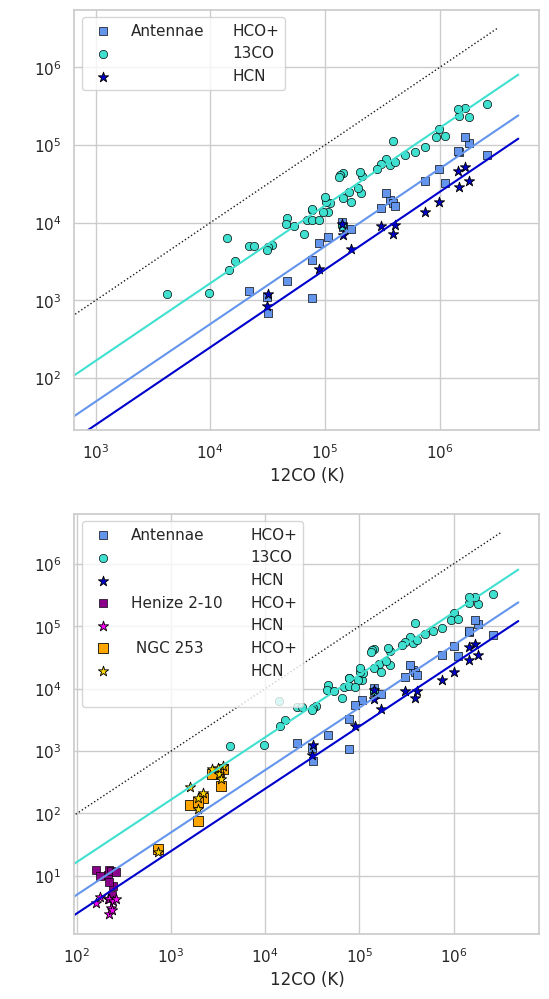

In [540]:
fig, ax = plt.subplots(nrows=2, ncols=1,figsize=(6,12))

#sns.scatterplot(data=ngc253df, x='CO(1-0)', y='HCO+(1-0)', color='orange', edgecolor='black', marker=m_12co)
#sns.scatterplot(data=ngc253df, x='CO(1-0)', y='HCN(1-0)', color='orange', edgecolor='black', marker=m_hcn32)

smoothdf = pd.read_csv('https://github.com/gracekrahm/30Dor_dense_gas/blob/main/onecloud30dor.txt?raw=True')
antdf = pd.read_csv(anturl)
sns.scatterplot(data=antdf, x=co_lr*antdf['LCO'], y=hco_lr*antdf['LHCO'], color=c_12co, edgecolor="black", marker=m_12co, ax=ax[0])
sns.scatterplot(data=antdf, x=co_lr*antdf['LCO'], y=co_lr*antdf['L13CO'],  color=c_13co, edgecolor="black",marker=m_13co, ax=ax[0])
sns.scatterplot(data=antdf, x=co_lr*antdf['LCO'], y=hcn_lr*antdf['LHCN'], color='mediumblue', edgecolor="black",marker=m_hcn32, s=60, ax=ax[0])


sns.scatterplot(data=antdf, x=co_lr*antdf['LCO'], y=hco_lr*antdf['LHCO'], color=c_12co, edgecolor="black", marker=m_12co, ax=ax[1])
sns.scatterplot(data=antdf, x=co_lr*antdf['LCO'], y=co_lr*antdf['L13CO'],  color=c_13co, edgecolor="black",marker=m_13co, ax=ax[1])
sns.scatterplot(data=antdf, x=co_lr*antdf['LCO'], y=hcn_lr*antdf['LHCN'], color='mediumblue', edgecolor="black",marker=m_hcn32, s=60, ax=ax[1])

sns.scatterplot(data=henizedf, x=co_lr*henizedf['LCO'], y='LHCO', color='darkmagenta', edgecolor="black", marker=m_12co, ax=ax[1])
sns.scatterplot(data=henizedf, x=co_lr*henizedf['LCO'], y='LHCN', color='magenta', edgecolor="black",marker=m_hcn32, s=60, ax=ax[1])

'''sns.scatterplot(data=df30dor_dendro3, x='LCO', y='LHCO',  color='lawngreen',edgecolor="black", marker=m_12co)
sns.scatterplot(data=df30dor_dendro3, x='LCO', y='L13CO',  color='lawngreen',edgecolor="black", marker=m_13co)
sns.scatterplot(data=df30dor_dendro3, x='LCO', y='LHCN', color='lawngreen',edgecolor="black", marker=m_hcn32, s=60)'''

'''sns.scatterplot(data=smoothdf, x='LCO', y='LHCO',  color='green',edgecolor="black", marker=m_12co, s=70)
sns.scatterplot(data=smoothdf, x='LCO', y='L13CO',  color='green',edgecolor="black", marker=m_13co, s=70)
sns.scatterplot(data=smoothdf, x='LCO', y='LHCN', color='green',edgecolor="black", marker=m_hcn32, s=90)
'''
'''sns.scatterplot(data=df30dor_m, x='LCO', y='LHCO',  color='lawngreen',edgecolor="black", marker=m_12co)
sns.scatterplot(data=df30dor_m, x='LCO', y='L13CO',  color='lawngreen',edgecolor="black", marker=m_13co)
sns.scatterplot(data=df30dor_m, x='LCO', y='LHCN', color='lawngreen',edgecolor="black", marker=m_hcn32, s=60)

sns.scatterplot(data=multidf, x='LCO', y='LHCO',  color='green',edgecolor="black", marker=m_12co)
sns.scatterplot(data=multidf, x='LCO', y='L13CO',  color='green',edgecolor="black", marker=m_13co)
sns.scatterplot(data=multidf, x='LCO', y='LHCN', color='green',edgecolor="black", marker=m_hcn32, s=60)'''


sns.scatterplot(data=ngc253df, x=ngc253df['CO(1-0)'], y=ngc253df['HCO+(1-0)'],  color='orange',edgecolor="black", marker=m_12co, s=50, ax=ax[1])
sns.scatterplot(data=ngc253df, x=ngc253df['CO(1-0)'], y=ngc253df['HCN(1-0)'],  color='gold',edgecolor="black",marker=m_hcn32, s=60, ax=ax[1])
#sns.scatterplot(data=ngc253df, x=ngc253df['CO(1-0)'], y=ngc253df['HCO+(1-0)'],  color='orange',edgecolor="black", marker=m_12co, s=50)

#sns.scatterplot(data=smoothdf, x='LCO', y='LHCO',  color='green',edgecolor="black", marker=m_12co, s=50)
#sns.scatterplot(data=df30dor, x='LCO', y='LHCO',  color='green',edgecolor="black", marker=m_12co, label='30dor')
#sns.scatterplot(data=df30dor, x='LCO', y='L13CO',  color='green',edgecolor="black", marker=m_13co, label='30dor')
#sns.scatterplot(data=df30dor, x='LCO', y='LHCN', color='green',edgecolor="black", marker=m_hcn32, s=60, label='30dor')

#sns.scatterplot(data=ngc253leroydf, x=1/ngc253leroydf['CO/HCO+'], y=ngc253leroydf['HCN/HCO+']/ngc253leroydf['CO/HCO+'], label='NGC 253 (Leroy+15)')
#sns.scatterplot(data=ngc253df, x=ngc253df['HCO+(1-0)']/ngc253df['CO(1-0)'], y=ngc253df['HCN(1-0)']/ngc253df['CO(1-0)'], label='NGC 253 (Meier+15)')


#plot invisible lines
ax[0].plot(np.nan, np.nan, '.', ms=0)
ax[0].plot(np.nan, np.nan, '.', ms=0)
ax[0].plot(np.nan, np.nan, '.', ms=0)
ax[0].plot(np.nan, np.nan, '.', ms=0)



plt.plot(np.nan, np.nan, '.', ms=0)
plt.plot(np.nan, np.nan, '.', ms=0)
plt.plot(np.nan, np.nan, '.', ms=0)
plt.plot(np.nan, np.nan, '.', ms=0)
plt.plot(np.nan, np.nan, '.', ms=0)
plt.plot(np.nan, np.nan, '.', ms=0)
plt.plot(np.nan, np.nan, '.', ms=0)
plt.plot(np.nan, np.nan, '.', ms=0)
plt.plot(np.nan, np.nan, '.', ms=0)
plt.plot(np.nan, np.nan, '.', ms=0)
plt.plot(np.nan, np.nan, '.', ms=0)

#ax[0].grid()
#ax[1].grid()
mr = np.arange(1,10**7, 10)
modelrange = np.arange(0,10**6.5, 1000)
modelrange1 = co_lr*modelrange
sns.lineplot(x=np.arange(0,10**6.5, 1000),y=np.arange(0,10**6.5, 1000),linewidth=1, color='k', label='1-to-1', linestyle='dotted', ax=ax[0])
sns.lineplot(x=np.arange(0,10**6.5, 1000),y=np.arange(0,10**6.5, 1000),linewidth=1, color='k', label='1-to-1', linestyle='dotted', ax=ax[1])


#sns.scatterplot(data=antdf, x='LCO', y='LHCO43', label='HCO+(4-3)')
#sns.scatterplot(data=antdf, x='LCO', y='LHCN43', label='HCN(4-3)')
modelrange = np.arange(0,10**6.5, 1000)
modelrange1 = co_lr*modelrange
sns.lineplot(x=modelrange1,y=[co_lr* x for x in try_fitline_odr(antdf,col='L13CO',model=modelrange,xaxis='LCO')],color=c_13co, ax=ax[0])
sns.lineplot(x=modelrange1,y=[hcn_lr* x for x in try_fitline_odr(antdf,col='LHCN',model=modelrange,xaxis='LCO')],color='mediumblue',ax=ax[0])
sns.lineplot(x=modelrange1,y=[hco_lr*x for x in try_fitline_odr(antdf,col='LHCO',model=modelrange,xaxis='LCO')],color=c_12co,ax=ax[0])
sns.lineplot(x=modelrange1,y=[co_lr*x for x in try_fitline_odr(antdf,col='L13CO',model=modelrange,xaxis='LCO')],color=c_13co, ax=ax[1])
sns.lineplot(x=modelrange1,y=[hcn_lr*x for x in try_fitline_odr(antdf,col='LHCN',model=modelrange,xaxis='LCO')],color='mediumblue',ax=ax[1])
sns.lineplot(x=modelrange1,y=[hco_lr*x for x in try_fitline_odr(antdf,col='LHCO',model=modelrange,xaxis='LCO')],color=c_12co,ax=ax[1])




ax[0].set_xscale('log')
ax[0].set_yscale('log')
ax[0].set_xlabel('12CO (K)')
ax[1].set_xscale('log')
ax[1].set_yscale('log')
ax[1].set_xlabel('12CO (K)')
ax[1].set_ylabel(' ')
ax[0].set_ylabel(' ')
#plt.title('Line Strength Ratios')

# Plot non-visible lines
ax[0].legend(['Antennae', '        ', '        ','HCO+', '13CO', 'HCN'], ncol=2, columnspacing=-1)

ax[1].legend(['Antennae', '        ', '        ',
            'Henize 2-10',' ', ' '
            #'30Dor clumps', '           ', '           ',
            #'30Dor multi', '           ', '           ',
            'NGC 253','           ', '           ',
            'HCO+', '13CO', 'HCN',
            'HCO+', 'HCN',
            #'HCO+', '13CO', 'HCN',
            #'HCO+', '13CO', 'HCN',
            'HCO+', 'HCN'], ncol=2, columnspacing=-1)
plt.show()

In [541]:
bigieldfnew

,ncl,cltype,LCO,LCOerr,LHCO,LHCOerr,LHCN,LHCNerr,vel_dispCO,vel_dispCOerr,vel_dispHCO,vel_dispHCOerr,vel_dispHCN,vel_dispHCNerr,maj,min,R,Rerr,area,perim
0,2,2,193300000.0,19410000.0,3742000.0,387900.0,2431000.0,270500.0,29.60,0.9204,32.46,1.889,28.380,1.537,223.5,369.5,379.6,117.4,890200.0,5973
1,4,2,507700000.0,50850000.0,8435000.0,860600.0,4013000.0,443000.0,82.91,4.0540,79.75,4.725,2.351,55.450,321.5,238.3,358.3,112.3,2051000.0,9599
2,10,2,377400000.0,37810000.0,8060000.0,818700.0,4147000.0,447200.0,60.40,2.1300,50.80,1.968,64.900,4.341,217.2,447.8,427.7,194.7,1038000.0,5333


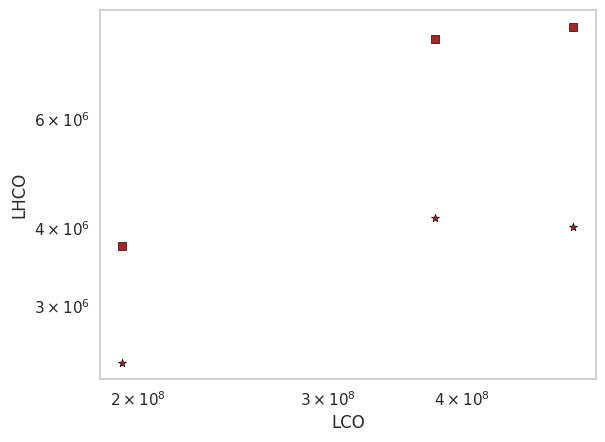

In [542]:
sns.scatterplot(data=bigieldfnew,x='LCO',y='LHCO', color='firebrick', edgecolor="black",marker=m_12co)
sns.scatterplot(data=bigieldfnew,x='LCO',y='LHCN', color='firebrick', edgecolor="black",marker=m_hcn32)
plt.xscale('log')
plt.yscale('log')

In [543]:
bigieldf.LHCO/bigieldf.LHCN

,0
0,1.666667
1,1.594340
2,1.922222


<ipython-input-487-917ac3c0081d>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  beta[1] = 1
<ipython-input-487-917ac3c0081d>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  beta[1] = 1
<ipython-input-487-917ac3c0081d>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  beta[1] = 1
<ipython-input-487-917ac3c0081d>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docume

sol  L13CO [0.03214601]
a= 0.16619481583581655 b= 1.0


<ipython-input-487-917ac3c0081d>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  beta[1] = 1
<ipython-input-487-917ac3c0081d>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  beta[1] = 1
<ipython-input-487-917ac3c0081d>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  beta[1] = 1
<ipython-input-487-917ac3c0081d>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docume

sol  LHCN [0.00732445]
a= 0.020211101448075645 b= 1.0


<ipython-input-487-917ac3c0081d>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  beta[1] = 1
<ipython-input-487-917ac3c0081d>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  beta[1] = 1
<ipython-input-487-917ac3c0081d>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  beta[1] = 1
<ipython-input-487-917ac3c0081d>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docume

sol  LHCO [0.01256454]
a= 0.036926106101092857 b= 1.0


<ipython-input-487-917ac3c0081d>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  beta[1] = 1
<ipython-input-487-917ac3c0081d>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  beta[1] = 1
<ipython-input-487-917ac3c0081d>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  beta[1] = 1
<ipython-input-487-917ac3c0081d>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docume

sol  L13CO [0.03214601]
a= 0.16619481583581655 b= 1.0
sol  LHCN [0.00732445]
a= 0.020211101448075645 b= 1.0
sol  LHCO [0.01256454]
a= 0.036926106101092857 b= 1.0


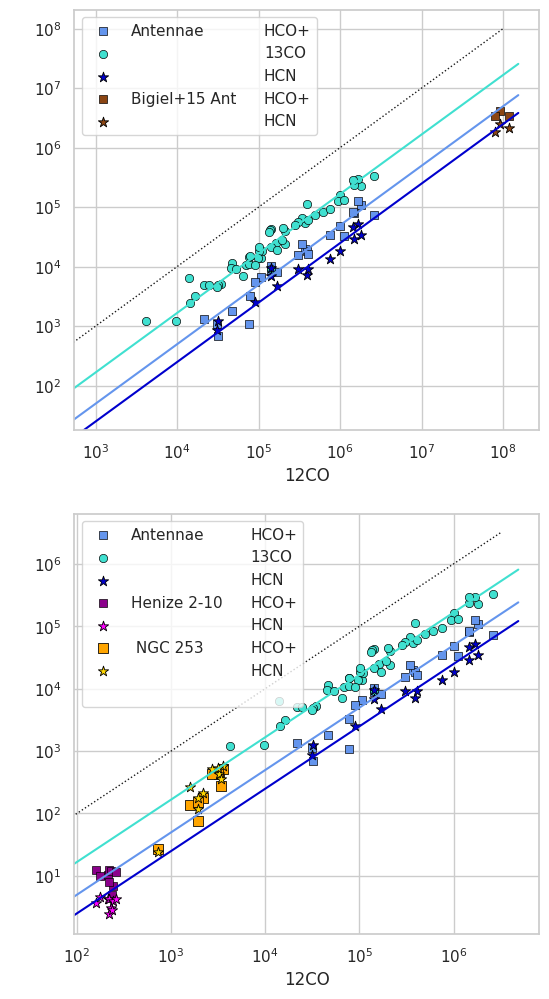

In [544]:
fig, ax = plt.subplots(nrows=2, ncols=1,figsize=(6,12))

#sns.scatterplot(data=ngc253df, x='CO(1-0)', y='HCO+(1-0)', color='orange', edgecolor='black', marker=m_12co)
#sns.scatterplot(data=ngc253df, x='CO(1-0)', y='HCN(1-0)', color='orange', edgecolor='black', marker=m_hcn32)

smoothdf = pd.read_csv('https://github.com/gracekrahm/30Dor_dense_gas/blob/main/onecloud30dor.txt?raw=True')
antdf = pd.read_csv(anturl)
sns.scatterplot(data=antdf, x=co_lr*antdf['LCO'], y=hco_lr*antdf['LHCO'], color=c_12co, edgecolor="black", marker=m_12co, ax=ax[0])
sns.scatterplot(data=antdf, x=co_lr*antdf['LCO'], y=co_lr*antdf['L13CO'],  color=c_13co, edgecolor="black",marker=m_13co, ax=ax[0])
sns.scatterplot(data=antdf, x=co_lr*antdf['LCO'], y=hcn_lr*antdf['LHCN'], color='mediumblue', edgecolor="black",marker=m_hcn32, s=60, ax=ax[0])
sns.scatterplot(x=[9.2E7,11.7E7,8E7], y=[.25E7*1.666667,.21E7*1.594340,.18E7*1.922222], color='saddlebrown', edgecolor="black",marker=m_12co,ax=ax[0])
sns.scatterplot(x=[9.2E7,11.7E7,8E7], y=[.25E7,.21E7,.18E7], color='saddlebrown', edgecolor="black",marker=m_hcn32, s=60, ax=ax[0])
#sns.scatterplot(data=bigieldfnew,x='LCO',y='LHCO', color='firebrick', edgecolor="black",marker=m_12co, s=60, ax=ax[0])
#sns.scatterplot(data=bigieldfnew,x='LCO',y='LHCN', color='firebrick', edgecolor="black",marker=m_hcn32, s=60, ax=ax[0])


###sns.scatterplot(data=bigieldf, x='LCO', y='LHCO', color='lightsteelblue', edgecolor="black",marker=m_12co, s=60, ax=ax[0])
###sns.scatterplot(data=bigieldf, x='LCO', y='LHCN', color='lightsteelblue', edgecolor="black",marker=m_hcn32, s=60, ax=ax[0])
#sns.scatterplot(data=bigieldf, x=co_lr*bigieldf['LCO21'], y='LHCO', color='lightsteelblue', edgecolor="black",marker=m_12co, s=60, ax=ax[0])
#sns.scatterplot(data=bigieldf, x=co_lr*bigieldf['LCO21'], y='LHCN', color='lightsteelblue', edgecolor="black",marker=m_hcn32, s=60, ax=ax[0])

sns.scatterplot(data=antdf, x=co_lr*antdf['LCO'], y=hco_lr*antdf['LHCO'], color=c_12co, edgecolor="black", marker=m_12co, ax=ax[1])
sns.scatterplot(data=antdf, x=co_lr*antdf['LCO'], y=co_lr*antdf['L13CO'],  color=c_13co, edgecolor="black",marker=m_13co, ax=ax[1])
sns.scatterplot(data=antdf, x=co_lr*antdf['LCO'], y=hcn_lr*antdf['LHCN'], color='mediumblue', edgecolor="black",marker=m_hcn32, s=60, ax=ax[1])

###sns.scatterplot(data=bigieldf, x='LCO', y='LHCO', color='lightsteelblue', edgecolor="black",marker=m_12co, s=60, ax=ax[1])
###sns.scatterplot(data=bigieldf, x='LCO', y='LHCN', color='lightsteelblue', edgecolor="black",marker=m_hcn32, s=60, ax=ax[1])
#sns.scatterplot(data=bigieldf, x=co_lr*bigieldf['LCO21'], y='LHCO', color='lightsteelblue', edgecolor="black",marker=m_12co, s=60, ax=ax[1])
#sns.scatterplot(data=bigieldf, x=co_lr*bigieldf['LCO21'], y='LHCN', color='lightsteelblue', edgecolor="black",marker=m_hcn32, s=60, ax=ax[1])

sns.scatterplot(data=henizedf, x=co_lr*henizedf['LCO'], y='LHCO', color='darkmagenta', edgecolor="black", marker=m_12co, ax=ax[1])
sns.scatterplot(data=henizedf, x=co_lr*henizedf['LCO'], y='LHCN', color='magenta', edgecolor="black",marker=m_hcn32, s=60, ax=ax[1])

'''sns.scatterplot(data=df30dor_dendro3, x='LCO', y='LHCO',  color='lawngreen',edgecolor="black", marker=m_12co)
sns.scatterplot(data=df30dor_dendro3, x='LCO', y='L13CO',  color='lawngreen',edgecolor="black", marker=m_13co)
sns.scatterplot(data=df30dor_dendro3, x='LCO', y='LHCN', color='lawngreen',edgecolor="black", marker=m_hcn32, s=60)'''

'''sns.scatterplot(data=smoothdf, x='LCO', y='LHCO',  color='green',edgecolor="black", marker=m_12co, s=70)
sns.scatterplot(data=smoothdf, x='LCO', y='L13CO',  color='green',edgecolor="black", marker=m_13co, s=70)
sns.scatterplot(data=smoothdf, x='LCO', y='LHCN', color='green',edgecolor="black", marker=m_hcn32, s=90)
'''
'''sns.scatterplot(data=df30dor_m, x='LCO', y='LHCO',  color='lawngreen',edgecolor="black", marker=m_12co)
sns.scatterplot(data=df30dor_m, x='LCO', y='L13CO',  color='lawngreen',edgecolor="black", marker=m_13co)
sns.scatterplot(data=df30dor_m, x='LCO', y='LHCN', color='lawngreen',edgecolor="black", marker=m_hcn32, s=60)

sns.scatterplot(data=multidf, x='LCO', y='LHCO',  color='green',edgecolor="black", marker=m_12co)
sns.scatterplot(data=multidf, x='LCO', y='L13CO',  color='green',edgecolor="black", marker=m_13co)
sns.scatterplot(data=multidf, x='LCO', y='LHCN', color='green',edgecolor="black", marker=m_hcn32, s=60)'''


sns.scatterplot(data=ngc253df, x=ngc253df['CO(1-0)'], y=ngc253df['HCO+(1-0)'],  color='orange',edgecolor="black", marker=m_12co, s=50, ax=ax[1])
sns.scatterplot(data=ngc253df, x=ngc253df['CO(1-0)'], y=ngc253df['HCN(1-0)'],  color='gold',edgecolor="black",marker=m_hcn32, s=60, ax=ax[1])
#sns.scatterplot(data=ngc253df, x=ngc253df['CO(1-0)'], y=ngc253df['HCO+(1-0)'],  color='orange',edgecolor="black", marker=m_12co, s=50)

#sns.scatterplot(data=smoothdf, x='LCO', y='LHCO',  color='green',edgecolor="black", marker=m_12co, s=50)
#sns.scatterplot(data=df30dor, x='LCO', y='LHCO',  color='green',edgecolor="black", marker=m_12co, label='30dor')
#sns.scatterplot(data=df30dor, x='LCO', y='L13CO',  color='green',edgecolor="black", marker=m_13co, label='30dor')
#sns.scatterplot(data=df30dor, x='LCO', y='LHCN', color='green',edgecolor="black", marker=m_hcn32, s=60, label='30dor')

#sns.scatterplot(data=ngc253leroydf, x=1/ngc253leroydf['CO/HCO+'], y=ngc253leroydf['HCN/HCO+']/ngc253leroydf['CO/HCO+'], label='NGC 253 (Leroy+15)')
#sns.scatterplot(data=ngc253df, x=ngc253df['HCO+(1-0)']/ngc253df['CO(1-0)'], y=ngc253df['HCN(1-0)']/ngc253df['CO(1-0)'], label='NGC 253 (Meier+15)')


#plot invisible lines
ax[0].plot(np.nan, np.nan, '.', ms=0)
ax[0].plot(np.nan, np.nan, '.', ms=0)
ax[0].plot(np.nan, np.nan, '.', ms=0)
ax[0].plot(np.nan, np.nan, '.', ms=0)
ax[0].plot(np.nan, np.nan, '.', ms=0)
ax[0].plot(np.nan, np.nan, '.', ms=0)
ax[0].plot(np.nan, np.nan, '.', ms=0)


plt.plot(np.nan, np.nan, '.', ms=0)
plt.plot(np.nan, np.nan, '.', ms=0)
plt.plot(np.nan, np.nan, '.', ms=0)
plt.plot(np.nan, np.nan, '.', ms=0)
plt.plot(np.nan, np.nan, '.', ms=0)
plt.plot(np.nan, np.nan, '.', ms=0)
plt.plot(np.nan, np.nan, '.', ms=0)
plt.plot(np.nan, np.nan, '.', ms=0)
plt.plot(np.nan, np.nan, '.', ms=0)
plt.plot(np.nan, np.nan, '.', ms=0)
plt.plot(np.nan, np.nan, '.', ms=0)

#ax[0].grid()
#ax[1].grid()
mr = np.arange(1,10**7, 10)
modelrange = np.arange(0,10**6.5, 1000)
modelrange1 = co_lr*modelrange
sns.lineplot(x=np.arange(0,10**8, 1000),y=np.arange(0,10**8, 1000),linewidth=1, color='k', label='1-to-1', linestyle='dotted', ax=ax[0])
sns.lineplot(x=np.arange(0,10**6.5, 1000),y=np.arange(0,10**6.5, 1000),linewidth=1, color='k', label='1-to-1', linestyle='dotted', ax=ax[1])


#sns.scatterplot(data=antdf, x='LCO', y='LHCO43', label='HCO+(4-3)')
#sns.scatterplot(data=antdf, x='LCO', y='LHCN43', label='HCN(4-3)')
modelrange = np.arange(0,10**8, 1000)
modelrange1 = co_lr*modelrange
sns.lineplot(x=modelrange1,y=[co_lr* x for x in try_fitline_odr(antdf,col='L13CO',model=modelrange,xaxis='LCO')],color=c_13co, ax=ax[0])
sns.lineplot(x=modelrange1,y=[hcn_lr* x for x in try_fitline_odr(antdf,col='LHCN',model=modelrange,xaxis='LCO')],color='mediumblue',ax=ax[0])
sns.lineplot(x=modelrange1,y=[hco_lr*x for x in try_fitline_odr(antdf,col='LHCO',model=modelrange,xaxis='LCO')],color=c_12co,ax=ax[0])

modelrange = np.arange(0,10**6.5, 1000)
modelrange1 = co_lr*modelrange
sns.lineplot(x=modelrange1,y=[co_lr*x for x in try_fitline_odr(antdf,col='L13CO',model=modelrange,xaxis='LCO')],color=c_13co, ax=ax[1])
sns.lineplot(x=modelrange1,y=[hcn_lr*x for x in try_fitline_odr(antdf,col='LHCN',model=modelrange,xaxis='LCO')],color='mediumblue',ax=ax[1])
sns.lineplot(x=modelrange1,y=[hco_lr*x for x in try_fitline_odr(antdf,col='LHCO',model=modelrange,xaxis='LCO')],color=c_12co,ax=ax[1])




ax[0].set_xscale('log')
ax[0].set_yscale('log')
#ax[0].set_xlabel('12CO $\mathrm{(K\:km\:s^{-1}\:pc^{-2})}$')
#ax[1].set_xlabel('12CO $\mathrm{(K\:km\:s^{-1}\:pc^{-2})}$')
ax[0].set_xlabel('12CO')
ax[1].set_xlabel('12CO')
ax[1].set_xscale('log')
ax[1].set_yscale('log')
#ax[1].set_xlabel('12CO (K)')
ax[1].set_ylabel(' ')
ax[0].set_ylabel(' ')
#plt.title('Line Strength Ratios')

# Plot non-visible lines
ax[0].legend(['Antennae', '        ', '        ','Bigiel+15 Ant','        ','HCO+', '13CO', 'HCN','HCO+','HCN'], ncol=2, columnspacing=-1)

ax[1].legend(['Antennae', '        ', '        ',
            #  'Bigiel+15 Ant','        ',
            'Henize 2-10',' ', ' '
            #'30Dor clumps', '           ', '           ',
            #'30Dor multi', '           ', '           ',
            'NGC 253','           ', '           ',
            'HCO+', '13CO', 'HCN',
          #  'HCN',
            'HCO+', 'HCN',
            #'HCO+', '13CO', 'HCN',
            #'HCO+', '13CO', 'HCN',
            'HCO+', 'HCN'], ncol=2, columnspacing=-1)
plt.show()

In [545]:
df30dor = multidf[multidf['nsig']<0]
df30dor

,nsig,LCO,LCOerr,L13CO,L13COerr,LHCO,LHCOerr,LHCN,LHCNerr,LCS,...,vel_dispHCN,vel_dispHCNerr,vel_dispCS,vel_dispCSerr,maj,min,R,Rerr,area,perim
41,-200,6819,681.9,848.0,84.87,74.95,7.567,12.4,1.592,9.668,...,4.944,0.5579,1.137,0.2837,12.36,2.232,8.523,5.12,779.3,1024.0


<ipython-input-487-917ac3c0081d>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  beta[1] = 1
<ipython-input-487-917ac3c0081d>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  beta[1] = 1
<ipython-input-487-917ac3c0081d>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  beta[1] = 1
<ipython-input-487-917ac3c0081d>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docume

sol  L13CO [0.03214601]
a= 0.16619481583581655 b= 1.0


<ipython-input-487-917ac3c0081d>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  beta[1] = 1
<ipython-input-487-917ac3c0081d>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  beta[1] = 1
<ipython-input-487-917ac3c0081d>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  beta[1] = 1
<ipython-input-487-917ac3c0081d>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docume

sol  LHCN [0.00732445]
a= 0.020211101448075645 b= 1.0


<ipython-input-487-917ac3c0081d>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  beta[1] = 1
<ipython-input-487-917ac3c0081d>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  beta[1] = 1
<ipython-input-487-917ac3c0081d>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  beta[1] = 1
<ipython-input-487-917ac3c0081d>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docume

sol  LHCO [0.01256454]
a= 0.036926106101092857 b= 1.0


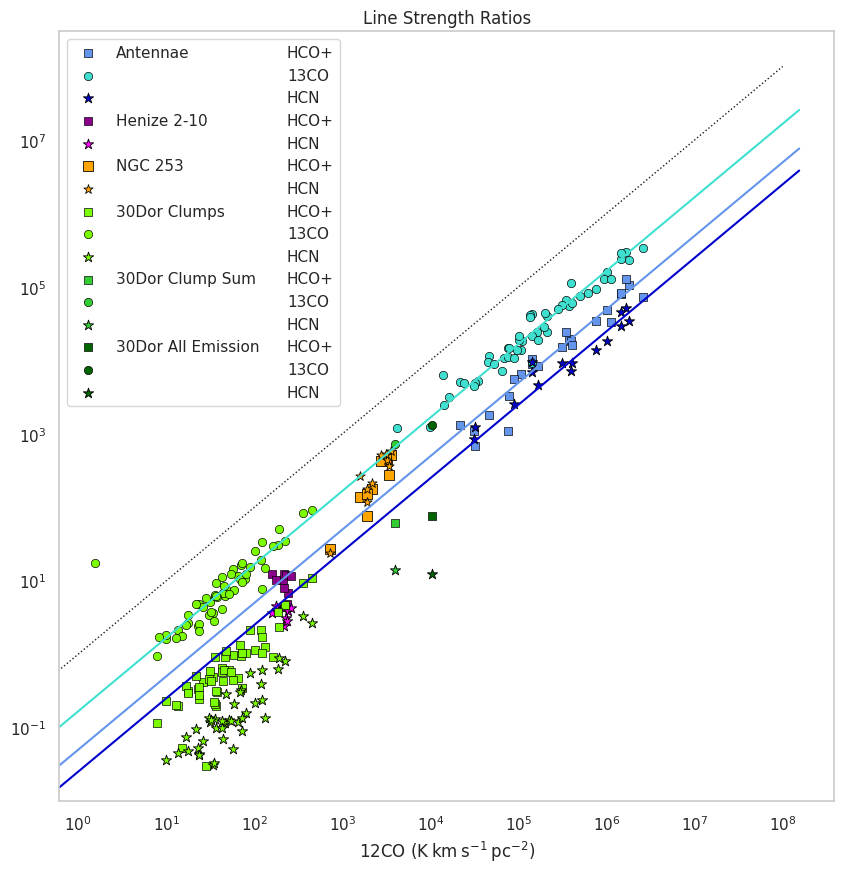

In [546]:
fig, ax = plt.subplots(nrows=1, ncols=1,figsize=(10,10))

#sns.scatterplot(data=ngc253df, x='CO(1-0)', y='HCO+(1-0)', color='orange', edgecolor='black', marker=m_12co)
#sns.scatterplot(data=ngc253df, x='CO(1-0)', y='HCN(1-0)', color='orange', edgecolor='black', marker=m_hcn32)

sns.scatterplot(data=antdf, x=co_lr*antdf['LCO'], y=hco_lr*antdf['LHCO'], color=c_12co, edgecolor="black", marker=m_12co, ax=ax)
sns.scatterplot(data=antdf, x=co_lr*antdf['LCO'], y=co_lr*antdf['L13CO'],  color=c_13co, edgecolor="black",marker=m_13co, ax=ax)
sns.scatterplot(data=antdf, x=co_lr*antdf['LCO'], y=hcn_lr*antdf['LHCN'], color='mediumblue', edgecolor="black",marker=m_hcn32, s=60, ax=ax)

sns.scatterplot(data=henizedf, x=co_lr*henizedf['LCO'], y='LHCO', color='darkmagenta', edgecolor="black", marker=m_12co, ax=ax)
sns.scatterplot(data=henizedf, x=co_lr*henizedf['LCO'], y='LHCN', color='magenta', edgecolor="black",marker=m_hcn32, s=60, ax=ax)


sns.scatterplot(data=ngc253df, x=ngc253df['CO(1-0)'], y=ngc253df['HCO+(1-0)'],  color='orange',edgecolor="black", marker=m_12co, s=50)
sns.scatterplot(data=ngc253df, x=ngc253df['CO(1-0)'], y=ngc253df['HCN(1-0)'],  color='orange',edgecolor="black", marker='*', s=50)
#sns.scatterplot(data=ngc253df, x=ngc253df['CO(1-0)'], y=ngc253df['HCO+(1-0)'],  color='orange',edgecolor="black", marker=m_12co, s=50)

#sns.scatterplot(data=smoothdf, x='LCO', y='LHCO',  color='green',edgecolor="black", marker=m_12co, s=50)

sns.scatterplot(data=df30dor_m, x=co_lr*df30dor_m['LCO'], y=df30dor_m['LHCO'],  color='lawngreen',edgecolor="black", marker=m_12co)
sns.scatterplot(data=df30dor_m, x=co_lr*df30dor_m['LCO'], y=co_lr*df30dor_m['L13CO'],  color='lawngreen',edgecolor="black", marker=m_13co)
sns.scatterplot(data=df30dor_m, x=co_lr*df30dor_m['LCO'], y=df30dor_m['LHCN'], color='lawngreen',edgecolor="black", marker=m_hcn32, s=60)


sns.scatterplot(data=df30dor_clump_sum, x=co_lr*df30dor_clump_sum['LCO'], y=df30dor_clump_sum['LHCO'],  color='limegreen',edgecolor="black", marker=m_12co)
sns.scatterplot(data=df30dor_clump_sum, x=co_lr*df30dor_clump_sum['LCO'], y=co_lr*df30dor_clump_sum['L13CO'],  color='limegreen',edgecolor="black", marker=m_13co)
sns.scatterplot(data=df30dor_clump_sum, x=co_lr*df30dor_clump_sum['LCO'], y=df30dor_clump_sum['LHCN'], color='limegreen',edgecolor="black", marker=m_hcn32, s=60)

sns.scatterplot(data=df30dor, x=co_lr*df30dor['LCO'], y=df30dor['LHCO'],  color='darkgreen',edgecolor="black", marker=m_12co, label='30dor')
sns.scatterplot(data=df30dor, x=co_lr*df30dor['LCO'], y=co_lr*df30dor['L13CO'],  color='darkgreen',edgecolor="black", marker=m_13co, label='30dor')
sns.scatterplot(data=df30dor, x=co_lr*df30dor['LCO'], y=df30dor['LHCN'], color='darkgreen',edgecolor="black", marker=m_hcn32, s=60, label='30dor')

#sns.scatterplot(data=ngc253leroydf, x=1/ngc253leroydf['CO/HCO+'], y=ngc253leroydf['HCN/HCO+']/ngc253leroydf['CO/HCO+'], label='NGC 253 (Leroy+15)')
#sns.scatterplot(data=ngc253df, x=ngc253df['HCO+(1-0)']/ngc253df['CO(1-0)'], y=ngc253df['HCN(1-0)']/ngc253df['CO(1-0)'], label='NGC 253 (Meier+15)')


#plot invisible lines
plt.plot(np.nan, np.nan, '.', ms=0)
plt.plot(np.nan, np.nan, '.', ms=0)
plt.plot(np.nan, np.nan, '.', ms=0)
plt.plot(np.nan, np.nan, '.', ms=0)
plt.plot(np.nan, np.nan, '.', ms=0)
plt.plot(np.nan, np.nan, '.', ms=0)
plt.plot(np.nan, np.nan, '.', ms=0)
plt.plot(np.nan, np.nan, '.', ms=0)
plt.plot(np.nan, np.nan, '.', ms=0)
plt.plot(np.nan, np.nan, '.', ms=0)
plt.plot(np.nan, np.nan, '.', ms=0)
plt.plot(np.nan, np.nan, '.', ms=0)
plt.plot(np.nan, np.nan, '.', ms=0)
plt.plot(np.nan, np.nan, '.', ms=0)
plt.plot(np.nan, np.nan, '.', ms=0)
plt.plot(np.nan, np.nan, '.', ms=0)
plt.plot(np.nan, np.nan, '.', ms=0)
plt.plot(np.nan, np.nan, '.', ms=0)
plt.plot(np.nan, np.nan, '.', ms=0)
plt.plot(np.nan, np.nan, '.', ms=0)

plt.grid()
mr = np.arange(1,10**5, 10)
modelrange = np.arange(0,10**8, 1000)
modelrange1 = co_lr*modelrange
sns.lineplot(x=np.arange(0,10**8, 1000),y=np.arange(0,10**8, 1000),linewidth=1, color='k', label='1-to-1', linestyle='dotted')
#sns.scatterplot(data=antdf, x='LCO', y='LHCO43', label='HCO+(4-3)')
#sns.scatterplot(data=antdf, x='LCO', y='LHCN43', label='HCN(4-3)')
sns.lineplot(x=modelrange1,y=[co_lr* x for x in try_fitline_odr(antdf,col='L13CO',model=modelrange,xaxis='LCO')],color=c_13co, ax=ax)
sns.lineplot(x=modelrange1,y=[hcn_lr* x for x in try_fitline_odr(antdf,col='LHCN',model=modelrange,xaxis='LCO')],color='mediumblue',ax=ax)
sns.lineplot(x=modelrange1,y=[hco_lr*x for x in try_fitline_odr(antdf,col='LHCO',model=modelrange,xaxis='LCO')],color=c_12co,ax=ax)





ax.set_xscale('log')
ax.set_yscale('log')
#plt.xlabel('12CO $\mathrm{(K\:km\:s^{-1}\:pc^{-2})}$')
plt.xlabel('12CO $\mathrm{(K\:km\:s^{-1}\:pc^{-2})}$')
plt.ylabel('')
plt.title('Line Strength Ratios')

# Plot non-visible lines


plt.legend(['Antennae', '        ', '        ',
            'Henize 2-10',' ',
            'NGC 253','           ',
            '30Dor Clumps', '           ', '           ',
            '30Dor Clump Sum', '           ', '           ',
            '30Dor All Emission', '           ', '           ',
            'HCO+', '13CO', 'HCN',
            'HCO+', 'HCN',
            'HCO+', 'HCN',
            'HCO+', '13CO', 'HCN',
            'HCO+', '13CO', 'HCN',
            'HCO+', '13CO','HCN'], ncol=2, columnspacing=-1)
plt.show()

<ipython-input-487-917ac3c0081d>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  beta[1] = 1
<ipython-input-487-917ac3c0081d>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  beta[1] = 1
<ipython-input-487-917ac3c0081d>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  beta[1] = 1
<ipython-input-487-917ac3c0081d>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the docume

sol  L13CO [0.03214601]
a= 0.16619481583581655 b= 1.0
sol  LHCN [0.00732445]
a= 0.020211101448075645 b= 1.0
sol  LHCO [0.01256454]
a= 0.036926106101092857 b= 1.0


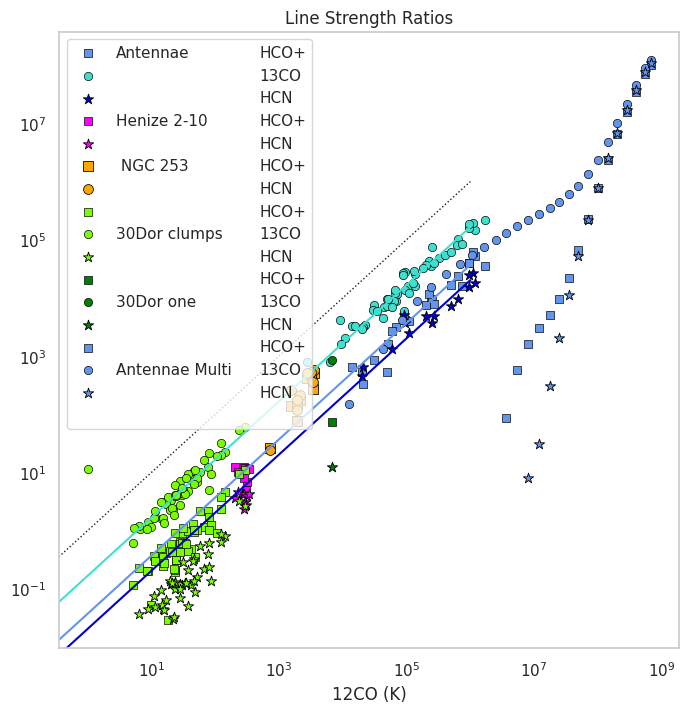

In [547]:
fig, ax = plt.subplots(figsize=(8,8))

#sns.scatterplot(data=ngc253df, x='CO(1-0)', y='HCO+(1-0)', color='orange', edgecolor='black', marker=m_12co)
#sns.scatterplot(data=ngc253df, x='CO(1-0)', y='HCN(1-0)', color='orange', edgecolor='black', marker=m_hcn32)

smoothdf = pd.read_csv('https://github.com/gracekrahm/30Dor_dense_gas/blob/main/onecloud30dor.txt?raw=True')
antdf = pd.read_csv(anturl)
sns.scatterplot(data=antdf, x='LCO', y='LHCO', color=c_12co, edgecolor="black", marker=m_12co)
sns.scatterplot(data=antdf, x='LCO', y='L13CO',  color=c_13co, edgecolor="black",marker=m_13co)
sns.scatterplot(data=antdf, x='LCO', y='LHCN', color='mediumblue', edgecolor="black",marker=m_hcn32, s=60)


sns.scatterplot(data=henizedf, x=2*henizedf['LCO'], y='LHCO', color='magenta', edgecolor="black", marker=m_12co)
sns.scatterplot(data=henizedf, x=2*henizedf['LCO'], y='LHCN', color='magenta', edgecolor="black",marker=m_hcn32, s=60)

'''sns.scatterplot(data=df30dor_dendro3, x='LCO', y='LHCO',  color='lawngreen',edgecolor="black", marker=m_12co)
sns.scatterplot(data=df30dor_dendro3, x='LCO', y='L13CO',  color='lawngreen',edgecolor="black", marker=m_13co)
sns.scatterplot(data=df30dor_dendro3, x='LCO', y='LHCN', color='lawngreen',edgecolor="black", marker=m_hcn32, s=60)'''

'''sns.scatterplot(data=smoothdf, x='LCO', y='LHCO',  color='green',edgecolor="black", marker=m_12co, s=70)
sns.scatterplot(data=smoothdf, x='LCO', y='L13CO',  color='green',edgecolor="black", marker=m_13co, s=70)
sns.scatterplot(data=smoothdf, x='LCO', y='LHCN', color='green',edgecolor="black", marker=m_hcn32, s=90)
'''


sns.scatterplot(data=ngc253df, x=ngc253df['CO(1-0)'], y=ngc253df['HCO+(1-0)'],  color='orange',edgecolor="black", marker=m_12co, s=50)
sns.scatterplot(data=ngc253df, x=ngc253df['CO(1-0)'], y=ngc253df['HCN(1-0)'],  color='orange',edgecolor="black", marker=m_13co, s=50)
#sns.scatterplot(data=ngc253df, x=ngc253df['CO(1-0)'], y=ngc253df['HCO+(1-0)'],  color='orange',edgecolor="black", marker=m_12co, s=50)
sns.scatterplot(data=df30dor_m, x='LCO', y='LHCO',  color='lawngreen',edgecolor="black", marker=m_12co)
sns.scatterplot(data=df30dor_m, x='LCO', y='L13CO',  color='lawngreen',edgecolor="black", marker=m_13co)
sns.scatterplot(data=df30dor_m, x='LCO', y='LHCN', color='lawngreen',edgecolor="black", marker=m_hcn32, s=60)

'''sns.scatterplot(data=multidf, x='LCO', y='LHCO',  color='green',edgecolor="black", marker=m_12co)
sns.scatterplot(data=multidf, x='LCO', y='L13CO',  color='green',edgecolor="black", marker=m_13co)
sns.scatterplot(data=multidf, x='LCO', y='LHCN', color='green',edgecolor="black", marker=m_hcn32, s=60)'''
sns.scatterplot(data=df30dor, x='LCO', y='LHCO',  color='green',edgecolor="black", marker=m_12co)
sns.scatterplot(data=df30dor, x='LCO', y='L13CO',  color='green',edgecolor="black", marker=m_13co)
sns.scatterplot(data=df30dor, x='LCO', y='LHCN', color='green',edgecolor="black", marker=m_hcn32, s=60)

#sns.scatterplot(data=smoothdf, x='LCO', y='LHCO',  color='green',edgecolor="black", marker=m_12co, s=50)
sns.scatterplot(data=antmultidf, x='LCO', y='LHCO',  color='cornflowerblue',edgecolor="black", marker=m_12co)
sns.scatterplot(data=antmultidf, x='LCO', y='L13CO',  color='cornflowerblue',edgecolor="black", marker=m_13co)
sns.scatterplot(data=antmultidf, x='LCO', y='LHCN', color='cornflowerblue',edgecolor="black", marker=m_hcn32, s=60)

#sns.scatterplot(data=ngc253leroydf, x=1/ngc253leroydf['CO/HCO+'], y=ngc253leroydf['HCN/HCO+']/ngc253leroydf['CO/HCO+'], label='NGC 253 (Leroy+15)')
#sns.scatterplot(data=ngc253df, x=ngc253df['HCO+(1-0)']/ngc253df['CO(1-0)'], y=ngc253df['HCN(1-0)']/ngc253df['CO(1-0)'], label='NGC 253 (Meier+15)')


#plot invisible lines
plt.plot(np.nan, np.nan, '.', ms=0)
plt.plot(np.nan, np.nan, '.', ms=0)
plt.plot(np.nan, np.nan, '.', ms=0)
plt.plot(np.nan, np.nan, '.', ms=0)
plt.plot(np.nan, np.nan, '.', ms=0)
plt.plot(np.nan, np.nan, '.', ms=0)
plt.plot(np.nan, np.nan, '.', ms=0)
plt.plot(np.nan, np.nan, '.', ms=0)
plt.plot(np.nan, np.nan, '.', ms=0)
plt.plot(np.nan, np.nan, '.', ms=0)
plt.plot(np.nan, np.nan, '.', ms=0)
plt.plot(np.nan, np.nan, '.', ms=0)
plt.plot(np.nan, np.nan, '.', ms=0)
plt.plot(np.nan, np.nan, '.', ms=0)
plt.plot(np.nan, np.nan, '.', ms=0)
plt.plot(np.nan, np.nan, '.', ms=0)
plt.plot(np.nan, np.nan, '.', ms=0)

plt.grid()
mr = np.arange(1,10**5, 10)
modelrange = np.arange(0,10**8, 1000)
sns.lineplot(x=np.arange(0,10**6, 1000),y=np.arange(0,10**6, 1000),linewidth=1, color='k', label='1-to-1', linestyle='dotted')
#sns.scatterplot(data=antdf, x='LCO', y='LHCO43', label='HCO+(4-3)')
#sns.scatterplot(data=antdf, x='LCO', y='LHCN43', label='HCN(4-3)')
modelrange = np.arange(0,10**6, 1000)
sns.lineplot(x=modelrange,y=try_fitline_odr(antdf,col='L13CO',model=modelrange,xaxis='LCO'),color=c_13co)
sns.lineplot(x=modelrange,y=try_fitline_odr(antdf,col='LHCN',model=modelrange,xaxis='LCO'),color='mediumblue')
sns.lineplot(x=modelrange,y=try_fitline_odr(antdf,col='LHCO',model=modelrange,xaxis='LCO'),color=c_12co)





ax.set_xscale('log')
ax.set_yscale('log')
plt.xlabel('12CO (K)')
plt.ylabel('')
plt.title('Line Strength Ratios')

# Plot non-visible lines


plt.legend(['Antennae', '        ', '        ',
            'Henize 2-10',' ', ' '
            'NGC 253','           ', '           ',
            '30Dor clumps', '           ', '           ',
            '30Dor one', '           ', '           ',
            'Antennae Multi', '           ', '           ',
            'HCO+', '13CO', 'HCN',
            'HCO+', 'HCN',
            'HCO+', 'HCN',
            'HCO+', '13CO', 'HCN',
            'HCO+', '13CO', 'HCN',
            'HCO+', '13CO', 'HCN',], ncol=2, columnspacing=-1)
plt.show()

In [548]:
dendro_trunk = df30dor_dendro3[df30dor_dendro3['cltype']==0]
dendro_leaf = df30dor_dendro3[df30dor_dendro3['cltype']==2]
dendro_branch = df30dor_dendro3[df30dor_dendro3['cltype']==1]


dendro_trunk = df30dor_dendro4[df30dor_dendro4['cltype']==0]
dendro_leaf = df30dor_dendro4[df30dor_dendro4['cltype']==2]
dendro_branch = df30dor_dendro4[df30dor_dendro4['cltype']==1]



In [549]:
dendro_leaf.describe()

,ncl,cltype,LCO,LCOerr,L13CO,L13COerr,LHCO,LHCOerr,LHCN,LHCNerr,...,vel_dispHCN,vel_dispHCNerr,vel_dispCS,vel_dispCSerr,maj,min,R,Rerr,area,perim
count,219.000000,219.0,219.000000,219.000000,161.000000,161.000000,89.000000,89.000000,48.000000,48.000000,...,48.000000,48.000000,40.000000,40.000000,219.000000,219.000000,90.000000,219.000000,219.000000,219.000000
mean,284.223744,2.0,13.852656,1.387033,3.143152,0.319101,0.699251,0.071611,0.293963,0.031580,...,1.666865,175.192172,1.548563,210.791683,0.315374,0.362385,0.495104,0.242707,1.242164,6.966662
std,93.814868,0.0,44.515920,4.451148,9.807939,0.979590,2.012309,0.200818,0.710528,0.070682,...,1.116157,1212.112448,1.096905,1332.244607,0.206719,0.241072,0.302059,0.309318,1.254238,5.103403
min,1.000000,2.0,0.251900,0.028890,0.060260,0.011470,0.019580,0.003972,0.018780,0.003992,...,0.244800,0.027820,-0.999500,0.019570,0.119000,0.079050,0.113200,0.004565,0.243300,2.327000
25%,210.500000,2.0,0.863800,0.087970,0.150200,0.022290,0.061290,0.008352,0.034723,0.005984,...,0.832000,0.079055,0.932575,0.063060,0.202650,0.211900,0.270875,0.047530,0.486500,3.782000
50%,292.000000,2.0,2.014000,0.203900,0.352200,0.040070,0.113000,0.013610,0.059485,0.008152,...,1.361000,0.147700,1.431000,0.122050,0.251600,0.273700,0.405100,0.135300,0.798600,5.236000
75%,366.500000,2.0,6.347500,0.635250,1.548000,0.156300,0.308800,0.032440,0.168625,0.019165,...,2.006500,0.321550,1.818750,0.201550,0.343150,0.428600,0.682775,0.332200,1.441000,8.217500
max,432.000000,2.0,364.900000,36.490000,71.490000,7.149000,12.950000,1.295000,4.002000,0.401100,...,4.726000,8398.000000,5.712000,8426.000000,1.851000,1.663000,1.519000,2.300000,8.901000,30.540000


In [550]:
df30dor_dendro4.iloc[:11]

,ncl,cltype,LCO,LCOerr,L13CO,L13COerr,LHCO,LHCOerr,LHCN,LHCNerr,...,vel_dispHCN,vel_dispHCNerr,vel_dispCS,vel_dispCSerr,maj,min,R,Rerr,area,perim
0,1,2,0.5016,0.05461,0.07106,0.01380,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,0.2244,0.1864,NaN,0.036080,0.8462,6.545
1,2,1,1.1580,0.11980,0.24260,0.03123,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,0.2030,0.2462,NaN,0.009399,1.1690,6.109
2,3,1,6738.0000,673.80000,843.00000,84.31000,95.09,9.511,20.84,2.091,...,0.2362,3.205000e+05,-1.5560,1.176,12.3600,2.2320,8.523,5.111000,788.9000,719.700
3,4,1,6752.0000,675.20000,843.80000,84.38000,94.89,9.491,20.72,2.079,...,0.2250,inf,-1.4470,1.321,12.3600,2.2320,8.523,5.111000,795.5000,715.400
4,5,1,6586.0000,658.60000,828.80000,82.88000,95.86,9.588,21.04,2.111,...,0.1587,4.216000e+05,-0.1462,3926000.000,12.3700,2.2360,8.537,5.109000,723.4000,730.600
5,6,1,6212.0000,621.20000,785.90000,78.60000,96.74,9.676,21.80,2.186,...,0.5844,7.254000e-02,5.9040,1.462,8.4900,2.4090,7.336,4.204000,631.0000,651.000
6,7,1,6609.0000,660.90000,830.10000,83.02000,95.53,9.556,20.86,2.092,...,0.1176,4.228000e+05,-0.2606,21050.000,12.3700,2.2360,8.537,5.109000,737.9000,756.700
7,8,0,6772.0000,677.20000,845.00000,84.50000,94.81,9.483,20.61,2.069,...,0.2279,NaN,0.1316,-0.000,12.3600,2.2320,8.523,5.111000,800.3000,669.000
8,9,1,6703.0000,670.30000,841.00000,84.10000,95.59,9.561,21.04,2.111,...,0.2065,9.731000e+05,-0.2085,9637000.000,12.3600,2.2320,8.523,5.112000,775.7000,780.700
9,10,1,6559.0000,655.90000,827.20000,82.72000,96.46,9.648,21.33,2.140,...,0.7326,2.008000e-01,0.1186,inf,12.3700,2.2360,8.537,5.109000,710.5000,737.100


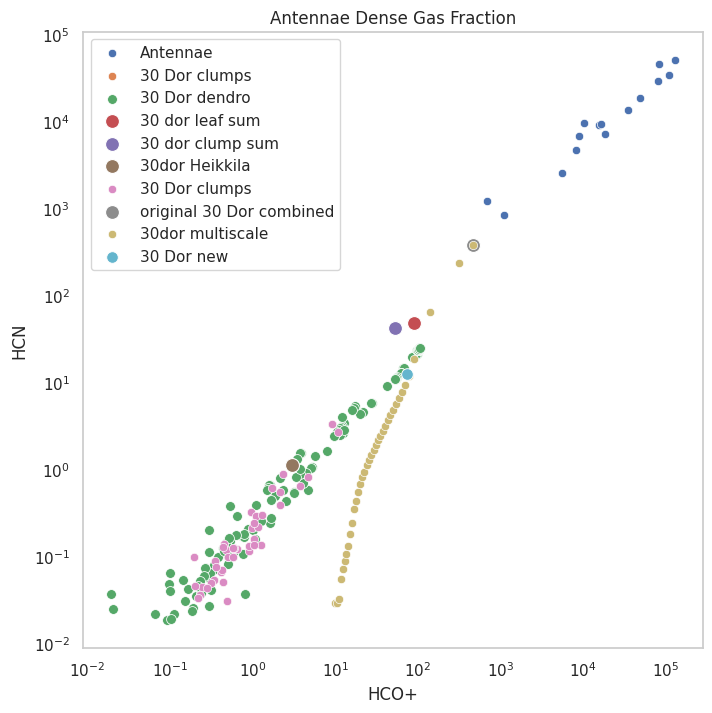

In [551]:
fig, ax = plt.subplots(figsize=(8,8))
sns.scatterplot(data=antdf, x=(hco_lr*antdf['LHCO']), y=(hcn_lr*antdf['LHCN']), label='Antennae')
'''sns.scatterplot(data=df30dor_dendro1, x=df30dor_dendro1['LHCO'], y=df30dor_dendro1['LHCN'], label='30 Dor dendro 1', s=80)
sns.scatterplot(data=df30dor_dendro2, x=df30dor_dendro2['LHCO'], y=df30dor_dendro2['LHCN'], label='30 Dor dendro 2', s=65)
sns.scatterplot(data=df30dor_dendro3, x=df30dor_dendro3['LHCO'], y=df30dor_dendro3['LHCN'], label='30 Dor dendro 3', s=50)
sns.scatterplot(data=dendro_leaf, x=dendro_leaf['LHCO'], y=dendro_leaf['LHCN'], label='30 Dor dendro 4 leaf', s=50)
sns.scatterplot(data=dendro_branch, x=dendro_branch['LHCO'], y=dendro_branch['LHCN'], label='30 Dor dendro 4 branch', s=50)
sns.scatterplot(data=dendro_trunk, x=dendro_trunk['LHCO'], y=dendro_trunk['LHCN'], label='30 Dor dendro 4 trunk', s=100)'''
sns.scatterplot(data=df30dor_m, x=df30dor_m['LHCO'], y=df30dor_m['LHCN'], label='30 Dor clumps')
sns.scatterplot(data=df30dor_dendro4, x=df30dor_dendro4['LHCO'], y=df30dor_dendro4['LHCN'], label='30 Dor dendro', s=50)

sns.scatterplot( x=[89], y=[48], label='30 dor leaf sum', s=100)
sns.scatterplot( x=[53], y=[42], label='30 dor clump sum', s=100)
sns.scatterplot(data=dfHeikkila, x='LHCO', y='LHCN', label='30dor Heikkila', s=100)




sns.scatterplot(data=df30dor_m, x=df30dor_m['LHCO'], y=df30dor_m['LHCN'], label='30 Dor clumps')
sns.scatterplot(data=smoothdf, x=smoothdf['LHCO'], y=smoothdf['LHCN'], label='original 30 Dor combined', s=100)

sns.scatterplot(data=multidf, x='LHCO', y='LHCN', label='30dor multiscale')
sns.scatterplot(data=df30dor, x=df30dor['LHCO'], y=df30dor['LHCN'], label='30 Dor new', s=70)



plt.xlabel('HCO+')
plt.ylabel('HCN')

#ax.invert_xaxis()
ax.set_xscale('log')
ax.set_yscale('log')

plt.grid()
plt.legend(loc='upper left')
plt.title('Antennae Dense Gas Fraction')

plt.show()

In [552]:
bigieldf

,LCO,LCO21,LHCN,LHCO
0,265.8,142.6,8.7,14.5
1,325.4,114.7,10.6,16.9
2,239.9,88.6,9.0,17.3


In [553]:
np.nanmean(antdf.LHCN/antdf.LHCO)

0.6723867592631356

In [554]:
import pandas as pd

# Data for the table
data = {
    'Region': ['ID 1', 'ID 2', 'ID 3', 'ID 4', 'ID 5', 'Nuc. N', 'Nuc. S', 'Overlap', 'System'],
    'R.A.': ['12:01:53.03', '12:01:53.32', '12:01:54.93', '12:01:54.80', '12:01:55.36', '12:01:53.03', '12:01:53.32', '12:01:55.10', '...'],
    'Decl.': ['−18:52:02.3', '−18:53:10.3', '−18:53:05.3', '−18:52:52.3', '−18:52:46.3', '−18:52:00.6', '−18:53:11.2', '−18:52:56.9', '...'],
    'Diameter': [6.5, 6.5, 6.5, 6.5, 6.5, 26.4, 18.4, 34.0, None],
    '12CO(1–0)': [16.4E7, 7.5E7, 9.2E7, 11.7E7, 8.0E7, 79.8E7, 31.8E7, 113.0E7, 264.8E7],
    'HCN(1–0)': [0.81E7, 0.19E7, 0.25E7, 0.21E7, 0.18E7, 2.08E7, 0.38E7, 1.41E7, 3.87E7],
    'TIR': [2.5E9, 1.1E9, 4.7E9, 1.8E9, 2.5E9, 8.8E9, 4.5E9, 28E9, 69E9],
    'HCO+': [
        0.76424738E7, 0.24796362E7, 0.47249430E7, 0.42249569E7, 0.34290390E7,
        1.9447184E7, 0.53651715E7, 3.0929904E7, 5.5955239E7
    ]
}

# Create the DataFrame
bdf = pd.DataFrame(data)

# Display the DataFrame
print(bdf)


    Region         R.A.        Decl.  Diameter     12CO(1–0)    HCN(1–0)  \
0     ID 1  12:01:53.03  −18:52:02.3       6.5  1.640000e+08   8100000.0   
1     ID 2  12:01:53.32  −18:53:10.3       6.5  7.500000e+07   1900000.0   
2     ID 3  12:01:54.93  −18:53:05.3       6.5  9.200000e+07   2500000.0   
3     ID 4  12:01:54.80  −18:52:52.3       6.5  1.170000e+08   2100000.0   
4     ID 5  12:01:55.36  −18:52:46.3       6.5  8.000000e+07   1800000.0   
5   Nuc. N  12:01:53.03  −18:52:00.6      26.4  7.980000e+08  20800000.0   
6   Nuc. S  12:01:53.32  −18:53:11.2      18.4  3.180000e+08   3800000.0   
7  Overlap  12:01:55.10  −18:52:56.9      34.0  1.130000e+09  14100000.0   
8   System          ...          ...       NaN  2.648000e+09  38700000.0   

            TIR        HCO+  
0  2.500000e+09   7642473.8  
1  1.100000e+09   2479636.2  
2  4.700000e+09   4724943.0  
3  1.800000e+09   4224956.9  
4  2.500000e+09   3429039.0  
5  8.800000e+09  19447184.0  
6  4.500000e+09   5365171.5  

In [555]:
dfngc253_dense_gas

,ncl,Mass,LHCO,LCS,vel_disp,LHCN,R
0,1,25100000.0,2900000.0,370000.0,25,650000.0,43
1,2,13300000.0,4700000.0,310000.0,17,640000.0,52
2,3,37200000.0,11600000.0,560000.0,24,1150000.0,34
3,4,55800000.0,12500000.0,550000.0,20,1380000.0,31
4,5,6300000.0,2400000.0,90000.0,20,220000.0,28
5,6,38500000.0,7200000.0,520000.0,27,830000.0,22
6,7,14700000.0,7400000.0,400000.0,31,890000.0,30
7,8,10800000.0,4300000.0,180000.0,24,500000.0,44
8,9,2000000.0,500000.0,30000.0,13,60000.0,11
9,10,3500000.0,500000.0,20000.0,9,30000.0,23


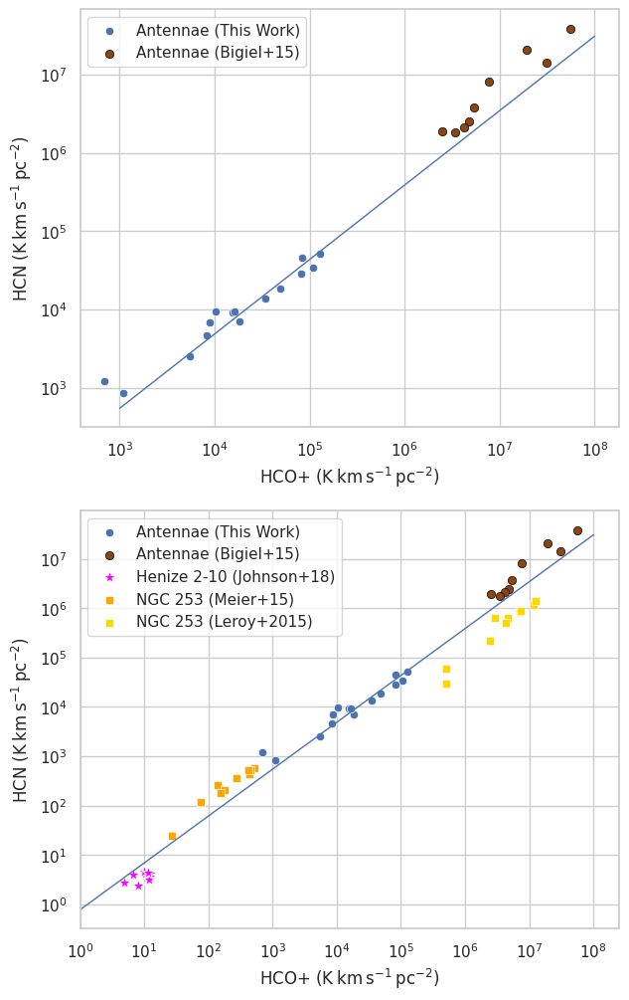

In [556]:
#fig, ax = plt.subplots(nrows=2, ncols=1, figsize=(5,10))
fig, ax = plt.subplots(nrows=2, ncols=1, figsize=(7,12))
sns.scatterplot(data=antdf, x=(hco_lr*antdf['LHCO']), y=(hcn_lr*antdf['LHCN']), label='Antennae (This Work)',ax=ax[0])
#sns.scatterplot(x=[.25E7*1.666667,.21E7*1.594340,.18E7*1.922222], y=[.25E7*1.666667,.21E7*1.594340,.18E7*1.922222], color='saddlebrown', edgecolor="black",ax=ax[0], label='Antennae (Bigiel+15)')
sns.scatterplot(data=bdf, x=bdf['HCO+'], y=bdf['HCN(1–0)'],  color='saddlebrown', edgecolor="black",ax=ax[0], label='Antennae (Bigiel+15)')
ax[0].set_xlabel('HCO+ ($\mathrm{K\: km \: s^{-1}\:pc^{-2}}$)')# $\mathrm{(K\:km\:s^{-1}\:pc^{-2})}}$')
ax[0].set_ylabel('HCN ($\mathrm{K\: km \: s^{-1}\:pc^{-2}}$)')# $\mathrm{(K\:km\:s^{-1}\:pc^{-2})}}$')
#sns.lineplot(x=np.arange(10**3,10**7,1000),y=np.nanmean(antdf.LHCN/antdf.LHCO)*np.arange(10**3,10**7,1000),linewidth=1,ax=ax[0])
sns.lineplot(x=np.arange(10**3,10**8,1000),y=(np.nanmean(antdf.LHCN/antdf.LHCO)+.1)*np.arange(10**3,10**8,1000)**.95,linewidth=1,ax=ax[0])
#sns.lineplot(x=np.arange(10**0,10**7,1000),y=(np.nanmean(antdf.LHCN/antdf.LHCO))*np.arange(10**0,10**7,1000)**1,linewidth=1,ax=ax[1])
sns.lineplot(x=np.arange(10**0,10**8,1000),y=(np.nanmean(antdf.LHCN/antdf.LHCO)+.1)*np.arange(10**0,10**8,1000)**.95,linewidth=1,ax=ax[1])

#ax.invert_xaxis()
ax[0].set_xscale('log')
ax[0].set_yscale('log')
#ax[0].set_xlim(left=4*10**-2)

#ax[0].legend(loc='upper left')
#plt.title('Antennae Dense Gas Fraction')

#plt.show()


#fig, ax = plt.subplots()
sns.scatterplot(data=antdf, x=(hco_lr*antdf['LHCO']), y=(hcn_lr*antdf['LHCN']), label='Antennae (This Work)', ax=ax[1])
#sns.scatterplot(x=[.25E7*1.666667,.21E7*1.594340,.18E7*1.922222], y=[.25E7*1.666667,.21E7*1.594340,.18E7*1.922222], color='saddlebrown', edgecolor="black",ax=ax[1],label='Antennae (Bigiel+15)')
sns.scatterplot(data=bdf, x=bdf['HCO+'], y=bdf['HCN(1–0)'],  color='saddlebrown', edgecolor="black",ax=ax[1], label='Antennae (Bigiel+15)')

sns.scatterplot(data=henizedf, x=henizedf.LHCO, y=henizedf.LHCN, label='Henize 2-10 (Johnson+18)', ax=ax[1], color='magenta', marker=m_henize, s=95)
#sns.scatterplot(data=ngc253leroydf, x=1/ngc253leroydf['CO/HCO+'], y=ngc253leroydf['HCN/HCO+']/ngc253leroydf['CO/HCO+'], label='NGC 253 (Leroy+15)')
sns.scatterplot(data=ngc253df, x=ngc253df['HCO+(1-0)'], y=ngc253df['HCN(1-0)'], label='NGC 253 (Meier+15)', ax=ax[1], color='orange',marker=m_253)
sns.scatterplot(data=dfngc253_dense_gas, x=dfngc253_dense_gas['LHCO'], y=dfngc253_dense_gas[' LHCN'] , label='NGC 253 (Leroy+2015)', ax=ax[1], color='gold', marker=m_253)


'''sns.scatterplot(data=dendro_leaf, x=dendro_leaf['LHCO'], y=dendro_leaf['LHCN'], label='30 Dor dendro leaf')
sns.scatterplot(data=dendro_branch, x=dendro_branch['LHCO'], y=dendro_branch['LHCN'], label='30 Dor dendro branch')
sns.scatterplot(data=dendro_trunk, x=dendro_trunk['LHCO'], y=dendro_trunk['LHCN'], label='30 Dor dendro trunk', s=70)
sns.scatterplot(data=smoothdf, x=smoothdf['LHCO'], y=smoothdf['LHCN'], label='30 Dor combined', s=80)
sns.scatterplot(data=df30dor_m, x=df30dor_m['LHCO'], y=df30dor_m['LHCN'], label='30 Dor')'''

ax[1].set_xlabel(r'HCO+ ($\mathrm{K\: km \: s^{-1}\:pc^{-2}}$)')# $\mathrm{(K\:km\:s^{-1}\:pc^{-2})}}$')
ax[1].set_ylabel(r'HCN ($\mathrm{K\: km \: s^{-1}\:pc^{-2}}$)')# $\mathrm{(K\:km\:s^{-1}\:pc^{-2})}}$')

#ax.invert_xaxis()
ax[1].set_xscale('log')
ax[1].set_yscale('log')
ax[1].set_xlim(left=10**0)
#plt.title('Similar Size Scale Dense Gas Fraction')

#plt.grid()
#plt.legend(bbox_to_anchor=(0, 0),ncol=2, columnspacing=-1)
ax[1].legend(loc='upper left')
plt.show()

In [557]:
df30dor_clump_sum

,ncl,cltype,LCO,LCOerr,L13CO,L13COerr,LHCO,LHCOerr,LHCN,LHCNerr,...,vel_dispCS,vel_dispCSerr,maj,min,R,Rerr,area,perim],collapsed,logu
my_sum,1653.0,114.0,2540.057,258.6297,471.6306,47.21255,61.48254,6.180427,13.9945,1.423054,...,75.2808,375.906678,22.353,25.32,22.02361,14.18593,75.7111,344.271,8.896493,-108.3


In [558]:
df30dor_m.describe()

,ncl,cltype,LCO,LCOerr,L13CO,L13COerr,LHCO,LHCOerr,LHCN,LHCNerr,...,vel_dispCS,vel_dispCSerr,maj,min,R,Rerr,area,perim],collapsed,logu
count,57.000000,57.0,57.000000,57.000000,57.000000,57.000000,53.000000,53.000000,42.000000,42.000000,...,43.000000,43.000000,57.000000,57.000000,45.000000,57.000000,57.000000,57.000000,42.000000,5.700000e+01
mean,29.000000,2.0,44.562404,4.537363,8.274221,0.828290,1.160048,0.116612,0.333202,0.033882,...,1.750716,8.742016,0.392158,0.444211,0.489414,0.248876,1.328265,6.039842,0.211821,-1.900000e+00
std,16.598193,0.0,52.819791,5.249240,11.343357,1.134194,1.985741,0.198444,0.640109,0.064039,...,0.939143,56.606074,0.143682,0.241484,0.266551,0.200205,0.979057,2.509845,0.083874,1.792147e-15
min,1.000000,2.0,1.000000,0.515000,0.616600,0.062850,0.029670,0.003715,0.030870,0.003253,...,-0.267900,0.006928,0.160300,0.102200,0.049320,0.025580,0.238000,2.473000,0.062604,-1.900000e+00
25%,15.000000,2.0,15.460000,1.550000,2.256000,0.226800,0.311600,0.032060,0.070773,0.007706,...,1.190000,0.048000,0.278900,0.296600,0.290400,0.118800,0.676900,4.218000,0.157431,-1.900000e+00
50%,29.000000,2.0,28.100000,2.829000,4.252000,0.426300,0.511300,0.051520,0.125600,0.013020,...,1.608000,0.080180,0.362900,0.365900,0.462900,0.189100,1.015000,5.527000,0.189816,-1.900000e+00
75%,43.000000,2.0,47.560000,4.756000,9.314000,0.931900,1.041000,0.104800,0.275775,0.028292,...,1.989500,0.158600,0.479900,0.495300,0.725000,0.301400,1.613000,7.272000,0.246702,-1.900000e+00
max,57.000000,2.0,290.300000,29.030000,60.100000,6.010000,10.890000,1.089000,3.289000,0.329500,...,5.726000,371.300000,0.892700,1.184000,1.191000,0.938700,4.612000,13.820000,0.500664,-1.900000e+00


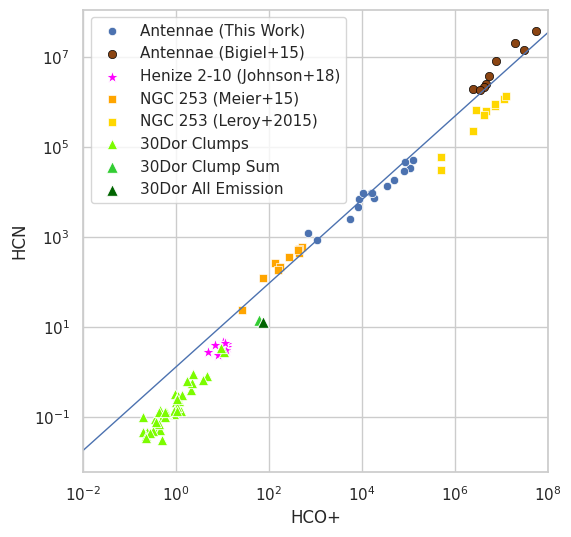

In [559]:
fig, ax = plt.subplots(nrows=1, ncols=1, figsize=(6,6))
#ax[0].set_xlim(left=4*10**-2)

#ax[0].legend(loc='upper left')
#plt.title('Antennae Dense Gas Fraction')

#plt.show()


#fig, ax = plt.subplots()
sns.scatterplot(data=antdf, x=(hco_lr*antdf['LHCO']), y=(hcn_lr*antdf['LHCN']), label='Antennae (This Work)')
sns.scatterplot(data=bdf, x=bdf['HCO+'], y=bdf['HCN(1–0)'],  color='saddlebrown', edgecolor="black", label='Antennae (Bigiel+15)')
sns.lineplot(x=np.arange(10**-2,10**8,1000),y=(np.nanmean(antdf.LHCN/antdf.LHCO)+.6)*np.arange(10**-2,10**8,1000)**.93,linewidth=1,ax=ax)

sns.scatterplot(data=henizedf, x=henizedf.LHCO, y=henizedf.LHCN, label='Henize 2-10 (Johnson+18)', color='magenta', marker=m_henize, s=95)
#sns.scatterplot(data=ngc253leroydf, x=1/ngc253leroydf['CO/HCO+'], y=ngc253leroydf['HCN/HCO+']/ngc253leroydf['CO/HCO+'], label='NGC 253 (Leroy+15)')
sns.scatterplot(data=ngc253df, x=ngc253df['HCO+(1-0)'], y=ngc253df['HCN(1-0)'], label='NGC 253 (Meier+15)', color='orange',marker=m_253)
sns.scatterplot(data=dfngc253_dense_gas, x=dfngc253_dense_gas['LHCO'], y=dfngc253_dense_gas[' LHCN'] , label='NGC 253 (Leroy+2015)', color='gold', marker=m_253)



sns.scatterplot(data=df30dor_m, x=df30dor_m['LHCO'], y=df30dor_m['LHCN'], label='30Dor Clumps', color='lawngreen', marker='^', s=55)
#sns.scatterplot( x=[53], y=[42], label='30 dor clump sum', s=100,color='limegreen')
sns.scatterplot(data=df30dor_clump_sum, x='LHCO', y='LHCN', label='30Dor Clump Sum',color='limegreen', marker='^', s=70)
sns.scatterplot(data=df30dor, x=df30dor['LHCO'], y=df30dor['LHCN'], label='30Dor All Emission', s=70, color='darkgreen',marker='^')

'''sns.scatterplot(data=dendro_leaf, x=dendro_leaf['LHCO'], y=dendro_leaf['LHCN'], label='30 Dor dendro leaf')
sns.scatterplot(data=dendro_branch, x=dendro_branch['LHCO'], y=dendro_branch['LHCN'], label='30 Dor dendro branch')
sns.scatterplot(data=dendro_trunk, x=dendro_trunk['LHCO'], y=dendro_trunk['LHCN'], label='30 Dor dendro trunk', s=70)
sns.scatterplot(data=smoothdf, x=smoothdf['LHCO'], y=smoothdf['LHCN'], label='30 Dor combined', s=80)
sns.scatterplot(data=df30dor_m, x=df30dor_m['LHCO'], y=df30dor_m['LHCN'], label='30 Dor')'''

ax.set_xlabel('HCO+')
ax.set_ylabel('HCN')
ax.set_xlabel('HCO+')# $\mathrm{(K\:km\:s^{-1}\:pc^{-2})}}$')
ax.set_ylabel('HCN')# $\mathrm{(K\:km\:s^{-1}\:pc^{-2})}}$')
#sns.lineplot(x=np.arange(10**3,10**7,1000),y=np.nanmean(antdf.LHCN/antdf.LHCO)*np.arange(10**3,10**7,1000),linewidth=1,ax=ax[0])

#ax.invert_xaxis()
ax.set_xscale('log')
ax.set_yscale('log')
#ax.set_xlim(left=10**0)
#plt.title('Similar Size Scale Dense Gas Fraction')

#plt.grid()
#plt.legend(bbox_to_anchor=(0, 0),ncol=2, columnspacing=-1)
ax.legend(loc='upper left')
ax.set_xlim([10**-2,10**8])
plt.show()

In [560]:
hco_list = list(antdf['LHCO'])+list(henizedf['LHCO'])+list(ngc253df['HCO+(1-0)'])+list(dfngc253_dense_gas['LHCO'])+list(df30dor_m['LHCO'])
hcn_list = list(antdf['LHCN'])+list(henizedf['LHCN'])+list(ngc253df['HCN(1-0)'])+list(dfngc253_dense_gas[' LHCN'])+list(df30dor_m['LHCO'])
hco_list


[51940.0,
 61860.0,
 39270.0,
 40150.0,
 23640.0,
 9549.0,
 4248.0,
 nan,
 nan,
 8816.0,
 11710.0,
 nan,
 nan,
 nan,
 7463.0,
 35650.0,
 16650.0,
 640.6,
 15840.0,
 nan,
 866.5,
 3200.0,
 nan,
 nan,
 nan,
 nan,
 nan,
 526.8,
 nan,
 7876.0,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 2672.0,
 4007.0,
 nan,
 nan,
 nan,
 nan,
 1584.0,
 nan,
 nan,
 4992.0,
 nan,
 nan,
 335.0,
 nan,
 532.6,
 nan,
 10.3,
 12.5,
 6.8,
 12.3,
 10.1,
 11.8,
 7.9,
 11.5,
 4.9,
 26.7,
 75.5,
 137.0,
 432.0,
 512.0,
 276.0,
 450.0,
 422.0,
 176.0,
 153.0,
 2900000.0,
 4700000.0,
 11600000.0,
 12500000.0,
 2400000.0,
 7200000.0,
 7400000.0,
 4300000.0,
 500000.0,
 500000.0,
 2.135,
 nan,
 10.89,
 4.64,
 nan,
 3.761,
 2.167,
 0.9197,
 0.9881,
 2.334,
 0.4931,
 1.732,
 0.48,
 9.255,
 0.2427,
 0.5985,
 1.158,
 0.955,
 1.119,
 1.323,
 0.6457,
 0.4154,
 0.1994,
 1.265,
 1.041,
 0.9127,
 0.1957,
 nan,
 0.3389,
 0.9083,
 1.044,
 0.02967,
 1.038,
 0.4443,
 0.3538,
 0.4552,
 0.2093,
 0.5113,
 0.5794,
 0.05337,
 0.3495,
 0.4306,
 0

In [561]:
namelist = ['Antennae']*len(antdf) + ['Henize']*len(henizedf) + ['NGC253']*(len(ngc253df)+len(dfngc253_dense_gas))+['30Dor']*len(df30dor_m)

In [562]:
dfall = pd.DataFrame({'LHCO':list(hco_lr*antdf['LHCO'])+list(henizedf['LHCO'])+list(ngc253df['HCO+(1-0)'])+list(dfngc253_dense_gas['LHCO'])+list(df30dor_m['LHCO']),
                          'LHCN':list(hcn_lr*antdf['LHCN'])+list(henizedf['LHCN'])+list(ngc253df['HCN(1-0)'])+list(dfngc253_dense_gas[' LHCN'])+list(df30dor_m['LHCO']),
                          'LCO':list(co_lr*antdf['LCO'])+list(co_lr*henizedf['LCO'])+list(ngc253df['CO(1-0)'])+[np.nan for x in dfngc253_dense_gas[' LHCN']]+list(co_lr*df30dor_m['LCO'])})
dfall['galaxy'] = namelist
dfall = dfall.dropna()
dfall

,LHCO,LHCN,LCO,galaxy
0,107314.049587,34299.242424,1.806154e+06,Antennae
1,127809.917355,51666.666667,1.680000e+06,Antennae
2,81136.363636,28958.333333,1.473385e+06,Antennae
3,82954.545455,45984.848485,1.461077e+06,Antennae
4,48842.975207,18424.242424,9.980000e+05,Antennae
...,...,...,...,...
132,0.221300,0.221300,3.476923e+01,30Dor
133,0.296200,0.296200,1.760000e+01,30Dor
134,0.578100,0.578100,5.367692e+01,30Dor
136,0.309100,0.309100,3.747692e+01,30Dor


In [563]:
dfall_all = pd.DataFrame({'LHCO':list(antdf['LHCO'])+list(henizedf['LHCO'])+list(ngc253df['HCO+(1-0)'])+list(dfngc253_dense_gas['LHCO'])+list(df30dor_m['LHCO'])+list(df30dor['LHCO'])+list(df30dor_clump_sum['LHCO']), 'LHCN':list(antdf['LHCN'])+list(henizedf['LHCN'])+list(ngc253df['HCN(1-0)'])+list(dfngc253_dense_gas[' LHCN'])+list(df30dor_m['LHCO'])+list(df30dor['LHCN'])+list(df30dor_clump_sum['LHCN'])})
namelist_all = ['Antennae']*len(antdf) + ['Henize']*len(henizedf) + ['NGC253']*(len(ngc253df)+len(dfngc253_dense_gas))+['30Dor']*(len(df30dor_m)+2)
dfall_all['galaxy'] = namelist_all
dfall_all = dfall_all.dropna()
dfall_all

,LHCO,LHCN,galaxy
0,51940.00000,18110.0000,Antennae
1,61860.00000,27280.0000,Antennae
2,39270.00000,15290.0000,Antennae
3,40150.00000,24280.0000,Antennae
4,23640.00000,9728.0000,Antennae
...,...,...,...
134,0.57810,0.5781,30Dor
136,0.30910,0.3091,30Dor
137,0.31160,0.3116,30Dor
138,74.95000,12.4000,30Dor


In [564]:
from scipy.stats import pearsonr

In [565]:
dfall_m30dor = dfall[dfall['galaxy']!='30Dor']
dfall_mhenize = dfall[dfall['galaxy']!='Henize']
dfall_m30dor_henize = dfall_m30dor[dfall_m30dor['galaxy']!='Henize']


In [566]:
allr, allp = pearsonr(dfall['LHCO'], dfall['LHCN'])
all_m30dorr, all_m30dorp = pearsonr(dfall_m30dor['LHCO'], dfall_m30dor['LHCN'])
all_mhenizer, all_mhenizep = pearsonr(dfall_mhenize['LHCO'], dfall_mhenize['LHCN'])
all_m30dor_henizer, all_m30dor_henizep = pearsonr(dfall_m30dor_henize['LHCO'], dfall_m30dor_henize['LHCN'])
r = [allr, all_m30dorr, all_mhenizer, all_m30dor_henizer]
print(r)
print(sorted(r))

[0.9777133792441992, 0.974288233811805, 0.9774919674793543, 0.9717314389929607]
[0.9717314389929607, 0.974288233811805, 0.9774919674793543, 0.9777133792441992]


In [567]:
dfall_30dor_hen = dfall[dfall['galaxy']!='Antennae']
dfall_30dor_hen = dfall_30dor_hen[dfall_30dor_hen['galaxy']!='NGC253']
print(pearsonr(dfall_30dor_hen['LHCO'], dfall_30dor_hen['LHCN']))
dfall_30dor_hen

PearsonRResult(statistic=0.8177573985784722, pvalue=5.018797459697968e-16)


,LHCO,LHCN,LCO,galaxy
52,10.3000,4.2000,211.230769,Henize
53,12.5000,4.2000,219.846154,Henize
54,6.8000,3.9000,242.923077,Henize
55,12.3000,3.6000,157.538462,Henize
56,10.1000,4.6000,176.000000,Henize
...,...,...,...,...
132,0.2213,0.2213,34.769231,30Dor
133,0.2962,0.2962,17.600000,30Dor
134,0.5781,0.5781,53.676923,30Dor
136,0.3091,0.3091,37.476923,30Dor


In [568]:
pearsonr(dfall_all['LHCO'], dfall_all['LHCN'])

PearsonRResult(statistic=0.986200419574077, pvalue=1.415664401014779e-77)

In [569]:
dfall_mant = dfall[dfall['galaxy']!='Antennae']
dfall_mant

,LHCO,LHCN,LCO,galaxy
52,10.3000,4.2000,211.230769,Henize
53,12.5000,4.2000,219.846154,Henize
54,6.8000,3.9000,242.923077,Henize
55,12.3000,3.6000,157.538462,Henize
56,10.1000,4.6000,176.000000,Henize
...,...,...,...,...
132,0.2213,0.2213,34.769231,30Dor
133,0.2962,0.2962,17.600000,30Dor
134,0.5781,0.5781,53.676923,30Dor
136,0.3091,0.3091,37.476923,30Dor


In [570]:
d3 = df30dor_m.dropna()
ad = antdf[['LCO','L13CO','LHCO','LHCN']]
ad = ad.dropna()
ad

,LCO,L13CO,LHCO,LHCN
0,1174000.0,149100.0,51940.0,18110.0
1,1092000.0,194200.0,61860.0,27280.0
2,957700.0,156000.0,39270.0,15290.0
3,949700.0,187700.0,40150.0,24280.0
4,648700.0,104700.0,23640.0,9728.0
6,93550.0,28130.0,4248.0,3648.0
9,253900.0,73590.0,8816.0,3752.0
14,200200.0,36910.0,7463.0,4854.0
16,488400.0,60700.0,16650.0,7195.0
29,264900.0,39420.0,7876.0,4912.0


In [571]:
print(pearsonr(henizedf['LHCO']/henizedf['LHCN'],henizedf['LCO']))
print(pearsonr(ngc253df['HCO+(1-0)']/ngc253df['HCN(1-0)'],ngc253df['CO(1-0)']))


PearsonRResult(statistic=-0.26908576675907564, pvalue=0.48383120467804425)
PearsonRResult(statistic=0.005041227264459854, pvalue=0.988972595611993)


In [572]:
print(pearsonr(d3['LHCO']/d3['LHCN'], d3['LCO']))
#print(pearsonr(ad['LHCO']/ad['LHCN'], ad['LCO']))
print(pearsonr(dfall_mant['LHCO']/dfall_mant['LHCN'], dfall_mant['LCO']))
print(pearsonr(ad['LHCO']/ad['LHCN'], ad['LCO']))

PearsonRResult(statistic=-0.28311815408196017, pvalue=0.12951364008623312)
PearsonRResult(statistic=-0.16682007409454794, pvalue=0.16134047278756342)
PearsonRResult(statistic=0.721597413678195, pvalue=0.0023905123662881275)


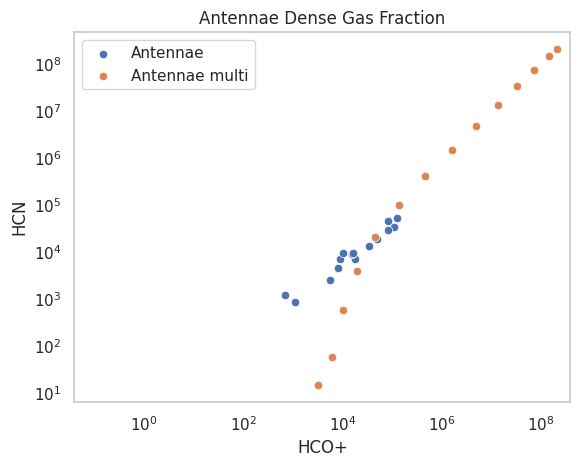

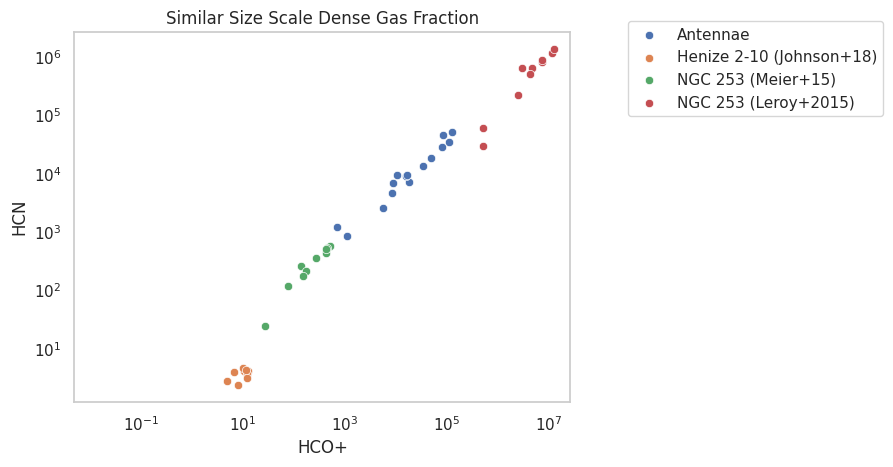

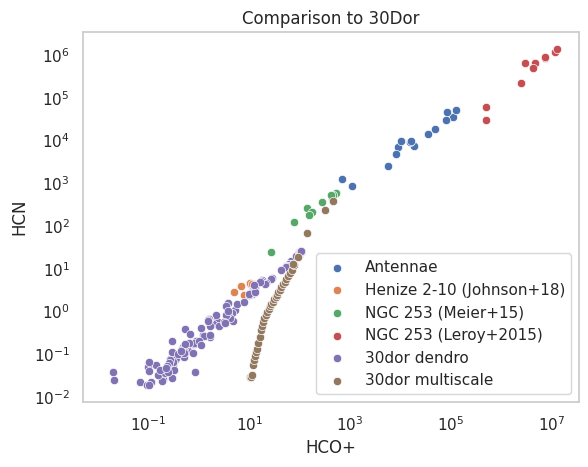

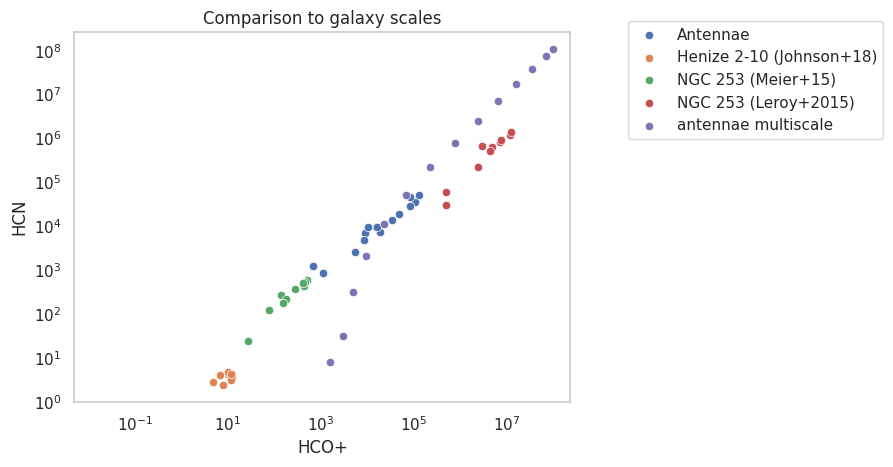

In [573]:
fig, ax = plt.subplots()
sns.scatterplot(data=antdf, x=(hco_lr*antdf['LHCO']), y=(hcn_lr*antdf['LHCN']), label='Antennae')
sns.scatterplot(data=antmultidf, x=(hco_lr*antmultidf['LHCO']), y=(hcn_lr*antmultidf['LHCN']), label='Antennae multi')
plt.xlabel('HCO+')
plt.ylabel('HCN')

#ax.invert_xaxis()
ax.set_xscale('log')
ax.set_yscale('log')
ax.set_xlim(left=4*10**-2)

plt.grid()
plt.legend(loc='upper left')
plt.title('Antennae Dense Gas Fraction')

plt.show()


fig, ax = plt.subplots()
sns.scatterplot(data=antdf, x=(hco_lr*antdf['LHCO']), y=(hcn_lr*antdf['LHCN']), label='Antennae')
sns.scatterplot(data=henizedf, x=henizedf.LHCO, y=henizedf.LHCN, label='Henize 2-10 (Johnson+18)')
#sns.scatterplot(data=ngc253leroydf, x=1/ngc253leroydf['CO/HCO+'], y=ngc253leroydf['HCN/HCO+']/ngc253leroydf['CO/HCO+'], label='NGC 253 (Leroy+15)')
sns.scatterplot(data=ngc253df, x=ngc253df['HCO+(1-0)'], y=ngc253df['HCN(1-0)'], label='NGC 253 (Meier+15)')
sns.scatterplot(data=dfngc253_dense_gas, x=dfngc253_dense_gas['LHCO'], y=dfngc253_dense_gas[' LHCN'] , label='NGC 253 (Leroy+2015)')


'''sns.scatterplot(data=dendro_leaf, x=dendro_leaf['LHCO'], y=dendro_leaf['LHCN'], label='30 Dor dendro leaf')
sns.scatterplot(data=dendro_branch, x=dendro_branch['LHCO'], y=dendro_branch['LHCN'], label='30 Dor dendro branch')
sns.scatterplot(data=dendro_trunk, x=dendro_trunk['LHCO'], y=dendro_trunk['LHCN'], label='30 Dor dendro trunk', s=70)
sns.scatterplot(data=smoothdf, x=smoothdf['LHCO'], y=smoothdf['LHCN'], label='30 Dor combined', s=80)
sns.scatterplot(data=df30dor_m, x=df30dor_m['LHCO'], y=df30dor_m['LHCN'], label='30 Dor')'''

plt.xlabel('HCO+')
plt.ylabel('HCN')

#ax.invert_xaxis()
ax.set_xscale('log')
ax.set_yscale('log')
ax.set_xlim(left=10**-2.3)
plt.title('Similar Size Scale Dense Gas Fraction')

plt.grid()
plt.legend(bbox_to_anchor=(1.1, 1.05))
plt.show()


fig, ax = plt.subplots()

sns.scatterplot(data=antdf, x=(hco_lr*antdf['LHCO']), y=(hcn_lr*antdf['LHCN']), label='Antennae')
#sns.scatterplot(data=df30dor_m, x=df30dor_m['LHCO'], y=df30dor_m['LHCN'], label='30 Dor')
#sns.scatterplot(data=smoothdf, x=smoothdf['LHCO'], y=smoothdf['LHCN'], label='30 Dor combined')


sns.scatterplot(data=henizedf, x=henizedf.LHCO, y=henizedf.LHCN, label='Henize 2-10 (Johnson+18)')
#sns.scatterplot(data=ngc253leroydf, x=1/ngc253leroydf['CO/HCO+'], y=ngc253leroydf['HCN/HCO+']/ngc253leroydf['CO/HCO+'], label='NGC 253 (Leroy+15)')
sns.scatterplot(data=ngc253df, x=ngc253df['HCO+(1-0)'], y=ngc253df['HCN(1-0)'], label='NGC 253 (Meier+15)')
sns.scatterplot(data=dfngc253_dense_gas, x=dfngc253_dense_gas['LHCO'], y=dfngc253_dense_gas[' LHCN'] , label='NGC 253 (Leroy+2015)')
sns.scatterplot(data=df30dor_dendro4, x='LHCO', y='LHCN', label='30dor dendro')
sns.scatterplot(data=multidf, x='LHCO', y='LHCN', label='30dor multiscale')


'''sns.scatterplot(data=empiredf, x=empiredf['LHCO'], y=empiredf['LHCN'], label='Empire', marker='x', s=60)
sns.scatterplot(data=df, x=df['LHCO'], y=df['LHCN'], label='Gallagher', marker='x', s=60)
sns.scatterplot(data=m31df, x=m31df['HCO+'], y=m31df['HCN'], label='M31', marker='x', s=60)


sns.scatterplot(data=dendro_leaf, x=dendro_leaf['LHCO'], y=dendro_leaf['LHCN'], label='30 Dor dendro leaf')
sns.scatterplot(data=dendro_branch, x=dendro_branch['LHCO'], y=dendro_branch['LHCN'], label='30 Dor dendro branch')
sns.scatterplot(data=dendro_trunk, x=dendro_trunk['LHCO'], y=dendro_trunk['LHCN'], label='30 Dor dendro trunk', s=70)
sns.scatterplot(data=smoothdf, x=smoothdf['LHCO'], y=smoothdf['LHCN'], label='30 Dor combined', s=100)
sns.scatterplot(data=df30dor_m, x=df30dor_m['LHCO'], y=df30dor_m['LHCN'], label='30 Dor')'''


#sns.scatterplot(data=m82df, x=1/m82df['CO/HCO+'], y=m82df['HCN/HCO+']/m82df['CO/HCO+'], label='M82 (Kepley+14)')
#sns.scatterplot(data=dfngc4321, x=10**dfngc4321['LHCN/LCO'], y=10**dfngc4321[" LHCO/LCO"], label='ngc 4321 gallagher', marker='X', s=60)
#sns.scatterplot(data=dfngc3627, x=10**dfngc3627['LHCN/LCO'], y=10**dfngc3627["LHCO/LCO"], label='ngc 3627 gallagher', marker='X', s=60)


plt.xlabel('HCO+')
plt.ylabel('HCN')

#ax.invert_xaxis()
ax.set_xscale('log')
ax.set_yscale('log')
ax.set_xlim(left=10**-2.3)
plt.grid()
plt.title('Comparison to 30Dor')

fig, ax = plt.subplots()

sns.scatterplot(data=antdf, x=(hco_lr*antdf['LHCO']), y=(hcn_lr*antdf['LHCN']), label='Antennae')
#sns.scatterplot(data=df30dor_m, x=df30dor_m['LHCO'], y=df30dor_m['LHCN'], label='30 Dor')
#sns.scatterplot(data=smoothdf, x=smoothdf['LHCO'], y=smoothdf['LHCN'], label='30 Dor combined')


sns.scatterplot(data=henizedf, x=henizedf.LHCO, y=henizedf.LHCN, label='Henize 2-10 (Johnson+18)')
#sns.scatterplot(data=ngc253leroydf, x=1/ngc253leroydf['CO/HCO+'], y=ngc253leroydf['HCN/HCO+']/ngc253leroydf['CO/HCO+'], label='NGC 253 (Leroy+15)')
sns.scatterplot(data=ngc253df, x=ngc253df['HCO+(1-0)'], y=ngc253df['HCN(1-0)'], label='NGC 253 (Meier+15)')
sns.scatterplot(data=dfngc253_dense_gas, x=dfngc253_dense_gas['LHCO'], y=dfngc253_dense_gas[' LHCN'] , label='NGC 253 (Leroy+2015)')
sns.scatterplot(data=antmultidf, x='LHCO', y='LHCN', label='antennae multiscale')

'''sns.scatterplot(data=empiredf, x=empiredf['LHCO'], y=empiredf['LHCN'], label='Empire', marker='x', s=60)
sns.scatterplot(data=df, x=df['LHCO'], y=df['LHCN'], label='Gallagher', marker='x', s=60)
sns.scatterplot(data=m31df, x=m31df['HCO+'], y=m31df['HCN'], label='M31', marker='x', s=60)'''




#sns.scatterplot(data=m82df, x=1/m82df['CO/HCO+'], y=m82df['HCN/HCO+']/m82df['CO/HCO+'], label='M82 (Kepley+14)')
#sns.scatterplot(data=dfngc4321, x=10**dfngc4321['LHCN/LCO'], y=10**dfngc4321[" LHCO/LCO"], label='ngc 4321 gallagher', marker='X', s=60)
#sns.scatterplot(data=dfngc3627, x=10**dfngc3627['LHCN/LCO'], y=10**dfngc3627["LHCO/LCO"], label='ngc 3627 gallagher', marker='X', s=60)


plt.xlabel('HCO+')
plt.ylabel('HCN')

#ax.invert_xaxis()
ax.set_xscale('log')
ax.set_yscale('log')
ax.set_xlim(left=10**-2.3)
plt.grid()
plt.title('Comparison to galaxy scales')

plt.legend(bbox_to_anchor=(1.1, 1.05))
plt.show()

i wonder if i should leave the thresholds as integers to show how 30dor starts clumped together and spreads out towards 0 and the antennae starts spread out and starts clumping up towards 0 rms


would also love to find catalog of whole galaxies and their dense gas emission

In [574]:
[1/1.666667,1/1.594340,1/1.922222]
[9.2E7,11.7E7,8E7]


[92000000.0, 117000000.0, 80000000.0]

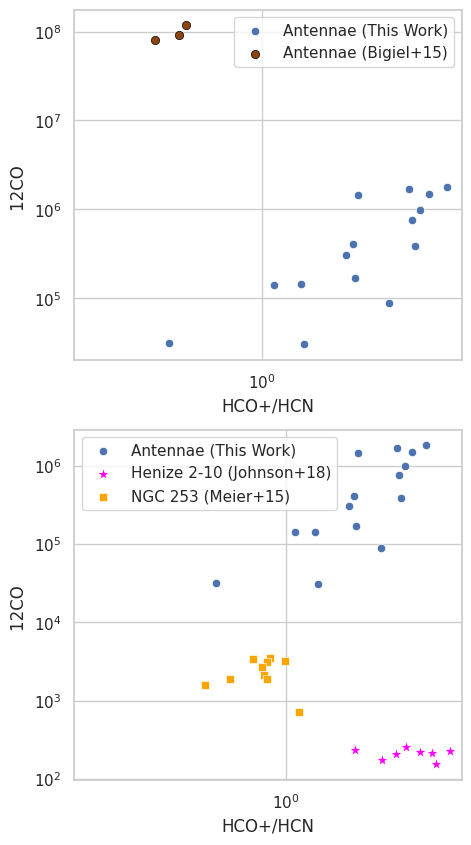

In [575]:
fig, ax = plt.subplots(nrows=2,ncols=1, figsize=(5,10))
sns.scatterplot(data=antdf, x=(hco_lr*antdf['LHCO'])/(hcn_lr*antdf['LHCN']), y=(co_lr*antdf['LCO']), label='Antennae (This Work)',ax=ax[0])
sns.scatterplot(x=np.array([1/1.666667,1/1.594340,1/1.922222]),y=np.array([9.2E7,11.7E7,8E7]), color='saddlebrown', edgecolor="black",ax=ax[0], label='Antennae (Bigiel+15)')
#sns.lineplot(x=np.arange(10**-2,10**7.5,1000),y=(np.nanmean(antdf.LHCN/antdf.LHCO)+.6)*np.arange(10**-2,10**7.5,1000)**.93,linewidth=1,ax=ax)

ax[0].set_xlabel('HCO+/HCN')
ax[0].set_ylabel('12CO ')#$(K\:km\:s^{-1}\:pc^{-2})}$')

#ax.invert_xaxis()
ax[0].set_xscale('log')
ax[0].set_yscale('log')
ax[0].set_xlim(left=10**-(.5))

ax[0].legend()


sns.scatterplot(data=antdf, x=(hco_lr*antdf['LHCO'])/(hcn_lr*antdf['LHCN']), y=(co_lr*antdf['LCO']), label='Antennae (This Work)',ax=ax[1])
#sns.scatterplot(x=np.array([1/1.666667,1/1.594340,1/1.922222]),y=np.array([9.2E7,11.7E7,8E7]), color='saddlebrown', edgecolor="black",ax=ax[1], label='Antennae (Bigiel+15)')

#sns.scatterplot(data=smoothdf, x=smoothdf['LHCO']/(smoothdf['LHCN']), y=(co_lr*smoothdf['LCO']), label='30 Dor combined')
sns.scatterplot(data=henizedf, x=henizedf.LHCO/(henizedf.LHCN), y=(co_lr*henizedf.LCO), label='Henize 2-10 (Johnson+18)',ax=ax[1], color='magenta', marker=m_henize,s=95)
#sns.scatterplot(data=ngc253leroydf, x=1/ngc253leroydf['CO/HCO+'], y=ngc253leroydf['HCN/HCO+']/ngc253leroydf['CO/HCO+'], label='NGC 253 (Leroy+15)')
sns.scatterplot(data=ngc253df, x=ngc253df['HCO+(1-0)']/ngc253df['HCN(1-0)'], y=ngc253df['CO(1-0)'], label='NGC 253 (Meier+15)',ax=ax[1],color='orange',marker=m_253)

ax[1].set_xlabel('HCO+/HCN')
ax[1].set_ylabel('12CO ')#$\mathrm{(K\:km\:s^{-1}\:pc^{-2})}}$')

#ax.invert_xaxis()
ax[1].set_xscale('log')
ax[1].set_yscale('log')
ax[1].set_xlim(left=10**-.75)

ax[1].legend(loc='upper left')

plt.show()

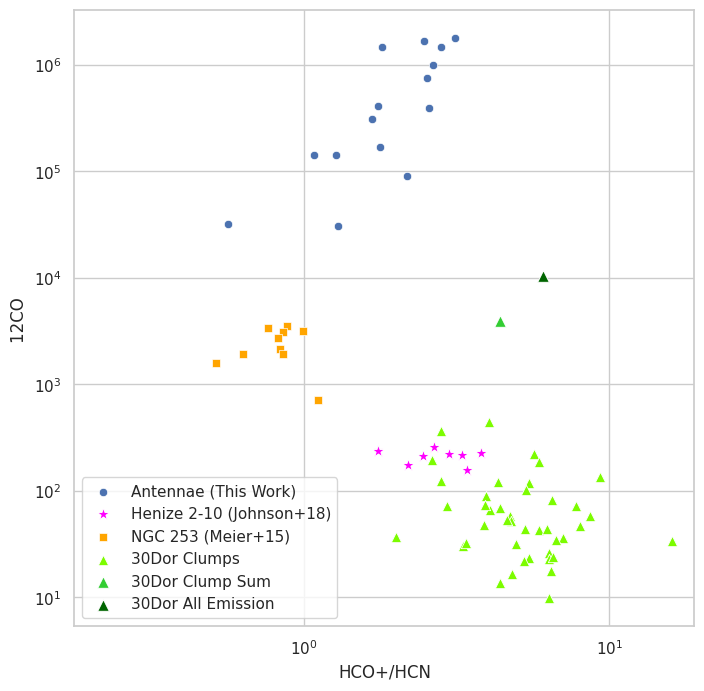

In [576]:
fig, ax = plt.subplots(nrows=1,ncols=1, figsize=(8,8))

sns.scatterplot(data=antdf, x=(hco_lr*antdf['LHCO'])/(hcn_lr*antdf['LHCN']), y=(co_lr*antdf['LCO']), label='Antennae (This Work)')
#sns.scatterplot(x=np.array([1/1.666667,1/1.594340,1/1.922222]),y=np.array([9.2E7,11.7E7,8E7]), color='saddlebrown', edgecolor="black",ax=ax, label='Antennae (Bigiel+15)')

#sns.scatterplot(data=smoothdf, x=smoothdf['LHCO']/(smoothdf['LHCN']), y=(co_lr*smoothdf['LCO']), label='30 Dor combined')
sns.scatterplot(data=henizedf, x=henizedf.LHCO/(henizedf.LHCN), y=(co_lr*henizedf.LCO), label='Henize 2-10 (Johnson+18)', color='magenta', marker=m_henize,s=95)
#sns.scatterplot(data=ngc253leroydf, x=1/ngc253leroydf['CO/HCO+'], y=ngc253leroydf['HCN/HCO+']/ngc253leroydf['CO/HCO+'], label='NGC 253 (Leroy+15)')
sns.scatterplot(data=ngc253df, x=ngc253df['HCO+(1-0)']/ngc253df['HCN(1-0)'], y=ngc253df['CO(1-0)'], label='NGC 253 (Meier+15)',color='orange',marker=m_253)

sns.scatterplot(data=df30dor_m, x=df30dor_m['LHCO']/df30dor_m['LHCN'], y=(co_lr*df30dor_m['LCO']), label='30Dor Clumps', color='lawngreen', marker='^', s=55)
#sns.scatterplot( x=[53], y=[42], label='30 dor clump sum', s=100,color='limegreen')
sns.scatterplot(data=df30dor_clump_sum, x=df30dor_clump_sum['LHCO']/df30dor_clump_sum['LHCN'], y=co_lr*df30dor_clump_sum['LCO'], label='30Dor Clump Sum',color='limegreen', marker='^', s=70)
sns.scatterplot(data=df30dor, x=df30dor['LHCO']/df30dor['LHCN'], y=co_lr*df30dor['LCO'], label='30Dor All Emission', s=70, color='darkgreen',marker='^')


ax.set_xlabel('HCO+/HCN')
ax.set_ylabel('12CO ')#$\mathrm{(K\:km\:s^{-1}\:pc^{-2})}}$')

#ax.invert_xaxis()
ax.set_xscale('log')
ax.set_yscale('log')
ax.set_xlim(left=10**-.75)

ax.legend(loc='lower left')

plt.show()


<ipython-input-577-04e91a0bc0d0>:1: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot((hco_lr*antdf['LHCO'])/(hcn_lr*antdf['LHCN']),label='Antennae')
<ipython-input-577-04e91a0bc0d0>:3: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(henizedf.LHCO/(henizedf.LHCN), label='Henize 2-10 (Johnson+18)', col

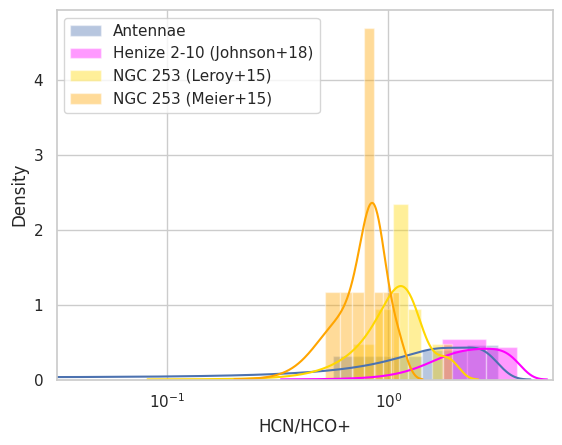

In [577]:
sns.distplot((hco_lr*antdf['LHCO'])/(hcn_lr*antdf['LHCN']),label='Antennae')
#sns.scatterplot(data=smoothdf, x=smoothdf['LHCO']/(smoothdf['LHCN']), y=(co_lr*smoothdf['LCO']), label='30 Dor combined')
sns.distplot(henizedf.LHCO/(henizedf.LHCN), label='Henize 2-10 (Johnson+18)', color='magenta')
#sns.scatterplot(data=ngc253leroydf, x=1/ngc253leroydf['CO/HCO+'], y=ngc253leroydf['HCN/HCO+']/ngc253leroydf['CO/HCO+'], label='NGC 253 (Leroy+15)')
#sns.kdeplot(dfngc253_dense_gas[' LHCN']/dfngc253_dense_gas['LHCO'],color='gold', label='NGC 253 (Leroy+15)')
sns.distplot(ngc253leroydf['HCN/HCO+'],color='gold', label='NGC 253 (Leroy+15)')
sns.distplot(ngc253df['HCO+(1-0)']/ngc253df['HCN(1-0)'], label='NGC 253 (Meier+15)',color='orange')
plt.legend(loc='upper left')
plt.xlim(left=10**-1.5)
plt.xscale('log')

In [578]:
df30dor_clump_sum['LHCO']/df30dor_clump_sum['LHCN']

,0
my_sum,4.393336


In [579]:
df30dor['LHCO']/df30dor['LHCN']

,0
41,6.044355


<ipython-input-580-fab7d702011d>:1: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot((hco_lr*antdf['LHCO'])/(hcn_lr*antdf['LHCN']),label='Antennae')
<ipython-input-580-fab7d702011d>:3: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(henizedf.LHCO/(henizedf.LHCN), label='Henize 2-10 (Johnson+18)', col

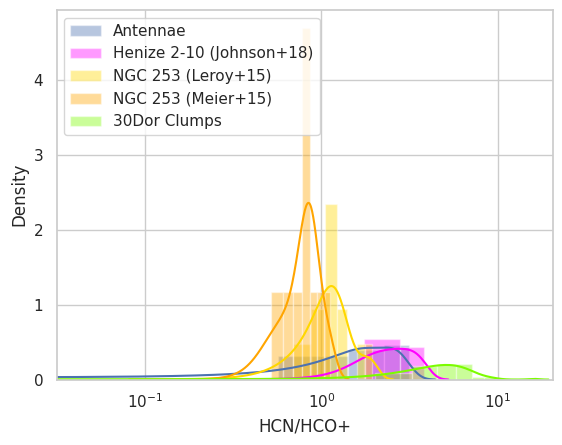

In [580]:
sns.distplot((hco_lr*antdf['LHCO'])/(hcn_lr*antdf['LHCN']),label='Antennae')
#sns.scatterplot(data=smoothdf, x=smoothdf['LHCO']/(smoothdf['LHCN']), y=(co_lr*smoothdf['LCO']), label='30 Dor combined')
sns.distplot(henizedf.LHCO/(henizedf.LHCN), label='Henize 2-10 (Johnson+18)', color='magenta')
#sns.scatterplot(data=ngc253leroydf, x=1/ngc253leroydf['CO/HCO+'], y=ngc253leroydf['HCN/HCO+']/ngc253leroydf['CO/HCO+'], label='NGC 253 (Leroy+15)')
#sns.kdeplot(dfngc253_dense_gas[' LHCN']/dfngc253_dense_gas['LHCO'],color='gold', label='NGC 253 (Leroy+15)')
sns.distplot(ngc253leroydf['HCN/HCO+'],color='gold', label='NGC 253 (Leroy+15)')
sns.distplot(ngc253df['HCO+(1-0)']/ngc253df['HCN(1-0)'], label='NGC 253 (Meier+15)',color='orange')
sns.distplot((df30dor_m['LHCO'])/(df30dor_m['LHCN']),label='30Dor Clumps', color='lawngreen')
#plt.axvline(x=4.393336,label='30Dor Clump Sum', color='limegreen')
#plt.axvline(x=6.044355,label='30Dor Sum All', color='darkgreen')

plt.legend(loc='upper left')
plt.xlim(left=10**-1.5)
plt.xscale('log')

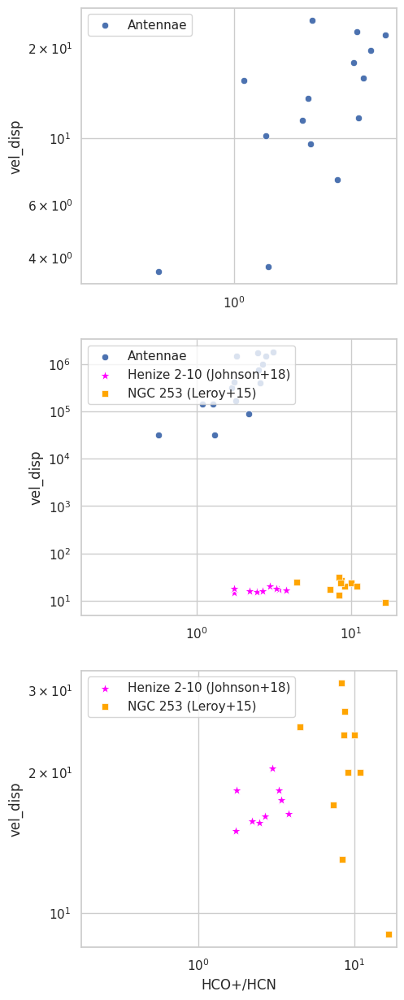

In [581]:
fig, ax = plt.subplots(nrows=3,ncols=1, figsize=(5,15))
sns.scatterplot(data=antdf, x=(hco_lr*antdf['LHCO'])/(hcn_lr*antdf['LHCN']), y=antdf['vel_dispCO'], label='Antennae',ax=ax[0])

ax[0].set_xlabel(' ')
ax[0].set_ylabel('vel_disp')

#ax.invert_xaxis()
ax[0].set_xscale('log')
ax[0].set_yscale('log')
ax[0].set_xlim(left=10**-(.5))

ax[0].legend(loc='upper left')


sns.scatterplot(data=antdf, x=(hco_lr*antdf['LHCO'])/(hcn_lr*antdf['LHCN']), y=(co_lr*antdf['LCO']), label='Antennae',ax=ax[1])
#sns.scatterplot(data=smoothdf, x=smoothdf['LHCO']/(smoothdf['LHCN']), y=(co_lr*smoothdf['LCO']), label='30 Dor combined')
sns.scatterplot(data=henizedf, x=henizedf.LHCO/(henizedf.LHCN), y=henizedf['vel_dispCO'], label='Henize 2-10 (Johnson+18)',ax=ax[1], color='magenta', marker=m_henize,s=95)
#sns.scatterplot(data=ngc253leroydf, x=1/ngc253leroydf['CO/HCO+'], y=ngc253leroydf['HCN/HCO+']/ngc253leroydf['CO/HCO+'], label='NGC 253 (Leroy+15)')
sns.scatterplot(data=ngc253leroydf, x=dfngc253_dense_gas['LHCO']/dfngc253_dense_gas[' LHCN'], y=dfngc253_dense_gas['vel_disp'], label='NGC 253 (Leroy+15)',ax=ax[1],color='orange',marker=m_253)

ax[1].set_xlabel(' ')
ax[1].set_ylabel('vel_disp')

#ax.invert_xaxis()
ax[1].set_xscale('log')
ax[1].set_yscale('log')
ax[1].set_xlim(left=10**-.75)

ax[1].legend(loc='upper left')

#sns.scatterplot(data=antdf, x=(hco_lr*antdf['LHCO'])/(hcn_lr*antdf['LHCN']), y=(co_lr*antdf['LCO']), label='Antennae',ax=ax[1])
#sns.scatterplot(data=smoothdf, x=smoothdf['LHCO']/(smoothdf['LHCN']), y=(co_lr*smoothdf['LCO']), label='30 Dor combined')
sns.scatterplot(data=henizedf, x=henizedf.LHCO/(henizedf.LHCN), y=henizedf['vel_dispCO'], label='Henize 2-10 (Johnson+18)',ax=ax[2], color='magenta', marker=m_henize,s=95)
#sns.scatterplot(data=ngc253leroydf, x=1/ngc253leroydf['CO/HCO+'], y=ngc253leroydf['HCN/HCO+']/ngc253leroydf['CO/HCO+'], label='NGC 253 (Leroy+15)')
sns.scatterplot(data=ngc253leroydf, x=dfngc253_dense_gas['LHCO']/dfngc253_dense_gas[' LHCN'], y=dfngc253_dense_gas['vel_disp'], label='NGC 253 (Leroy+15)',ax=ax[2],color='orange',marker=m_253)

ax[2].set_xlabel('HCO+/HCN')
ax[2].set_ylabel('vel_disp')

#ax.invert_xaxis()
ax[2].set_xscale('log')
ax[2].set_yscale('log')
ax[2].set_xlim(left=10**-.75)

ax[2].legend(loc='upper left')

plt.show()

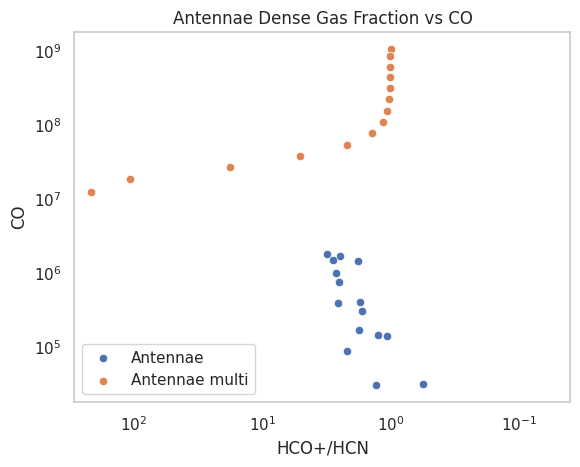

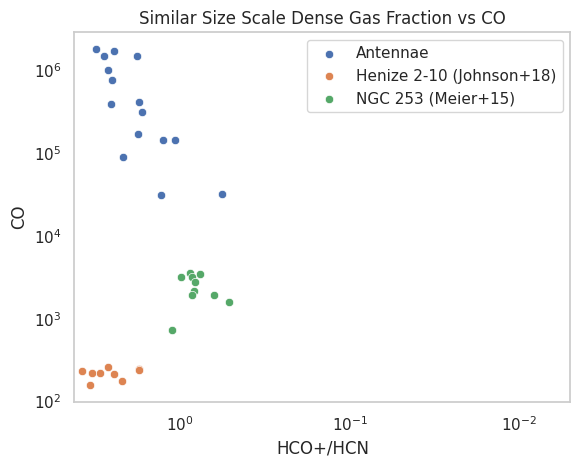

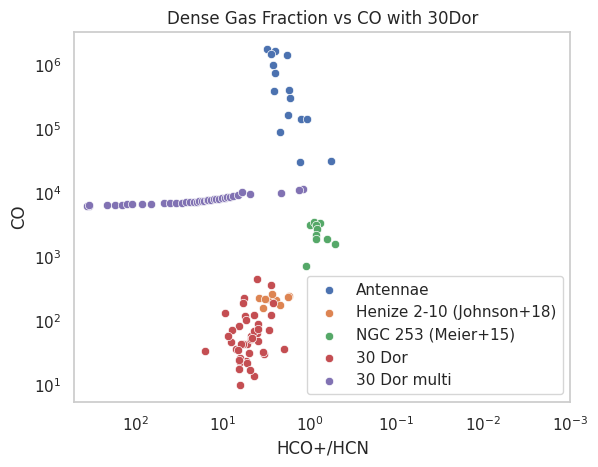

In [582]:
fig, ax = plt.subplots()
sns.scatterplot(data=antdf, x=(hco_lr*antdf['LHCO'])/(hcn_lr*antdf['LHCN']), y=(co_lr*antdf['LCO']), label='Antennae')
sns.scatterplot(data=antmultidf, x=(hco_lr*antmultidf['LHCO'])/(hcn_lr*antmultidf['LHCN']), y=(co_lr*antmultidf['LCO']), label='Antennae multi')

plt.xlabel('HCO+/HCN')
plt.ylabel('CO')

ax.invert_xaxis()
ax.set_xscale('log')
ax.set_yscale('log')
ax.set_xlim(right=4*10**-2)

plt.grid()
plt.legend(loc='lower left')
plt.title('Antennae Dense Gas Fraction vs CO')
plt.show()


fig, ax = plt.subplots()
sns.scatterplot(data=antdf, x=(hco_lr*antdf['LHCO'])/(hcn_lr*antdf['LHCN']), y=(co_lr*antdf['LCO']), label='Antennae')
#sns.scatterplot(data=smoothdf, x=smoothdf['LHCO']/(smoothdf['LHCN']), y=(co_lr*smoothdf['LCO']), label='30 Dor combined')
sns.scatterplot(data=henizedf, x=henizedf.LHCO/(henizedf.LHCN), y=(co_lr*henizedf.LCO), label='Henize 2-10 (Johnson+18)')
#sns.scatterplot(data=ngc253leroydf, x=1/ngc253leroydf['CO/HCO+'], y=ngc253leroydf['HCN/HCO+']/ngc253leroydf['CO/HCO+'], label='NGC 253 (Leroy+15)')
sns.scatterplot(data=ngc253df, x=ngc253df['HCO+(1-0)']/ngc253df['HCN(1-0)'], y=ngc253df['CO(1-0)'], label='NGC 253 (Meier+15)')


plt.xlabel('HCO+/HCN')
plt.ylabel('CO')

ax.invert_xaxis()
ax.set_xscale('log')
ax.set_yscale('log')
ax.set_xlim(right=10**-2.3)

plt.grid()
plt.legend(loc='upper right')
plt.title('Similar Size Scale Dense Gas Fraction vs CO')

plt.show()


fig, ax = plt.subplots()

#sns.scatterplot(data=antdf, x=(hco_lr*antdf['LHCO'])/(hcn_lr*antdf['LHCN']), y=(co_lr*antdf['LCO']), label='Antennae')
#sns.scatterplot(data=df30dor_m, x=df30dor_m['LHCO']/df30dor_m['LHCN'], y=(co_lr*df30dor_m['LCO']), label='30 Dor')
#sns.scatterplot(data=smoothdf, x=smoothdf['LHCO']/smoothdf['LHCN'], y=(co_lr*smoothdf['LCO']), label='30 Dor combined')

sns.scatterplot(data=antdf, x=(hco_lr*antdf['LHCO'])/(hcn_lr*antdf['LHCN']), y=(co_lr*antdf['LCO']), label='Antennae')
#sns.scatterplot(data=smoothdf, x=smoothdf['LHCO']/(smoothdf['LHCN']), y=(co_lr*smoothdf['LCO']), label='30 Dor combined')
sns.scatterplot(data=henizedf, x=henizedf.LHCO/(henizedf.LHCN), y=(co_lr*henizedf.LCO), label='Henize 2-10 (Johnson+18)')
#sns.scatterplot(data=ngc253leroydf, x=1/ngc253leroydf['CO/HCO+'], y=ngc253leroydf['HCN/HCO+']/ngc253leroydf['CO/HCO+'], label='NGC 253 (Leroy+15)')
sns.scatterplot(data=ngc253df, x=ngc253df['HCO+(1-0)']/ngc253df['HCN(1-0)'], y=ngc253df['CO(1-0)'], label='NGC 253 (Meier+15)')
sns.scatterplot(data=df30dor_m, x=df30dor_m['LHCO']/df30dor_m['LHCN'], y=(co_lr*df30dor_m['LCO']), label='30 Dor')
#sns.scatterplot(data=df30dor_dendro4, x=df30dor_dendro4['LHCO']/df30dor_dendro4['LHCN'], y=(co_lr*df30dor_dendro4['LCO']), label='30 Dor dendro')
sns.scatterplot(data=multidf, x=multidf['LHCO']/multidf['LHCN'], y=(co_lr*multidf['LCO']), label='30 Dor multi')

'''sns.scatterplot(data=empiredf, x=empiredf['LHCO']/empiredf['LHCN'], y=empiredf['LCO'], label='Empire')
sns.scatterplot(data=df, x=df['LHCO']/df['LHCN'],y=df['LCO'], label='Gallagher')
sns.scatterplot(data=m31df, x=m31df['HCO+']/m31df['HCN'], y=m31df['CO'], label='M31')'''


plt.xlabel('HCO+/HCN')
plt.ylabel('CO')

ax.invert_xaxis()
ax.set_xscale('log')
ax.set_yscale('log')
ax.set_xlim(right=10**-3)
plt.grid()
plt.legend(loc='lower right')
plt.title('Dense Gas Fraction vs CO with 30Dor')

plt.show()

In [583]:
#df = df[df.line_race != 0]
'''multidf=multidf[multidf.nsig==.25]
multidf=multidf[multidf.nsig==1.5]
multidf=multidf[multidf.nsig==.75]
antmultidf=antmultidf[antmultidf.nsig==.25]
antmultidf=antmultidf[antmultidf.nsig==1.5]
antmultidf=antmultidf[antmultidf.nsig==.75]'''

'multidf=multidf[multidf.nsig==.25]\nmultidf=multidf[multidf.nsig==1.5]\nmultidf=multidf[multidf.nsig==.75]\nantmultidf=antmultidf[antmultidf.nsig==.25]\nantmultidf=antmultidf[antmultidf.nsig==1.5]\nantmultidf=antmultidf[antmultidf.nsig==.75]'

<Axes: xlabel='nsig', ylabel='LHCN'>

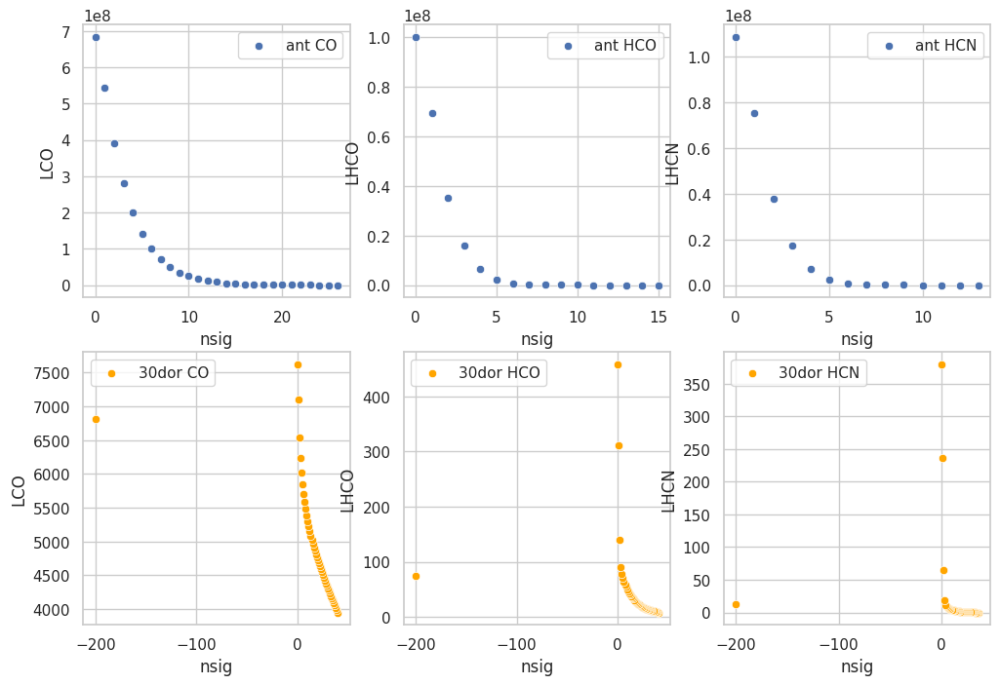

In [584]:
fig, ax = plt.subplots(nrows=2, ncols=3, figsize=(12,8))
sns.scatterplot(data=antmultidf, x='nsig', y='LCO', label='ant CO', ax=ax[0,0])
sns.scatterplot(data=antmultidf, x='nsig', y='LHCO', label='ant HCO', ax=ax[0,1])
sns.scatterplot(data=antmultidf, x='nsig', y='LHCN', label='ant HCN', ax=ax[0,2])

sns.scatterplot(data=multidf, x='nsig', y='LCO', label='30dor CO', ax=ax[1,0], color='orange')
sns.scatterplot(data=multidf, x='nsig', y='LHCO', label='30dor HCO', ax=ax[1,1], color='orange')
sns.scatterplot(data=multidf, x='nsig', y='LHCN', label='30dor HCN', ax=ax[1,2], color='orange')


Text(0.5, 0.92, 'normalized luminosity')

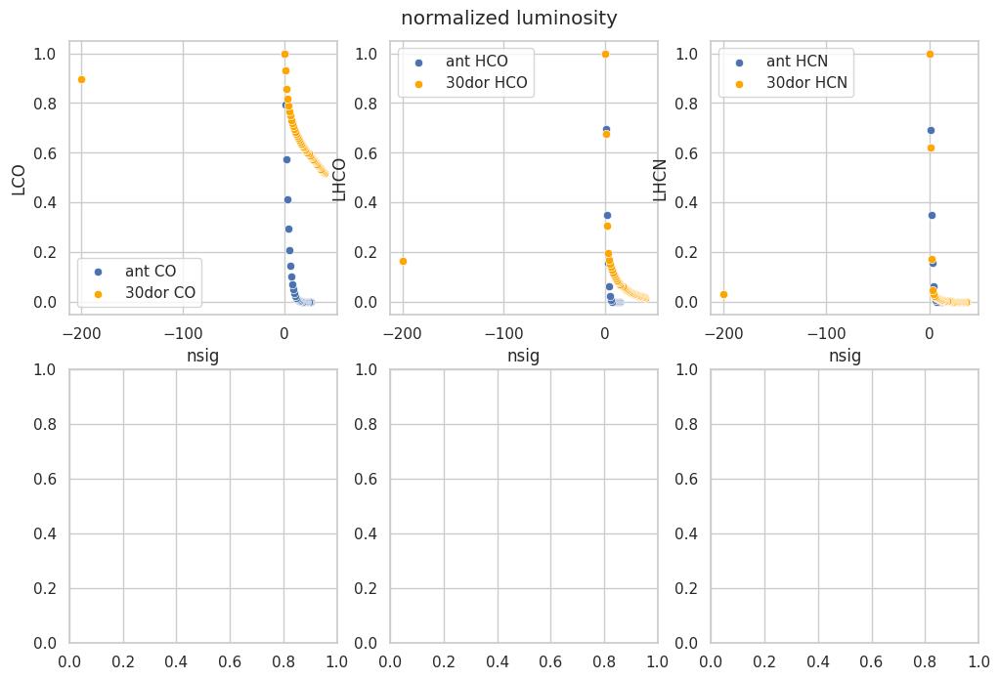

In [585]:
fig, ax = plt.subplots(nrows=2, ncols=3, figsize=(12,8))
sns.scatterplot(data=antmultidf, x='nsig', y=antmultidf['LCO']/np.nanmax(antmultidf['LCO']), label='ant CO', ax=ax[0,0])
sns.scatterplot(data=antmultidf, x='nsig', y=antmultidf['LHCO']/np.nanmax(antmultidf['LHCO']), label='ant HCO', ax=ax[0,1])
sns.scatterplot(data=antmultidf, x='nsig', y=antmultidf['LHCN']/np.nanmax(antmultidf['LHCN']), label='ant HCN', ax=ax[0,2])

sns.scatterplot(data=multidf, x='nsig', y=multidf['LCO']/np.nanmax(multidf['LCO']), label='30dor CO', ax=ax[0,0], color='orange')
sns.scatterplot(data=multidf, x='nsig', y=multidf['LHCO']/np.nanmax(multidf['LHCO']), label='30dor HCO', ax=ax[0,1], color='orange')
sns.scatterplot(data=multidf, x='nsig', y=multidf['LHCN']/np.nanmax(multidf['LHCN']), label='30dor HCN', ax=ax[0,2], color='orange')
plt.suptitle('normalized luminosity', y=.92)

<Axes: xlabel='LHCN', ylabel='Proportion'>

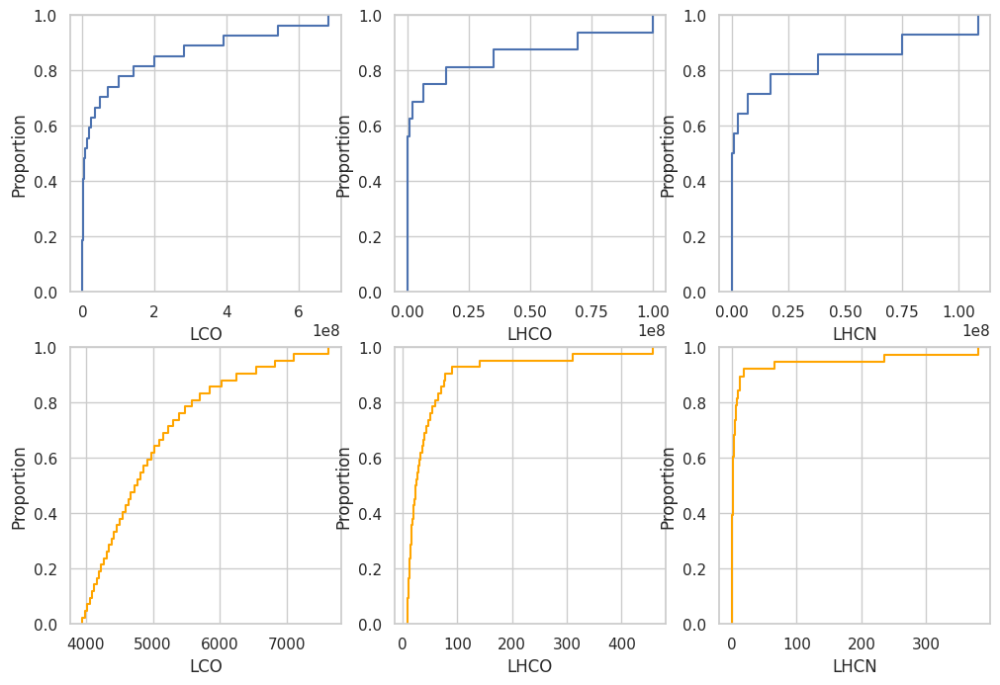

In [586]:
#sns.ecdfplot(data=antmultidf, x='LCO', label='ant co')
#sns.ecdfplot(data=multidf, x='LCO', label='30dor co')
fig, ax = plt.subplots(nrows=2, ncols=3, figsize=(12,8))
sns.ecdfplot(data=antmultidf, x='LCO', label='ant CO', ax=ax[0,0])
sns.ecdfplot(data=antmultidf, x='LHCO', label='ant HCO', ax=ax[0,1])
sns.ecdfplot(data=antmultidf, x='LHCN', label='ant HCN', ax=ax[0,2])

sns.ecdfplot(data=multidf, x='LCO', label='30dor CO', ax=ax[1,0], color='orange')
sns.ecdfplot(data=multidf, x='LHCO', label='30dor HCO', ax=ax[1,1], color='orange')
sns.ecdfplot(data=multidf, x='LHCN', label='30dor HCN', ax=ax[1,2], color='orange')

(0.0, 5.0)

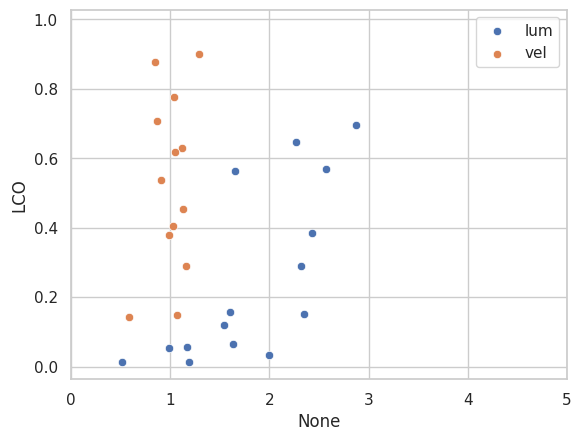

In [587]:
sns.scatterplot(data=antdf, x=antdf['LHCO']/antdf['LHCN'], y=antdf['LCO']/np.nanmax(antdf['LCO']), label='lum')
sns.scatterplot(data=antdf, x=antdf['vel_dispHCO']/antdf['vel_dispHCN'], y=antdf['vel_dispCO']/np.nanmax(antdf['vel_dispCO']), label='vel')
plt.xlim([0,5])

Text(0, 0.5, 'SFR')

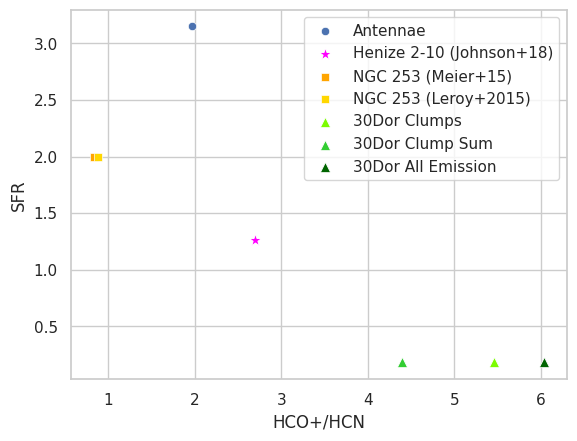

In [588]:
fig, ax = plt.subplots()
sns.scatterplot(x=np.nanmean((hco_lr*antdf['LHCO'])/(hcn_lr*antdf['LHCN'])), y=[3.15], label='Antennae')
sns.scatterplot(x=np.nanmean(henizedf['LHCO']/henizedf['LHCN']), y=[1.26], label='Henize 2-10 (Johnson+18)', color='magenta', marker=m_henize, s=95)
#sns.scatterplot(x=np.nanmean(dfngc253_dense_gas['LHCO']/dfngc253_dense_gas[' LHCN']), y=[2], label='253')
sns.scatterplot(x=np.nanmean(ngc253df['HCO+(1-0)']/ngc253df['HCN(1-0)']), y=[2], label='NGC 253 (Meier+15)', color='orange',marker=m_253)
sns.scatterplot(x=np.nanmean(1/ngc253leroydf['HCN/HCO+']), y=[2], label='NGC 253 (Leroy+2015)', color='gold', marker=m_253)
sns.scatterplot(x=np.nanmean(df30dor_m['LHCO']/df30dor_m['LHCN']), y=[.18], label='30Dor Clumps', color='lawngreen', marker='^', s=55)
sns.scatterplot(x=df30dor_clump_sum['LHCO']/df30dor_clump_sum['LHCN'], y=[.18], label='30Dor Clump Sum',color='limegreen', marker='^', s=55)
sns.scatterplot(x=df30dor['LHCO']/df30dor['LHCN'], y=[.18], label='30Dor All Emission', s=55, color='darkgreen',marker='^')

plt.xlabel('HCO+/HCN')
plt.ylabel('SFR')

not using ant overlap 8 and 9 from https://iopscience.iop.org/article/10.3847/1538-3881/ab041d/pdf


In [589]:
multidf

,nsig,LCO,LCOerr,L13CO,L13COerr,LHCO,LHCOerr,LHCN,LHCNerr,LCS,...,vel_dispHCN,vel_dispHCNerr,vel_dispCS,vel_dispCSerr,maj,min,R,Rerr,area,perim
0,40,3951,395.1,217.5,21.75,8.074,0.8076,NaN,NaN,0.1139,...,NaN,NaN,49.640,4.9020,12.47,2.237,8.570,4.744,141.8,468.6
1,39,3985,398.5,223.6,22.36,8.587,0.8589,NaN,NaN,0.1675,...,NaN,NaN,49.640,4.9020,12.46,2.243,8.579,4.880,143.8,469.3
2,38,4021,402.1,230.0,23.00,9.064,0.9065,NaN,NaN,0.1898,...,NaN,NaN,49.640,4.9020,12.47,2.243,8.583,4.929,145.9,473.1
3,37,4056,405.6,236.4,23.64,9.512,0.9513,NaN,NaN,0.2408,...,NaN,NaN,49.640,4.9020,12.47,2.243,8.582,4.920,148.2,477.2
4,36,4089,408.9,242.8,24.28,10.070,1.0070,0.02901,0.003043,0.2833,...,52.730,4.5650,49.640,4.9020,12.51,2.227,8.568,4.978,150.2,480.0
5,35,4125,412.5,249.5,24.96,10.600,1.0600,0.02901,0.003043,0.3690,...,52.730,4.5650,49.640,4.9020,12.49,2.223,8.553,4.987,152.4,482.9
6,34,4161,416.1,256.3,25.63,11.200,1.1200,0.03238,0.003381,0.4793,...,52.730,4.5650,49.640,4.9020,12.49,2.223,8.552,4.976,154.8,488.0
7,33,4196,419.6,263.4,26.34,11.770,1.1770,0.05526,0.005676,0.5733,...,52.730,4.5650,49.640,4.9020,12.43,2.231,8.548,5.117,157.2,493.3
8,32,4232,423.2,270.3,27.03,12.340,1.2340,0.07116,0.007270,0.6489,...,52.730,4.5650,49.640,4.9020,12.43,2.231,8.548,5.108,159.8,496.0
9,31,4270,427.0,277.9,27.79,13.020,1.3020,0.08947,0.009104,0.7587,...,52.730,4.5650,49.640,4.9020,12.44,2.241,8.570,4.846,162.4,502.4


Text(0, 0.5, 'SFR')

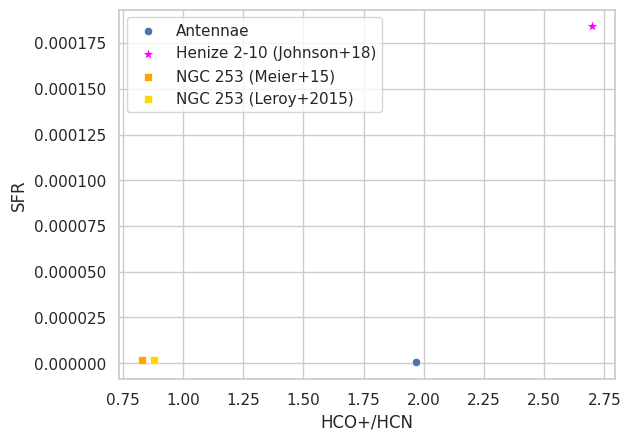

In [590]:
fig, ax = plt.subplots()
sns.scatterplot(x=np.nanmean((hco_lr*antdf['LHCO'])/(hcn_lr*antdf['LHCN'])), y=[2.65/(2600**2)], label='Antennae')
sns.scatterplot(x=np.nanmean(henizedf['LHCO']/henizedf['LHCN']), y=[1.26/(82.73608787404142**2)], label='Henize 2-10 (Johnson+18)', color='magenta', marker=m_henize, s=95)
#sns.scatterplot(x=np.nanmean(dfngc253_dense_gas['LHCO']/dfngc253_dense_gas[' LHCN']), y=[2], label='253')
sns.scatterplot(x=np.nanmean(ngc253df['HCO+(1-0)']/ngc253df['HCN(1-0)']), y=[2/(1000**2)], label='NGC 253 (Meier+15)', color='orange',marker=m_253)
sns.scatterplot(x=np.nanmean(1/ngc253leroydf['HCN/HCO+']), y=[2/(1000**2)], label='NGC 253 (Leroy+2015)', color='gold', marker=m_253)
#sns.scatterplot(x=np.nanmean(df30dor_m['LHCO']/df30dor_m['LHCN']), y=[.18/(8.523**2)], label='30Dor Clumps', color='lawngreen', marker='^', s=55)
#sns.scatterplot(x=df30dor_clump_sum['LHCO']/df30dor_clump_sum['LHCN'], y=[.18/(8.523**2)], label='30Dor Clump Sum',color='limegreen', marker='^', s=55)
#sns.scatterplot(x=df30dor['LHCO']/df30dor['LHCN'], y=[.18/(8.523**2)], label='30Dor All Emission', s=55, color='darkgreen',marker='^')

plt.xlabel('HCO+/HCN')
plt.ylabel('SFR')

Text(0, 0.5, 'SFR')

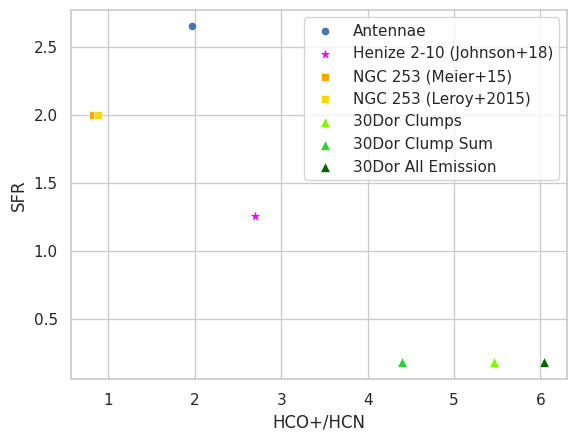

In [591]:
fig, ax = plt.subplots()
#sns.scatterplot(x=np.nanmean(((hco_lr*antdf['LHCO'])/(hcn_lr*antdf['LHCN']))/(antdf['R']**2)), y=[2.65], label='Antennae')
#sns.scatterplot(x=np.nanmean((henizedf['LHCO']/henizedf['LHCN'])/(34.83624752591218**2)), y=[1.26], label='Henize 2-10 (Johnson+18)', color='magenta', marker=m_henize, s=95)
sns.scatterplot(x=np.nanmean(((hco_lr*antdf['LHCO'])/(hcn_lr*antdf['LHCN']))), y=[2.65], label='Antennae')
sns.scatterplot(x=np.nanmean((henizedf['LHCO']/henizedf['LHCN'])), y=[1.26], label='Henize 2-10 (Johnson+18)', color='magenta', marker=m_henize, s=95)
#sns.scatterplot(x=np.nanmean(dfngc253_dense_gas['LHCO']/dfngc253_dense_gas[' LHCN']), y=[2], label='253')
sns.scatterplot(x=np.nanmean(ngc253df['HCO+(1-0)']/ngc253df['HCN(1-0)']), y=[2], label='NGC 253 (Meier+15)', color='orange',marker=m_253)
sns.scatterplot(x=np.nanmean(1/ngc253leroydf['HCN/HCO+']), y=[2], label='NGC 253 (Leroy+2015)', color='gold', marker=m_253)
sns.scatterplot(x=np.nanmean(df30dor_m['LHCO']/df30dor_m['LHCN']), y=[.18], label='30Dor Clumps', color='lawngreen', marker='^', s=55)
sns.scatterplot(x=df30dor_clump_sum['LHCO']/df30dor_clump_sum['LHCN'], y=[.18], label='30Dor Clump Sum',color='limegreen', marker='^', s=55)
sns.scatterplot(x=df30dor['LHCO']/df30dor['LHCN'], y=[.18], label='30Dor All Emission', s=55, color='darkgreen',marker='^')

plt.xlabel('HCO+/HCN')
plt.ylabel('SFR')

Text(0, 0.5, 'SFR')

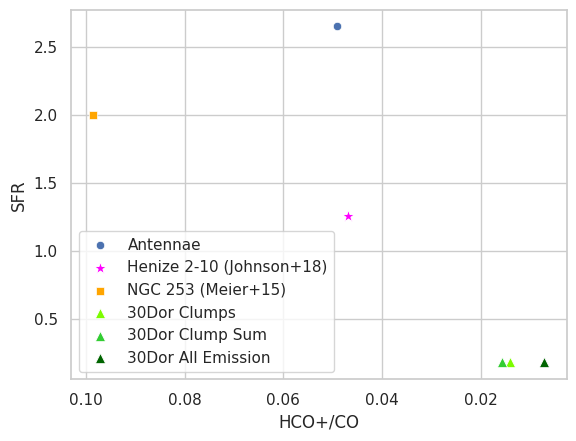

In [592]:
fig, ax = plt.subplots()
sns.scatterplot(x=np.nanmean((hco_lr*antdf['LHCO'])/(co_lr*antdf['LCO'])), y=[2.65], label='Antennae')
sns.scatterplot(x=np.nanmean(henizedf['LHCO']/(co_lr*henizedf['LCO'])), y=[1.26], label='Henize 2-10 (Johnson+18)', color='magenta', marker=m_henize, s=95)
#sns.scatterplot(x=np.nanmean(dfngc253_dense_gas['LHCO']/dfngc253_dense_gas[' LHCN']), y=[2], label='253')
sns.scatterplot(x=np.nanmean(ngc253df['HCO+(1-0)']/ngc253df['CO(1-0)']), y=[2], label='NGC 253 (Meier+15)', color='orange',marker=m_253)
#sns.scatterplot(x=np.nanmean(1/ngc253leroydf['HCN/HCO+']), y=[2], label='NGC 253 (Leroy+2015)', color='gold', marker=m_253)
sns.scatterplot(x=np.nanmean(df30dor_m['LHCO']/(co_lr*df30dor_m['LCO'])), y=[.18], label='30Dor Clumps', color='lawngreen', marker='^', s=55)
sns.scatterplot(x=df30dor_clump_sum['LHCO']/(co_lr*df30dor_clump_sum['LCO']), y=[.18], label='30Dor Clump Sum',color='limegreen', marker='^', s=55)
sns.scatterplot(x=df30dor['LHCO']/(co_lr*df30dor['LCO']), y=[.18], label='30Dor All Emission', s=55, color='darkgreen',marker='^')
ax.invert_xaxis()
plt.xlabel('HCO+/CO')
plt.ylabel('SFR')

Text(0, 0.5, 'SFR')

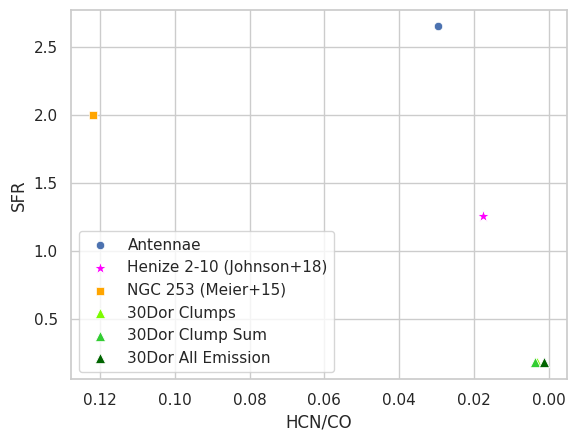

In [593]:
fig, ax = plt.subplots()
sns.scatterplot(x=np.nanmean((hcn_lr*antdf['LHCN'])/(co_lr*antdf['LCO'])), y=[2.65], label='Antennae')
sns.scatterplot(x=np.nanmean(henizedf['LHCN']/(co_lr*henizedf['LCO'])), y=[1.26], label='Henize 2-10 (Johnson+18)', color='magenta', marker=m_henize, s=95)
#sns.scatterplot(x=np.nanmean(dfngc253_dense_gas['LHCO']/dfngc253_dense_gas[' LHCN']), y=[2], label='253')
sns.scatterplot(x=np.nanmean(ngc253df['HCN(1-0)']/ngc253df['CO(1-0)']), y=[2], label='NGC 253 (Meier+15)', color='orange',marker=m_253)
#sns.scatterplot(x=np.nanmean(1/ngc253leroydf['HCN/HCO+']), y=[2], label='NGC 253 (Leroy+2015)', color='gold', marker=m_253)
sns.scatterplot(x=np.nanmean(df30dor_m['LHCN']/(co_lr*df30dor_m['LCO'])), y=[.18], label='30Dor Clumps', color='lawngreen', marker='^', s=55)
sns.scatterplot(x=df30dor_clump_sum['LHCN']/(co_lr*df30dor_clump_sum['LCO']), y=[.18], label='30Dor Clump Sum',color='limegreen', marker='^', s=55)
sns.scatterplot(x=df30dor['LHCN']/(co_lr*df30dor['LCO']), y=[.18], label='30Dor All Emission', s=55, color='darkgreen',marker='^')
ax.invert_xaxis()
plt.xlabel('HCN/CO')
plt.ylabel('SFR')

# co excitation

In [594]:
tex = pd.read_csv('https://github.com/gracekrahm/antennae-dense-gas/blob/main/co_tex_tau.csv?raw=True')
tex30dor = pd.read_csv('https://github.com/gracekrahm/30Dor_dense_gas/blob/c4de40a3d8ad13a07b381b0754ff67fa8b0c2fd8/co_tex_tau.csv?raw=True')

In [595]:
antdf = antdf.merge(tex, how='outer', on='ncl')
antdf

,ncl,cltype,LCO,LCOerr,LHCO,LHCOerr,LHCN,LHCNerr,vel_dispCO,vel_dispCOerr,...,LHCN43,LHCN43err,vel_dispHCN43,vel_dispHCN43err,L13CO,L13COerr,vel_disp13CO,vel_disp13COerr,tex,tau
0,1,2,1174000.0,117900.0,51940.0,5704.0,18110.0,2943.0,22.130,0.27090,...,16.26,168.7,0.1511,89.76000,149100.0,15090.0,20.930,0.22410,19.760,0.1336
1,2,2,1092000.0,109700.0,61860.0,6591.0,27280.0,3579.0,17.820,0.22670,...,NaN,NaN,NaN,NaN,194200.0,19550.0,16.800,0.18230,19.630,0.1930
2,3,2,957700.0,96180.0,39270.0,4420.0,15290.0,2542.0,19.610,0.25980,...,NaN,NaN,NaN,NaN,156000.0,15730.0,18.920,0.19110,20.940,0.1795
3,4,2,949700.0,95530.0,40150.0,4618.0,24280.0,3340.0,24.700,0.41570,...,NaN,NaN,NaN,NaN,187700.0,18910.0,23.250,0.29570,16.770,0.2294
4,5,2,648700.0,65320.0,23640.0,2938.0,9728.0,1992.0,15.850,0.21970,...,NaN,NaN,NaN,NaN,104700.0,10610.0,15.410,0.20160,19.520,0.1735
5,6,2,242200.0,24790.0,9549.0,1537.0,NaN,NaN,15.380,0.21920,...,NaN,NaN,NaN,NaN,35530.0,3749.0,14.730,0.19360,16.200,0.1609
6,7,2,93550.0,10530.0,4248.0,1045.0,3648.0,1059.0,10.190,0.15130,...,NaN,NaN,NaN,NaN,28130.0,3015.0,9.867,0.12630,9.911,0.3615
7,8,2,324700.0,33330.0,NaN,NaN,NaN,NaN,16.820,0.23830,...,NaN,NaN,NaN,NaN,48660.0,5149.0,16.750,0.23030,12.400,0.1611
8,9,2,135900.0,14530.0,NaN,NaN,NaN,NaN,9.332,0.13020,...,NaN,NaN,NaN,NaN,26190.0,2863.0,9.210,0.12120,11.480,0.2167
9,10,2,253900.0,26160.0,8816.0,1505.0,3752.0,1264.0,11.720,0.17100,...,NaN,NaN,NaN,NaN,73590.0,7495.0,11.120,0.13340,13.210,0.3447


In [596]:
df30dor_m.merge(tex30dor, how='outer', on='ncl')

,ncl,cltype,LCO,LCOerr,L13CO,L13COerr,LHCO,LHCOerr,LHCN,LHCNerr,...,maj,min,R,Rerr,area,perim],collapsed,logu,tex,tau
0,1,2,76.610,7.6620,12.2600,1.22700,2.13500,0.213800,0.39040,0.039680,...,0.3704,0.3193,0.29040,0.06638,1.6130,8.436,0.182857,-1.9,70.96,0.15690
1,2,2,1.000,4.7160,11.2500,1.12500,NaN,NaN,NaN,NaN,...,0.2728,0.4094,0.25870,0.15410,0.7087,3.927,NaN,-1.9,78.60,0.24360
2,3,2,290.300,29.0300,60.1000,6.01000,10.89000,1.089000,2.69200,0.269800,...,0.4632,0.9552,0.97000,0.28600,4.6120,12.510,0.247199,-1.9,70.42,0.20090
3,4,2,145.000,14.5000,22.4300,2.24400,4.64000,0.464300,0.81850,0.082430,...,0.3283,1.1840,0.89410,0.88760,4.3580,13.820,0.176401,-1.9,60.14,0.15240
4,5,2,51.300,5.1300,6.8960,0.69040,NaN,NaN,NaN,NaN,...,0.6205,0.2988,0.51160,0.30140,1.4650,5.963,NaN,-1.9,63.94,0.13360
5,6,2,121.100,12.1100,19.6300,1.96300,3.76100,0.376400,0.63810,0.064430,...,0.6460,0.5175,0.80940,0.17620,2.7870,7.854,0.169662,-1.9,67.53,0.16240
6,7,2,57.840,5.7840,10.1000,1.01000,2.16700,0.217000,0.55000,0.055590,...,0.5513,0.3037,0.46290,0.02662,1.0470,4.945,0.253807,-1.9,66.25,0.17570
7,8,2,30.160,3.0160,4.0490,0.40570,0.91970,0.092320,0.11500,0.012180,...,0.5605,0.2682,0.41110,0.05584,0.8990,4.945,0.125041,-1.9,62.92,0.13970
8,9,2,38.080,3.8080,4.8090,0.48170,0.98810,0.099190,0.20930,0.021580,...,0.3450,0.3929,0.36050,0.08105,0.8990,4.945,0.211821,-1.9,66.98,0.12930
9,10,2,125.200,12.5200,32.5300,3.25400,2.33400,0.233900,0.88710,0.089510,...,0.5830,0.4936,0.72960,0.11880,2.5490,8.581,0.380077,-1.9,60.18,0.27810


In [597]:
tex30dor.columns

Index(['ncl', 'tex', 'tau'], dtype='object')

(0.015659495420728343, 0.055)

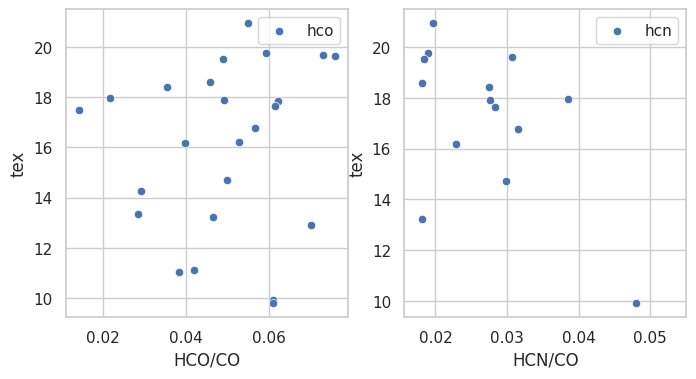

In [598]:
fig, ax = plt.subplots(nrows=1, ncols=2, figsize=(8,4))
sns.scatterplot(x=(hco_lr*antdf['LHCO'])/(co_lr*antdf['LCO']), y=antdf['tex'], label='hco', ax=ax[0])
sns.scatterplot(x=(hcn_lr*antdf['LHCN'])/(co_lr*antdf['LCO']), y=antdf['tex'], label='hcn', ax=ax[1])
ax[0].set_xlabel('HCO/CO')
ax[1].set_xlabel('HCN/CO')
ax[1].set_xlim(right=.055)

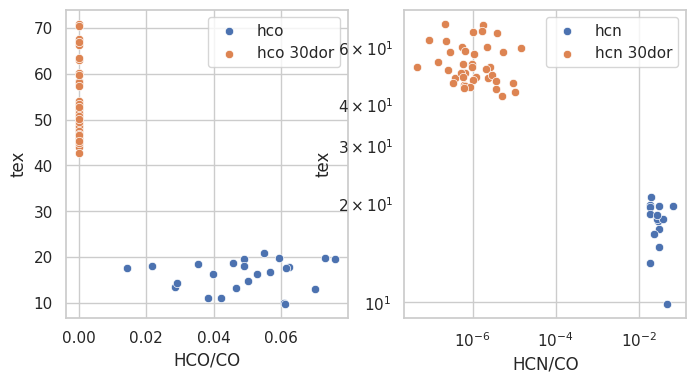

In [599]:
fig, ax = plt.subplots(nrows=1, ncols=2, figsize=(8,4))
sns.scatterplot(x=(hco_lr*antdf['LHCO'])/(co_lr*antdf['LCO']), y=antdf['tex'], label='hco', ax=ax[0])
sns.scatterplot(x=(hcn_lr*antdf['LHCN'])/(co_lr*antdf['LCO']), y=antdf['tex'], label='hcn', ax=ax[1])
ax[0].set_xlabel('HCO/CO')
ax[1].set_xlabel('HCN/CO')
sns.scatterplot(x=(df30dor_m['LHCO'])/(co_lr*antdf['LCO']), y=tex30dor['tex'], label='hco 30dor', ax=ax[0])
sns.scatterplot(x=(df30dor_m['LHCN'])/(co_lr*antdf['LCO']), y=tex30dor['tex'], label='hcn 30dor', ax=ax[1])
plt.xscale('log')
plt.yscale('log')

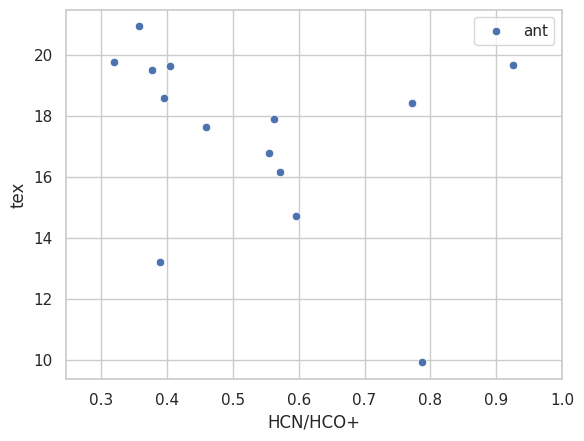

In [600]:
sns.scatterplot(x=(hcn_lr*antdf['LHCN'])/(hco_lr*antdf['LHCO']), y=antdf['tex'], label='ant')
plt.xlim(right=1)
plt.xlabel('HCN/HCO+')
ad = antdf[['LCO','L13CO','LHCO','LHCN','tex','tau','R']].dropna()

In [601]:
pearsonr((hcn_lr*ad['LHCN'])/(hco_lr*ad['LHCO']),ad['tex'])

PearsonRResult(statistic=-0.7742282420333099, pvalue=0.003117363924260252)

In [602]:
pearsonr((hcn_lr*ad['LHCN'])/(co_lr*ad['LCO']),ad['tex'])


PearsonRResult(statistic=-0.6375031081598573, pvalue=0.025747047012389182)

In [603]:
pearsonr((hcn_lr*ad['LHCN'])/(co_lr*ad['LCO']),ad['tex'])


PearsonRResult(statistic=-0.6375031081598573, pvalue=0.025747047012389182)

In [604]:
pearsonr((co_lr*ad['LCO'])/((hcn_lr*ad['LHCN'])/(hco_lr*ad['LHCO'])),ad['tex'])

PearsonRResult(statistic=0.6796085870595615, pvalue=0.015050012598079978)

PearsonRResult(statistic=0.6796085870595615, pvalue=0.015050012598079978)

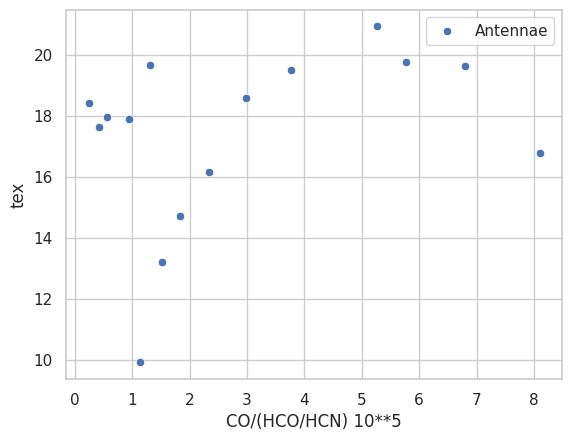

In [605]:
sns.scatterplot(data=antdf, x=((co_lr*antdf['LCO'])/((hco_lr*antdf['LHCO'])/(hcn_lr*antdf['LHCN'])))/1E5, y=antdf['tex'], label='Antennae')
#plt.xscale('log')

#plt.yscale('log')
plt.xlabel('CO/(HCO/HCN) 10**5')
pearsonr((co_lr*ad['LCO'])/((hcn_lr*ad['LHCN'])/(hco_lr*ad['LHCO'])),ad['tex'])


In [606]:
ad=ad[((co_lr*ad['LCO'])/((hco_lr*ad['LHCO'])/(hcn_lr*ad['LHCN'])))/(np.pi*(ad['R'])**2)<400]
((co_lr*ad['LCO'])/((hco_lr*ad['LHCO'])/(hcn_lr*ad['LHCN'])))/(np.pi*(ad['R'])**2)

,0
0,50.268569
1,50.310647
2,84.112363
3,37.011869
4,54.085369
6,26.399664
9,9.668691
14,16.695348
16,57.674949
29,69.314123


PearsonRResult(statistic=0.7367899363262755, pvalue=0.015066103884365698)

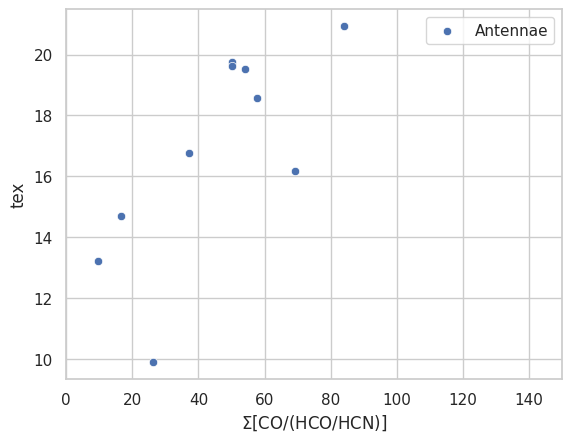

In [607]:
sns.scatterplot(data=antdf, x=((co_lr*antdf['LCO'])/((hco_lr*antdf['LHCO'])/(hcn_lr*antdf['LHCN'])))/(np.pi*(antdf['R'])**2), y=antdf['tex'], label='Antennae')
#plt.xscale('log')
plt.xlim([0,150])
#plt.yscale('log')
plt.xlabel('$\Sigma$[CO/(HCO/HCN)]')
pearsonr(((co_lr*ad['LCO'])/((hco_lr*ad['LHCO'])/(hcn_lr*ad['LHCN'])))/(np.pi*(ad['R'])**2),ad['tex'])

<ipython-input-608-69234e7c4065>:4: UserWarning: Attempt to set non-positive xlim on a log-scaled axis will be ignored.
  plt.xlim([0,150])


Text(0.5, 0, '$\\Sigma$CO')

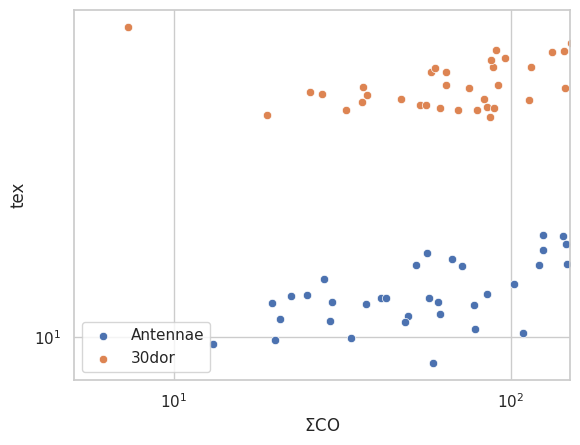

In [608]:
sns.scatterplot(data=antdf, x=((co_lr*antdf['LCO'])/(np.pi*(antdf['R'])**2)), y=antdf['tex'], label='Antennae')
sns.scatterplot(data=antdf, x=(co_lr*df30dor_m['LCO'])/(np.pi*(df30dor_m['R'])**2), y=tex30dor['tex'], label='30dor')
plt.xscale('log')
plt.xlim([0,150])
plt.yscale('log')
plt.xlabel('$\Sigma$CO')

<ipython-input-609-f0402f16d70e>:4: UserWarning: Attempt to set non-positive xlim on a log-scaled axis will be ignored.
  plt.xlim([0,150])


PearsonRResult(statistic=0.7367899363262755, pvalue=0.015066103884365698)

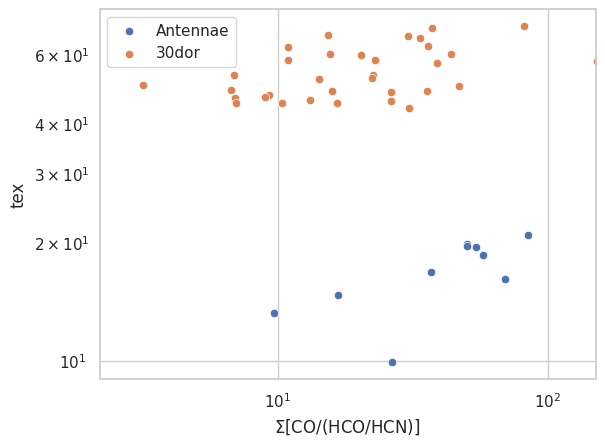

In [609]:
sns.scatterplot(data=antdf, x=((co_lr*antdf['LCO'])/((hco_lr*antdf['LHCO'])/(hcn_lr*antdf['LHCN'])))/(np.pi*(antdf['R'])**2), y=antdf['tex'], label='Antennae')
sns.scatterplot(data=antdf, x=((co_lr*df30dor_m['LCO'])/((df30dor_m['LHCO'])/(df30dor_m['LHCN'])))/(np.pi*(df30dor_m['R'])**2), y=tex30dor['tex'], label='30dor')
plt.xscale('log')
plt.xlim([0,150])
plt.yscale('log')
plt.xlabel('$\Sigma$[CO/(HCO/HCN)]')
pearsonr(((co_lr*ad['LCO'])/((hco_lr*ad['LHCO'])/(hcn_lr*ad['LHCN'])))/(np.pi*(ad['R'])**2),ad['tex'])

<ipython-input-610-4f05c9292baa>:4: UserWarning: Attempt to set non-positive xlim on a log-scaled axis will be ignored.
  plt.xlim([0,150])


Text(0.5, 0, '$\\Sigma$[(HCO/HCN)]')

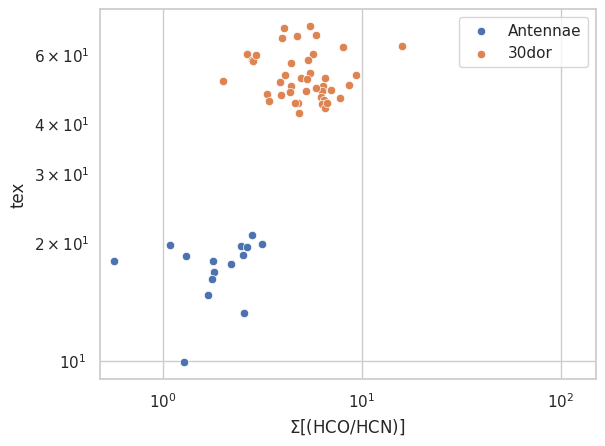

In [610]:
sns.scatterplot(data=antdf, x=((hco_lr*antdf['LHCO'])/(hcn_lr*antdf['LHCN'])), y=antdf['tex'], label='Antennae')
sns.scatterplot(data=antdf, x=((df30dor_m['LHCO'])/(df30dor_m['LHCN'])), y=tex30dor['tex'], label='30dor')
plt.xscale('log')
plt.xlim([0,150])
plt.yscale('log')
plt.xlabel('$\Sigma$[(HCO/HCN)]')

<ipython-input-611-43e593c90670>:4: UserWarning: Attempt to set non-positive xlim on a log-scaled axis will be ignored.
  plt.xlim([0,150])


Text(0.5, 0, '$\\Sigma$[(HCO/HCN)]')

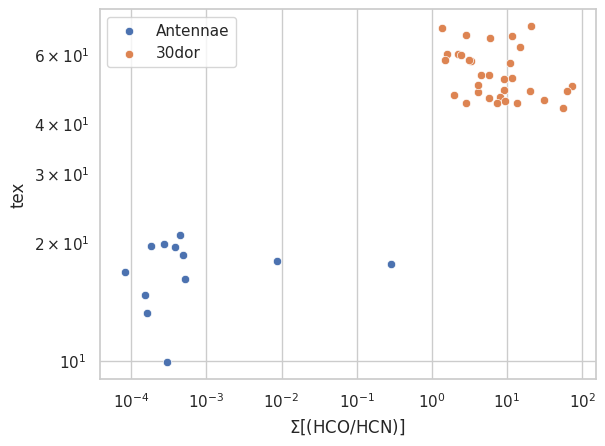

In [611]:
sns.scatterplot(data=antdf, x=((hco_lr*antdf['LHCO'])/(hcn_lr*antdf['LHCN']))/(np.pi*(antdf['R'])**2), y=antdf['tex'], label='Antennae')
sns.scatterplot(data=antdf, x=((df30dor_m['LHCO'])/(df30dor_m['LHCN']))/(np.pi*(df30dor_m['R'])**2), y=tex30dor['tex'], label='30dor')
plt.xscale('log')
plt.xlim([0,150])
plt.yscale('log')
plt.xlabel('$\Sigma$[(HCO/HCN)]')

<ipython-input-612-90a167003247>:3: UserWarning: Attempt to set non-positive xlim on a log-scaled axis will be ignored.
  plt.xlim([0,150])


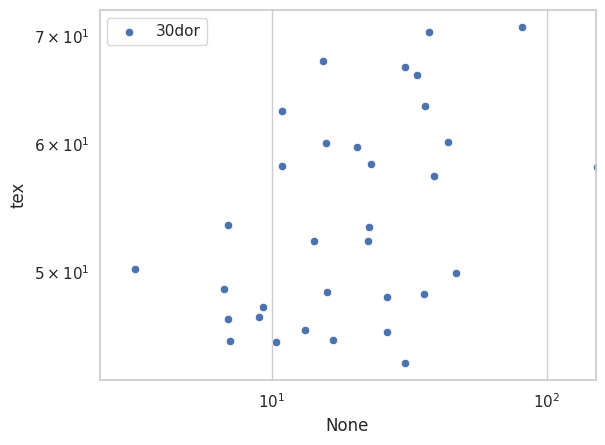

In [612]:
sns.scatterplot(data=antdf, x=((co_lr*df30dor_m['LCO'])/((df30dor_m['LHCO'])/(df30dor_m['LHCN'])))/(np.pi*(df30dor_m['R'])**2), y=tex30dor['tex'], label='30dor')
plt.xscale('log')
plt.xlim([0,150])
plt.yscale('log')

<Axes: xlabel='LCO', ylabel='tex'>

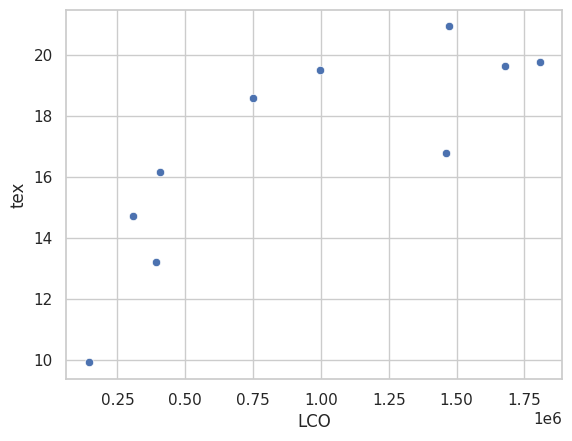

In [613]:
sns.scatterplot(x=(co_lr*ad['LCO']),y=ad['tex'])

In [614]:
print(pearsonr((co_lr*ad['LCO']),ad['tex']))
print(pearsonr((co_lr*ad['LCO'])/((hcn_lr*ad['LHCN'])/(hco_lr*ad['LHCO'])),ad['tex']))
print(pearsonr(((hcn_lr*ad['LHCN'])/(hco_lr*ad['LHCO'])),ad['tex']))
print(pearsonr((co_lr*ad['L13CO'])/((hcn_lr*ad['LHCN'])/(hco_lr*ad['LHCO'])),ad['tex']))




PearsonRResult(statistic=0.804901587721352, pvalue=0.004971887134805023)
PearsonRResult(statistic=0.8142547219734857, pvalue=0.004134416328916122)
PearsonRResult(statistic=-0.8072862686497103, pvalue=0.0047478165310412875)
PearsonRResult(statistic=0.7657403513930798, pvalue=0.009821156095357986)


<Axes: xlabel='HCO/HCN', ylabel='LCO'>

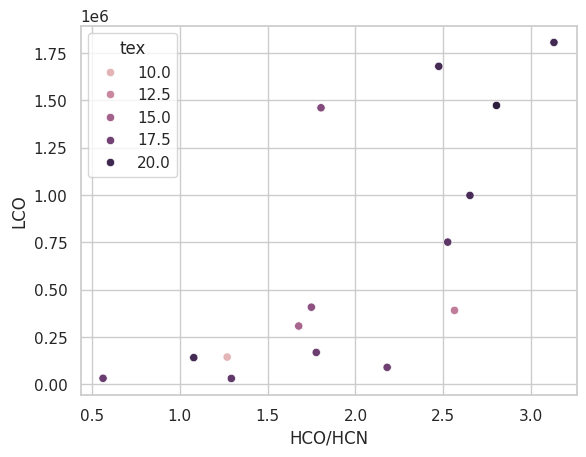

In [615]:
plt.xlabel('HCO/HCN')
sns.scatterplot(data=antdf, x=(hco_lr*antdf['LHCO'])/(hcn_lr*antdf['LHCN']), y=(co_lr*antdf['LCO']), hue=antdf['tex'])

Text(0.5, 0, 'HCO/HCN')

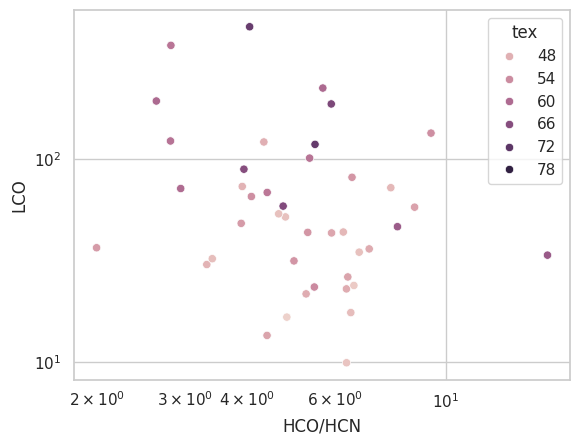

In [616]:
sns.scatterplot(data=df30dor_m, x=(df30dor_m['LHCO'])/(df30dor_m['LHCN']), y=(co_lr*df30dor_m['LCO']), hue=tex30dor['tex'])
plt.xscale('log')
plt.yscale('log')
plt.xlabel('HCO/HCN')


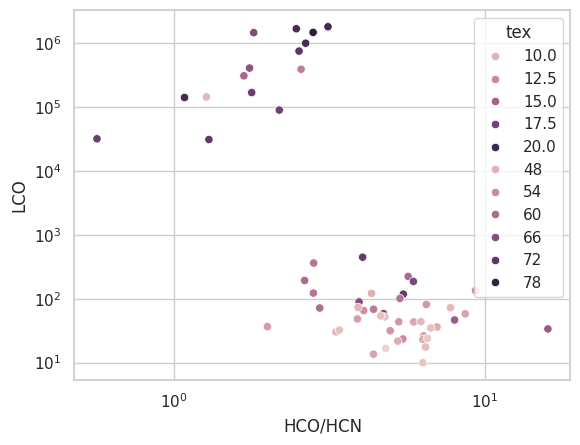

In [617]:
plt.xlabel('HCO/HCN')
sns.scatterplot(data=antdf, x=(hco_lr*antdf['LHCO'])/(hcn_lr*antdf['LHCN']), y=(co_lr*antdf['LCO']), hue=antdf['tex'])
sns.scatterplot(data=df30dor_m, x=(df30dor_m['LHCO'])/(df30dor_m['LHCN']), y=(co_lr*df30dor_m['LCO']), hue=tex30dor['tex'])
plt.xscale('log')
plt.yscale('log')

# 24 um

In [618]:
IR = pd.read_csv('https://github.com/gracekrahm/antennae-dense-gas/blob/main/IR_24_um_props.csv?raw=True')
#casa_regions = pd.read_csv('')
IR['MJy']=IR['lum_mjy_pc2_sum']*np.pi*IR['R']**2
IR

,galaxy,Tmax,lum,lumerr,lum_mjy_pc2_sum,lum_mjy_pc2_mean,lum_mjy_pc2_max,lum_mjy_pc2_median,a,b,R,errR,MJy
0,Antennae,1.195314e-14,3.016318e-08,3.017581e-09,4.375169e-21,6.214728e-24,1.183934e-22,2.742657e-24,597.592583,343.025044,385.325408,117.510992,2.040798e-15
1,Henize2-10,4.055078e-17,1.393394e-10,1.393395e-11,7.216261e-22,1.960195e-26,2.399966e-24,NaN,171.788856,151.474152,137.286835,11.070371,4.272872e-17
2,30Dor,4.828906e-14,9.255678e-11,9.255685e-12,4.871584e-13,2.543669e-18,9.259756e-17,NaN,17.045475,28.397868,18.724471,5.551454,5.365858e-10
3,NGC253,4.505255e-14,8.027237e-09,8.028404e-10,1.817616e-18,2.574527e-21,1.763088e-20,NaN,204.999008,185.806940,166.099750,37.885436,1.575397e-13


Text(0, 0.5, '24um ($MJy\\:pc^{-2}$) sum')

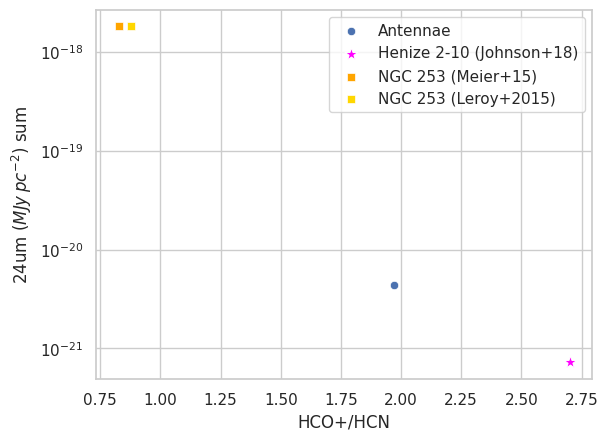

In [619]:
fig, ax = plt.subplots()
#sns.scatterplot(x=np.nanmean(((hco_lr*antdf['LHCO'])/(hcn_lr*antdf['LHCN']))/(antdf['R']**2)), y=[2.65], label='Antennae')
#sns.scatterplot(x=np.nanmean((henizedf['LHCO']/henizedf['LHCN'])/(34.83624752591218**2)), y=[1.26], label='Henize 2-10 (Johnson+18)', color='magenta', marker=m_henize, s=95)
sns.scatterplot(x=np.nanmean(((hco_lr*antdf['LHCO'])/(hcn_lr*antdf['LHCN']))), y=[4.375169e-21	], label='Antennae')
sns.scatterplot(x=np.nanmean((henizedf['LHCO']/henizedf['LHCN'])), y=[7.216261e-22	], label='Henize 2-10 (Johnson+18)', color='magenta', marker=m_henize, s=95)
#sns.scatterplot(x=np.nanmean(dfngc253_dense_gas['LHCO']/dfngc253_dense_gas[' LHCN']), y=[2], label='253')
sns.scatterplot(x=np.nanmean(ngc253df['HCO+(1-0)']/ngc253df['HCN(1-0)']), y=[1.817616e-18], label='NGC 253 (Meier+15)', color='orange',marker=m_253)
sns.scatterplot(x=np.nanmean(1/ngc253leroydf['HCN/HCO+']), y=[1.817616e-18	], label='NGC 253 (Leroy+2015)', color='gold', marker=m_253)
'''sns.scatterplot(x=np.nanmean(df30dor_m['LHCO']/df30dor_m['LHCN']), y=[4.871584e-13], label='30Dor Clumps', color='lawngreen', marker='^', s=55)
sns.scatterplot(x=df30dor_clump_sum['LHCO']/df30dor_clump_sum['LHCN'], y=[4.871584e-13], label='30Dor Clump Sum',color='limegreen', marker='^', s=55)
sns.scatterplot(x=df30dor['LHCO']/df30dor['LHCN'], y=[4.871584e-13	], label='30Dor All Emission', s=55, color='darkgreen',marker='^')
'''
plt.xlabel('HCO+/HCN')
plt.yscale('log')
plt.ylabel('24um ($MJy\:pc^{-2}$) sum')

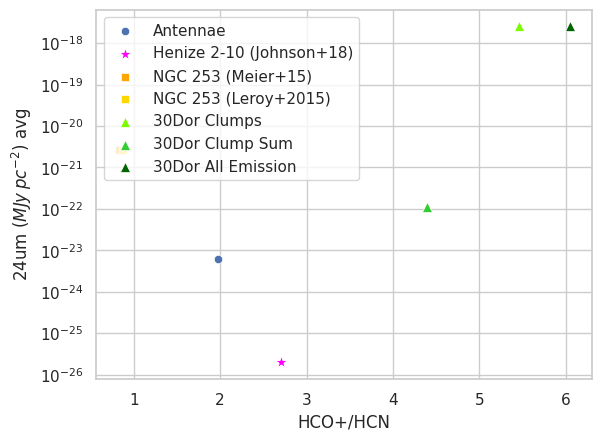

In [620]:
fig, ax = plt.subplots()
#sns.scatterplot(x=np.nanmean(((hco_lr*antdf['LHCO'])/(hcn_lr*antdf['LHCN']))/(antdf['R']**2)), y=[2.65], label='Antennae')
#sns.scatterplot(x=np.nanmean((henizedf['LHCO']/henizedf['LHCN'])/(34.83624752591218**2)), y=[1.26], label='Henize 2-10 (Johnson+18)', color='magenta', marker=m_henize, s=95)
sns.scatterplot(x=np.nanmean(((hco_lr*antdf['LHCO'])/(hcn_lr*antdf['LHCN']))), y=[6.214728e-24], label='Antennae')
sns.scatterplot(x=np.nanmean((henizedf['LHCO']/henizedf['LHCN'])), y=[1.960195e-26	], label='Henize 2-10 (Johnson+18)', color='magenta', marker=m_henize, s=95)
#sns.scatterplot(x=np.nanmean(dfngc253_dense_gas['LHCO']/dfngc253_dense_gas[' LHCN']), y=[2], label='253')
sns.scatterplot(x=np.nanmean(ngc253df['HCO+(1-0)']/ngc253df['HCN(1-0)']), y=[2.574527e-21], label='NGC 253 (Meier+15)', color='orange',marker=m_253)
sns.scatterplot(x=np.nanmean(1/ngc253leroydf['HCN/HCO+']), y=[2.574527e-21], label='NGC 253 (Leroy+2015)', color='gold', marker=m_253)

sns.scatterplot(x=np.nanmean(df30dor_m['LHCO']/df30dor_m['LHCN']), y=[2.543669e-18], label='30Dor Clumps', color='lawngreen', marker='^', s=55)
sns.scatterplot(x=df30dor_clump_sum['LHCO']/df30dor_clump_sum['LHCN'], y=[1.1331535822652821e-22], label='30Dor Clump Sum',color='limegreen', marker='^', s=55)
sns.scatterplot(x=df30dor['LHCO']/df30dor['LHCN'], y=[2.543669e-18], label='30Dor All Emission', s=55, color='darkgreen',marker='^')

plt.xlabel('HCO+/HCN')
plt.yscale('log')
plt.ylabel('24um ($MJy\:pc^{-2}$) avg')
plt.legend(loc='upper left')

In [621]:
IR['MJy']

,MJy
0,2.040798e-15
1,4.272872e-17
2,5.365858e-10
3,1.575397e-13


Text(0, 0.5, '24um MJy')

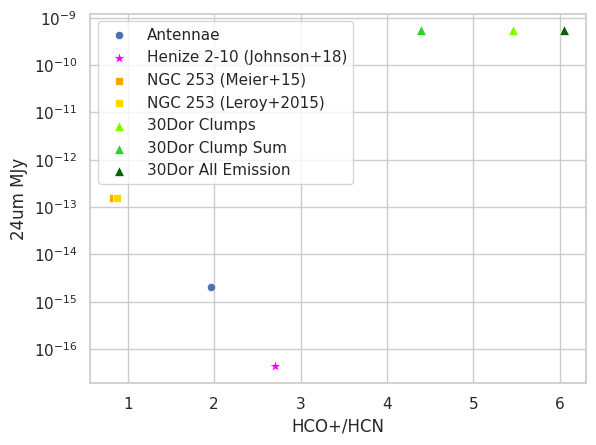

In [622]:
fig, ax = plt.subplots()
sns.scatterplot(x=np.nanmean(((hco_lr*antdf['LHCO'])/(hcn_lr*antdf['LHCN']))), y=[2.040798e-15], label='Antennae')
sns.scatterplot(x=np.nanmean((henizedf['LHCO']/henizedf['LHCN'])), y=[4.272872e-17], label='Henize 2-10 (Johnson+18)', color='magenta', marker=m_henize, s=95)
sns.scatterplot(x=np.nanmean(ngc253df['HCO+(1-0)']/ngc253df['HCN(1-0)']), y=[1.575397e-13], label='NGC 253 (Meier+15)', color='orange',marker=m_253)
sns.scatterplot(x=np.nanmean(1/ngc253leroydf['HCN/HCO+']), y=[1.575397e-13], label='NGC 253 (Leroy+2015)', color='gold', marker=m_253)
sns.scatterplot(x=np.nanmean(df30dor_m['LHCO']/df30dor_m['LHCN']), y=[5.365858e-10], label='30Dor Clumps', color='lawngreen', marker='^', s=55)
sns.scatterplot(x=df30dor_clump_sum['LHCO']/df30dor_clump_sum['LHCN'], y=[5.365858e-10], label='30Dor Clump Sum',color='limegreen', marker='^', s=55)
sns.scatterplot(x=df30dor['LHCO']/df30dor['LHCN'], y=[5.365858e-10], label='30Dor All Emission', s=55, color='darkgreen',marker='^')

plt.xlabel('HCO+/HCN')
plt.yscale('log')
plt.ylabel('24um MJy')

Text(0, 0.5, '24um ($MJy\\:pc^{-2}$) avg')

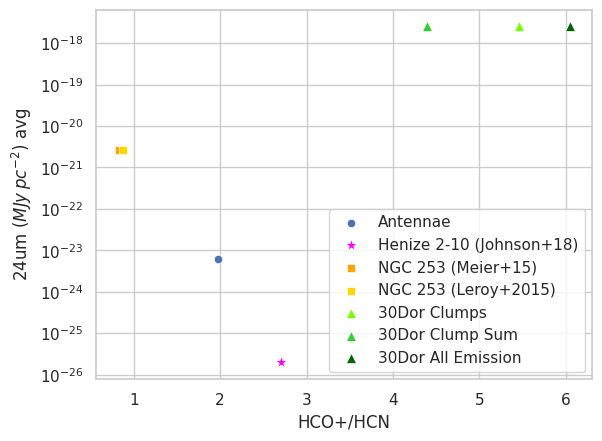

In [623]:
fig, ax = plt.subplots()
#sns.scatterplot(x=np.nanmean(((hco_lr*antdf['LHCO'])/(hcn_lr*antdf['LHCN']))/(antdf['R']**2)), y=[2.65], label='Antennae')
#sns.scatterplot(x=np.nanmean((henizedf['LHCO']/henizedf['LHCN'])/(34.83624752591218**2)), y=[1.26], label='Henize 2-10 (Johnson+18)', color='magenta', marker=m_henize, s=95)
sns.scatterplot(x=np.nanmean(((hco_lr*antdf['LHCO'])/(hcn_lr*antdf['LHCN']))), y=[6.214728e-24], label='Antennae')
sns.scatterplot(x=np.nanmean((henizedf['LHCO']/henizedf['LHCN'])), y=[1.960195e-26	], label='Henize 2-10 (Johnson+18)', color='magenta', marker=m_henize, s=95)
#sns.scatterplot(x=np.nanmean(dfngc253_dense_gas['LHCO']/dfngc253_dense_gas[' LHCN']), y=[2], label='253')
sns.scatterplot(x=np.nanmean(ngc253df['HCO+(1-0)']/ngc253df['HCN(1-0)']), y=[2.574527e-21], label='NGC 253 (Meier+15)', color='orange',marker=m_253)
sns.scatterplot(x=np.nanmean(1/ngc253leroydf['HCN/HCO+']), y=[2.574527e-21], label='NGC 253 (Leroy+2015)', color='gold', marker=m_253)

sns.scatterplot(x=np.nanmean(df30dor_m['LHCO']/df30dor_m['LHCN']), y=[2.543669e-18], label='30Dor Clumps', color='lawngreen', marker='^', s=55)
sns.scatterplot(x=df30dor_clump_sum['LHCO']/df30dor_clump_sum['LHCN'], y=[2.543669e-18], label='30Dor Clump Sum',color='limegreen', marker='^', s=55)
sns.scatterplot(x=df30dor['LHCO']/df30dor['LHCN'], y=[2.543669e-18], label='30Dor All Emission', s=55, color='darkgreen',marker='^')

plt.xlabel('HCO+/HCN')
plt.yscale('log')
plt.ylabel('24um ($MJy\:pc^{-2}$) avg')

# casa

In [624]:
CR = pd.read_csv('https://github.com/gracekrahm/antennae-dense-gas/blob/0edc94c9e9f0601ed929a03af4119a276c47a3cb/casa_regions.csv?raw=True')
CR

,Galaxy,BUNIT,Npts,Sum,Mean,rms,CDELT2,D_Gal
0,NGC253,Hz.MJy.sr-1,42,3.306750e+07,787321.4000,1.057240e+06,2.450002,3500000
1,30Dor,Hz.MJy.sr-1,5105,2.480405e+09,485877.6000,8.426044e+05,2.490001,50000
2,Henize_2_10,MJy.sr-1,92,3.470271e+04,377.2034,6.286085e+02,2.450002,9000000
3,Antennae,Hz.MJy.sr-1,214,1.914630e+07,89468.7100,1.397410e+05,2.450002,22000000


In [625]:
CR['pc area'] = ((CR['Npts']*CR['CDELT2']**2)/206265)*CR['D_Gal']
CR['sr area'] = (CR['Npts']*CR['CDELT2']**2)*(4.25*10**10)
CR

,Galaxy,BUNIT,Npts,Sum,Mean,rms,CDELT2,D_Gal,pc area,sr area
0,NGC253,Hz.MJy.sr-1,42,3.306750e+07,787321.4000,1.057240e+06,2.450002,3500000,4277.839949,1.071448e+13
1,30Dor,Hz.MJy.sr-1,5105,2.480405e+09,485877.6000,8.426044e+05,2.490001,50000,7672.542847,1.345190e+15
2,Henize_2_10,MJy.sr-1,92,3.470271e+04,377.2034,6.286085e+02,2.450002,9000000,24095.596026,2.346981e+13
3,Antennae,Hz.MJy.sr-1,214,1.914630e+07,89468.7100,1.397410e+05,2.450002,22000000,137007.281462,5.459281e+13


In [626]:
fdlist_sum = []
lumlist_sum = []
fdlist_mean = []
lumlist_mean = []
fd_mjr_sr = []
pc2_to_cm2 = 9.52099999999999938e+36
for row in CR.iterrows():
  if row[1]['BUNIT']=='Hz.MJy.sr-1':
    '''row[1]['Sum units'] = (row[1]['Sum']*u.Hz*u.MJy/u.sr).to(u.MJy/u.sr,equivalencies=u.spectral_density(24*u.micron))
    row[1]['Mean units'] = (row[1]['Mean']*u.Hz*u.MJy/u.sr).to(u.MJy/u.sr,equivalencies=u.spectral_density(24*u.micron))'''
    row[1]['Sum units'] = row[1]['Sum']*u.Hz*u.MJy/u.sr
    row[1]['Mean units'] = row[1]['Mean']*u.Hz*u.MJy/u.sr
    row[1]['Sum Mjy/sr'] = (row[1]['Mean']*u.Hz*u.MJy/u.sr).to(u.MJy/u.sr, equivalencies=u.spectral_density(5.3*u.micron))

  else:
    print(row[1]['Galaxy'],'channel width 5.3 micron')
    row[1]['Sum units'] =( row[1]['Sum']*u.MJy/u.sr).to(u.Hz*u.MJy/u.sr,equivalencies=u.spectral_density(5.3*u.micron))
    row[1]['Mean units'] = (row[1]['Mean']*u.MJy/u.sr).to(u.Hz*u.MJy/u.sr,equivalencies=u.spectral_density(5.3 *u.micron))
    row[1]['Sum Mjy/sr'] = (row[1]['Mean']*u.MJy/u.sr)
  row[1]['Sum units'] = row[1]['Sum units'].value
  row[1]['Mean units'] = row[1]['Mean units'].value
  fd_sum = row[1]['Sum units']*1E6*(1E-23)*row[1]['sr area']
  fd_mean = row[1]['Sum units']*1E6*(1E-23)*row[1]['sr area']
  lum_sum = fd_sum*4*np.pi*(row[1]['D_Gal']*pc2_to_cm2)
  lum_mean = fd_sum*4*np.pi*(row[1]['D_Gal']*pc2_to_cm2)
  fdlist_sum.append(fd_sum)
  lumlist_sum.append(lum_sum)
  fdlist_mean.append(fd_mean)
  lumlist_mean.append(lum_mean)
  fd_mjr_sr.append(row[1]['Sum Mjy/sr'])


#MJy/sr * 1e6 * 1e-23 * source_area_in_sr * filter_width_in_Hz -> erg/s/cm2 flux
#Then times 4 pi d**2 for luminosity in erg/s

Henize_2_10 channel width 5.3 micron


In [627]:
CR['FD Sum'] = fdlist_sum
CR['Lum sum']=[x/3.846E33 for x in lumlist_sum]
CR['FD Mean'] = fdlist_mean
CR['Lum Mean']=[x/3.846E33 for x in lumlist_mean]
CR['Sum Jy/sr'] = [x*10**(-6) for x in fd_mjr_sr]

CR

,Galaxy,BUNIT,Npts,Sum,Mean,rms,CDELT2,D_Gal,pc area,sr area,FD Sum,Lum sum,FD Mean,Lum Mean,Sum Jy/sr
0,NGC253,Hz.MJy.sr-1,42,3.306750e+07,787321.4000,1.057240e+06,2.450002,3500000,4277.839949,1.071448e+13,3.543010e+03,3.857656e+14,3.543010e+03,3.857656e+14,1.3918973972320544e-14 MJy / sr
1,30Dor,Hz.MJy.sr-1,5105,2.480405e+09,485877.6000,8.426044e+05,2.490001,50000,7672.542847,1.345190e+15,3.336617e+07,5.189907e+16,3.336617e+07,5.189907e+16,8.589780067115632e-15 MJy / sr
2,Henize_2_10,MJy.sr-1,92,3.470271e+04,377.2034,6.286085e+02,2.450002,9000000,24095.596026,2.346981e+13,4.606996e+14,1.289863e+26,4.606996e+14,1.289863e+26,0.0003772034 MJy / sr
3,Antennae,Hz.MJy.sr-1,214,1.914630e+07,89468.7100,1.397410e+05,2.450002,22000000,137007.281462,5.459281e+13,1.045250e+04,7.153624e+15,1.045250e+04,7.153624e+15,1.5817081128838806e-15 MJy / sr


(0.5663458279098321, 10.0)

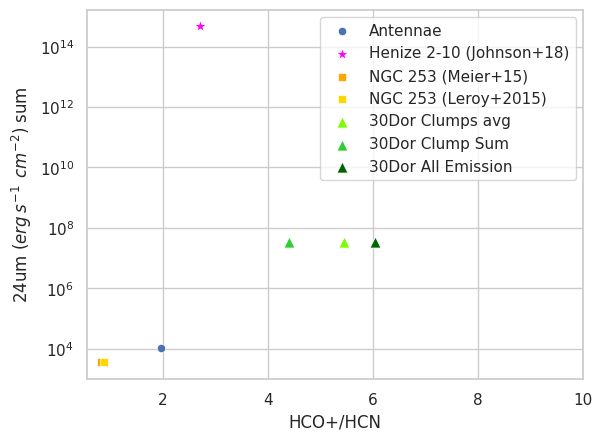

In [628]:
fig, ax = plt.subplots()
sns.scatterplot(x=np.nanmean(((hco_lr*antdf['LHCO'])/(hcn_lr*antdf['LHCN']))), y=[1.045250e+04], label='Antennae')
sns.scatterplot(x=np.nanmean((henizedf['LHCO']/henizedf['LHCN'])), y=[4.606996e+14], label='Henize 2-10 (Johnson+18)', color='magenta', marker=m_henize, s=95)
sns.scatterplot(x=np.nanmean(ngc253df['HCO+(1-0)']/ngc253df['HCN(1-0)']), y=[3.543010e+03], label='NGC 253 (Meier+15)', color='orange',marker=m_253)
sns.scatterplot(x=np.nanmean(1/ngc253leroydf['HCN/HCO+']), y=[3.543010e+03], label='NGC 253 (Leroy+2015)', color='gold', marker=m_253)

#sns.scatterplot(x=df30dor_m['LHCO']/df30dor_m['LHCN'], y=[	3.336617e+07]*len(df30dor_m['LHCO']), label='30Dor clumps', s=20, color='green',marker='^')
sns.scatterplot(x=np.nanmean(df30dor_m['LHCO']/df30dor_m['LHCN']), y=[	3.336617e+07], label='30Dor Clumps avg', color='lawngreen', marker='^', s=65)
sns.scatterplot(x=df30dor_clump_sum['LHCO']/df30dor_clump_sum['LHCN'], y=[	3.336617e+07], label='30Dor Clump Sum',color='limegreen', marker='^', s=65)
sns.scatterplot(x=df30dor['LHCO']/df30dor['LHCN'], y=[	3.336617e+07], label='30Dor All Emission', s=65, color='darkgreen',marker='^')

plt.xlabel('HCO+/HCN')
plt.yscale('log')
plt.ylabel('24um ($erg\:s^{-1}\:\:cm^{-2}$) sum')
plt.xlim(right=10)

(-0.2560657820167527, 10.0)

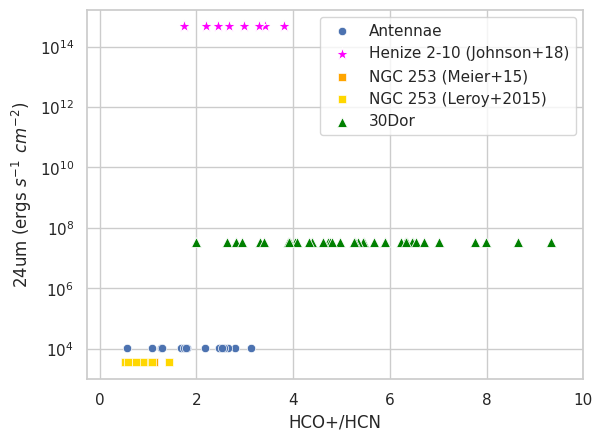

In [629]:
fig, ax = plt.subplots()
sns.scatterplot(x=(((hco_lr*antdf['LHCO'])/(hcn_lr*antdf['LHCN']))), y=[1.045250e+04]*len(antdf), label='Antennae')
sns.scatterplot(x=((henizedf['LHCO']/henizedf['LHCN'])), y=[4.606996e+14]*len(henizedf), label='Henize 2-10 (Johnson+18)', color='magenta', marker=m_henize, s=95)
sns.scatterplot(x=(ngc253df['HCO+(1-0)']/ngc253df['HCN(1-0)']), y=[3.543010e+03]*len(ngc253df), label='NGC 253 (Meier+15)', color='orange',marker=m_253)
sns.scatterplot(x=1/ngc253leroydf['HCN/HCO+'], y=[3.543010e+03]*len(ngc253leroydf), label='NGC 253 (Leroy+2015)', color='gold', marker=m_253)

sns.scatterplot(x=df30dor_m['LHCO']/df30dor_m['LHCN'], y=[	3.336617e+07]*len(df30dor_m['LHCO']), label='30Dor', s=50, color='green',marker='^')

plt.xlabel('HCO+/HCN')
plt.yscale('log')
plt.ylabel('24um (ergs $s^{-1}\:\:cm^{-2}$)')
plt.xlim(right=10)

Text(0, 0.5, '24um (ergs $s^{-1}\\:\\:cm^{-2}$)')

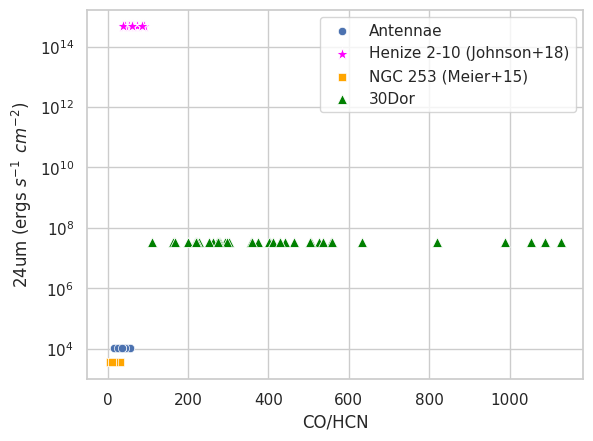

In [630]:
fig, ax = plt.subplots()
sns.scatterplot(x=(((co_lr*antdf['LCO'])/(hcn_lr*antdf['LHCN']))), y=[1.045250e+04]*len(antdf), label='Antennae')
sns.scatterplot(x=((co_lr*henizedf['LCO']/henizedf['LHCN'])), y=[4.606996e+14]*len(henizedf), label='Henize 2-10 (Johnson+18)', color='magenta', marker=m_henize, s=95)
sns.scatterplot(x=(ngc253df['CO(1-0)']/ngc253df['HCN(1-0)']), y=[3.543010e+03]*len(ngc253df), label='NGC 253 (Meier+15)', color='orange',marker=m_253)

sns.scatterplot(x=co_lr*df30dor_m['LCO']/df30dor_m['LHCN'], y=[	3.336617e+07]*len(df30dor_m['LHCO']), label='30Dor', s=50, color='green',marker='^')

plt.xlabel('CO/HCN')
plt.yscale('log')
plt.ylabel('24um (ergs $s^{-1}\:\:cm^{-2}$)')
#plt.xlim(right=10)

(-41.11690003945454, 300.0)

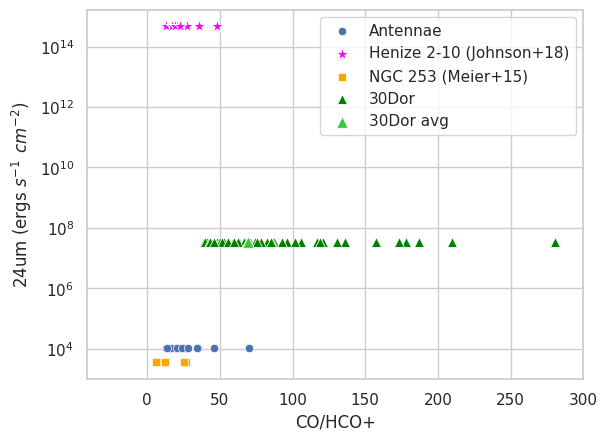

In [631]:
fig, ax = plt.subplots()
sns.scatterplot(x=(((co_lr*antdf['LCO'])/(hco_lr*antdf['LHCO']))), y=[1.045250e+04]*len(antdf), label='Antennae')
sns.scatterplot(x=((co_lr*henizedf['LCO']/henizedf['LHCO'])), y=[4.606996e+14]*len(henizedf), label='Henize 2-10 (Johnson+18)', color='magenta', marker=m_henize, s=95)
sns.scatterplot(x=(ngc253df['CO(1-0)']/ngc253df['HCO+(1-0)']), y=[3.543010e+03]*len(ngc253df), label='NGC 253 (Meier+15)', color='orange',marker=m_253)

sns.scatterplot(x=co_lr*df30dor_m['LCO']/df30dor_m['LHCO'], y=[	3.336617e+07]*len(df30dor_m['LHCO']), label='30Dor', s=50, color='green',marker='^')
sns.scatterplot(x=np.nanmedian(co_lr*df30dor_m['LCO']/df30dor_m['LHCO']), y=[	3.336617e+07], label='30Dor avg', s=70, color='limegreen',marker='^')

plt.xlabel('CO/HCO+')
plt.yscale('log')
plt.ylabel('24um (ergs $s^{-1}\:\:cm^{-2}$)')
plt.xlim(right=300)

mjy/sr

In [632]:
ant_sum_mean = (2.597328e+07, 4.189239e+04 )
ngc253_sum_mean = (1.586130e+07, 8.348054e+05 )
CR


,Galaxy,BUNIT,Npts,Sum,Mean,rms,CDELT2,D_Gal,pc area,sr area,FD Sum,Lum sum,FD Mean,Lum Mean,Sum Jy/sr
0,NGC253,Hz.MJy.sr-1,42,3.306750e+07,787321.4000,1.057240e+06,2.450002,3500000,4277.839949,1.071448e+13,3.543010e+03,3.857656e+14,3.543010e+03,3.857656e+14,1.3918973972320544e-14 MJy / sr
1,30Dor,Hz.MJy.sr-1,5105,2.480405e+09,485877.6000,8.426044e+05,2.490001,50000,7672.542847,1.345190e+15,3.336617e+07,5.189907e+16,3.336617e+07,5.189907e+16,8.589780067115632e-15 MJy / sr
2,Henize_2_10,MJy.sr-1,92,3.470271e+04,377.2034,6.286085e+02,2.450002,9000000,24095.596026,2.346981e+13,4.606996e+14,1.289863e+26,4.606996e+14,1.289863e+26,0.0003772034 MJy / sr
3,Antennae,Hz.MJy.sr-1,214,1.914630e+07,89468.7100,1.397410e+05,2.450002,22000000,137007.281462,5.459281e+13,1.045250e+04,7.153624e+15,1.045250e+04,7.153624e+15,1.5817081128838806e-15 MJy / sr


(-0.2560657820167527, 10.0)

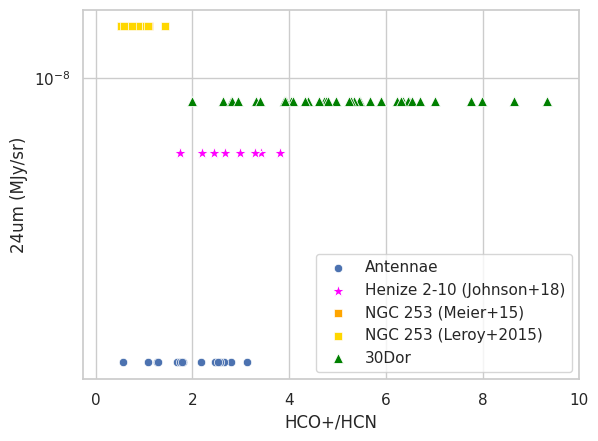

In [633]:
sns.scatterplot(x=(((hco_lr*antdf['LHCO'])/(hcn_lr*antdf['LHCN']))), y=[1.5817081128838806e-09]*len(antdf), label='Antennae')
sns.scatterplot(x=((henizedf['LHCO']/henizedf['LHCN'])), y=[(347027.1)/(56564614716981)]*len(henizedf), label='Henize 2-10 (Johnson+18)', color='magenta', marker=m_henize, s=95)
sns.scatterplot(x=(ngc253df['HCO+(1-0)']/ngc253df['HCN(1-0)']), y=[1.3918973972320545e-08]*len(ngc253df), label='NGC 253 (Meier+15)', color='orange',marker=m_253)
sns.scatterplot(x=1/ngc253leroydf['HCN/HCO+'], y=[1.3918973972320545e-08]*len(ngc253leroydf), label='NGC 253 (Leroy+2015)', color='gold', marker=m_253)

sns.scatterplot(x=df30dor_m['LHCO']/df30dor_m['LHCN'], y=[8.589780067115632e-09]*len(df30dor_m['LHCO']), label='30Dor', s=50, color='green',marker='^')

plt.xlabel('HCO+/HCN')
plt.yscale('log')
plt.ylabel('24um (MJy/sr)')
plt.xlim(right=10)

better regions


(-0.2560657820167527, 10.0)

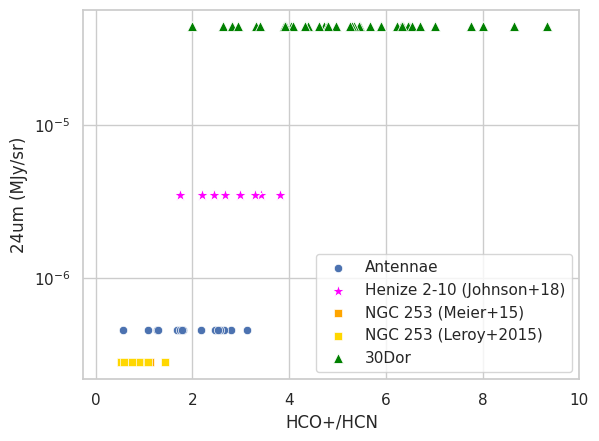

In [634]:
sns.scatterplot(x=(((hco_lr*antdf['LHCO'])/(hcn_lr*antdf['LHCN']))), y=[2.597328e+07/56564614716981]*len(antdf), label='Antennae')
sns.scatterplot(x=((henizedf['LHCO']/henizedf['LHCN'])), y=[(3.470271e+04/1E10)]*len(henizedf), label='Henize 2-10 (Johnson+18)', color='magenta', marker=m_henize, s=95)
sns.scatterplot(x=(ngc253df['HCO+(1-0)']/ngc253df['HCN(1-0)']), y=[1.586130e+07/56564614716981]*len(ngc253df), label='NGC 253 (Meier+15)', color='orange',marker=m_253)
sns.scatterplot(x=1/ngc253leroydf['HCN/HCO+'], y=[1.586130e+07/56564614716981]*len(ngc253leroydf), label='NGC 253 (Leroy+2015)', color='gold', marker=m_253)

sns.scatterplot(x=df30dor_m['LHCO']/df30dor_m['LHCN'], y=[2.480405e+09/56564614716981]*len(df30dor_m['LHCO']), label='30Dor', s=50, color='green',marker='^')

plt.xlabel('HCO+/HCN')
plt.yscale('log')
plt.ylabel('24um (MJy/sr)')
plt.xlim(right=10) #sum

(-0.2560657820167527, 10.0)

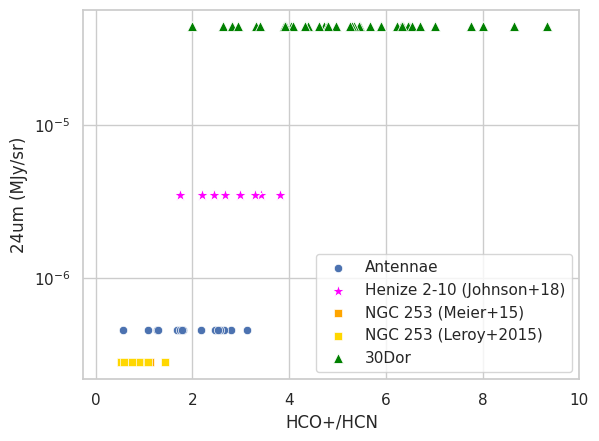

In [635]:
sns.scatterplot(x=(((hco_lr*antdf['LHCO'])/(hcn_lr*antdf['LHCN']))), y=[2.597328e+07/56564614716981]*len(antdf), label='Antennae')
sns.scatterplot(x=((henizedf['LHCO']/henizedf['LHCN'])), y=[(3.470271e+04/1E10)]*len(henizedf), label='Henize 2-10 (Johnson+18)', color='magenta', marker=m_henize, s=95)
sns.scatterplot(x=(ngc253df['HCO+(1-0)']/ngc253df['HCN(1-0)']), y=[1.586130e+07/56564614716981]*len(ngc253df), label='NGC 253 (Meier+15)', color='orange',marker=m_253)
sns.scatterplot(x=1/ngc253leroydf['HCN/HCO+'], y=[1.586130e+07/56564614716981]*len(ngc253leroydf), label='NGC 253 (Leroy+2015)', color='gold', marker=m_253)

sns.scatterplot(x=df30dor_m['LHCO']/df30dor_m['LHCN'], y=[2.480405e+09/56564614716981]*len(df30dor_m['LHCO']), label='30Dor', s=50, color='green',marker='^')

plt.xlabel('HCO+/HCN')
plt.yscale('log')
plt.ylabel('24um (MJy/sr)')
plt.xlim(right=10) #sum

In [636]:
'''df1 = pd.DataFrame(np.random.randn(5,5), columns=list(range(1,6))).assign(Trial=1)
df2 = pd.DataFrame(np.random.randn(5,5), columns=list(range(1,6))).assign(Trial=2)
df3 = pd.DataFrame(np.random.randn(5,5), columns=list(range(1,6))).assign(Trial=3)

cdf = pd.concat([df1, df2, df3])                                # CONCATENATE
mdf = pd.melt(cdf, id_vars=['Trial'], var_name=['Number'])
     # MELT

print(mdf)
#    Trial Number     value
# 0      1      1 -0.750615
# 1      1      1 -1.715070
# 2      1      1 -0.963404
# 3      1      1  0.360856
# 4      1      1 -1.190504
ax = sns.boxplot(x="Trial", y="value", hue="Number", data=mdf)
ax = sns.boxplot(x="Trial", y="value", data=mdf)

df1'''

'df1 = pd.DataFrame(np.random.randn(5,5), columns=list(range(1,6))).assign(Trial=1)\ndf2 = pd.DataFrame(np.random.randn(5,5), columns=list(range(1,6))).assign(Trial=2)\ndf3 = pd.DataFrame(np.random.randn(5,5), columns=list(range(1,6))).assign(Trial=3)\n\ncdf = pd.concat([df1, df2, df3])                                # CONCATENATE\nmdf = pd.melt(cdf, id_vars=[\'Trial\'], var_name=[\'Number\'])\n     # MELT\n\nprint(mdf)\n#    Trial Number     value\n# 0      1      1 -0.750615\n# 1      1      1 -1.715070\n# 2      1      1 -0.963404\n# 3      1      1  0.360856\n# 4      1      1 -1.190504\nax = sns.boxplot(x="Trial", y="value", hue="Number", data=mdf)\nax = sns.boxplot(x="Trial", y="value", data=mdf)\n\ndf1'

In [637]:
'''dfan = pd.DataFrame({'galaxy':['ant']*len(antdf),'HCO/HCN':(((hco_lr*antdf['LHCO'])/(hcn_lr*antdf['LHCN']))),'HCO/CO':(((hco_lr*antdf['LHCO'])/(co_lr*antdf['LCO']))),'HCN/CO':(((hcn_lr*antdf['LHCN'])/(co_lr*antdf['LCO']))),'24um':np.random.normal(0,8.391244E4/56564614716981,len(antdf))+(2.597328e+07/56564614716981)})
dfhe = pd.DataFrame({'galaxy':['hen']*len(henizedf),'HCO/HCN':((henizedf['LHCO']/henizedf['LHCN'])),'HCO/CO':(((henizedf['LHCO'])/(co_lr*henizedf['LCO']))),'HCN/CO':(((henizedf['LHCN'])/(co_lr*henizedf['LCO']))),'24um':np.random.normal(0,5.397496e+02/1E10,len(henizedf))+(3.470271e+04/1E10)})
dfn2 = pd.DataFrame({'galaxy':['ngc253']*len(ngc253df),'HCO/HCN':(ngc253df['HCO+(1-0)']/ngc253df['HCN(1-0)']),'HCO/CO':(ngc253df['HCO+(1-0)']/ngc253df['CO(1-0)']),'HCN/CO':(ngc253df['HCN(1-0)']/ngc253df['CO(1-0)']),'24um':np.random.normal(0,1.057240e+06/56564614716981,len(ngc253df))+(1.586130e+07/56564614716981)})
df3d = pd.DataFrame({'galaxy':['30dor']*len(df30dor_m),'HCO/HCN':df30dor_m['LHCO']/df30dor_m['LHCN'],'HCO/CO':df30dor_m['LHCO']/(co_lr*df30dor_m['LCO']),'HCN/CO':df30dor_m['LHCN']/(co_lr*df30dor_m['LCO']),'24um':np.random.normal(0,8.426044e+05/56564614716981,len(df30dor_m))+(2.480405e+09/56564614716981)})

condf = pd.concat([dfan[['galaxy','HCO/HCN','24um']],dfhe[['galaxy','HCO/HCN','24um']],dfn2[['galaxy','HCO/HCN','24um']],df3d[['galaxy','HCO/HCN','24um']]])
#meltdf = pd.melt(condf,id_vars=['galaxy'],value_vars=[['24um','HCO/HCN']])
#print(meltdf)

#ax = sns.boxplot(x="HCO/HCN", y="24um", hue="galaxy", data=meltdf)
df3d'''

'dfan = pd.DataFrame({\'galaxy\':[\'ant\']*len(antdf),\'HCO/HCN\':(((hco_lr*antdf[\'LHCO\'])/(hcn_lr*antdf[\'LHCN\']))),\'HCO/CO\':(((hco_lr*antdf[\'LHCO\'])/(co_lr*antdf[\'LCO\']))),\'HCN/CO\':(((hcn_lr*antdf[\'LHCN\'])/(co_lr*antdf[\'LCO\']))),\'24um\':np.random.normal(0,8.391244E4/56564614716981,len(antdf))+(2.597328e+07/56564614716981)})\ndfhe = pd.DataFrame({\'galaxy\':[\'hen\']*len(henizedf),\'HCO/HCN\':((henizedf[\'LHCO\']/henizedf[\'LHCN\'])),\'HCO/CO\':(((henizedf[\'LHCO\'])/(co_lr*henizedf[\'LCO\']))),\'HCN/CO\':(((henizedf[\'LHCN\'])/(co_lr*henizedf[\'LCO\']))),\'24um\':np.random.normal(0,5.397496e+02/1E10,len(henizedf))+(3.470271e+04/1E10)})\ndfn2 = pd.DataFrame({\'galaxy\':[\'ngc253\']*len(ngc253df),\'HCO/HCN\':(ngc253df[\'HCO+(1-0)\']/ngc253df[\'HCN(1-0)\']),\'HCO/CO\':(ngc253df[\'HCO+(1-0)\']/ngc253df[\'CO(1-0)\']),\'HCN/CO\':(ngc253df[\'HCN(1-0)\']/ngc253df[\'CO(1-0)\']),\'24um\':np.random.normal(0,1.057240e+06/56564614716981,len(ngc253df))+(1.586130e+07/56564614716981)

In [638]:
'''sns.scatterplot(x=(((hco_lr*antdf['LHCO'])/(hcn_lr*antdf['LHCN']))), y=[2.597328e+07/56564614716981]*len(antdf), label='Antennae')
sns.scatterplot(x=((henizedf['LHCO']/henizedf['LHCN'])), y=[(3.470271e+04/1E10)]*len(henizedf), label='Henize 2-10 (Johnson+18)', color='magenta', marker=m_henize, s=95)
sns.scatterplot(x=(ngc253df['HCO+(1-0)']/ngc253df['HCN(1-0)']), y=[1.586130e+07/56564614716981]*len(ngc253df), label='NGC 253 (Meier+15)', color='orange',marker=m_253)
sns.scatterplot(x=1/ngc253leroydf['HCN/HCO+'], y=[1.586130e+07/56564614716981]*len(ngc253leroydf), label='NGC 253 (Leroy+2015)', color='gold', marker=m_253)

sns.scatterplot(x=df30dor_m['LHCO']/df30dor_m['LHCN'], y=[2.480405e+09/56564614716981]*len(df30dor_m['LHCO']), label='30Dor', s=50, color='green',marker='^')
'''
'''antnoise = np.random.normal(0,8.391244E4,len(antdf))
antnoise = np.array(antnoise)+(2.597328e+07/56564614716981)
print(antnoise)
sns.boxplot(x=(((hco_lr*antdf['LHCO'])/(hcn_lr*antdf['LHCN']))), orient='h', y=2.597328e+07/56564614716981)#, width=(8.391244E4/2.597328E7))
sns.boxplot(x=((henizedf['LHCO']/henizedf['LHCN'])), y=(3.470271e+04/1E10), color='magenta')
plt.xlabel('HCO+/HCN')
plt.ylabel('24um (MJy/sr)')
#plt.ylim([10**(-10),10**(-5)])'''

"antnoise = np.random.normal(0,8.391244E4,len(antdf))\nantnoise = np.array(antnoise)+(2.597328e+07/56564614716981)\nprint(antnoise)\nsns.boxplot(x=(((hco_lr*antdf['LHCO'])/(hcn_lr*antdf['LHCN']))), orient='h', y=2.597328e+07/56564614716981)#, width=(8.391244E4/2.597328E7))\nsns.boxplot(x=((henizedf['LHCO']/henizedf['LHCN'])), y=(3.470271e+04/1E10), color='magenta')\nplt.xlabel('HCO+/HCN')\nplt.ylabel('24um (MJy/sr)')\n#plt.ylim([10**(-10),10**(-5)])"

In [639]:
'''datalist = [(((hco_lr*antdf['LHCO'])/(hcn_lr*antdf['LHCN']))),
            ((henizedf['LHCO']/henizedf['LHCN'])),
            (ngc253df['HCO+(1-0)']/ngc253df['HCN(1-0)']),
           # 1/ngc253leroydf['HCN/HCO+'],
            df30dor_m['LHCO']/df30dor_m['LHCN']]
medlist = []
lowerlist = []
upperlist = []
irlist = [2.597328e+07/56564614716981,3.470271e+04/1E10,1.586130e+07/56564614716981,2.480405e+09/56564614716981]
ir_errlist = [8.391244E4/56564614716981,5.397496e+02/1E10,1.057240e+06/56564614716981,8.426044e+05/56564614716981]
ir_first = [341989.244/56564614716981,236.44811499999997/1E10,]
ir_third = [382803.974/56564614716981,1434.64131/1E10,]
def qants(data):
#  med = np.nanquantile((((hco_lr*antdf['LHCO'])/(hcn_lr*antdf['LHCN']))),.5)
#  first = np.nanquantile((((hco_lr*antdf['LHCO'])/(hcn_lr*antdf['LHCN']))),.25)
#  third = np.nanquantile((((hco_lr*antdf['LHCO'])/(hcn_lr*antdf['LHCN']))),.75)
  med = np.nanquantile(data,.5)
  first = np.nanquantile(data,.25)
  third = np.nanquantile(data,.75)
  medlist.append(med)
  lowerlist.append(first)
  upperlist.append(third)

  return((med,first,third))

for i in datalist:
  qants(i)

dfquants=pd.DataFrame({'Galaxies':['Antennae','NGC253','Henize','30Dor'],'Data':datalist,'Med':medlist,'lower':lowerlist,'upper':upperlist,'24um':irlist,'24um err':ir_errlist})
'''

"datalist = [(((hco_lr*antdf['LHCO'])/(hcn_lr*antdf['LHCN']))),\n            ((henizedf['LHCO']/henizedf['LHCN'])),\n            (ngc253df['HCO+(1-0)']/ngc253df['HCN(1-0)']),\n           # 1/ngc253leroydf['HCN/HCO+'],\n            df30dor_m['LHCO']/df30dor_m['LHCN']]\nmedlist = []\nlowerlist = []\nupperlist = []\nirlist = [2.597328e+07/56564614716981,3.470271e+04/1E10,1.586130e+07/56564614716981,2.480405e+09/56564614716981]\nir_errlist = [8.391244E4/56564614716981,5.397496e+02/1E10,1.057240e+06/56564614716981,8.426044e+05/56564614716981]\nir_first = [341989.244/56564614716981,236.44811499999997/1E10,]\nir_third = [382803.974/56564614716981,1434.64131/1E10,]\ndef qants(data):\n#  med = np.nanquantile((((hco_lr*antdf['LHCO'])/(hcn_lr*antdf['LHCN']))),.5)\n#  first = np.nanquantile((((hco_lr*antdf['LHCO'])/(hcn_lr*antdf['LHCN']))),.25)\n#  third = np.nanquantile((((hco_lr*antdf['LHCO'])/(hcn_lr*antdf['LHCN']))),.75)\n  med = np.nanquantile(data,.5)\n  first = np.nanquantile(data,.25)\n  t

In [640]:
'''sns.scatterplot(x=(((hco_lr*antdf['LHCO'])/(hcn_lr*antdf['LHCN']))), y=[2.597328e+07/56564614716981]*len(antdf), label='Antennae')
sns.scatterplot(x=((henizedf['LHCO']/henizedf['LHCN'])), y=[(3.470271e+04/1E10)]*len(henizedf), label='Henize 2-10 (Johnson+18)', color='magenta', marker=m_henize, s=95)
sns.scatterplot(x=(ngc253df['HCO+(1-0)']/ngc253df['HCN(1-0)']), y=[1.586130e+07/56564614716981]*len(ngc253df), label='NGC 253 (Meier+15)', color='orange',marker=m_253)
sns.scatterplot(x=1/ngc253leroydf['HCN/HCO+'], y=[1.586130e+07/56564614716981]*len(ngc253leroydf), label='NGC 253 (Leroy+2015)', color='gold', marker=m_253)

sns.scatterplot(x=df30dor_m['LHCO']/df30dor_m['LHCN'], y=[2.480405e+09/56564614716981]*len(df30dor_m['LHCO']), label='30Dor', s=50, color='green',marker='^')

#for i in dfquants:
i = dfquants.iloc[0]
plt.errorbar(x=dfquants['Med'], y=dfquants['24um'],yerr=dfquants['24um']*.1, ls='none',xerr=(dfquants['lower'],dfquants['upper']),color='k')
#plt.errorbar(x=np.nanquantile((((hco_lr*antdf['LHCO'])/(hcn_lr*antdf['LHCN']))),5),xerr=)
plt.xlabel('HCO+/HCN')
plt.yscale('log')
plt.ylabel('24um (MJy/sr)')
plt.xlim(right=10) #sum'''

"sns.scatterplot(x=(((hco_lr*antdf['LHCO'])/(hcn_lr*antdf['LHCN']))), y=[2.597328e+07/56564614716981]*len(antdf), label='Antennae')\nsns.scatterplot(x=((henizedf['LHCO']/henizedf['LHCN'])), y=[(3.470271e+04/1E10)]*len(henizedf), label='Henize 2-10 (Johnson+18)', color='magenta', marker=m_henize, s=95)\nsns.scatterplot(x=(ngc253df['HCO+(1-0)']/ngc253df['HCN(1-0)']), y=[1.586130e+07/56564614716981]*len(ngc253df), label='NGC 253 (Meier+15)', color='orange',marker=m_253)\nsns.scatterplot(x=1/ngc253leroydf['HCN/HCO+'], y=[1.586130e+07/56564614716981]*len(ngc253leroydf), label='NGC 253 (Leroy+2015)', color='gold', marker=m_253)\n\nsns.scatterplot(x=df30dor_m['LHCO']/df30dor_m['LHCN'], y=[2.480405e+09/56564614716981]*len(df30dor_m['LHCO']), label='30Dor', s=50, color='green',marker='^')\n\n#for i in dfquants:\ni = dfquants.iloc[0]\nplt.errorbar(x=dfquants['Med'], y=dfquants['24um'],yerr=dfquants['24um']*.1, ls='none',xerr=(dfquants['lower'],dfquants['upper']),color='k')\n#plt.errorbar(x=np.na

In [641]:
'''plt.errorbar(x=dfquants['Med'], y=dfquants['24um'],yerr=dfquants['24um']*.1, ls='none',xerr=(dfquants['lower'],dfquants['upper']),ecolor=['blue','magenta','gold','green'],linewidth=.75,fmt='none')

sns.scatterplot(x=np.nanmedian((((hco_lr*antdf['LHCO'])/(hcn_lr*antdf['LHCN'])))), y=[2.597328e+07/56564614716981], label='Antennae')
sns.scatterplot(x=np.nanmedian((henizedf['LHCO']/henizedf['LHCN'])), y=[(3.470271e+04/1E10)], label='Henize 2-10 (Johnson+18)', color='magenta', marker=m_henize, s=100)
sns.scatterplot(x=np.nanmedian(ngc253df['HCO+(1-0)']/ngc253df['HCN(1-0)']), y=[1.586130e+07/56564614716981], label='NGC 253 (Meier+15)', color='orange',marker=m_253)
sns.scatterplot(x=np.nanmedian(1/ngc253leroydf['HCN/HCO+']), y=[1.586130e+07/56564614716981], label='NGC 253 (Leroy+2015)', color='gold', marker=m_253)
sns.scatterplot(x=np.nanmedian(df30dor_m['LHCO']/df30dor_m['LHCN']), y=[2.480405e+09/56564614716981], label='30 Dor', s=50, color='green',marker='^')

plt.xlabel('HCO+/HCN')
plt.yscale('log')
plt.ylabel('24um (MJy/sr)')
plt.xlim(right=11) #sum
plt.legend(loc='lower right')'''

"plt.errorbar(x=dfquants['Med'], y=dfquants['24um'],yerr=dfquants['24um']*.1, ls='none',xerr=(dfquants['lower'],dfquants['upper']),ecolor=['blue','magenta','gold','green'],linewidth=.75,fmt='none')\n\nsns.scatterplot(x=np.nanmedian((((hco_lr*antdf['LHCO'])/(hcn_lr*antdf['LHCN'])))), y=[2.597328e+07/56564614716981], label='Antennae')\nsns.scatterplot(x=np.nanmedian((henizedf['LHCO']/henizedf['LHCN'])), y=[(3.470271e+04/1E10)], label='Henize 2-10 (Johnson+18)', color='magenta', marker=m_henize, s=100)\nsns.scatterplot(x=np.nanmedian(ngc253df['HCO+(1-0)']/ngc253df['HCN(1-0)']), y=[1.586130e+07/56564614716981], label='NGC 253 (Meier+15)', color='orange',marker=m_253)\nsns.scatterplot(x=np.nanmedian(1/ngc253leroydf['HCN/HCO+']), y=[1.586130e+07/56564614716981], label='NGC 253 (Leroy+2015)', color='gold', marker=m_253)\nsns.scatterplot(x=np.nanmedian(df30dor_m['LHCO']/df30dor_m['LHCN']), y=[2.480405e+09/56564614716981], label='30 Dor', s=50, color='green',marker='^')\n\nplt.xlabel('HCO+/HCN'

In [642]:
'''datalist = [(((hco_lr*antdf['LHCO'])/(co_lr*antdf['LCO']))),
            ((henizedf['LHCO']/(co_lr*henizedf['LCO']))),
            (ngc253df['HCO+(1-0)']/ngc253df['CO(1-0)']),
           # 1/ngc253leroydf['HCN/HCO+'],
            df30dor_m['LHCO']/(co_lr*df30dor_m['LCO'])]
medlist = []
lowerlist = []
upperlist = []
irlist = [2.597328e+07/56564614716981,3.470271e+04/1E10,1.586130e+07/56564614716981,2.480405e+09/56564614716981]
ir_errlist = [8.391244E4/56564614716981,5.397496e+02/1E10,1.057240e+06/56564614716981,8.426044e+05/56564614716981]
def qants(data):
#  med = np.nanquantile((((hco_lr*antdf['LHCO'])/(hcn_lr*antdf['LHCN']))),.5)
#  first = np.nanquantile((((hco_lr*antdf['LHCO'])/(hcn_lr*antdf['LHCN']))),.25)
#  third = np.nanquantile((((hco_lr*antdf['LHCO'])/(hcn_lr*antdf['LHCN']))),.75)
  med = np.nanquantile(data,.5)
  first = np.nanquantile(data,.25)
  third = np.nanquantile(data,.75)
  medlist.append(med)
  lowerlist.append(first)
  upperlist.append(third)

  return((med,first,third))

for i in datalist:
  qants(i)

dfquants_hco=pd.DataFrame({'Galaxies':['Antennae','NGC253','Henize','30Dor'],'Data':datalist,'Med':medlist,'lower':lowerlist,'upper':upperlist,'24um':irlist,'24um err':ir_errlist})



datalist = [(((hcn_lr*antdf['LHCN'])/(co_lr*antdf['LCO']))),
            ((henizedf['LHCN']/(co_lr*henizedf['LCO']))),
            (ngc253df['HCN(1-0)']/ngc253df['CO(1-0)']),
           # 1/ngc253leroydf['HCN/HCO+'],
            df30dor_m['LHCN']/(co_lr*df30dor_m['LCO'])]
medlist = []
lowerlist = []
upperlist = []
irlist = [2.597328e+07/56564614716981,3.470271e+04/1E10,1.586130e+07/56564614716981,2.480405e+09/56564614716981]
ir_errlist = [8.391244E4/56564614716981,5.397496e+02/1E10,1.057240e+06/56564614716981,8.426044e+05/56564614716981]
def qants(data):
#  med = np.nanquantile((((hco_lr*antdf['LHCO'])/(hcn_lr*antdf['LHCN']))),.5)
#  first = np.nanquantile((((hco_lr*antdf['LHCO'])/(hcn_lr*antdf['LHCN']))),.25)
#  third = np.nanquantile((((hco_lr*antdf['LHCO'])/(hcn_lr*antdf['LHCN']))),.75)
  med = np.nanquantile(data,.5)
  first = np.nanquantile(data,.25)
  third = np.nanquantile(data,.75)
  medlist.append(med)
  lowerlist.append(first)
  upperlist.append(third)

  return((med,first,third))

for i in datalist:
  qants(i)

dfquants_hcn=pd.DataFrame({'Galaxies':['Antennae','NGC253','Henize','30Dor'],'Data':datalist,'Med':medlist,'lower':lowerlist,'upper':upperlist,'24um':irlist,'24um err':ir_errlist})
'''

"datalist = [(((hco_lr*antdf['LHCO'])/(co_lr*antdf['LCO']))),\n            ((henizedf['LHCO']/(co_lr*henizedf['LCO']))),\n            (ngc253df['HCO+(1-0)']/ngc253df['CO(1-0)']),\n           # 1/ngc253leroydf['HCN/HCO+'],\n            df30dor_m['LHCO']/(co_lr*df30dor_m['LCO'])]\nmedlist = []\nlowerlist = []\nupperlist = []\nirlist = [2.597328e+07/56564614716981,3.470271e+04/1E10,1.586130e+07/56564614716981,2.480405e+09/56564614716981]\nir_errlist = [8.391244E4/56564614716981,5.397496e+02/1E10,1.057240e+06/56564614716981,8.426044e+05/56564614716981]\ndef qants(data):\n#  med = np.nanquantile((((hco_lr*antdf['LHCO'])/(hcn_lr*antdf['LHCN']))),.5)\n#  first = np.nanquantile((((hco_lr*antdf['LHCO'])/(hcn_lr*antdf['LHCN']))),.25)\n#  third = np.nanquantile((((hco_lr*antdf['LHCO'])/(hcn_lr*antdf['LHCN']))),.75)\n  med = np.nanquantile(data,.5)\n  first = np.nanquantile(data,.25)\n  third = np.nanquantile(data,.75)\n  medlist.append(med)\n  lowerlist.append(first)\n  upperlist.append(third)\n\

In [643]:
'''plt.errorbar(x=dfquants_hco['Med'], y=dfquants_hco['24um'],yerr=dfquants_hco['24um']*.1, ls='none',xerr=(dfquants_hco['lower'],dfquants_hco['upper']),ecolor=['blue','magenta','gold','green'],linewidth=.75,fmt='none')

sns.scatterplot(x=dfquants_hco['Med'][0], y=[2.597328e+07/56564614716981], label='Antennae')
sns.scatterplot(x=dfquants_hco['Med'][1], y=[(3.470271e+04/1E10)], label='Henize 2-10 (Johnson+18)', color='magenta', marker=m_henize, s=100)
sns.scatterplot(x=dfquants_hco['Med'][2], y=[1.586130e+07/56564614716981], label='NGC 253 (Meier+15)', color='orange',marker=m_253)
sns.scatterplot(x=dfquants_hco['Med'][3], y=[2.480405e+09/56564614716981], label='30 Dor', s=50, color='green',marker='^')
plt.xlabel('HCO+/CO')
plt.yscale('log')
plt.ylabel('24um (MJy/sr)')
#plt.xlim(right=10) #sum
plt.legend(loc='upper right')'''

"plt.errorbar(x=dfquants_hco['Med'], y=dfquants_hco['24um'],yerr=dfquants_hco['24um']*.1, ls='none',xerr=(dfquants_hco['lower'],dfquants_hco['upper']),ecolor=['blue','magenta','gold','green'],linewidth=.75,fmt='none')\n\nsns.scatterplot(x=dfquants_hco['Med'][0], y=[2.597328e+07/56564614716981], label='Antennae')\nsns.scatterplot(x=dfquants_hco['Med'][1], y=[(3.470271e+04/1E10)], label='Henize 2-10 (Johnson+18)', color='magenta', marker=m_henize, s=100)\nsns.scatterplot(x=dfquants_hco['Med'][2], y=[1.586130e+07/56564614716981], label='NGC 253 (Meier+15)', color='orange',marker=m_253)\nsns.scatterplot(x=dfquants_hco['Med'][3], y=[2.480405e+09/56564614716981], label='30 Dor', s=50, color='green',marker='^')\nplt.xlabel('HCO+/CO')\nplt.yscale('log')\nplt.ylabel('24um (MJy/sr)')\n#plt.xlim(right=10) #sum\nplt.legend(loc='upper right')"

In [644]:
'''plt.errorbar(x=dfquants_hcn['Med'], y=dfquants_hcn['24um'],yerr=dfquants_hcn['24um']*.1, ls='none',xerr=(dfquants_hcn['lower'],dfquants_hcn['upper']),ecolor=['blue','magenta','gold','green'],linewidth=.75,fmt='none')

sns.scatterplot(x=dfquants_hcn['Med'][0], y=[2.597328e+07/56564614716981], label='Antennae')
sns.scatterplot(x=dfquants_hcn['Med'][1], y=[(3.470271e+04/1E10)], label='Henize 2-10 (Johnson+18)', color='magenta', marker=m_henize, s=100)
sns.scatterplot(x=dfquants_hcn['Med'][2], y=[1.586130e+07/56564614716981], label='NGC 253 (Meier+15)', color='orange',marker=m_253)
sns.scatterplot(x=dfquants_hcn['Med'][3], y=[2.480405e+09/56564614716981], label='30 Dor', s=50, color='green',marker='^')
#sns.scatterplot(x=(ngc253df['HCN(1-0)']/ngc253df['CO(1-0)']),y=[1.5e+07/56564614716981]*len((ngc253df['HCO+(1-0)']/ngc253df['CO(1-0)'])))

plt.xlabel('HCN/CO')
plt.yscale('log')
plt.ylabel('24um (MJy/sr)')
#plt.xlim(right=10) #sum
plt.legend(loc='upper right')'''

"plt.errorbar(x=dfquants_hcn['Med'], y=dfquants_hcn['24um'],yerr=dfquants_hcn['24um']*.1, ls='none',xerr=(dfquants_hcn['lower'],dfquants_hcn['upper']),ecolor=['blue','magenta','gold','green'],linewidth=.75,fmt='none')\n\nsns.scatterplot(x=dfquants_hcn['Med'][0], y=[2.597328e+07/56564614716981], label='Antennae')\nsns.scatterplot(x=dfquants_hcn['Med'][1], y=[(3.470271e+04/1E10)], label='Henize 2-10 (Johnson+18)', color='magenta', marker=m_henize, s=100)\nsns.scatterplot(x=dfquants_hcn['Med'][2], y=[1.586130e+07/56564614716981], label='NGC 253 (Meier+15)', color='orange',marker=m_253)\nsns.scatterplot(x=dfquants_hcn['Med'][3], y=[2.480405e+09/56564614716981], label='30 Dor', s=50, color='green',marker='^')\n#sns.scatterplot(x=(ngc253df['HCN(1-0)']/ngc253df['CO(1-0)']),y=[1.5e+07/56564614716981]*len((ngc253df['HCO+(1-0)']/ngc253df['CO(1-0)'])))\n\nplt.xlabel('HCN/CO')\nplt.yscale('log')\nplt.ylabel('24um (MJy/sr)')\n#plt.xlim(right=10) #sum\nplt.legend(loc='upper right')"

In [645]:
CR

,Galaxy,BUNIT,Npts,Sum,Mean,rms,CDELT2,D_Gal,pc area,sr area,FD Sum,Lum sum,FD Mean,Lum Mean,Sum Jy/sr
0,NGC253,Hz.MJy.sr-1,42,3.306750e+07,787321.4000,1.057240e+06,2.450002,3500000,4277.839949,1.071448e+13,3.543010e+03,3.857656e+14,3.543010e+03,3.857656e+14,1.3918973972320544e-14 MJy / sr
1,30Dor,Hz.MJy.sr-1,5105,2.480405e+09,485877.6000,8.426044e+05,2.490001,50000,7672.542847,1.345190e+15,3.336617e+07,5.189907e+16,3.336617e+07,5.189907e+16,8.589780067115632e-15 MJy / sr
2,Henize_2_10,MJy.sr-1,92,3.470271e+04,377.2034,6.286085e+02,2.450002,9000000,24095.596026,2.346981e+13,4.606996e+14,1.289863e+26,4.606996e+14,1.289863e+26,0.0003772034 MJy / sr
3,Antennae,Hz.MJy.sr-1,214,1.914630e+07,89468.7100,1.397410e+05,2.450002,22000000,137007.281462,5.459281e+13,1.045250e+04,7.153624e+15,1.045250e+04,7.153624e+15,1.5817081128838806e-15 MJy / sr


In [646]:
'''fig, ax = plt.subplots(nrows=1,ncols=3,figsize=(17,5))
ax[0].errorbar(x=dfquants['Med'], y=dfquants['24um'],yerr=dfquants['24um']*.1, ls='none',xerr=(dfquants['lower'],dfquants['upper']),ecolor=['blue','magenta','orange','green'],linewidth=.75,fmt='none')

sns.scatterplot(x=np.nanmedian((((hco_lr*antdf['LHCO'])/(hcn_lr*antdf['LHCN'])))), y=[2.597328e+07/56564614716981], label='Antennae',ax=ax[0])
sns.scatterplot(x=np.nanmedian((henizedf['LHCO']/henizedf['LHCN'])), y=[(3.470271e+04/1E10)], label='Henize 2-10 (Johnson+18)', color='magenta', marker=m_henize, s=100,ax=ax[0])
sns.scatterplot(x=np.nanmedian(1/ngc253leroydf['HCN/HCO+']), y=[1.586130e+07/56564614716981], label='NGC 253 (Leroy+2015)', color='gold', marker=m_253,ax=ax[0])
sns.scatterplot(x=np.nanmedian(ngc253df['HCO+(1-0)']/ngc253df['HCN(1-0)']), y=[1.586130e+07/56564614716981], label='NGC 253 (Meier+15)', color='orange',marker=m_253,ax=ax[0])
sns.scatterplot(x=np.nanmedian(df30dor_m['LHCO']/df30dor_m['LHCN']), y=[2.480405e+09/56564614716981], label='30 Dor', s=50, color='green',marker='^',ax=ax[0])

ax[0].set_xlabel('HCO+/HCN')
ax[0].set_yscale('log')
ax[0].set_ylabel('24um (MJy/sr)')
ax[0].set_xlim(right=11) #sum
#ax[0].legend(loc='lower right')
ax[0].get_legend().remove()


ax[1].errorbar(x=dfquants_hco['Med'], y=dfquants_hco['24um'],yerr=dfquants_hco['24um']*.1, ls='none',xerr=(dfquants_hco['lower'],dfquants_hco['upper']),ecolor=['blue','magenta','orange','green'],linewidth=.75,fmt='none')
sns.scatterplot(x=dfquants_hco['Med'][0], y=[2.597328e+07/56564614716981], label='Antennae',ax=ax[1])
sns.scatterplot(x=dfquants_hco['Med'][1], y=[(3.470271e+04/1E10)], label='Henize 2-10 (Johnson+18)', color='magenta', marker=m_henize, s=100,ax=ax[1])
sns.scatterplot(x=dfquants_hco['Med'][2], y=[1.586130e+07/56564614716981], label='NGC 253 (Meier+15)', color='orange',marker=m_253,ax=ax[1])
sns.scatterplot(x=dfquants_hco['Med'][3], y=[2.480405e+09/56564614716981], label='30 Dor', s=50, color='green',marker='^',ax=ax[1])
ax[1].set_xlabel('HCO+/CO')
ax[1].set_yscale('log')
ax[1].set_ylabel(' ')
#plt.xlim(right=10) #sum
#ax[1].legend(loc='upper right')
ax[1].get_legend().remove()
ax[1].set_xlim(right=.23)



ax[2].errorbar(x=dfquants_hcn['Med'], y=dfquants_hcn['24um'],yerr=dfquants_hcn['24um']*.1, ls='none',xerr=(dfquants_hcn['lower'],dfquants_hcn['upper']),ecolor=['blue','magenta','orange','green'],linewidth=.75,fmt='none')
sns.scatterplot(x=dfquants_hcn['Med'][0], y=[2.597328e+07/56564614716981], label='Antennae',ax=ax[2])
sns.scatterplot(x=dfquants_hcn['Med'][1], y=[(3.470271e+04/1E10)], label='Henize 2-10 (Johnson+18)', color='magenta', marker=m_henize, s=100,ax=ax[2])
sns.scatterplot(x=dfquants_hcn['Med'][2], y=[1.586130e+07/56564614716981], label='NGC 253 (Meier+15)', color='orange',marker=m_253,ax=ax[2])
sns.scatterplot(x=dfquants_hcn['Med'][3], y=[2.480405e+09/56564614716981], label='30 Dor', s=50, color='green',marker='^',ax=ax[2])
#sns.scatterplot(x=(ngc253df['HCN(1-0)']/ngc253df['CO(1-0)']),y=[1.5e+07/56564614716981]*len((ngc253df['HCO+(1-0)']/ngc253df['CO(1-0)'])))

ax[2].set_xlabel('HCN/CO')
ax[2].set_yscale('log')
ax[2].set_ylabel(' ')
#plt.xlim(right=10) #sum
#ax[2].legend(loc='upper right')
ax[2].set_xlim(right=.2925)
plt.legend(bbox_to_anchor=(.4, 1.15),ncols=5)'''

"fig, ax = plt.subplots(nrows=1,ncols=3,figsize=(17,5))\nax[0].errorbar(x=dfquants['Med'], y=dfquants['24um'],yerr=dfquants['24um']*.1, ls='none',xerr=(dfquants['lower'],dfquants['upper']),ecolor=['blue','magenta','orange','green'],linewidth=.75,fmt='none')\n\nsns.scatterplot(x=np.nanmedian((((hco_lr*antdf['LHCO'])/(hcn_lr*antdf['LHCN'])))), y=[2.597328e+07/56564614716981], label='Antennae',ax=ax[0])\nsns.scatterplot(x=np.nanmedian((henizedf['LHCO']/henizedf['LHCN'])), y=[(3.470271e+04/1E10)], label='Henize 2-10 (Johnson+18)', color='magenta', marker=m_henize, s=100,ax=ax[0])\nsns.scatterplot(x=np.nanmedian(1/ngc253leroydf['HCN/HCO+']), y=[1.586130e+07/56564614716981], label='NGC 253 (Leroy+2015)', color='gold', marker=m_253,ax=ax[0])\nsns.scatterplot(x=np.nanmedian(ngc253df['HCO+(1-0)']/ngc253df['HCN(1-0)']), y=[1.586130e+07/56564614716981], label='NGC 253 (Meier+15)', color='orange',marker=m_253,ax=ax[0])\nsns.scatterplot(x=np.nanmedian(df30dor_m['LHCO']/df30dor_m['LHCN']), y=[2.4804

In [647]:
'''fig, ax = plt.subplots(nrows=1,ncols=3,figsize=(17,5))
ax[0].errorbar(x=dfquants['Med'], y=dfquants['24um'],yerr=dfquants['24um']*.2, ls='none',xerr=(dfquants['lower'],dfquants['upper']),ecolor=['blue','magenta','orange','green'],linewidth=.75,fmt='none')

sns.scatterplot(x=np.nanmedian((((hco_lr*antdf['LHCO'])/(hcn_lr*antdf['LHCN'])))), y=[2.597328e+07/56564614716981], label='Antennae',ax=ax[0])
sns.scatterplot(x=np.nanmedian((henizedf['LHCO']/henizedf['LHCN'])), y=[(3.470271e+04/1E10)], label='Henize 2-10 (Johnson+18)', color='magenta', marker=m_henize, s=100,ax=ax[0])
sns.scatterplot(x=np.nanmedian(1/ngc253leroydf['HCN/HCO+']), y=[1.586130e+07/56564614716981], label='NGC 253 (Leroy+2015)', color='gold', marker=m_253,ax=ax[0])
sns.scatterplot(x=np.nanmedian(ngc253df['HCO+(1-0)']/ngc253df['HCN(1-0)']), y=[1.586130e+07/56564614716981], label='NGC 253 (Meier+15)', color='orange',marker=m_253,ax=ax[0])
sns.scatterplot(x=np.nanmedian(df30dor_m['LHCO']/df30dor_m['LHCN']), y=[2.480405e+09/56564614716981], label='30 Dor', s=50, color='green',marker='^',ax=ax[0])

ax[0].set_xlabel('HCO+/HCN')
ax[0].set_yscale('log')
ax[0].set_ylabel('24um (MJy/sr)')
ax[0].set_xlim(right=11) #sum
#ax[0].legend(loc='lower right')
ax[0].get_legend().remove()


ax[1].errorbar(x=dfquants_hco['Med'], y=dfquants_hco['24um'],yerr=dfquants_hco['24um']*.2, ls='none',xerr=(dfquants_hco['lower'],dfquants_hco['upper']),ecolor=['blue','magenta','orange','green'],linewidth=.75,fmt='none')
sns.scatterplot(x=dfquants_hco['Med'][0], y=[2.597328e+07/56564614716981], label='Antennae',ax=ax[1])
sns.scatterplot(x=dfquants_hco['Med'][1], y=[(3.470271e+04/1E10)], label='Henize 2-10 (Johnson+18)', color='magenta', marker=m_henize, s=100,ax=ax[1])
sns.scatterplot(x=dfquants_hco['Med'][2], y=[1.586130e+07/56564614716981], label='NGC 253 (Meier+15)', color='orange',marker=m_253,ax=ax[1])
sns.scatterplot(x=dfquants_hco['Med'][3], y=[2.480405e+09/56564614716981], label='30 Dor', s=50, color='green',marker='^',ax=ax[1])
ax[1].set_xlabel('HCO+/CO')
ax[1].set_yscale('log')
ax[1].set_ylabel(' ')
#plt.xlim(right=10) #sum
#ax[1].legend(loc='upper right')
ax[1].get_legend().remove()
ax[1].set_xlim(right=.23)



ax[2].errorbar(x=dfquants_hcn['Med'], y=dfquants_hcn['24um'],yerr=dfquants_hcn['24um']*.2, ls='none',xerr=(dfquants_hcn['lower'],dfquants_hcn['upper']),ecolor=['blue','magenta','orange','green'],linewidth=.75,fmt='none')
sns.scatterplot(x=dfquants_hcn['Med'][0], y=[2.597328e+07/56564614716981], label='Antennae',ax=ax[2])
sns.scatterplot(x=dfquants_hcn['Med'][1], y=[(3.470271e+04/1E10)], label='Henize 2-10 (Johnson+18)', color='magenta', marker=m_henize, s=100,ax=ax[2])
sns.scatterplot(x=dfquants_hcn['Med'][2], y=[1.586130e+07/56564614716981], label='NGC 253 (Meier+15)', color='orange',marker=m_253,ax=ax[2])
sns.scatterplot(x=dfquants_hcn['Med'][3], y=[2.480405e+09/56564614716981], label='30 Dor', s=50, color='green',marker='^',ax=ax[2])
#sns.scatterplot(x=(ngc253df['HCN(1-0)']/ngc253df['CO(1-0)']),y=[1.5e+07/56564614716981]*len((ngc253df['HCO+(1-0)']/ngc253df['CO(1-0)'])))

ax[2].set_xlabel('HCN/CO')
ax[2].set_yscale('log')
ax[2].set_ylabel(' ')
#plt.xlim(right=10) #sum
#ax[2].legend(loc='upper right')
ax[2].set_xlim(right=.2925)
plt.legend(bbox_to_anchor=(.4, 1.15),ncols=5)'''

"fig, ax = plt.subplots(nrows=1,ncols=3,figsize=(17,5))\nax[0].errorbar(x=dfquants['Med'], y=dfquants['24um'],yerr=dfquants['24um']*.2, ls='none',xerr=(dfquants['lower'],dfquants['upper']),ecolor=['blue','magenta','orange','green'],linewidth=.75,fmt='none')\n\nsns.scatterplot(x=np.nanmedian((((hco_lr*antdf['LHCO'])/(hcn_lr*antdf['LHCN'])))), y=[2.597328e+07/56564614716981], label='Antennae',ax=ax[0])\nsns.scatterplot(x=np.nanmedian((henizedf['LHCO']/henizedf['LHCN'])), y=[(3.470271e+04/1E10)], label='Henize 2-10 (Johnson+18)', color='magenta', marker=m_henize, s=100,ax=ax[0])\nsns.scatterplot(x=np.nanmedian(1/ngc253leroydf['HCN/HCO+']), y=[1.586130e+07/56564614716981], label='NGC 253 (Leroy+2015)', color='gold', marker=m_253,ax=ax[0])\nsns.scatterplot(x=np.nanmedian(ngc253df['HCO+(1-0)']/ngc253df['HCN(1-0)']), y=[1.586130e+07/56564614716981], label='NGC 253 (Meier+15)', color='orange',marker=m_253,ax=ax[0])\nsns.scatterplot(x=np.nanmedian(df30dor_m['LHCO']/df30dor_m['LHCN']), y=[2.4804

# new casa regions

In [648]:
dfregions_ = pd.read_csv('https://github.com/gracekrahm/antennae-dense-gas/blob/950e5a6e68891ec145437083fbd4e4b374515063/regions.csv?raw=True')
#dfregions=dfregions.drop('Galaxy')
dfregions = dfregions_.drop(dfregions_.columns[-1],axis=1)
dfregions['Galaxy'] = dfregions_['Galaxy']
dfregions

,max,mean,medabsdevmed,median,min,npts,q1,q3,quartile,rms,sigma,sum,sumsq,Galaxy
0,2507.902100,328.918292,26.589029,76.086231,41.600903,242.0,57.736771,187.712433,129.975662,689.343850,607.067173,79598.226555,1.149972e+08,NGC253
1,715.784546,110.152871,24.885067,70.654900,27.305246,165.0,51.036957,111.174126,60.137169,159.007060,115.020739,18175.223673,4.171735e+06,Antennae
2,2428.284180,493.089316,82.994194,238.901222,88.368210,64.0,193.769653,428.706696,234.937042,748.676705,567.818201,31557.716217,3.587308e+07,Henize
3,2872.418945,1522.206595,529.025146,1411.404419,256.974548,135.0,966.859680,2366.937988,1400.078308,1708.635880,778.985625,205497.890289,3.941239e+08,30Dor


In [649]:
datalist = [(((hco_lr*antdf['LHCO'])/(hcn_lr*antdf['LHCN']))),
            ((henizedf['LHCO']/henizedf['LHCN'])),
            (ngc253df['HCO+(1-0)']/ngc253df['HCN(1-0)']),
           # 1/ngc253leroydf['HCN/HCO+'],
            df30dor_m['LHCO']/df30dor_m['LHCN']]

galaxylist = ['Antennae','Henize','NGC253','30Dor']
medlist = []
lowerlist = []
upperlist = []
irlist = [2.597328e+07/56564614716981,3.470271e+04/1E10,1.586130e+07/56564614716981,2.480405e+09/56564614716981]
ir_errlist = [8.391244E4/56564614716981,5.397496e+02/1E10,1.057240e+06/56564614716981,8.426044e+05/56564614716981]
ir_first = [341989.244/56564614716981,236.44811499999997/1E10,]
ir_third = [382803.974/56564614716981,1434.64131/1E10,]
def qants(data):
#  med = np.nanquantile((((hco_lr*antdf['LHCO'])/(hcn_lr*antdf['LHCN']))),.5)
#  first = np.nanquantile((((hco_lr*antdf['LHCO'])/(hcn_lr*antdf['LHCN']))),.25)
#  third = np.nanquantile((((hco_lr*antdf['LHCO'])/(hcn_lr*antdf['LHCN']))),.75)
  med = np.nanquantile(data,.5)
  first = np.nanquantile(data,.25)
  third = np.nanquantile(data,.75)
  medlist.append(med)
  lowerlist.append(first)
  upperlist.append(third)

  return((med,first,third))

for i in datalist:
  qants(i)

dfquants=pd.DataFrame({'Galaxy':['Antennae','Henize','NGC253','30Dor'],'Data':datalist,'Med':medlist,'lower':lowerlist,'upper':upperlist,'24um':irlist,'24um err':ir_errlist})
dfquants=dfquants.merge(dfregions,on='Galaxy')

In [650]:
datalist = [(((hco_lr*antdf['LHCO'])/(co_lr*antdf['LCO']))),
            ((henizedf['LHCO']/(co_lr*henizedf['LCO']))),
            (ngc253df['HCO+(1-0)']/ngc253df['CO(1-0)']),
           # 1/ngc253leroydf['HCN/HCO+'],
            df30dor_m['LHCO']/(co_lr*df30dor_m['LCO'])]
medlist = []
lowerlist = []
upperlist = []
irlist = [2.597328e+07/56564614716981,3.470271e+04/1E10,1.586130e+07/56564614716981,2.480405e+09/56564614716981]
ir_errlist = [8.391244E4/56564614716981,5.397496e+02/1E10,1.057240e+06/56564614716981,8.426044e+05/56564614716981]
def qants(data):
#  med = np.nanquantile((((hco_lr*antdf['LHCO'])/(hcn_lr*antdf['LHCN']))),.5)
#  first = np.nanquantile((((hco_lr*antdf['LHCO'])/(hcn_lr*antdf['LHCN']))),.25)
#  third = np.nanquantile((((hco_lr*antdf['LHCO'])/(hcn_lr*antdf['LHCN']))),.75)
  med = np.nanquantile(data,.5)
  first = np.nanquantile(data,.25)
  third = np.nanquantile(data,.75)
  medlist.append(med)
  lowerlist.append(first)
  upperlist.append(third)

  return((med,first,third))

for i in datalist:
  qants(i)

dfquants_hco=pd.DataFrame({'Galaxy':['Antennae','Henize','NGC253','30Dor'],'Data':datalist,'Med':medlist,'lower':lowerlist,'upper':upperlist,'24um':irlist,'24um err':ir_errlist})
dfquants_hco=dfquants_hco.merge(dfregions,on='Galaxy')


datalist = [(((hcn_lr*antdf['LHCN'])/(co_lr*antdf['LCO']))),
            ((henizedf['LHCN']/(co_lr*henizedf['LCO']))),
            (ngc253df['HCN(1-0)']/ngc253df['CO(1-0)']),
           # 1/ngc253leroydf['HCN/HCO+'],
            df30dor_m['LHCN']/(co_lr*df30dor_m['LCO'])]
medlist = []
lowerlist = []
upperlist = []
irlist = [2.597328e+07/56564614716981,3.470271e+04/1E10,1.586130e+07/56564614716981,2.480405e+09/56564614716981]
ir_errlist = [8.391244E4/56564614716981,5.397496e+02/1E10,1.057240e+06/56564614716981,8.426044e+05/56564614716981]
def qants(data):
#  med = np.nanquantile((((hco_lr*antdf['LHCO'])/(hcn_lr*antdf['LHCN']))),.5)
#  first = np.nanquantile((((hco_lr*antdf['LHCO'])/(hcn_lr*antdf['LHCN']))),.25)
#  third = np.nanquantile((((hco_lr*antdf['LHCO'])/(hcn_lr*antdf['LHCN']))),.75)
  med = np.nanquantile(data,.5)
  first = np.nanquantile(data,.25)
  third = np.nanquantile(data,.75)
  medlist.append(med)
  lowerlist.append(first)
  upperlist.append(third)

  return((med,first,third))

for i in datalist:
  qants(i)

dfquants_hcn=pd.DataFrame({'Galaxy':['Antennae','Henize','NGC253','30Dor'],'Data':datalist,'Med':medlist,'lower':lowerlist,'upper':upperlist,'24um':irlist,'24um err':ir_errlist})
dfquants_hcn=dfquants_hcn.merge(dfregions,on='Galaxy')
dfquants_hcn

,Galaxy,Data,Med,lower,upper,24um,24um err,max,mean,medabsdevmed,median,min,npts,q1,q3,quartile,rms,sigma,sum,sumsq
0,Antennae,0 0.018990 1 0.030754 2 0.019654 3...,0.027657,0.019322,0.031114,4.591789e-07,1.483479e-09,715.784546,110.152871,24.885067,70.654900,27.305246,165.0,51.036957,111.174126,60.137169,159.007060,115.020739,18175.223673,4.171735e+06
1,Henize,1 0.019883 2 0.019104 3 0.016054 4...,0.016538,0.013587,0.019883,3.470271e-06,5.397496e-08,2428.284180,493.089316,82.994194,238.901222,88.368210,64.0,193.769653,428.706696,234.937042,748.676705,567.818201,31557.716217,3.587308e+07
2,NGC253,0 0.033426 1 0.061979 2 0.168790 3 ...,0.120755,0.094343,0.167024,2.804103e-07,1.869084e-08,2507.902100,328.918292,26.589029,76.086231,41.600903,242.0,57.736771,187.712433,129.975662,689.343850,607.067173,79598.226555,1.149972e+08
3,30Dor,0 0.003312 1 NaN 2 0.006028 3...,0.002796,0.001979,0.004300,4.385082e-05,1.489632e-08,2872.418945,1522.206595,529.025146,1411.404419,256.974548,135.0,966.859680,2366.937988,1400.078308,1708.635880,778.985625,205497.890289,3.941239e+08


In [651]:
dfquants

,Galaxy,Data,Med,lower,upper,24um,24um err,max,mean,medabsdevmed,median,min,npts,q1,q3,quartile,rms,sigma,sum,sumsq
0,Antennae,0 3.128759 1 2.473740 2 2.801831 3...,1.803954,1.485647,2.543884,4.591789e-07,1.483479e-09,715.784546,110.152871,24.885067,70.654900,27.305246,165.0,51.036957,111.174126,60.137169,159.007060,115.020739,18175.223673,4.171735e+06
1,Henize,1 2.452381 2 2.976190 3 1.743590 4...,2.674419,2.195652,3.291667,3.470271e-06,5.397496e-08,2428.284180,493.089316,82.994194,238.901222,88.368210,64.0,193.769653,428.706696,234.937042,748.676705,567.818201,31557.716217,3.587308e+07
2,NGC253,0 1.112500 1 0.634454 2 0.516981 3 ...,0.844436,0.781055,0.873672,2.804103e-07,1.869084e-08,2507.902100,328.918292,26.589029,76.086231,41.600903,242.0,57.736771,187.712433,129.975662,689.343850,607.067173,79598.226555,1.149972e+08
3,30Dor,0 5.468750 1 NaN 2 4.04531...,5.268349,4.053531,6.352030,4.385082e-05,1.489632e-08,2872.418945,1522.206595,529.025146,1411.404419,256.974548,135.0,966.859680,2366.937988,1400.078308,1708.635880,778.985625,205497.890289,3.941239e+08


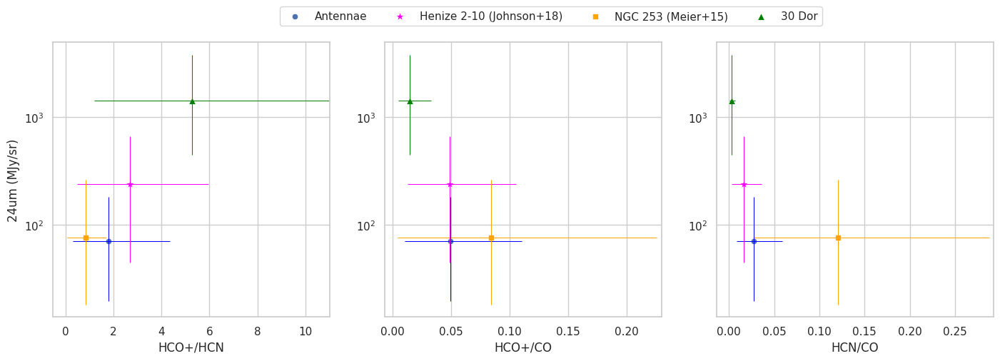

In [652]:
fig, ax = plt.subplots(nrows=1,ncols=3,figsize=(17,5))
ax[0].errorbar(x=dfquants['Med'], y=dfquants['median'],yerr=(dfquants['q1'],dfquants['q3']), ls='none',xerr=(dfquants['lower'],dfquants['upper']),ecolor=['blue','magenta','orange','green'],linewidth=.75,fmt='none')
sns.scatterplot(x=dfquants['Med'][0], y=[dfquants['median'][0]], label='Antennae',ax=ax[0])
sns.scatterplot(x=dfquants['Med'][1], y=[dfquants['median'][1]], label='Henize 2-10 (Johnson+18)', color='magenta', marker=m_henize, s=100,ax=ax[0])
sns.scatterplot(x=np.nanmedian(1/ngc253leroydf['HCN/HCO+']), y=[dfquants['median'][2]], label='NGC 253 (Leroy+2015)', color='gold', marker=m_253,ax=ax[0])
sns.scatterplot(x=np.nanmedian(ngc253df['HCO+(1-0)']/ngc253df['HCN(1-0)']), y=[dfquants['median'][2]], label='NGC 253 (Meier+15)', color='orange',marker=m_253,ax=ax[0])
sns.scatterplot(x=dfquants['Med'][3], y=[dfquants['median'][3]], label='30 Dor', s=50, color='green',marker='^',ax=ax[0])

ax[0].set_xlabel('HCO+/HCN')
ax[0].set_yscale('log')
ax[0].set_ylabel('24um (MJy/sr)')
ax[0].set_xlim(right=11) #sum
#ax[0].legend(loc='lower right')
ax[0].get_legend().remove()


ax[1].errorbar(x=dfquants_hco['Med'], y=dfquants['median'],yerr=(dfquants['q1'],dfquants['q3']), ls='none',xerr=(dfquants_hco['lower'],dfquants_hco['upper']),ecolor=['blue','magenta','orange','green'],linewidth=.75,fmt='none')
sns.scatterplot(x=dfquants_hco['Med'][0], y=[dfquants_hco['median'][0]], label='Antennae',ax=ax[1])
sns.scatterplot(x=dfquants_hco['Med'][1], y=[dfquants_hco['median'][1]], label='Henize 2-10 (Johnson+18)', color='magenta', marker=m_henize, s=100,ax=ax[1])
sns.scatterplot(x=dfquants_hco['Med'][2], y=[dfquants_hco['median'][2]], label='NGC 253 (Meier+15)', color='orange',marker=m_253,ax=ax[1])
sns.scatterplot(x=dfquants_hco['Med'][3], y=[dfquants_hco['median'][3]], label='30 Dor', s=50, color='green',marker='^',ax=ax[1])
ax[1].set_xlabel('HCO+/CO')
ax[1].set_yscale('log')
ax[1].set_ylabel(' ')
#plt.xlim(right=10) #sum
#ax[1].legend(loc='upper right')
ax[1].get_legend().remove()
ax[1].set_xlim(right=.23)



ax[2].errorbar(x=dfquants_hcn['Med'], y=dfquants['median'],yerr=(dfquants['q1'],dfquants['q3']), ls='none',xerr=(dfquants_hcn['lower'],dfquants_hcn['upper']),ecolor=['blue','magenta','orange','green'],linewidth=.75,fmt='none')
sns.scatterplot(x=dfquants_hcn['Med'][0], y=[dfquants_hco['median'][0]], label='Antennae',ax=ax[2])
sns.scatterplot(x=dfquants_hcn['Med'][1], y=[dfquants_hco['median'][1]], label='Henize 2-10 (Johnson+18)', color='magenta', marker=m_henize, s=100,ax=ax[2])
sns.scatterplot(x=dfquants_hcn['Med'][2], y=[dfquants_hco['median'][2]], label='NGC 253 (Meier+15)', color='orange',marker=m_253,ax=ax[2])
sns.scatterplot(x=dfquants_hcn['Med'][3], y=[dfquants_hco['median'][3]], label='30 Dor', s=50, color='green',marker='^',ax=ax[2])
#sns.scatterplot(x=(ngc253df['HCN(1-0)']/ngc253df['CO(1-0)']),y=[1.5e+07/56564614716981]*len((ngc253df['HCO+(1-0)']/ngc253df['CO(1-0)'])))

ax[2].set_xlabel('HCN/CO')
ax[2].set_yscale('log')
ax[2].set_ylabel(' ')
#plt.xlim(right=10) #sum
#ax[2].legend(loc='upper right')
ax[2].set_xlim(right=.2925)
plt.legend(bbox_to_anchor=(.4, 1.15),ncols=5)



In [653]:
dfquants

,Galaxy,Data,Med,lower,upper,24um,24um err,max,mean,medabsdevmed,median,min,npts,q1,q3,quartile,rms,sigma,sum,sumsq
0,Antennae,0 3.128759 1 2.473740 2 2.801831 3...,1.803954,1.485647,2.543884,4.591789e-07,1.483479e-09,715.784546,110.152871,24.885067,70.654900,27.305246,165.0,51.036957,111.174126,60.137169,159.007060,115.020739,18175.223673,4.171735e+06
1,Henize,1 2.452381 2 2.976190 3 1.743590 4...,2.674419,2.195652,3.291667,3.470271e-06,5.397496e-08,2428.284180,493.089316,82.994194,238.901222,88.368210,64.0,193.769653,428.706696,234.937042,748.676705,567.818201,31557.716217,3.587308e+07
2,NGC253,0 1.112500 1 0.634454 2 0.516981 3 ...,0.844436,0.781055,0.873672,2.804103e-07,1.869084e-08,2507.902100,328.918292,26.589029,76.086231,41.600903,242.0,57.736771,187.712433,129.975662,689.343850,607.067173,79598.226555,1.149972e+08
3,30Dor,0 5.468750 1 NaN 2 4.04531...,5.268349,4.053531,6.352030,4.385082e-05,1.489632e-08,2872.418945,1522.206595,529.025146,1411.404419,256.974548,135.0,966.859680,2366.937988,1400.078308,1708.635880,778.985625,205497.890289,3.941239e+08


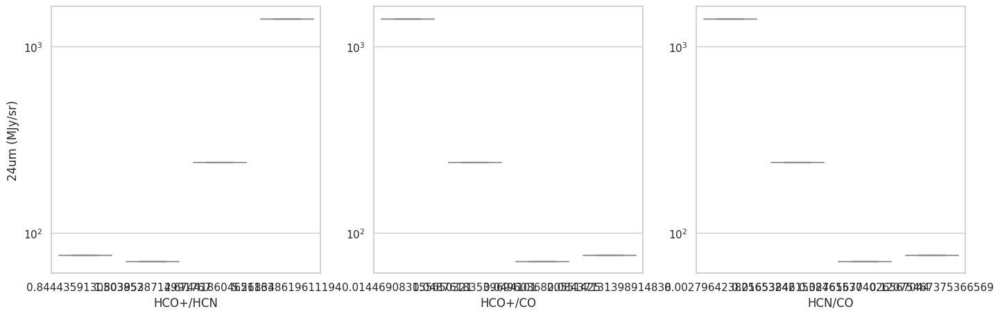

In [654]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd

# Example DataFrame structure
# Assuming df contains columns 'HCO_HCN', 'HCO_CO', 'HCN_CO', '24um_flux'
# Adjust this based on your actual DataFrame structure

# Example data (replace with your actual DataFrames)


galaxies = {
    'Antennae': {'median_flux': dfquants.iloc[0]['median'], 'q1_flux': dfquants.iloc[0].q1, 'q3_flux': dfquants.iloc[0].q3},
    'Henize 2-10': {'median_flux': dfquants.iloc[1]['median'], 'q1_flux': dfquants.iloc[1].q1, 'q3_flux': dfquants.iloc[1].q3},
    'NGC 253': {'median_flux': dfquants.iloc[2]['median'], 'q1_flux': dfquants.iloc[2].q1, 'q3_flux': dfquants.iloc[2].q3},
    '30 Dor': {'median_flux': dfquants.iloc[3]['median'], 'q1_flux': dfquants.iloc[3].q1, 'q3_flux': dfquants.iloc[3].q3},
}

# Generate synthetic data for each galaxy
def generate_flux_data(median, q1, q3, size=len(dfquants.Data)):
    data = np.random.normal(loc=median, scale=(q3 - median) / 1.5, size=size)
    data = np.clip(data, q1 - (median - q1), q3 + (q3 - median))
    return data

# Create a DataFrame to hold all the data
all_data = []

for galaxy, stats in galaxies.items():
    ratios = {
        'HCO_HCN': dfquants.Data,  # Example range for HCO+/HCN
        'HCO_CO': dfquants_hco.Data,  # Example range for HCO+/CO
        'HCN_CO': dfquants_hcn.Data,  # Example range for HCN/CO
    }

    flux_data = generate_flux_data(stats['median_flux'], stats['q1_flux'], stats['q3_flux'])

    for i in range(len(flux_data)):
        all_data.append({
            'Galaxy': galaxy,
            'HCO_HCN': ratios['HCO_HCN'][i],
            'HCO_CO': ratios['HCO_CO'][i],
            'HCN_CO': ratios['HCN_CO'][i],
            '24um_flux': flux_data[i]
        })


data = {
    'HCO_HCN': dfquants['Med'],  # Replace with actual data
    'HCO_CO': dfquants_hco['Med'],  # Replace with actual data
    'HCN_CO': dfquants_hcn['Med'],  # Replace with actual data
    '24um_flux': dfquants['median'],  # Replace with actual flux data
}

# Create DataFrame
df = pd.DataFrame(data)

# Set up the figure
fig, ax = plt.subplots(nrows=1, ncols=3, figsize=(17, 5))

# 2D Boxplot for HCO+/HCN vs 24um flux
sns.boxplot(x='HCO_HCN', y='24um_flux', data=df, ax=ax[0], color='lightgray')
ax[0].set_xlabel('HCO+/HCN')
ax[0].set_yscale('log')
ax[0].set_ylabel('24um (MJy/sr)')

# 2D Boxplot for HCO+/CO vs 24um flux
sns.boxplot(x='HCO_CO', y='24um_flux', data=df, ax=ax[1], color='lightgray')
ax[1].set_xlabel('HCO+/CO')
ax[1].set_yscale('log')
ax[1].set_ylabel(' ')

# 2D Boxplot for HCN/CO vs 24um flux
sns.boxplot(x='HCN_CO', y='24um_flux', data=df, ax=ax[2], color='lightgray')
ax[2].set_xlabel('HCN/CO')
ax[2].set_yscale('log')
ax[2].set_ylabel(' ')

plt.show()


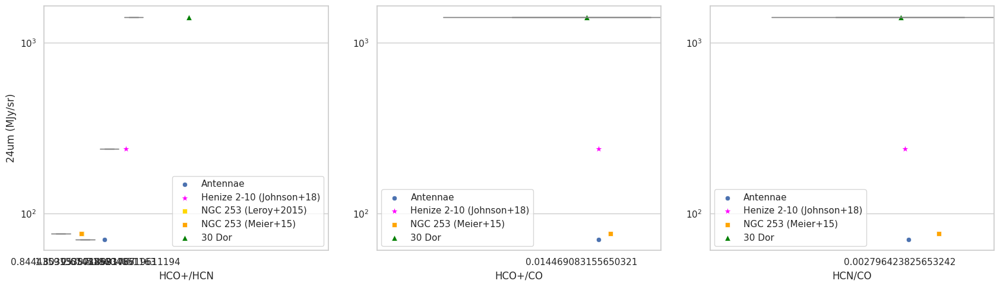

In [655]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd

# Assuming dfquants, dfquants_hco, and dfquants_hcn are your DataFrames
# Create the boxplots for each axis

fig, ax = plt.subplots(nrows=1, ncols=3, figsize=(17, 5))

# Boxplot for HCO+/HCN
sns.boxplot(x=dfquants['Med'], y=dfquants['median'], ax=ax[0], color='lightgray', fliersize=0)
sns.scatterplot(x=dfquants['Med'][0], y=[dfquants['median'][0]], label='Antennae', ax=ax[0])
sns.scatterplot(x=dfquants['Med'][1], y=[dfquants['median'][1]], label='Henize 2-10 (Johnson+18)', color='magenta', marker=m_henize, s=100, ax=ax[0])
sns.scatterplot(x=np.nanmedian(1/ngc253leroydf['HCN/HCO+']), y=[dfquants['median'][2]], label='NGC 253 (Leroy+2015)', color='gold', marker=m_253, ax=ax[0])
sns.scatterplot(x=np.nanmedian(ngc253df['HCO+(1-0)']/ngc253df['HCN(1-0)']), y=[dfquants['median'][2]], label='NGC 253 (Meier+15)', color='orange', marker=m_253, ax=ax[0])
sns.scatterplot(x=dfquants['Med'][3], y=[dfquants['median'][3]], label='30 Dor', s=50, color='green', marker='^', ax=ax[0])

# Set labels and limits
ax[0].set_xlabel('HCO+/HCN')
ax[0].set_yscale('log')
ax[0].set_ylabel('24um (MJy/sr)')
ax[0].set_xlim(right=11)

# Boxplot for HCO+/CO
sns.boxplot(x=dfquants_hco['Med'], y=dfquants['median'], ax=ax[1], color='lightgray', fliersize=0)
sns.scatterplot(x=dfquants_hco['Med'][0], y=[dfquants_hco['median'][0]], label='Antennae', ax=ax[1])
sns.scatterplot(x=dfquants_hco['Med'][1], y=[dfquants_hco['median'][1]], label='Henize 2-10 (Johnson+18)', color='magenta', marker=m_henize, s=100, ax=ax[1])
sns.scatterplot(x=dfquants_hco['Med'][2], y=[dfquants_hco['median'][2]], label='NGC 253 (Meier+15)', color='orange', marker=m_253, ax=ax[1])
sns.scatterplot(x=dfquants_hco['Med'][3], y=[dfquants_hco['median'][3]], label='30 Dor', s=50, color='green', marker='^', ax=ax[1])

# Set labels and limits
ax[1].set_xlabel('HCO+/CO')
ax[1].set_yscale('log')
ax[1].set_ylabel(' ')
ax[1].set_xlim(right=0.23)

# Boxplot for HCN/CO
sns.boxplot(x=dfquants_hcn['Med'], y=dfquants['median'], ax=ax[2], color='lightgray', fliersize=0)
sns.scatterplot(x=dfquants_hcn['Med'][0], y=[dfquants_hco['median'][0]], label='Antennae', ax=ax[2])
sns.scatterplot(x=dfquants_hcn['Med'][1], y=[dfquants_hco['median'][1]], label='Henize 2-10 (Johnson+18)', color='magenta', marker=m_henize, s=100, ax=ax[2])
sns.scatterplot(x=dfquants_hcn['Med'][2], y=[dfquants_hco['median'][2]], label='NGC 253 (Meier+15)', color='orange', marker=m_253, ax=ax[2])
sns.scatterplot(x=dfquants_hcn['Med'][3], y=[dfquants_hco['median'][3]], label='30 Dor', s=50, color='green', marker='^', ax=ax[2])

# Set labels and limits
ax[2].set_xlabel('HCN/CO')
ax[2].set_yscale('log')
ax[2].set_ylabel(' ')
ax[2].set_xlim(right=0.2925)

#plt.legend(bbox_to_anchor=(.4, 1.15), ncols=5)
plt.tight_layout()
plt.show()


# almond

In [656]:
import pandas as pd

# Data provided as a list of tuples
data = [
    (6.924382328131758, 0.005615356764322971),
    (9.658032491836718, 0.006592650038113441),
    (13.887408899179995, 0.007385187355493599),
    (8.680424426579513, 0.008105155542923195),
    (31.937416584000697, 0.008280932198356624),
    (25.056274308107866, 0.009007387668700307),
    (19.965179809804066, 0.00875291364861868),
    (13.875392775094326, 0.009608298007197808),
    (11.395136819313628, 0.009604437221872776),
    (11.565493900832665, 0.010551188964929337),
    (9.074468024554655, 0.011157739333353452),
    (8.799308556504645, 0.012967463749393785),
    (8.02338286044594, 0.01997691060596719),
    (10.376506947362596, 0.022164310810254908),
    (16.084580233429175, 0.029967807020845647),
    (63.93832274736711, 0.018784364075298897),
    (40.63663802272655, 0.013008017192020162),
    (44.478436813776824, 0.015408506814711327),
    (28.24600046254196, 0.01362375724369656),
    (28.69133038219109, 0.011722078861001347),
    (23.92752795620199, 0.01097165861595004),
    (21.18548247629538, 0.012869218205205282),
    (24.652880471849972, 0.012515310023890548),
    (17.137487085716415, 0.01274332005422101),
    (13.655804724389057, 0.012267463507428834),
    (11.557273164265938, 0.013097195850645324),
    (60.141893886691626, 0.022666000644731617),
    (52.49298077412596, 0.020627092078589294),
    (38.810819507220465, 0.015260125754186936),
    (31.392168415396764, 0.015542946579920046),
    (42.48919888196098, 0.016925298169479526),
    (38.20133415615327, 0.018764629840476648),
    (33.34078434741236, 0.01740068410080257),
    (29.993759215034046, 0.016136877285502973),
    (22.158144726362476, 0.015242680207702728),
    (17.393692195912486, 0.01399948532397628),
    (20.23048386093245, 0.01582366941722458),
    (17.12742364939644, 0.015234671374553083),
    (14.065860261450746, 0.015228549812167059),
    (12.653421072997242, 0.014255856894646656),
    (14.061077725468488, 0.016887143971872777),
    (9.774277233873672, 0.017357164911769855),
    (24.63231099261904, 0.016130393200707825),
    (25.002882384893013, 0.017227791900301662),
    (21.484264372926074, 0.018221536080806507),
    (25.375890492405013, 0.019104721066061807),
    (32.321817522315385, 0.021802083374532044),
    (31.36597591602654, 0.020032571254976348),
    (41.80514343438122, 0.023516846574050922),
    (42.45637243804264, 0.021408017919391974),
    (45.7715612609414, 0.02535785334564113),
    (34.323895062411275, 0.02534296276447959),
    (32.80705650306828, 0.023505216974318302),
    (24.982020876619433, 0.022204088975931673),
    (20.831522279577918, 0.021578786950463568),
    (18.45739216911302, 0.02039059905195811),
    (10.704295072050767, 0.017360384819487207),
    (26.931899342629375, 0.02654914811681103),
    (22.791073624278518, 0.02915539658595598),
    (31.32914941723195, 0.028631077713264022),
    (33.77756191159726, 0.0332820839314087),
    (27.73460589844221, 0.03519861706882191),
    (64.76192381532084, 0.0383717779461191),
    (45.72912972947256, 0.033617130757662914),
    (43.008578788556065, 0.042117779260002916),
    (54.80805565446664, 0.04135395729566853),
    (58.179588429907604, 0.05431719477313237),
    (62.76131193994099, 0.05331399829434929),
    (91.57181103918978, 0.07073348721318311),
    (139.97970613171682, 0.06628721459010374),
    (95.94495423232111, 0.04903235399597141),
    (30.96421139562428, 0.010087094428714189),
]

almonddisk = pd.DataFrame(data, columns=["sigmol", "hcn/co"])
almonddisk.head()
# New data provided as a list of tuples
new_data = [
    (16.354342872599165, 0.019087600538738533),
    (13.625020848872255, 0.024361944987406438),
    (16.09850951925798, 0.023034034676737442),
    (19.014568409725502, 0.024150478070210323),
    (22.812221198339532, 0.021992307320640465),
    (34.34300076524234, 0.021398754237792524),
    (48.63154335045535, 0.02524209451350957),
    (57.429043732234874, 0.028132708004364907),
    (29.937249332812513, 0.028628422423530076),
    (81.27612890521698, 0.03948736310822907),
    (260.9226041727145, 0.04033250269415206),
    (47.13869936829926, 0.03299318829148849),
    (57.37935307211101, 0.03660129787422989),
    (44.349368513844425, 0.037276184145930195),
    (41.707035006932095, 0.048037576045790384),
    (33.23889713546936, 0.044120989391185375),
    (31.755277447669645, 0.04711684484861051),
    (133.81855516092295, 0.05810948382118149),
    (61.762340662380446, 0.07001552985109115),
    (108.16901774029668, 0.07210011705794526),
    (98.68554171799703, 0.09378650649464648),
    (84.80553893560796, 0.09643860315721596),
    (72.90252945887435, 0.08942600013317484),
    (38.56562863017192, 0.10478212198274686),
    (148.5630368982942, 0.09211697319830464),
    (186.3311700008083, 0.11439787971204002),
    (77.58357817822785, 0.054349109534036696),
    (83.70115544225939, 0.051862271970393795),
    (78.8116432368335, 0.045891997865056176),
    (69.8296258521888, 0.04336505709555536),
    (59.12426626901613, 0.04059018176351819),
]

# Create a DataFrame for the new data
almondcen = pd.DataFrame(new_data, columns=["sigmol", "hcn/co"])

# Display the new DataFrame
almondcen.head()


,sigmol,hcn/co
0,16.354343,0.019088
1,13.625021,0.024362
2,16.098510,0.023034
3,19.014568,0.024150
4,22.812221,0.021992


In [657]:
ngc253df.columns
bdf.columns
ngc253leroydf
dfngc253_dense_gas, ngc253leroydf
#henizedf['Mass'] = np.array([3.5,5.5,5.8,6.5,4.1,1.9,4.6,5.9,4.3,5.7,6.8,4.3,4.6,6.5,3.4,6.1,8.8,8.2,5.4,5.3,3.5])*10**6
#henizedf
bdf['R']= (bdf.Diameter/2) * 106.13425075995976
bdf
dfngc253_dense_gas.columns

Index(['ncl', 'Mass', 'LHCO', 'LCS', 'vel_disp', ' LHCN', 'R'], dtype='object')

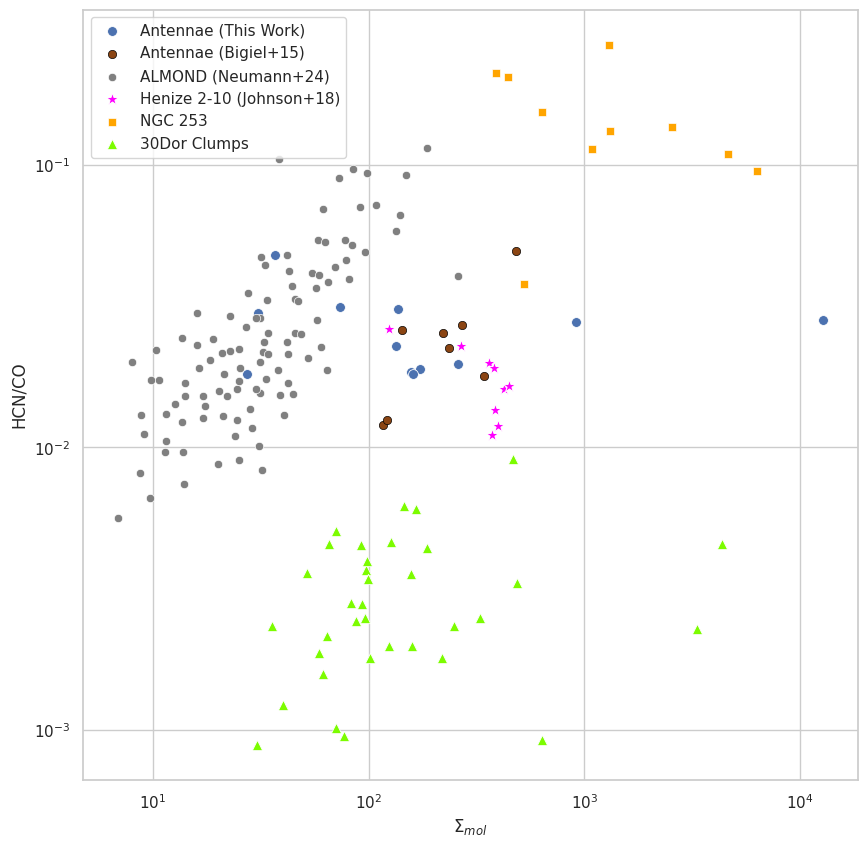

In [658]:
fig, ax=plt.subplots(figsize=(10,10))
sns.scatterplot(data=antdf, y=(hcn_lr*antdf['LHCN'])/(co_lr*antdf['LCO']), x=4.4*(co_lr*antdf['LCO'])/ (4 *np.pi*antdf['R']**2), label='Antennae (This Work)',s=50)
sns.scatterplot(data=bdf, y=bdf['HCN(1–0)']/bdf['12CO(1–0)'], x=4.4*bdf['12CO(1–0)']/(4*np.pi*bdf['R']**2),  color='saddlebrown', edgecolor="black", label='Antennae (Bigiel+15)')
sns.scatterplot(x='sigmol', y='hcn/co', data=almonddisk, color='gray',label='ALMOND (Neumann+24)')#, label='ALMOND disk')
sns.scatterplot(x='sigmol', y='hcn/co', data=almondcen,color='gray')#, label='ALMOND center')
sns.scatterplot(data=henizedf, y=(henizedf.LHCN)/(co_lr*henizedf.LCO), x=henizedf.Mass/ (4 *np.pi*34.83624752591218**2), label='Henize 2-10 (Johnson+18)', color='magenta', marker=m_henize,s=95) #R is .8" for each point
#sns.scatterplot(data=ngc253df, y=ngc253df['HCN(1-0)']/ngc253df['CO(1-0)'], x=4.4*ngc253df['CO(1-0)'], label='NGC 253 (Meier+15)',color='orange',marker=m_253)
sns.scatterplot(data=dfngc253_dense_gas, y = (dfngc253_dense_gas[' LHCN'])/(dfngc253_dense_gas['Mass']/4.4), x= dfngc253_dense_gas['Mass']/(4 *np.pi*dfngc253_dense_gas['R']**2), label='NGC 253', color='orange',marker=m_253)
sns.scatterplot(data=df30dor_m, y=df30dor_m['LHCN']/(co_lr*df30dor_m['LCO']), x=4.4*(co_lr*df30dor_m['LCO'])/ (4 *np.pi*df30dor_m['R']**2), label='30Dor Clumps', color='lawngreen', marker='^', s=55)
plt.xlabel('$\Sigma_{mol}$')
plt.ylabel('HCN/CO')
plt.xscale('log')
plt.yscale('log')

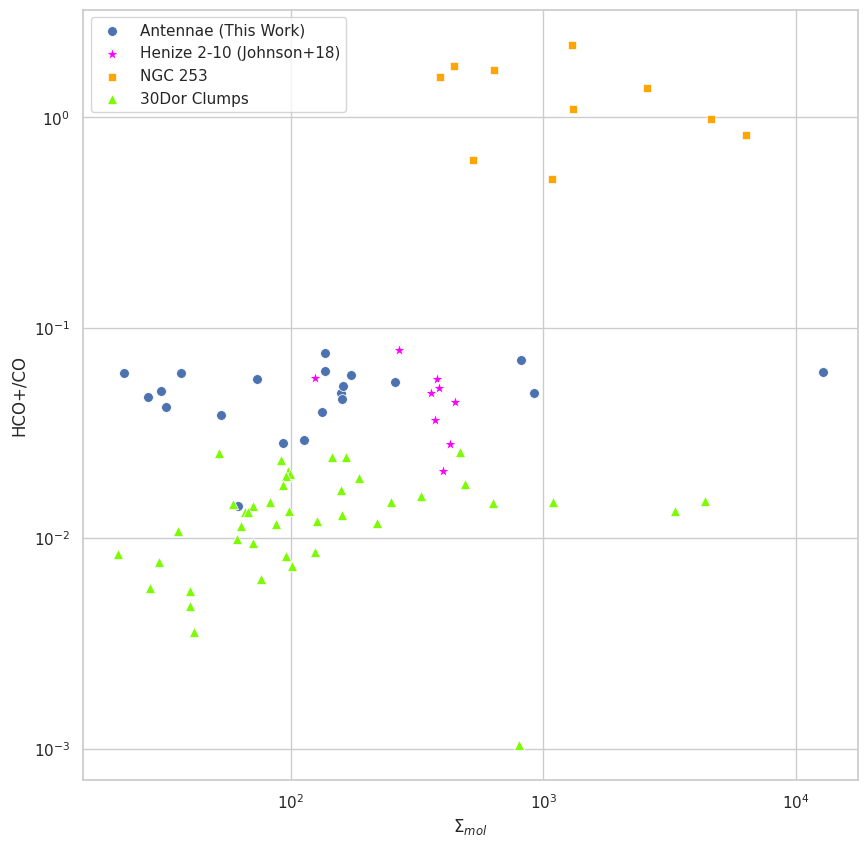

In [659]:
fig, ax=plt.subplots(figsize=(10,10))
sns.scatterplot(data=antdf, y=(hco_lr*antdf['LHCO'])/(co_lr*antdf['LCO']), x=4.4*(co_lr*antdf['LCO'])/ (4 *np.pi*antdf['R']**2), label='Antennae (This Work)',s=50)
#sns.scatterplot(x='sigmol', y='hcn/co', data=almonddisk, color='gray',label='ALMOND (Neumann+24)')#, label='ALMOND disk')
#sns.scatterplot(x='sigmol', y='hcn/co', data=almondcen,color='gray')#, label='ALMOND center')
sns.scatterplot(data=henizedf, y=(henizedf.LHCO)/(co_lr*henizedf.LCO), x=henizedf.Mass/ (4 *np.pi*34.83624752591218**2), label='Henize 2-10 (Johnson+18)', color='magenta', marker=m_henize,s=95) #R is .8" for each point
#sns.scatterplot(data=ngc253df, y=ngc253df['HCN(1-0)']/ngc253df['CO(1-0)'], x=4.4*ngc253df['CO(1-0)'], label='NGC 253 (Meier+15)',color='orange',marker=m_253)
sns.scatterplot(data=dfngc253_dense_gas, y = (dfngc253_dense_gas['LHCO'])/(dfngc253_dense_gas['Mass']/4.4), x= dfngc253_dense_gas['Mass']/(4 *np.pi*dfngc253_dense_gas['R']**2), label='NGC 253', color='orange',marker=m_253)
sns.scatterplot(data=df30dor_m, y=df30dor_m['LHCO']/(co_lr*df30dor_m['LCO']), x=4.4*(co_lr*df30dor_m['LCO'])/ (4 *np.pi*df30dor_m['R']**2), label='30Dor Clumps', color='lawngreen', marker='^', s=55)
plt.xlabel('$\Sigma_{mol}$')
plt.ylabel('HCO+/CO')
plt.xscale('log')
plt.yscale('log')

<ipython-input-660-acaa46feb72c>:14: UserWarning: Attempt to set non-positive xlim on a log-scaled axis will be ignored.
  plt.xlim([-.01,.25])


(1.509082226838087e-05, 0.25)

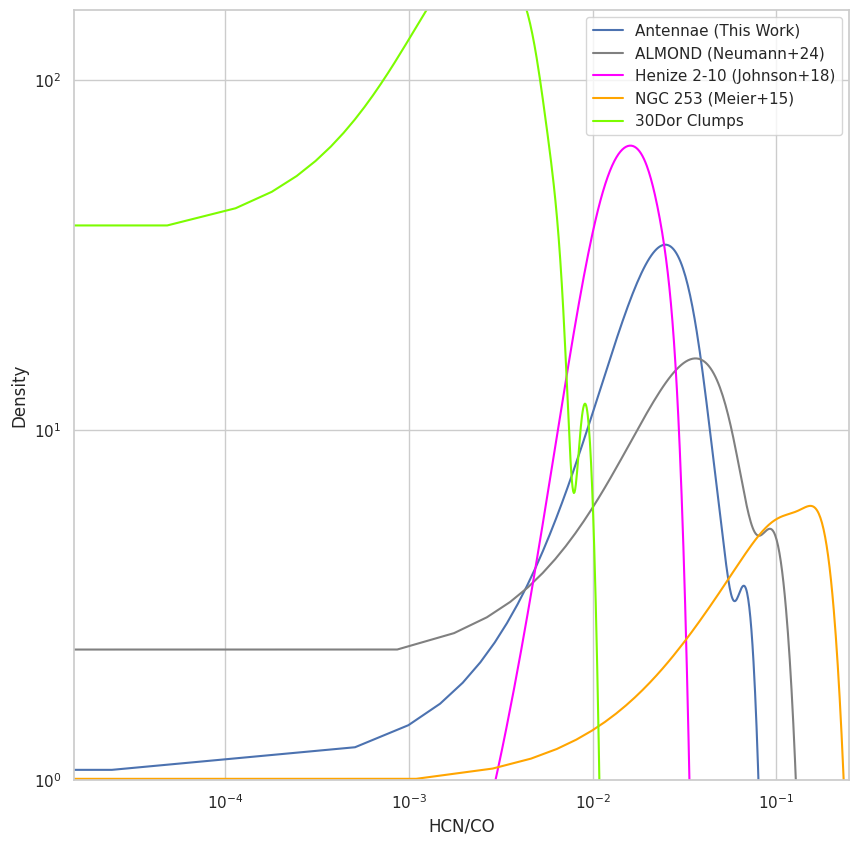

In [660]:
fig, ax=plt.subplots(figsize=(10,10))
sns.kdeplot(data=antdf, x=(hcn_lr*antdf['LHCN'])/(co_lr*antdf['LCO']), label='Antennae (This Work)')
#sns.scatterplot(data=bdf, y=bdf['HCN(1–0)']/bdf['12CO(1–0)'], x=4.4*bdf['12CO(1–0)'],  color='saddlebrown', edgecolor="black", label='Antennae (Bigiel+15)')
#sns.kdeplot( x='hcn/co', data=almonddisk, color='gray',label='ALMOND (Neumann+24)',linestyle='dotted')#, label='ALMOND disk')
sns.kdeplot( x='hcn/co', data=almondcen,color='gray', label='ALMOND (Neumann+24)')#, label='ALMOND center')
sns.kdeplot(data=henizedf, x=(henizedf.LHCN)/(co_lr*henizedf.LCO), label='Henize 2-10 (Johnson+18)', color='magenta')
sns.kdeplot(data=ngc253df, x=ngc253df['HCN(1-0)']/ngc253df['CO(1-0)'], label='NGC 253 (Meier+15)',color='orange')
sns.kdeplot(data=df30dor_m, x=df30dor_m['LHCN']/(co_lr*df30dor_m['LCO']), label='30Dor Clumps', color='lawngreen')
plt.xlabel('HCN/CO')#plt.xscale('log')
plt.yscale('log')
plt.xscale('log')
plt.legend()
plt.ylim([1,10**2.2])
plt.xlim([-.01,.25])

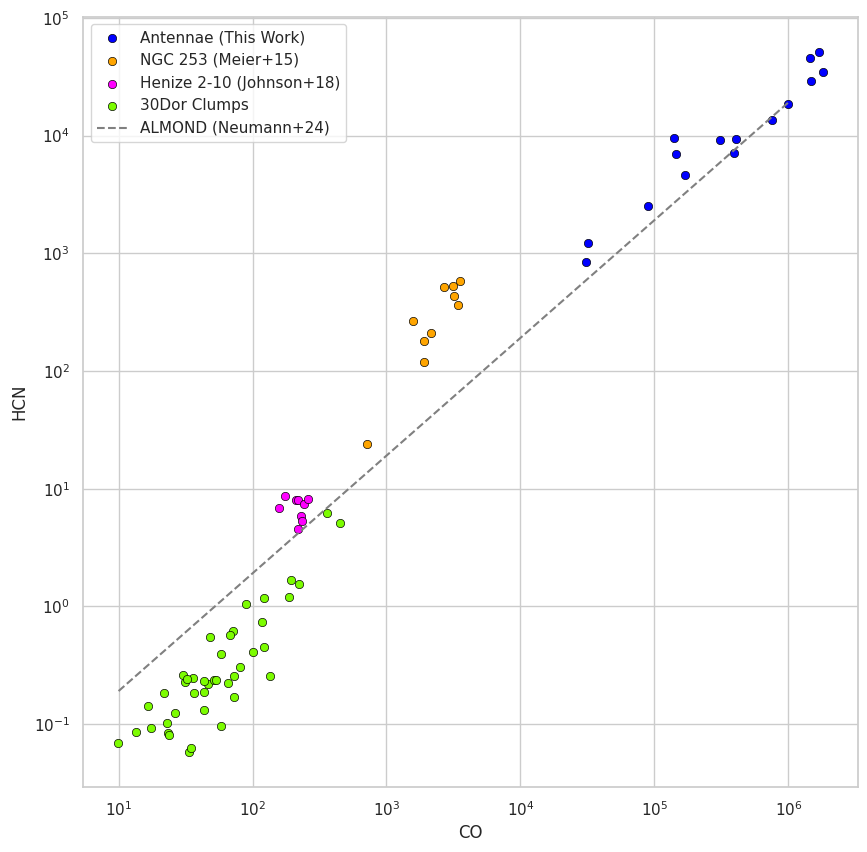

In [661]:
import seaborn as sns
import matplotlib.pyplot as plt

fig, ax = plt.subplots(figsize=(10, 10))

# Scatter plots for data with individual HCN and CO values, numerator on y-axis, denominator on x-axis
sns.scatterplot(data=antdf, x=(co_lr * antdf['LCO']), y=(hcn_lr * antdf['LHCN']), label='Antennae (This Work)', color='blue', edgecolor="black")
sns.scatterplot(data=ngc253df, x=ngc253df['CO(1-0)'], y=ngc253df['HCN(1-0)'], label='NGC 253 (Meier+15)', color='orange', edgecolor="black")
sns.scatterplot(data=henizedf, x=henizedf['LCO'] * co_lr, y=henizedf['LHCN'] * hcn_lr, label='Henize 2-10 (Johnson+18)', color='magenta', edgecolor="black")
sns.scatterplot(data=df30dor_m, x=df30dor_m['LCO'] * co_lr, y=df30dor_m['LHCN'] * hcn_lr, label='30Dor Clumps', color='lawngreen', edgecolor="black")

# Line plot for ALMOND dataset (which only has the ratio, so it's plotted as a line)
#sns.lineplot(x='hcn/co', data=almondcen, color='gray', label='ALMOND (Neumann+24)', linestyle='--')
x_vals = np.arange(10, 10**6, 1)
ratio = almondcen['hcn/co'].iloc[0]  # Assume the ratio is constant for the ALMOND dataset
y_vals = x_vals * ratio  # Multiply each x-value by the ratio

# Plot the ALMOND data as a line
ax.plot(x_vals, y_vals, color='gray', label='ALMOND (Neumann+24)', linestyle='--')

# Add labels and set scales
plt.xlabel('CO')
plt.ylabel('HCN')
plt.xscale('log')
plt.yscale('log')

plt.legend()

# Show the plot
plt.show()


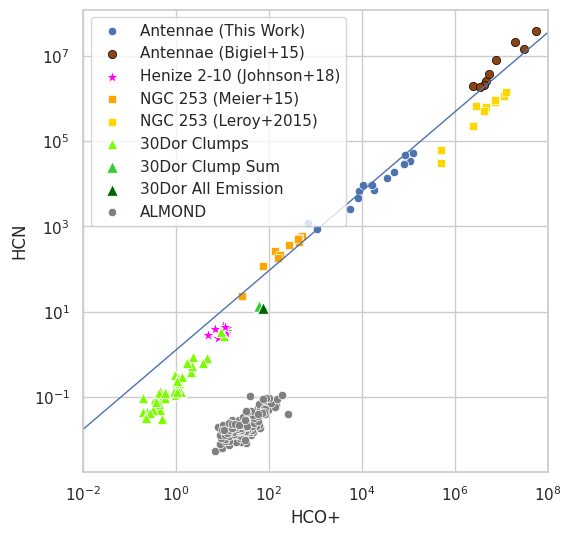

In [662]:
fig, ax = plt.subplots(nrows=1, ncols=1, figsize=(6,6))
#ax[0].set_xlim(left=4*10**-2)

#ax[0].legend(loc='upper left')
#plt.title('Antennae Dense Gas Fraction')

#plt.show()


#fig, ax = plt.subplots()
sns.scatterplot(data=antdf, x=(hco_lr*antdf['LHCO']), y=(hcn_lr*antdf['LHCN']), label='Antennae (This Work)')
sns.scatterplot(data=bdf, x=bdf['HCO+'], y=bdf['HCN(1–0)'],  color='saddlebrown', edgecolor="black", label='Antennae (Bigiel+15)')
sns.lineplot(x=np.arange(10**-2,10**8,1000),y=(np.nanmean(antdf.LHCN/antdf.LHCO)+.6)*np.arange(10**-2,10**8,1000)**.93,linewidth=1,ax=ax)

sns.scatterplot(data=henizedf, x=henizedf.LHCO, y=henizedf.LHCN, label='Henize 2-10 (Johnson+18)', color='magenta', marker=m_henize, s=95)
#sns.scatterplot(data=ngc253leroydf, x=1/ngc253leroydf['CO/HCO+'], y=ngc253leroydf['HCN/HCO+']/ngc253leroydf['CO/HCO+'], label='NGC 253 (Leroy+15)')
sns.scatterplot(data=ngc253df, x=ngc253df['HCO+(1-0)'], y=ngc253df['HCN(1-0)'], label='NGC 253 (Meier+15)', color='orange',marker=m_253)
sns.scatterplot(data=dfngc253_dense_gas, x=dfngc253_dense_gas['LHCO'], y=dfngc253_dense_gas[' LHCN'] , label='NGC 253 (Leroy+2015)', color='gold', marker=m_253)



sns.scatterplot(data=df30dor_m, x=df30dor_m['LHCO'], y=df30dor_m['LHCN'], label='30Dor Clumps', color='lawngreen', marker='^', s=55)
#sns.scatterplot( x=[53], y=[42], label='30 dor clump sum', s=100,color='limegreen')
sns.scatterplot(data=df30dor_clump_sum, x='LHCO', y='LHCN', label='30Dor Clump Sum',color='limegreen', marker='^', s=70)
sns.scatterplot(data=df30dor, x=df30dor['LHCO'], y=df30dor['LHCN'], label='30Dor All Emission', s=70, color='darkgreen',marker='^')
sns.scatterplot(x='sigmol', y='hcn/co', data=almonddisk, color='gray',label='ALMOND')#, label='ALMOND disk')
sns.scatterplot(x='sigmol', y='hcn/co', data=almondcen,color='gray')#, label='ALMOND center')
'''sns.scatterplot(data=dendro_leaf, x=dendro_leaf['LHCO'], y=dendro_leaf['LHCN'], label='30 Dor dendro leaf')
sns.scatterplot(data=dendro_branch, x=dendro_branch['LHCO'], y=dendro_branch['LHCN'], label='30 Dor dendro branch')
sns.scatterplot(data=dendro_trunk, x=dendro_trunk['LHCO'], y=dendro_trunk['LHCN'], label='30 Dor dendro trunk', s=70)
sns.scatterplot(data=smoothdf, x=smoothdf['LHCO'], y=smoothdf['LHCN'], label='30 Dor combined', s=80)
sns.scatterplot(data=df30dor_m, x=df30dor_m['LHCO'], y=df30dor_m['LHCN'], label='30 Dor')'''
#sns.scatterplot(x='sigmol', y='hcn/co', data=almonddisk, color='gray',label='ALMOND')#, label='ALMOND disk')
#sns.scatterplot(x='sigmol', y='hcn/co', data=almondcen,color='gray')#, label='ALMOND center')
ax.set_xlabel('HCO+')
ax.set_ylabel('HCN')
ax.set_xlabel('HCO+')# $\mathrm{(K\:km\:s^{-1}\:pc^{-2})}}$')
ax.set_ylabel('HCN')# $\mathrm{(K\:km\:s^{-1}\:pc^{-2})}}$')
#sns.lineplot(x=np.arange(10**3,10**7,1000),y=np.nanmean(antdf.LHCN/antdf.LHCO)*np.arange(10**3,10**7,1000),linewidth=1,ax=ax[0])

#ax.invert_xaxis()
ax.set_xscale('log')
ax.set_yscale('log')
#ax.set_xlim(left=10**0)
#plt.title('Similar Size Scale Dense Gas Fraction')

#plt.grid()
#plt.legend(bbox_to_anchor=(0, 0),ncol=2, columnspacing=-1)
ax.legend(loc='upper left')
ax.set_xlim([10**-2,10**8])
plt.show()

'plt.show()\nfig, ax = plt.subplots(nrows=1,ncols=1, figsize=(8,8))\n\nsns.scatterplot(data=antdf, x=(hco_lr*antdf[\'LHCO\'])/(hcn_lr*antdf[\'LHCN\']), y=(co_lr*antdf[\'LCO\']), label=\'Antennae (This Work)\')\n#sns.scatterplot(x=np.array([1/1.666667,1/1.594340,1/1.922222]),y=np.array([9.2E7,11.7E7,8E7]), color=\'saddlebrown\', edgecolor="black",ax=ax, label=\'Antennae (Bigiel+15)\')\n\n#sns.scatterplot(data=smoothdf, x=smoothdf[\'LHCO\']/(smoothdf[\'LHCN\']), y=(co_lr*smoothdf[\'LCO\']), label=\'30 Dor combined\')\nsns.scatterplot(data=henizedf, x=henizedf.LHCO/(henizedf.LHCN), y=(co_lr*henizedf.LCO), label=\'Henize 2-10 (Johnson+18)\', color=\'magenta\', marker=m_henize,s=95)\n#sns.scatterplot(data=ngc253leroydf, x=1/ngc253leroydf[\'CO/HCO+\'], y=ngc253leroydf[\'HCN/HCO+\']/ngc253leroydf[\'CO/HCO+\'], label=\'NGC 253 (Leroy+15)\')\nsns.scatterplot(data=ngc253df, x=ngc253df[\'HCO+(1-0)\']/ngc253df[\'HCN(1-0)\'], y=ngc253df[\'CO(1-0)\'], label=\'NGC 253 (Meier+15)\',color=\'orange\',ma

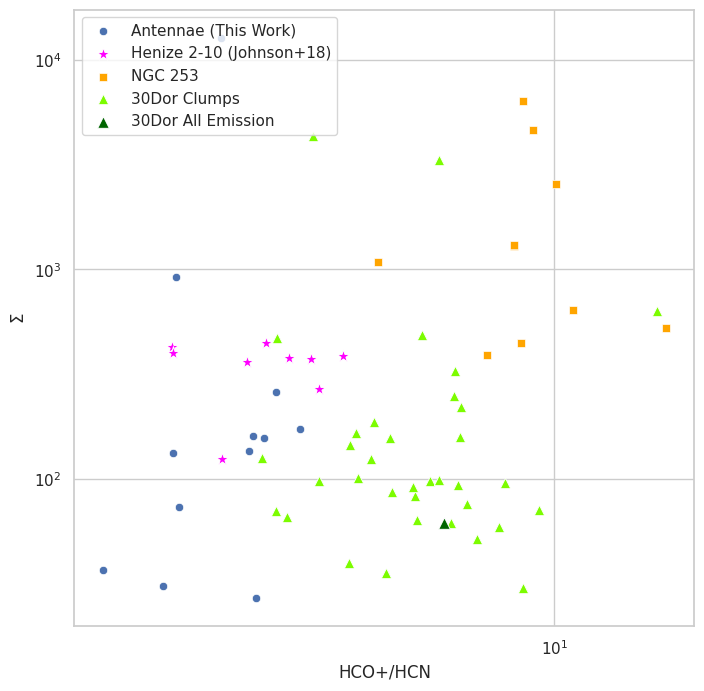

In [663]:
fig, ax = plt.subplots(nrows=1,ncols=1, figsize=(8,8))

sns.scatterplot(data=antdf, x=(hco_lr*antdf['LHCO'])/(hcn_lr*antdf['LHCN']), y=4.4*(co_lr*antdf['LCO'])/ (4 *np.pi*antdf['R']**2), label='Antennae (This Work)')
#sns.scatterplot(x=np.array([1/1.666667,1/1.594340,1/1.922222]),y=np.array([9.2E7,11.7E7,8E7]), color='saddlebrown', edgecolor="black",ax=ax, label='Antennae (Bigiel+15)')
#####sns.scatterplot(data=bdf, x=bdf['HCO+']/bdf['HCN(1–0)'], y=bdf['12CO(1–0)'],  color='saddlebrown', edgecolor="black", label='Antennae (Bigiel+15)')

#sns.scatterplot(data=smoothdf, x=smoothdf['LHCO']/(smoothdf['LHCN']), y=(co_lr*smoothdf['LCO']), label='30 Dor combined')
sns.scatterplot(data=henizedf, x=henizedf.LHCO/(henizedf.LHCN), y=henizedf.Mass/ (4 *np.pi*34.83624752591218**2), label='Henize 2-10 (Johnson+18)', color='magenta', marker=m_henize,s=95)
#sns.scatterplot(data=ngc253leroydf, x=1/ngc253leroydf['CO/HCO+'], y=ngc253leroydf['HCN/HCO+']/ngc253leroydf['CO/HCO+'], label='NGC 253 (Leroy+15)')
########sns.scatterplot(data=ngc253df, x=ngc253df['HCO+(1-0)']/ngc253df['HCN(1-0)'], y=ngc253df['CO(1-0)'], label='NGC 253 (Meier+15)',color='orange',marker=m_253)
sns.scatterplot(data=dfngc253_dense_gas, x = (dfngc253_dense_gas['LHCO'])/(dfngc253_dense_gas[' LHCN']), y= dfngc253_dense_gas['Mass']/(4 *np.pi*dfngc253_dense_gas['R']**2), label='NGC 253', color='orange',marker=m_253)

sns.scatterplot(data=df30dor_m, x=df30dor_m['LHCO']/df30dor_m['LHCN'], y=4.4*(co_lr*df30dor_m['LCO'])/ (4 *np.pi*df30dor_m['R']**2), label='30Dor Clumps', color='lawngreen', marker='^', s=55)
#sns.scatterplot( x=[53], y=[42], label='30 dor clump sum', s=100,color='limegreen')
sns.scatterplot(data=df30dor_clump_sum, x=df30dor_clump_sum['LHCO']/df30dor_clump_sum['LHCN'], y=4.4*(co_lr*df30dor_m['LCO'])/ (4 *np.pi*df30dor_m['R']**2), label='30Dor Clump Sum',color='navy', marker='^', s=70)
sns.scatterplot(data=df30dor, x=df30dor['LHCO']/df30dor['LHCN'], y=4.4*(co_lr*df30dor_m['LCO'])/ (4 *np.pi*df30dor_m['R']**2), label='30Dor All Emission', s=70, color='darkgreen',marker='^')


ax.set_xlabel('HCO+/HCN')
ax.set_ylabel('$\Sigma$ ')#$\mathrm{(K\:km\:s^{-1}\:pc^{-2})}}$')

#ax.invert_xaxis()
ax.set_xscale('log')
ax.set_yscale('log')
#ax.set_xlim(left=10**-.75)

ax.legend(loc='upper left')

'''plt.show()
fig, ax = plt.subplots(nrows=1,ncols=1, figsize=(8,8))

sns.scatterplot(data=antdf, x=(hco_lr*antdf['LHCO'])/(hcn_lr*antdf['LHCN']), y=(co_lr*antdf['LCO']), label='Antennae (This Work)')
#sns.scatterplot(x=np.array([1/1.666667,1/1.594340,1/1.922222]),y=np.array([9.2E7,11.7E7,8E7]), color='saddlebrown', edgecolor="black",ax=ax, label='Antennae (Bigiel+15)')

#sns.scatterplot(data=smoothdf, x=smoothdf['LHCO']/(smoothdf['LHCN']), y=(co_lr*smoothdf['LCO']), label='30 Dor combined')
sns.scatterplot(data=henizedf, x=henizedf.LHCO/(henizedf.LHCN), y=(co_lr*henizedf.LCO), label='Henize 2-10 (Johnson+18)', color='magenta', marker=m_henize,s=95)
#sns.scatterplot(data=ngc253leroydf, x=1/ngc253leroydf['CO/HCO+'], y=ngc253leroydf['HCN/HCO+']/ngc253leroydf['CO/HCO+'], label='NGC 253 (Leroy+15)')
sns.scatterplot(data=ngc253df, x=ngc253df['HCO+(1-0)']/ngc253df['HCN(1-0)'], y=ngc253df['CO(1-0)'], label='NGC 253 (Meier+15)',color='orange',marker=m_253)
sns.scatterplot(data=dfngc253_dense_gas, x = (dfngc253_dense_gas['LHCO'])/(dfngc253_dense_gas[' LHCN']), y= dfngc253_dense_gas['Mass']/4.4, label='NGC 253 Leroy+15', color='gold',marker=m_253)

sns.scatterplot(data=df30dor_m, x=df30dor_m['LHCO']/df30dor_m['LHCN'], y=(co_lr*df30dor_m['LCO']), label='30Dor Clumps', color='lawngreen', marker='^', s=55)
#sns.scatterplot( x=[53], y=[42], label='30 dor clump sum', s=100,color='limegreen')
sns.scatterplot(data=df30dor_clump_sum, x=df30dor_clump_sum['LHCO']/df30dor_clump_sum['LHCN'], y=co_lr*df30dor_clump_sum['LCO'], label='30Dor Clump Sum',color='limegreen', marker='^', s=70)
sns.scatterplot(data=df30dor, x=df30dor['LHCO']/df30dor['LHCN'], y=co_lr*df30dor['LCO'], label='30Dor All Emission', s=70, color='darkgreen',marker='^')


ax.set_xlabel('HCO+/HCN')
ax.set_ylabel('12CO ')#$\mathrm{(K\:km\:s^{-1}\:pc^{-2})}}$')

#ax.invert_xaxis()
ax.set_xscale('log')
ax.set_yscale('log')
ax.set_xlim(left=10**-.75)

ax.legend(loc='lower left')

plt.show()'''





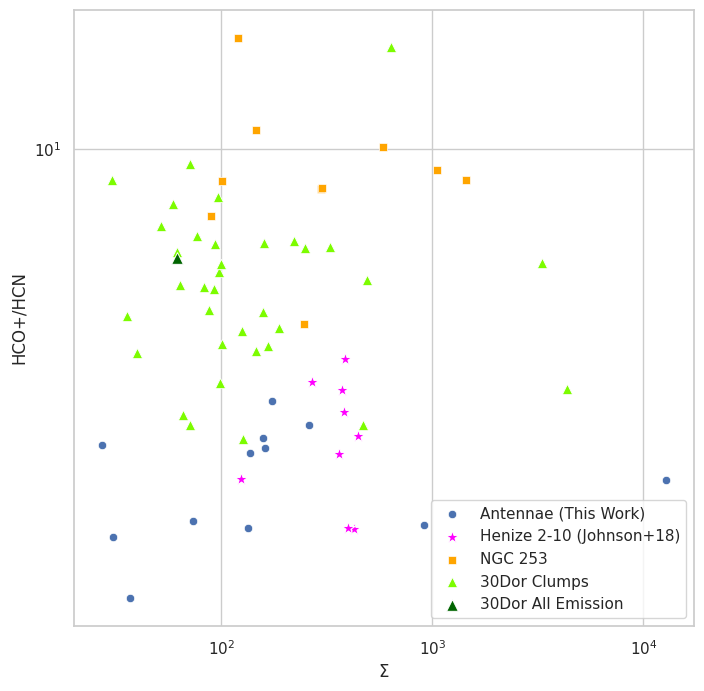

In [664]:
fig, ax = plt.subplots(nrows=1,ncols=1, figsize=(8,8))

sns.scatterplot(data=antdf, y=(hco_lr*antdf['LHCO'])/(hcn_lr*antdf['LHCN']), x=4.4*(co_lr*antdf['LCO'])/ (4 *np.pi*antdf['R']**2), label='Antennae (This Work)')
#sns.scatterplot(x=np.array([1/1.666667,1/1.594340,1/1.922222]),y=np.array([9.2E7,11.7E7,8E7]), color='saddlebrown', edgecolor="black",ax=ax, label='Antennae (Bigiel+15)')
#####sns.scatterplot(data=bdf, x=bdf['HCO+']/bdf['HCN(1–0)'], y=bdf['12CO(1–0)'],  color='saddlebrown', edgecolor="black", label='Antennae (Bigiel+15)')

#sns.scatterplot(data=smoothdf, x=smoothdf['LHCO']/(smoothdf['LHCN']), y=(co_lr*smoothdf['LCO']), label='30 Dor combined')
sns.scatterplot(data=henizedf, y=henizedf.LHCO/(henizedf.LHCN), x=henizedf.Mass/ (4 *np.pi*34.83624752591218**2), label='Henize 2-10 (Johnson+18)', color='magenta', marker=m_henize,s=95)
#sns.scatterplot(data=ngc253leroydf, x=1/ngc253leroydf['CO/HCO+'], y=ngc253leroydf['HCN/HCO+']/ngc253leroydf['CO/HCO+'], label='NGC 253 (Leroy+15)')
########sns.scatterplot(data=ngc253df, x=ngc253df['HCO+(1-0)']/ngc253df['HCN(1-0)'], y=ngc253df['CO(1-0)'], label='NGC 253 (Meier+15)',color='orange',marker=m_253)
sns.scatterplot(data=dfngc253_dense_gas, y = (dfngc253_dense_gas['LHCO'])/(dfngc253_dense_gas[' LHCN']), x= dfngc253_dense_gas['Mass']/(4.4*4 *np.pi*dfngc253_dense_gas['R']**2), label='NGC 253', color='orange',marker=m_253)

sns.scatterplot(data=df30dor_m, y=df30dor_m['LHCO']/df30dor_m['LHCN'], x=4.4*(co_lr*df30dor_m['LCO'])/ (4 *np.pi*df30dor_m['R']**2), label='30Dor Clumps', color='lawngreen', marker='^', s=55)
#sns.scatterplot( x=[53], y=[42], label='30 dor clump sum', s=100,color='limegreen')
sns.scatterplot(data=df30dor_clump_sum, y=df30dor_clump_sum['LHCO']/df30dor_clump_sum['LHCN'], x=4.4*(co_lr*df30dor_m['LCO'])/ (4 *np.pi*df30dor_m['R']**2), label='30Dor Clump Sum',color='limegreen', marker='^', s=70)
sns.scatterplot(data=df30dor, y=df30dor['LHCO']/df30dor['LHCN'], x=4.4*(co_lr*df30dor_m['LCO'])/ (4 *np.pi*df30dor_m['R']**2), label='30Dor All Emission', s=70, color='darkgreen',marker='^')


ax.set_ylabel('HCO+/HCN')
ax.set_xlabel('$\Sigma$ ')#$\mathrm{(K\:km\:s^{-1}\:pc^{-2})}}$')

#ax.invert_xaxis()
ax.set_xscale('log')
ax.set_yscale('log')
#ax.set_xlim(left=10**-.75)

ax.legend(loc='lower right')

plt.show()


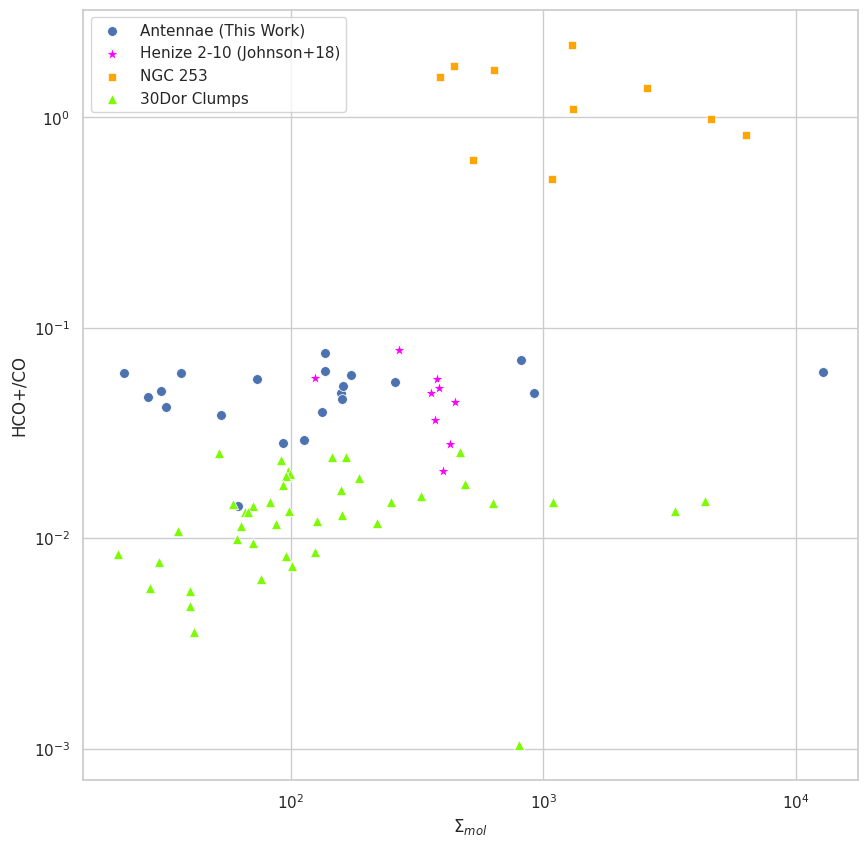

In [665]:
fig, ax=plt.subplots(figsize=(10,10))
sns.scatterplot(data=antdf, y=(hco_lr*antdf['LHCO'])/(co_lr*antdf['LCO']), x=4.4*(co_lr*antdf['LCO'])/ (4 *np.pi*antdf['R']**2), label='Antennae (This Work)',s=50)
#sns.scatterplot(x='sigmol', y='hcn/co', data=almonddisk, color='gray',label='ALMOND (Neumann+24)')#, label='ALMOND disk')
#sns.scatterplot(x='sigmol', y='hcn/co', data=almondcen,color='gray')#, label='ALMOND center')
sns.scatterplot(data=henizedf, y=(henizedf.LHCO)/(co_lr*henizedf.LCO), x=henizedf.Mass/ (4 *np.pi*34.83624752591218**2), label='Henize 2-10 (Johnson+18)', color='magenta', marker=m_henize,s=95) #R is .8" for each point
#sns.scatterplot(data=ngc253df, y=ngc253df['HCN(1-0)']/ngc253df['CO(1-0)'], x=4.4*ngc253df['CO(1-0)'], label='NGC 253 (Meier+15)',color='orange',marker=m_253)
sns.scatterplot(data=dfngc253_dense_gas, y = (dfngc253_dense_gas['LHCO'])/(dfngc253_dense_gas['Mass']/4.4), x= dfngc253_dense_gas['Mass']/(4 *np.pi*dfngc253_dense_gas['R']**2), label='NGC 253', color='orange',marker=m_253)
sns.scatterplot(data=df30dor_m, y=df30dor_m['LHCO']/(co_lr*df30dor_m['LCO']), x=4.4*(co_lr*df30dor_m['LCO'])/ (4 *np.pi*df30dor_m['R']**2), label='30Dor Clumps', color='lawngreen', marker='^', s=55)
plt.xlabel('$\Sigma_{mol}$')
plt.ylabel('HCO+/CO')
plt.xscale('log')
plt.yscale('log')

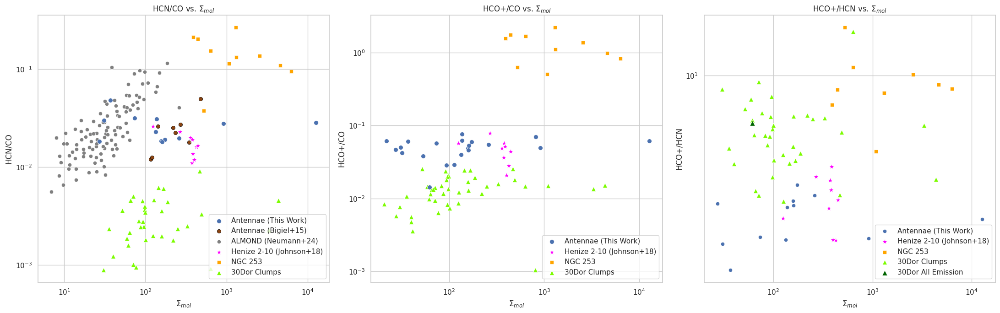

In [666]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

# Create the subplots layout
fig, axs = plt.subplots(nrows=1, ncols=3, figsize=(22, 7))  # 1 row, 3 columns

# Scatter plot 1: HCN/CO vs. molecular surface density
sns.scatterplot(data=antdf, y=(hcn_lr*antdf['LHCN'])/(co_lr*antdf['LCO']),
                x=4.4*(co_lr*antdf['LCO'])/ (4 *np.pi*antdf['R']**2),
                label='Antennae (This Work)', s=50, ax=axs[0],zorder=2)
sns.scatterplot(data=bdf, y=bdf['HCN(1–0)']/bdf['12CO(1–0)'],
                x=4.4*bdf['12CO(1–0)']/(4*np.pi*bdf['R']**2),
                color='saddlebrown', edgecolor="black", label='Antennae (Bigiel+15)', ax=axs[0])
sns.scatterplot(x='sigmol', y='hcn/co', data=almonddisk, color='gray', label='ALMOND (Neumann+24)', ax=axs[0])
sns.scatterplot(x='sigmol', y='hcn/co', data=almondcen, color='gray', ax=axs[0])
sns.scatterplot(data=henizedf, y=(henizedf.LHCN)/(co_lr*henizedf.LCO),
                x=henizedf.Mass/ (4 *np.pi*34.83624752591218**2),
                label='Henize 2-10 (Johnson+18)', color='magenta', marker=m_henize, s=95, ax=axs[0])
sns.scatterplot(data=dfngc253_dense_gas, y=(dfngc253_dense_gas[' LHCN'])/(dfngc253_dense_gas['Mass']/4.4),
                x=dfngc253_dense_gas['Mass']/(4 *np.pi*dfngc253_dense_gas['R']**2),
                label='NGC 253', color='orange', marker=m_253, ax=axs[0])
sns.scatterplot(data=df30dor_m, y=df30dor_m['LHCN']/(co_lr*df30dor_m['LCO']),
                x=4.4*(co_lr*df30dor_m['LCO'])/ (4 *np.pi*df30dor_m['R']**2),
                label='30Dor Clumps', color='lawngreen', marker='^', s=55, ax=axs[0])

axs[0].set_xlabel('$\Sigma_{mol}$')
axs[0].set_ylabel('HCN/CO')
axs[0].set_xscale('log')
axs[0].set_yscale('log')
axs[0].legend(loc='lower right')
axs[0].set_title('HCN/CO vs. $\Sigma_{mol}$')

# Scatter plot 2: HCO+/CO vs. molecular surface density
sns.scatterplot(data=antdf, y=(hco_lr*antdf['LHCO'])/(co_lr*antdf['LCO']),
                x=4.4*(co_lr*antdf['LCO'])/ (4 *np.pi*antdf['R']**2),
                label='Antennae (This Work)', s=50, ax=axs[1],zorder=2)
sns.scatterplot(data=henizedf, y=(henizedf.LHCO)/(co_lr*henizedf.LCO),
                x=henizedf.Mass/ (4 *np.pi*34.83624752591218**2),
                label='Henize 2-10 (Johnson+18)', color='magenta', marker=m_henize, s=95, ax=axs[1])
sns.scatterplot(data=dfngc253_dense_gas, y=(dfngc253_dense_gas['LHCO'])/(dfngc253_dense_gas['Mass']/4.4),
                x=dfngc253_dense_gas['Mass']/(4 *np.pi*dfngc253_dense_gas['R']**2),
                label='NGC 253', color='orange', marker=m_253, ax=axs[1])
sns.scatterplot(data=df30dor_m, y=df30dor_m['LHCO']/(co_lr*df30dor_m['LCO']),
                x=4.4*(co_lr*df30dor_m['LCO'])/ (4 *np.pi*df30dor_m['R']**2),
                label='30Dor Clumps', color='lawngreen', marker='^', s=55, ax=axs[1])

axs[1].set_xlabel('$\Sigma_{mol}$')
axs[1].set_ylabel('HCO+/CO')
axs[1].set_xscale('log')
axs[1].set_yscale('log')
axs[1].legend(loc='lower right')
axs[1].set_title('HCO+/CO vs. $\Sigma_{mol}$')

# Scatter plot 3: HCO+/HCN vs. molecular surface density
sns.scatterplot(data=antdf, y=(hco_lr*antdf['LHCO'])/(hcn_lr*antdf['LHCN']),
                x=4.4*(co_lr*antdf['LCO'])/ (4 *np.pi*antdf['R']**2),
                label='Antennae (This Work)', ax=axs[2],zorder=2)
sns.scatterplot(data=henizedf, y=henizedf.LHCO/(henizedf.LHCN),
                x=henizedf.Mass/ (4 *np.pi*34.83624752591218**2),
                label='Henize 2-10 (Johnson+18)', color='magenta', marker=m_henize, s=95, ax=axs[2])
sns.scatterplot(data=dfngc253_dense_gas, y=(dfngc253_dense_gas['LHCO'])/(dfngc253_dense_gas[' LHCN']),
                x=dfngc253_dense_gas['Mass']/(4 *np.pi*dfngc253_dense_gas['R']**2),
                label='NGC 253', color='orange', marker=m_253, ax=axs[2])
sns.scatterplot(data=df30dor_m, y=df30dor_m['LHCO']/df30dor_m['LHCN'],
                x=4.4*(co_lr*df30dor_m['LCO'])/ (4 *np.pi*df30dor_m['R']**2),
                label='30Dor Clumps', color='lawngreen', marker='^', s=55, ax=axs[2])
sns.scatterplot(data=df30dor_clump_sum, y=df30dor_clump_sum['LHCO']/df30dor_clump_sum['LHCN'],
                x=4.4*(co_lr*df30dor_m['LCO'])/ (4 *np.pi*df30dor_m['R']**2),
                label='30Dor Clump Sum', color='limegreen', marker='^', s=70, ax=axs[2])
sns.scatterplot(data=df30dor, y=df30dor['LHCO']/df30dor['LHCN'],
                x=4.4*(co_lr*df30dor_m['LCO'])/ (4 *np.pi*df30dor_m['R']**2),
                label='30Dor All Emission', color='darkgreen', marker='^', s=70, ax=axs[2])

axs[2].set_xlabel('$\Sigma_{mol}$')
axs[2].set_ylabel('HCO+/HCN')
axs[2].set_xscale('log')
axs[2].set_yscale('log')
axs[2].legend(loc='lower right')
axs[2].set_title('HCO+/HCN vs. $\Sigma_{mol}$')

# Show the plot
plt.tight_layout()
plt.show()


In [667]:
len(antdf['R']),len(antdf['LHCO'])
np.sqrt(34.83624752591218**2-(np.sqrt(70*75)/2)**2)
34.83624752591218**2 ,(np.sqrt(70*75)/2)**2

<ipython-input-667-6fa5a4f4a16a>:2: RuntimeWarning: invalid value encountered in sqrt
  np.sqrt(34.83624752591218**2-(np.sqrt(70*75)/2)**2)


(1213.5641416866224, 1312.5000000000002)

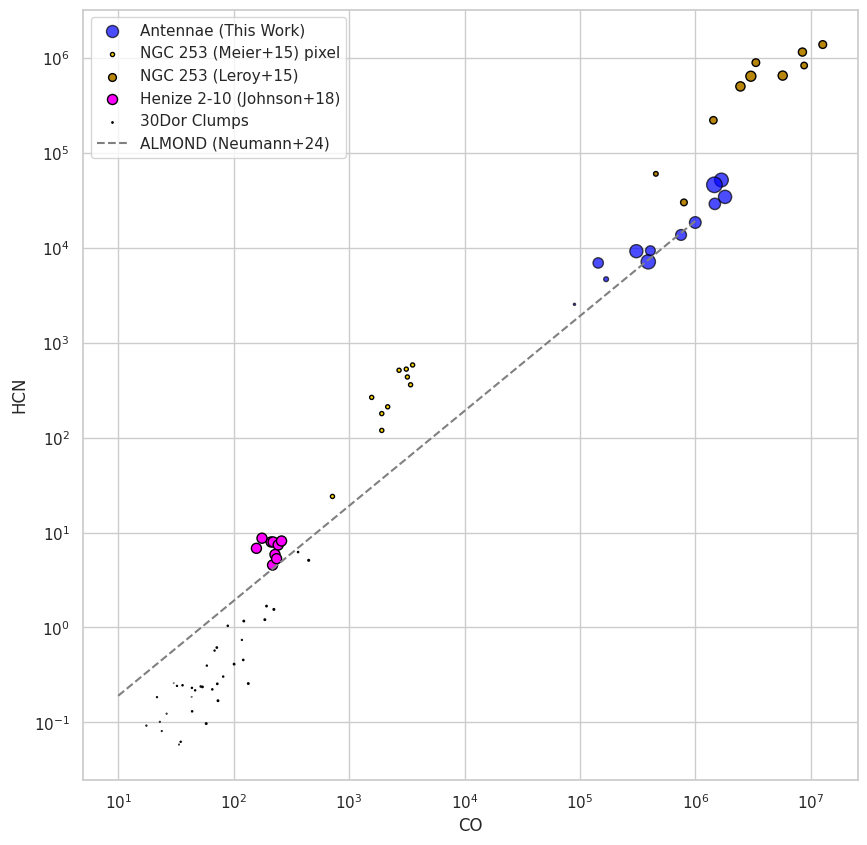

In [668]:
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np

# Define a scaling constant for marker size
k = 1.5  # You can adjust this constant to scale the sizes

fig, ax = plt.subplots(figsize=(10, 10))

# Scatter plots for data with individual HCN and CO values, numerator on y-axis, denominator on x-axis
plt.scatter(x=(co_lr * antdf['LCO']),
                y=(hcn_lr * antdf['LHCN']),
                label='Antennae (This Work)',
                color='blue',
                edgecolor="black",s=k*antdf['R'],alpha=.7)#
#                s=np.array(antdf['R']))  # Marker size based on radius
plt.scatter(x=ngc253df['CO(1-0)'],
                y=ngc253df['HCN(1-0)'],
                label='NGC 253 (Meier+15) pixel',
                color='gold',
                edgecolor="black",
                s=np.sqrt((10.*np.ones_like(ngc253df['CO(1-0)']))**2 - (10./2)**2))  # Marker size based on radius #50 pc res

plt.scatter(x=dfngc253_dense_gas['Mass']/4.4,
                y=dfngc253_dense_gas[' LHCN'],
                label='NGC 253 (Leroy+15)',
                color='darkgoldenrod',
                edgecolor="black",
                s=dfngc253_dense_gas['R'])

plt.scatter(x=henizedf['LCO'] * co_lr,
                y=henizedf['LHCN'] * hcn_lr,
                label='Henize 2-10 (Johnson+18)',
                color='magenta',
                edgecolor="black",
#                size=(k*np.sqrt(34.83624752591218**2-(40/2)**2))*np.ones_like(henizedf['LCO']))  # Marker size based on radius
                s = k*34.83624752591218*np.ones_like(henizedf['LCO']))
plt.scatter(x=df30dor_m['LCO'] * co_lr,
                y=df30dor_m['LHCN'] * hcn_lr,
                label='30Dor Clumps',
                color='lawngreen',
                edgecolor="black",
                s=k*df30dor_m['R'])  # Marker size based on radius

# Line plot for ALMOND dataset (which only has the ratio, so it's plotted as a line)
x_vals = np.arange(10, 10**6, 1)
ratio = almondcen['hcn/co'].iloc[0]  # Assume the ratio is constant for the ALMOND dataset
y_vals = x_vals * ratio  # Multiply each x-value by the ratio

# Plot the ALMOND data as a line
ax.plot(x_vals, y_vals, color='gray', label='ALMOND (Neumann+24)', linestyle='--')

# Add labels and set scales
plt.xlabel('CO')
plt.ylabel('HCN')
plt.xscale('log')
plt.yscale('log')

# Add the legend
plt.legend()

# Show the plot
plt.show()


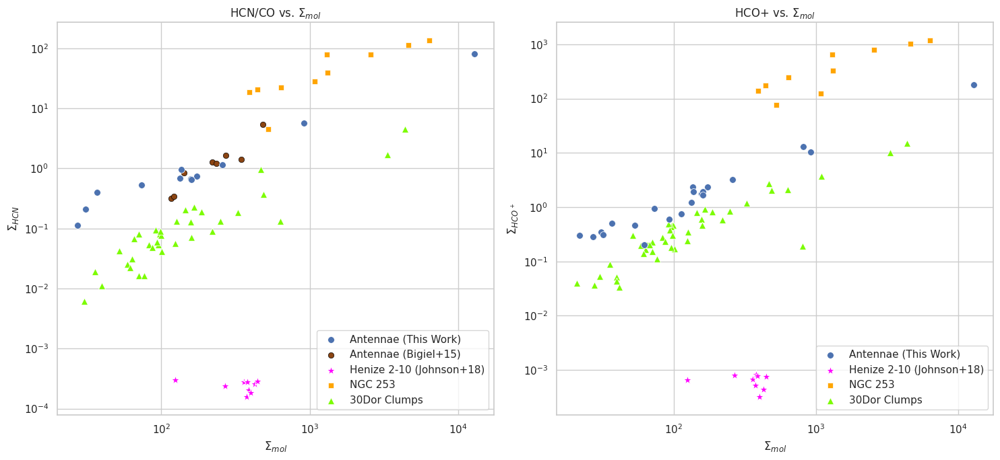

In [669]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

# Create the subplots layout
fig, axs = plt.subplots(nrows=1, ncols=2, figsize=(15, 7))  # 1 row, 2 columns

# Scatter plot 1: HCN/CO vs. molecular surface density
sns.scatterplot(data=antdf, y=(hcn_lr*antdf['LHCN'])/ (4 *np.pi*antdf['R']**2),
                x=4.4*(co_lr*antdf['LCO'])/ (4 *np.pi*antdf['R']**2),
                label='Antennae (This Work)', s=50, ax=axs[0],zorder=2)
sns.scatterplot(data=bdf, y=bdf['HCN(1–0)']/(4*np.pi*bdf['R']**2),
                x=4.4*bdf['12CO(1–0)']/(4*np.pi*bdf['R']**2),
                color='saddlebrown', edgecolor="black", label='Antennae (Bigiel+15)', ax=axs[0])
#sns.scatterplot(x='sigmol', y='hcn/co', data=almonddisk, color='gray', label='ALMOND (Neumann+24)', ax=axs[0])
#sns.scatterplot(x='sigmol', y='hcn/co', data=almondcen, color='gray', ax=axs[0])
sns.scatterplot(data=henizedf, y=(henizedf.LHCN)/(4 *np.pi*34.83624752591218**2),
                x=henizedf.Mass/ (4 *np.pi*34.83624752591218**2),
                label='Henize 2-10 (Johnson+18)', color='magenta', marker=m_henize, s=95, ax=axs[0])
sns.scatterplot(data=dfngc253_dense_gas, y=(dfngc253_dense_gas[' LHCN'])/(4 *np.pi*dfngc253_dense_gas['R']**2),
                x=dfngc253_dense_gas['Mass']/(4 *np.pi*dfngc253_dense_gas['R']**2),
                label='NGC 253', color='orange', marker=m_253, ax=axs[0])
sns.scatterplot(data=df30dor_m, y=df30dor_m['LHCN']/(4 *np.pi*df30dor_m['R']**2),
                x=4.4*(co_lr*df30dor_m['LCO'])/ (4 *np.pi*df30dor_m['R']**2),
                label='30Dor Clumps', color='lawngreen', marker='^', s=55, ax=axs[0])

axs[0].set_xlabel('$\Sigma_{mol}$')
axs[0].set_ylabel('$\Sigma_{HCN}$')
axs[0].set_xscale('log')
axs[0].set_yscale('log')
axs[0].legend(loc='lower right')
axs[0].set_title('HCN/CO vs. $\Sigma_{mol}$')

# Scatter plot 2: HCO+ vs CO luminosity densities
sns.scatterplot(data=antdf, y=(hco_lr*antdf['LHCO'])/(4 *np.pi*antdf['R']**2),
                x=4.4*(co_lr*antdf['LCO'])/ (4 *np.pi*antdf['R']**2),
                label='Antennae (This Work)', s=50, ax=axs[1],zorder=2)
sns.scatterplot(data=henizedf, y=(henizedf.LHCO)/(4 *np.pi*34.83624752591218**2),
                x=henizedf.Mass/ (4 *np.pi*34.83624752591218**2),
                label='Henize 2-10 (Johnson+18)', color='magenta', marker=m_henize, s=95, ax=axs[1])
sns.scatterplot(data=dfngc253_dense_gas, y=(dfngc253_dense_gas['LHCO'])/(4 *np.pi*dfngc253_dense_gas['R']**2),
                x=dfngc253_dense_gas['Mass']/(4 *np.pi*dfngc253_dense_gas['R']**2),
                label='NGC 253', color='orange', marker=m_253, ax=axs[1])
sns.scatterplot(data=df30dor_m, y=df30dor_m['LHCO']/(4 *np.pi*df30dor_m['R']**2),
                x=4.4*(co_lr*df30dor_m['LCO'])/ (4 *np.pi*df30dor_m['R']**2),
                label='30Dor Clumps', color='lawngreen', marker='^', s=55, ax=axs[1])

axs[1].set_xlabel('$\Sigma_{mol}$')
axs[1].set_ylabel('$\Sigma_{HCO^+}$')
axs[1].set_xscale('log')
axs[1].set_yscale('log')
axs[1].legend(loc='lower right')
axs[1].set_title('HCO+ vs. $\Sigma_{mol}$')

# Show the plot
plt.tight_layout()
plt.show()


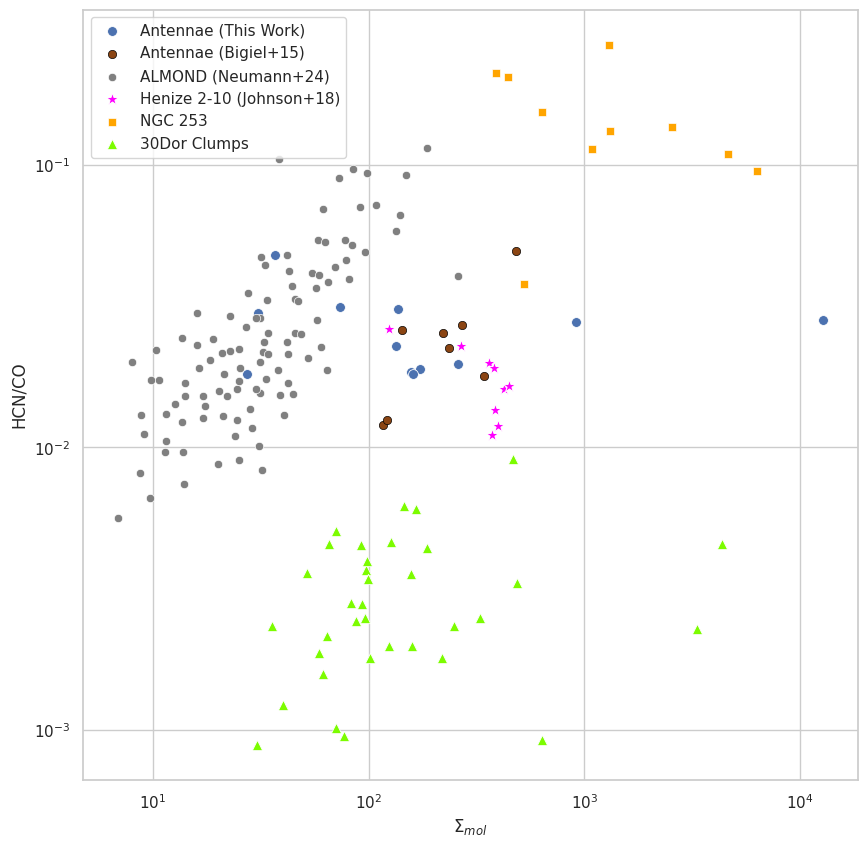

In [670]:
fig, ax=plt.subplots(figsize=(10,10))
sns.scatterplot(data=antdf, y=(hcn_lr*antdf['LHCN'])/(co_lr*antdf['LCO']), x=4.4*(co_lr*antdf['LCO'])/ (4 *np.pi*antdf['R']**2), label='Antennae (This Work)',s=50)
sns.scatterplot(data=bdf, y=bdf['HCN(1–0)']/bdf['12CO(1–0)'], x=4.4*bdf['12CO(1–0)']/(4*np.pi*bdf['R']**2),  color='saddlebrown', edgecolor="black", label='Antennae (Bigiel+15)')
sns.scatterplot(x='sigmol', y='hcn/co', data=almonddisk, color='gray',label='ALMOND (Neumann+24)')#, label='ALMOND disk',)
sns.scatterplot(x='sigmol', y='hcn/co', data=almondcen,color='gray')#, label='ALMOND center')
sns.scatterplot(data=henizedf, y=(henizedf.LHCN)/(co_lr*henizedf.LCO), x=henizedf.Mass/ (4 *np.pi*34.83624752591218**2), label='Henize 2-10 (Johnson+18)', color='magenta', marker=m_henize,s=95) #R is .8" for each point
#sns.scatterplot(data=ngc253df, y=ngc253df['HCN(1-0)']/ngc253df['CO(1-0)'], x=4.4*ngc253df['CO(1-0)'], label='NGC 253 (Meier+15)',color='orange',marker=m_253)
sns.scatterplot(data=dfngc253_dense_gas, y = (dfngc253_dense_gas[' LHCN'])/(dfngc253_dense_gas['Mass']/4.4), x= dfngc253_dense_gas['Mass']/(4 *np.pi*dfngc253_dense_gas['R']**2), label='NGC 253', color='orange',marker=m_253)
sns.scatterplot(data=df30dor_m, y=df30dor_m['LHCN']/(co_lr*df30dor_m['LCO']), x=4.4*(co_lr*df30dor_m['LCO'])/ (4 *np.pi*df30dor_m['R']**2), label='30Dor Clumps', color='lawngreen', marker='^', s=55)
plt.xlabel('$\Sigma_{mol}$')
plt.ylabel('HCN/CO')
plt.xscale('log')
plt.yscale('log')

0.04932 98.54
0.04932 98.54


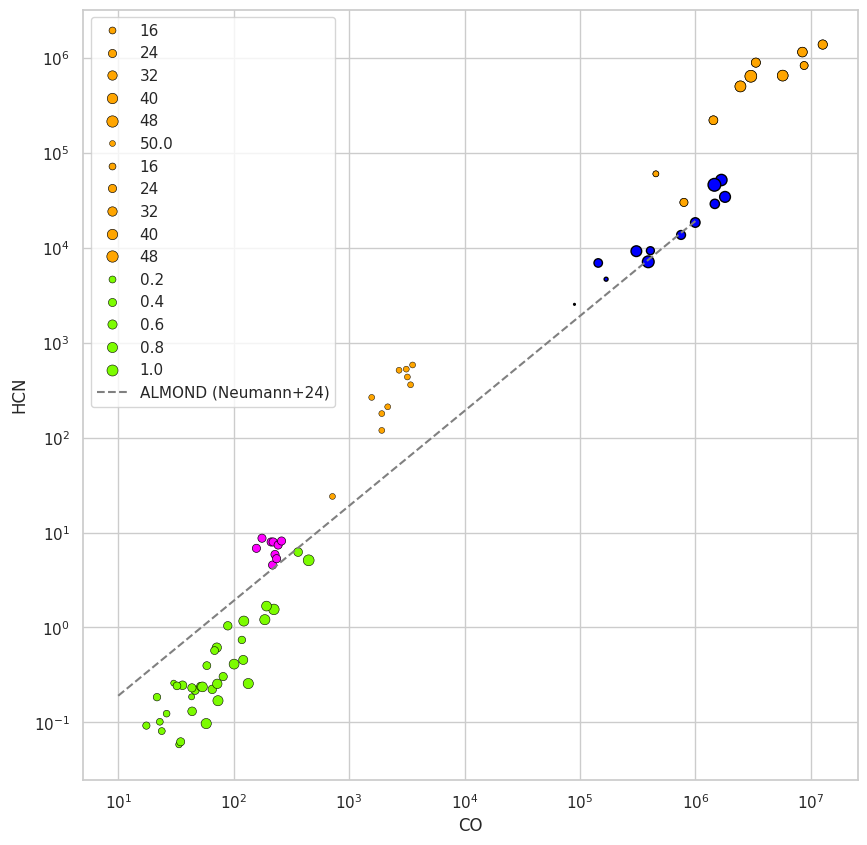

array([6.04600000e+01, 6.55500000e+01, 4.46100000e+01, 8.34600000e+01,
       4.70700000e+01, 2.84600000e+01, 3.69600000e+01, 4.52300000e+01,
       3.66100000e+01, 7.08300000e+01, 1.21700000e+01, 8.50900000e+01,
       5.35900000e+01, 5.82000000e+01, 5.91700000e+01, 9.85400000e+01,
       4.05300000e+01, 1.86000000e+01, 5.90800000e+01, 3.84100000e+01,
       1.75200000e+01, 1.64400000e+01,            nan, 4.70300000e+01,
       2.88700000e+01, 4.12400000e+01, 3.32000000e+01, 2.07900000e+01,
       2.52000000e+01, 3.27100000e+01, 8.71200000e+00, 1.06100000e+01,
       3.30300000e+01, 3.60100000e+00, 1.76400000e+01, 3.37800000e+01,
       1.56800000e+00, 8.02200000e+00,            nan,            nan,
       4.54400000e+00, 3.94800000e+01, 2.91300000e+01, 3.42700000e+01,
                  nan,            nan,            nan,            nan,
                  nan,            nan,            nan, 1.25000000e+01,
       4.30000000e+01, 5.20000000e+01, 3.40000000e+01, 3.10000000e+01,
      

In [671]:
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np

# Define a scaling constant for marker size
k = 15  # You can adjust this constant to scale the sizes

# Combine all datasets to find the global min and max radii
 #(dfngc253_dense_gas['LHCO'])/(dfngc253_dense_gas[' LHCN']), x= dfngc253_dense_gas['Mass']/(4 *np.pi*dfngc253_dense_gas['R']**2)
all_radii = np.concatenate([antdf['R'].values,
                            dfngc253_dense_gas['R'].values,
                            50.*np.ones_like(ngc253df['CO(1-0)']),
                            34.83624752591218*np.ones_like(henizedf['LCO']),
                            df30dor_m['R'].values])

# Normalize the radii to a common scale (0 to 1)
min_radius = np.nanmin(all_radii)
max_radius = np.nanmax(all_radii)
print(min_radius, max_radius)
# Apply normalization for each dataset
'''def normalize_size(radii, min_radius, max_radius):
    return k * (radii - min_radius) / (max_radius - min_radius)  # Scale to [0, 1] and then apply k

# Prepare the figure
fig, ax = plt.subplots(figsize=(10, 10))

# Scatter plots for data with individual HCN and CO values, numerator on y-axis, denominator on x-axis
sns.scatterplot(data=antdf,
                x=(co_lr * antdf['LCO']),
                y=(hcn_lr * antdf['LHCN']),
                color='blue',
                edgecolor="black",
                size=normalize_size(antdf['R'].values, min_radius, max_radius))

sns.scatterplot(data=dfngc253_dense_gas,
                x=dfngc253_dense_gas['Mass']/4.4,
                y=dfngc253_dense_gas[' LHCN'],
                color='orange',
                edgecolor="black",
                size=normalize_size(dfngc253_dense_gas['R'].values, min_radius, max_radius))
sns.scatterplot(data=ngc253df,
                x=ngc253df['CO(1-0)'],
                y=ngc253df['HCN(1-0)'],
           #     label='NGC 253 (Meier+15)',
                color='orange',
                edgecolor="black",
                size=normalize_size(50.*np.ones_like(ngc253df['CO(1-0)']), min_radius, max_radius))  # Marker size based on radius

sns.scatterplot(data=dfngc253_dense_gas,
                x=dfngc253_dense_gas['Mass']/4.4,
                y=dfngc253_dense_gas[' LHCN'],
                color='orange',
                edgecolor="black",
                size=normalize_size(dfngc253_dense_gas['R'].values, min_radius, max_radius))

sns.scatterplot(data=henizedf,
                x=henizedf['LCO'] * co_lr,
                y=henizedf['LHCN'] * hcn_lr,
                color='magenta',
                edgecolor="black",
                size=normalize_size(34.83624752591218*np.ones_like(henizedf['LCO']), min_radius, max_radius))

sns.scatterplot(data=df30dor_m,
                x=df30dor_m['LCO'] * co_lr,
                y=df30dor_m['LHCN'] * hcn_lr,
                color='lawngreen',
                edgecolor="black",
                size=normalize_size(df30dor_m['R'].values, min_radius, max_radius))

# Line plot for ALMOND dataset (which only has the ratio, so it's plotted as a line)
x_vals = np.arange(10, 10**6, 1)
ratio = almondcen['hcn/co'].iloc[0]  # Assume the ratio is constant for the ALMOND dataset
y_vals = x_vals * ratio  # Multiply each x-value by the ratio

# Plot the ALMOND data as a line
ax.plot(x_vals, y_vals, color='gray', label='ALMOND (Neumann+24)', linestyle='--')

# Add labels and set scales
plt.xlabel('CO')
plt.ylabel('HCN')
plt.xscale('log')
plt.yscale('log')

# Add the legend
plt.legend()

# Show the plot
plt.show()'''

import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np

# Define a scaling constant for marker size
k = 5  # You can adjust this constant to scale the sizes

# Combine all datasets to find the global min and max radii
 #(dfngc253_dense_gas['LHCO'])/(dfngc253_dense_gas[' LHCN']), x= dfngc253_dense_gas['Mass']/(4 *np.pi*dfngc253_dense_gas['R']**2)
all_radii = np.concatenate([antdf['R'].values,
                            dfngc253_dense_gas['R'].values,
                            50.*np.ones_like(ngc253df['CO(1-0)']),
                            34.83624752591218*np.ones_like(henizedf['LCO']),
                            df30dor_m['R'].values])

# Normalize the radii to a common scale (0 to 1)
min_radius = np.nanmin(all_radii)
max_radius = np.nanmax(all_radii)
print(min_radius, max_radius)
# Apply normalization for each dataset
def normalize_size(radii, min_radius, max_radius):
    return k * (radii - min_radius) / (max_radius - min_radius)  # Scale to [0, 1] and then apply k

# Prepare the figure
fig, ax = plt.subplots(figsize=(10, 10))

# Scatter plots for data with individual HCN and CO values, numerator on y-axis, denominator on x-axis
plt.scatter(x=(co_lr * antdf['LCO']),
                y=(hcn_lr * antdf['LHCN']),
                color='blue',
                edgecolor="black",
                s=antdf['R'])

sns.scatterplot(data=dfngc253_dense_gas,
                x=dfngc253_dense_gas['Mass']/4.4,
                y=dfngc253_dense_gas[' LHCN'],
                color='orange',
                edgecolor="black",
                size=dfngc253_dense_gas['R'])
sns.scatterplot(data=ngc253df,
                x=ngc253df['CO(1-0)'],
                y=ngc253df['HCN(1-0)'],
           #     label='NGC 253 (Meier+15)',
                color='orange',
                edgecolor="black",
                size=50.*np.ones_like(ngc253df['CO(1-0)'])) # Marker size based on radius

sns.scatterplot(data=dfngc253_dense_gas,
                x=dfngc253_dense_gas['Mass']/4.4,
                y=dfngc253_dense_gas[' LHCN'],
                color='orange',
                edgecolor="black",
                size=dfngc253_dense_gas['R'])

sns.scatterplot(data=henizedf,
                x=henizedf['LCO'] * co_lr,
                y=henizedf['LHCN'] * hcn_lr,
                color='magenta',
                edgecolor="black",
                s=34.83624752591218*np.ones_like(henizedf['LCO']))

sns.scatterplot(data=df30dor_m,
                x=df30dor_m['LCO'] * co_lr,
                y=df30dor_m['LHCN'] * hcn_lr,
                color='lawngreen',
                edgecolor="black",
                size=df30dor_m['R'])

# Line plot for ALMOND dataset (which only has the ratio, so it's plotted as a line)
x_vals = np.arange(10, 10**6, 1)
ratio = almondcen['hcn/co'].iloc[0]  # Assume the ratio is constant for the ALMOND dataset
y_vals = x_vals * ratio  # Multiply each x-value by the ratio

# Plot the ALMOND data as a line
ax.plot(x_vals, y_vals, color='gray', label='ALMOND (Neumann+24)', linestyle='--')

# Add labels and set scales
plt.xlabel('CO')
plt.ylabel('HCN')
plt.xscale('log')
plt.yscale('log')

# Add the legend
plt.legend()

# Show the plot
plt.show()

all_radii


<ipython-input-672-646c43346626>:5: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend()


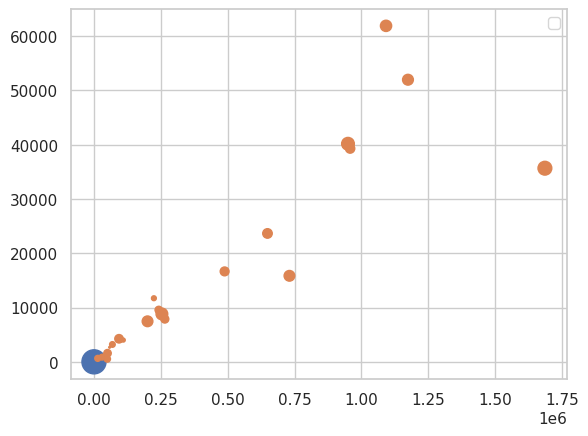

In [672]:
plt.scatter(x=[1,2,3],y=[1,2,3],s=100*np.array([1,2,3]))
plt.scatter(x=antdf['LCO'],y=antdf['LHCO'],s=antdf['R'].values)
#
np.nan_to_num(antdf['R'].values)
plt.legend()

# making machine readable tables

In [673]:
antdf

,ncl,cltype,LCO,LCOerr,LHCO,LHCOerr,LHCN,LHCNerr,vel_dispCO,vel_dispCOerr,...,LHCN43,LHCN43err,vel_dispHCN43,vel_dispHCN43err,L13CO,L13COerr,vel_disp13CO,vel_disp13COerr,tex,tau
0,1,2,1174000.0,117900.0,51940.0,5704.0,18110.0,2943.0,22.130,0.27090,...,16.26,168.7,0.1511,89.76000,149100.0,15090.0,20.930,0.22410,19.760,0.1336
1,2,2,1092000.0,109700.0,61860.0,6591.0,27280.0,3579.0,17.820,0.22670,...,NaN,NaN,NaN,NaN,194200.0,19550.0,16.800,0.18230,19.630,0.1930
2,3,2,957700.0,96180.0,39270.0,4420.0,15290.0,2542.0,19.610,0.25980,...,NaN,NaN,NaN,NaN,156000.0,15730.0,18.920,0.19110,20.940,0.1795
3,4,2,949700.0,95530.0,40150.0,4618.0,24280.0,3340.0,24.700,0.41570,...,NaN,NaN,NaN,NaN,187700.0,18910.0,23.250,0.29570,16.770,0.2294
4,5,2,648700.0,65320.0,23640.0,2938.0,9728.0,1992.0,15.850,0.21970,...,NaN,NaN,NaN,NaN,104700.0,10610.0,15.410,0.20160,19.520,0.1735
5,6,2,242200.0,24790.0,9549.0,1537.0,NaN,NaN,15.380,0.21920,...,NaN,NaN,NaN,NaN,35530.0,3749.0,14.730,0.19360,16.200,0.1609
6,7,2,93550.0,10530.0,4248.0,1045.0,3648.0,1059.0,10.190,0.15130,...,NaN,NaN,NaN,NaN,28130.0,3015.0,9.867,0.12630,9.911,0.3615
7,8,2,324700.0,33330.0,NaN,NaN,NaN,NaN,16.820,0.23830,...,NaN,NaN,NaN,NaN,48660.0,5149.0,16.750,0.23030,12.400,0.1611
8,9,2,135900.0,14530.0,NaN,NaN,NaN,NaN,9.332,0.13020,...,NaN,NaN,NaN,NaN,26190.0,2863.0,9.210,0.12120,11.480,0.2167
9,10,2,253900.0,26160.0,8816.0,1505.0,3752.0,1264.0,11.720,0.17100,...,NaN,NaN,NaN,NaN,73590.0,7495.0,11.120,0.13340,13.210,0.3447


In [674]:


from decimal import Decimal
cleandf=antdf.copy()
cleandf.drop(columns=['LHCO43', 'LHCO43err', 'vel_dispHCO43', 'vel_dispHCO43err','LHCN43', 'LHCN43err', 'vel_dispHCN43', 'vel_dispHCN43err','area','perim','tex','tau'],inplace=True)
cleandf.columns



Index(['ncl', 'cltype', 'LCO', 'LCOerr', 'LHCO', 'LHCOerr', 'LHCN', 'LHCNerr',
       'vel_dispCO', 'vel_dispCOerr', 'vel_dispHCO', 'vel_dispHCOerr',
       'vel_dispHCN', 'vel_dispHCNerr', 'maj', 'min', 'R', 'Rerr', 'L13CO',
       'L13COerr', 'vel_disp13CO', 'vel_disp13COerr'],
      dtype='object')

In [675]:
cleandf=cleandf.applymap(lambda x: '%.3E' % Decimal(x))
cleandf[['ncl','cltype']]=antdf[['ncl','cltype']]
cleandf.replace('NAN', '...', inplace=True)
'''cleandf.to_csv('antennae_table.csv')
from google.colab import files
files.download("antennae_table.csv")'''
cleandf


<ipython-input-675-e51381b4a7fd>:1: FutureWarning: DataFrame.applymap has been deprecated. Use DataFrame.map instead.
  cleandf=cleandf.applymap(lambda x: '%.3E' % Decimal(x))


,ncl,cltype,LCO,LCOerr,LHCO,LHCOerr,LHCN,LHCNerr,vel_dispCO,vel_dispCOerr,...,vel_dispHCN,vel_dispHCNerr,maj,min,R,Rerr,L13CO,L13COerr,vel_disp13CO,vel_disp13COerr
0,1,2,1.174E+06,1.179E+05,5.194E+04,5.704E+03,1.811E+04,2.943E+03,2.213E+01,2.709E-01,...,2.233E+01,5.356E-01,3.219E+01,5.330E+01,6.046E+01,2.045E+01,1.491E+05,1.509E+04,2.093E+01,2.241E-01
1,2,2,1.092E+06,1.097E+05,6.186E+04,6.591E+03,2.728E+04,3.579E+03,1.782E+01,2.267E-01,...,1.818E+01,3.590E-01,3.583E+01,5.466E+01,6.555E+01,1.036E+01,1.942E+05,1.955E+04,1.680E+01,1.823E-01
2,3,2,9.577E+05,9.618E+04,3.927E+04,4.420E+03,1.529E+04,2.542E+03,1.961E+01,2.598E-01,...,1.640E+01,3.255E-01,4.315E+01,2.516E+01,4.461E+01,8.739E+00,1.560E+05,1.573E+04,1.892E+01,1.911E-01
3,4,2,9.497E+05,9.553E+04,4.015E+04,4.618E+03,2.428E+04,3.340E+03,2.470E+01,4.157E-01,...,-5.631E-01,8.346E-02,4.646E+01,6.389E+01,8.346E+01,1.005E+01,1.877E+05,1.891E+04,2.325E+01,2.957E-01
4,5,2,6.487E+05,6.532E+04,2.364E+04,2.938E+03,9.728E+03,1.992E+03,1.585E+01,2.197E-01,...,1.304E+01,3.031E-01,4.553E+01,2.571E+01,4.707E+01,2.096E+01,1.047E+05,1.061E+04,1.541E+01,2.016E-01
5,6,2,2.422E+05,2.479E+04,9.549E+03,1.537E+03,...,...,1.538E+01,2.192E-01,...,...,...,3.105E+01,2.057E+01,2.846E+01,9.153E+00,3.553E+04,3.749E+03,1.473E+01,1.936E-01
6,7,2,9.355E+04,1.053E+04,4.248E+03,1.045E+03,3.648E+03,1.059E+03,1.019E+01,1.513E-01,...,9.100E+00,3.562E-01,2.284E+01,3.718E+01,3.696E+01,1.341E+01,2.813E+04,3.015E+03,9.867E+00,1.263E-01
7,8,2,3.247E+05,3.333E+04,...,...,...,...,1.682E+01,2.383E-01,...,...,...,3.927E+01,2.818E+01,4.523E+01,1.243E+01,4.866E+04,5.149E+03,1.675E+01,2.303E-01
8,9,2,1.359E+05,1.453E+04,...,...,...,...,9.332E+00,1.302E-01,...,...,...,4.493E+01,1.868E+01,3.661E+01,2.166E+01,2.619E+04,2.863E+03,9.210E+00,1.212E-01
9,10,2,2.539E+05,2.616E+04,8.816E+03,1.505E+03,3.752E+03,1.264E+03,1.172E+01,1.710E-01,...,5.091E-01,7.075E-02,5.963E+01,3.741E+01,7.083E+01,1.580E+01,7.359E+04,7.495E+03,1.112E+01,1.334E-01


In [676]:
#'%s' % float('%.1g' % 1234)
#'%s' % float('%.1g' % antdf['LCO'][0])
#antdf['LCO'].apply(lambda x: '%s' % float('%.4g' % x))

In [677]:
draftdf[['ncl', 'LCO', 'LCOerr', 'L13CO',
       'L13COerr','LHCO', 'LHCOerr', 'LHCN', 'LHCNerr',
       'vel_dispCO', 'vel_dispCOerr', 'vel_disp13CO', 'vel_disp13COerr','vel_dispHCO', 'vel_dispHCOerr',
       'vel_dispHCN', 'vel_dispHCNerr', 'maj', 'min', 'R', 'Rerr']] = antdf[['ncl', 'LCO', 'LCOerr', 'L13CO',
       'L13COerr','LHCO', 'LHCOerr', 'LHCN', 'LHCNerr',
       'vel_dispCO', 'vel_dispCOerr', 'vel_disp13CO', 'vel_disp13COerr','vel_dispHCO', 'vel_dispHCOerr',
       'vel_dispHCN', 'vel_dispHCNerr', 'maj', 'min', 'R', 'Rerr']]
def func(x):
  try:
    return '%s' % float('%.2g' % x)
  except:
    return x
draftdf.applymap(lambda x:func(x))
#draftdf

NameError: name 'draftdf' is not defined

In [ ]:
new = pd.DataFrame()
new['ncl']=cleandf['ncl']
new['LCO']=(((draftdf['LCO']/10**4)).apply(lambda x:'%s' % float('%.3g' % x))).astype(str) + '\pm' + ((draftdf['LCOerr']/10**4).apply(lambda x:'%s' % float('%.1g' % x))).astype(str)
new['L13CO']=(((draftdf['L13CO']/10**4)).apply(lambda x:'%s' % float('%.3g' % x))).astype(str) + '\pm' + ((draftdf['L13COerr']/10**4).apply(lambda x:'%s' % float('%.1g' % x))).astype(str)
new['LHCO']=(((draftdf['LHCO']/10**3)).apply(lambda x:'%s' % float('%.3g' % x))).astype(str) + '\pm' + ((draftdf['LHCOerr']/10**3).apply(lambda x:'%s' % float('%.1g' % x))).astype(str)
new['LHCN']=(((draftdf['LHCN']/10**3)).apply(lambda x:'%s' % float('%.3g' % x))).astype(str) + '\pm' + ((draftdf['LHCNerr']/10**3).apply(lambda x:'%s' % float('%.1g' % x))).astype(str)
new['vel_dispCO']=(((draftdf['vel_dispCO'])).apply(lambda x:'%s' % float('%.3g' % x))).astype(str) + '\pm' + ((draftdf['vel_dispCOerr']).apply(lambda x:'%s' % float('%.1g' % x))).astype(str)
new['vel_disp13CO']=(((draftdf['vel_disp13CO'])).apply(lambda x:'%s' % float('%.3g' % x))).astype(str) + '\pm' + ((draftdf['vel_disp13COerr']).apply(lambda x:'%s' % float('%.1g' % x))).astype(str)
new['vel_dispHCO']=(((draftdf['vel_dispHCO'])).apply(lambda x:'%s' % float('%.3g' % x))).astype(str) + '\pm' + ((draftdf['vel_dispHCOerr']).apply(lambda x:'%s' % float('%.1g' % x))).astype(str)
new['vel_dispHCN']=(((draftdf['vel_dispHCN'])).apply(lambda x:'%s' % float('%.2g' % x))).astype(str) + '\pm' + ((draftdf['vel_dispHCNerr']).apply(lambda x:'%s' % float('%.1g' % x))).astype(str)
new[['maj', 'min']] = antdf[['maj', 'min']]
new['R']=(((draftdf['R'])).apply(lambda x:'%s' % float('%.2g' % x))).astype(str) + '\pm' + ((draftdf['Rerr']).apply(lambda x:'%s' % float('%.1g' % x))).astype(str)

new.replace('nan\pmnan', '...', inplace=True)
new.replace('-0.56\pm0.08', '...', inplace=True)
#df['Column1'].astype(str) + df['Column2']
'''new.to_csv('antennae_table_paper.csv')
from google.colab import files
files.download("antennae_table_paper.csv")'''
new